<a href="https://colab.research.google.com/github/acbergmann/Papers/blob/main/CEMENT_Paper_Impact_of_metakaolin_on_the_alkali_concentration_in_pore_solution.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib.colors import LinearSegmentedColormap, BoundaryNorm
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import LinearSegmentedColormap, BoundaryNorm
from scipy.interpolate import griddata
import math
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import griddata
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

GEMS - FIGURE 1

In [ ]:
# Set the default font size for all text elements
plt.rcParams.update({'font.size': 12})

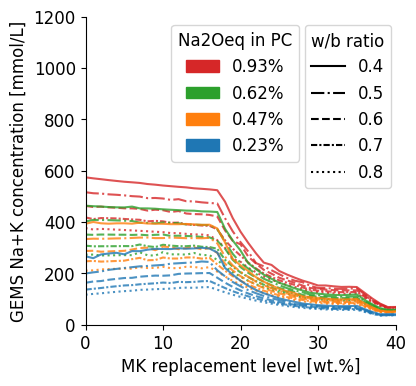

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import matplotlib.patches as mpatches

# Load the spreadsheet
file_path = '/content/2024-06-05 Ana_wb for different alkali_MK.xlsx'
df = pd.read_excel(file_path, sheet_name='Summary', header=None)

# Extract the required values
alkali_levels = df.iloc[1, 1:29].values
wb_ratios = df.iloc[2, 1:29].values
MK_replacement = df.iloc[4:105, 0].values
concentration_levels = df.iloc[4:105, 1:29].values

# Display the extracted values for verification
# alkali_levels, wb_ratios, MK_replacement, concentration_levels

# Prepare the data for a combined database
data = []

# Iterate over the concentration levels matrix and match with the respective alkali levels, w/b ratios, and MK replacements
for i in range(len(MK_replacement)):
    for j in range(len(alkali_levels)):
        data.append([
            alkali_levels[j],          # Alkali level
            wb_ratios[j],              # w/b ratio
            MK_replacement[i],         # MK replacement level
            concentration_levels[i, j] # Concentration level
        ])

# Convert to a DataFrame for better visualization
df_combined = pd.DataFrame(data, columns=['Alkali Level', 'w/b Ratio', 'MK Replacement Level', 'Concentration Level'])
# display(df_combined)

# Filter the data to include only the specified w/b ratios
filtered_df = df_combined[df_combined['w/b Ratio'].isin([0.4, 0.5, 0.6, 0.7, 0.8])]

# Check unique w/b Ratio values
unique_wb_ratios = filtered_df['w/b Ratio'].unique()

# Define line styles for all unique w/b ratios in a sequence that the line becomes more solid as the value increases
line_styles = {
    0.4: 'solid',            # Solid
    0.5: 'dashdot',          # Dashed
    0.6: 'dashed',
    0.7: (0, (3, 1, 1, 1)),
    0.8: 'dotted'            # Less dashed
}

# Define specific colors for each alkali level
color_dict = {
    0.23: '#1f77b4',  # Blue
    0.47: '#ff7f0e',  # Orange
    0.62: '#2ca02c',  # Green
    0.93: '#d62728'   # Red
}

# Create a line plot with hue based on Alkali Level and different line styles based on filtered w/b Ratios
plt.figure(figsize=(4,4))

# Iterate through each unique combination of w/b ratios and alkali levels
for alkali_level in filtered_df['Alkali Level'].unique():
    subset = filtered_df[filtered_df['Alkali Level'] == alkali_level]
    for wb_ratio in subset['w/b Ratio'].unique():
        sub_subset = subset[subset['w/b Ratio'] == wb_ratio]
        sns.lineplot(data=sub_subset, x='MK Replacement Level', y='Concentration Level',
                     linestyle=line_styles[wb_ratio], color=color_dict[alkali_level], label=f'Alkali: {alkali_level}, w/b: {wb_ratio}', alpha=0.8)

# Customize the plot
plt.gca().spines[['top', 'right']].set_visible(False)
plt.xlabel('MK replacement level [wt.%]')
plt.ylabel('GEMS Na+K concentration [mmol/L]')
plt.ylim(0, 1200)
plt.xlim(0, 40)

# Create legends
alkali_patches = [mpatches.Patch(color=color_dict[alkali_level], label=f'{alkali_level}%') for alkali_level in filtered_df['Alkali Level'].unique()]
line_patches = [mlines.Line2D([], [], linestyle=line_styles[wb], color='black', label=f'{wb}') for wb in line_styles.keys()]

# Add legends to the plot
first_legend = plt.legend(handles=alkali_patches, title='Na2Oeq in PC', loc='upper left', bbox_to_anchor=(.25, 1))
plt.gca().add_artist(first_legend)
plt.legend(handles=line_patches, title='w/b ratio', loc='upper left', bbox_to_anchor=(0.68, 1))

# plt.title('Line Plot of MK Replacement Level vs. Concentration Level with Alkali Level and w/b Ratios')

plt.show()



,Alkali Level,w/b Ratio,FA Replacement Level,Concentration Level
0,0.93,0.3,1.000000e-09,141.387000
1,0.93,0.4,1.000000e-09,576.611200
2,0.93,0.5,1.000000e-09,522.306400
3,0.93,0.6,1.000000e-09,471.786700
4,0.93,0.7,1.000000e-09,428.450200
...,...,...,...,...
2823,0.23,0.5,1.000000e+02,0.689980
2824,0.23,0.6,1.000000e+02,0.640903
2825,0.23,0.7,1.000000e+02,0.602146
2826,0.23,0.8,1.000000e+02,0.570492


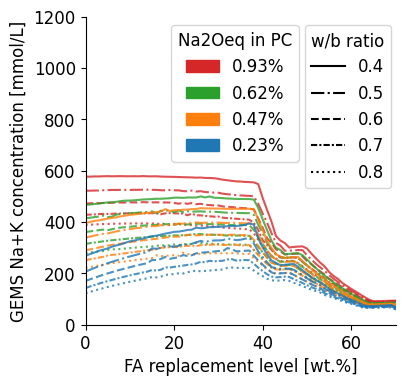

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import matplotlib.patches as mpatches

# Load the spreadsheet
file_path = '/content/2024-06-05 Ana_wb for different alkali_FA.xlsx'
df = pd.read_excel(file_path, sheet_name='Summary', header=None)

# Extract the required values
alkali_levels = df.iloc[1, 1:29].values
wb_ratios = df.iloc[2, 1:29].values
FA_replacement = df.iloc[4:105, 0].values
concentration_levels = df.iloc[4:105, 1:29].values

# Display the extracted values for verification
alkali_levels, wb_ratios, FA_replacement, concentration_levels

# Prepare the data for a combined database
data = []

# Iterate over the concentration levels matrix and match with the respective alkali levels, w/b ratios, and MK replacements
for i in range(len(MK_replacement)):
    for j in range(len(alkali_levels)):
        data.append([
            alkali_levels[j],          # Alkali level
            wb_ratios[j],              # w/b ratio
            FA_replacement[i],         # FA replacement level
            concentration_levels[i, j] # Concentration level
        ])

# Convert to a DataFrame for better visualization
df_combined = pd.DataFrame(data, columns=['Alkali Level', 'w/b Ratio', 'FA Replacement Level', 'Concentration Level'])
display(df_combined)

# Filter the data to include only the specified w/b ratios
filtered_df = df_combined[df_combined['w/b Ratio'].isin([0.4, 0.5, 0.6, 0.7, 0.8])]

# Check unique w/b Ratio values
unique_wb_ratios = filtered_df['w/b Ratio'].unique()

# Define line styles for all unique w/b ratios in a sequence that the line becomes more solid as the value increases
line_styles = {
    0.4: 'solid',            # Solid
    0.5: 'dashdot',          # Dashed
    0.6: 'dashed',
    0.7: (0, (3, 1, 1, 1)),
    0.8: 'dotted'            # Less dashed
}

# Define specific colors for each alkali level
color_dict = {
    0.23: '#1f77b4',  # Blue
    0.47: '#ff7f0e',  # Orange
    0.62: '#2ca02c',  # Green
    0.93: '#d62728'   # Red
}

# Create a line plot with hue based on Alkali Level and different line styles based on filtered w/b Ratios
plt.figure(figsize=(4,4))

# Iterate through each unique combination of w/b ratios and alkali levels
for alkali_level in filtered_df['Alkali Level'].unique():
    subset = filtered_df[filtered_df['Alkali Level'] == alkali_level]
    for wb_ratio in subset['w/b Ratio'].unique():
        sub_subset = subset[subset['w/b Ratio'] == wb_ratio]
        sns.lineplot(data=sub_subset, x='FA Replacement Level', y='Concentration Level',
                     linestyle=line_styles[wb_ratio], color=color_dict[alkali_level], label=f'Alkali: {alkali_level}, w/b: {wb_ratio}', alpha=0.8)

# Customize the plot
plt.gca().spines[['top', 'right']].set_visible(False)
plt.xlabel('FA replacement level [wt.%]')
plt.ylabel('GEMS Na+K concentration [mmol/L]')
plt.ylim(0, 1200)
plt.xlim(0, 70)

# Create legends
alkali_patches = [mpatches.Patch(color=color_dict[alkali_level], label=f'{alkali_level}%') for alkali_level in filtered_df['Alkali Level'].unique()]
line_patches = [mlines.Line2D([], [], linestyle=line_styles[wb], color='black', label=f'{wb}') for wb in line_styles.keys()]

# Add legends to the plot
first_legend = plt.legend(handles=alkali_patches, title='Na2Oeq in PC', loc='upper left', bbox_to_anchor=(.25, 1))
plt.gca().add_artist(first_legend)
plt.legend(handles=line_patches, title='w/b ratio', loc='upper left', bbox_to_anchor=(0.68, 1))

# plt.title('Line Plot of FA Replacement Level vs. Concentration Level with Alkali Level and w/b Ratios')

plt.show()



,Alkali Level,w/b Ratio,Slag Replacement Level,Concentration Level
0,0.93,0.3,1.000000e-09,634.58550
1,0.93,0.4,1.000000e-09,577.03760
2,0.93,0.5,1.000000e-09,522.51260
3,0.93,0.6,1.000000e-09,471.97870
4,0.93,0.7,1.000000e-09,428.37910
...,...,...,...,...
2823,0.23,0.5,1.000000e+02,34.42256
2824,0.23,0.6,1.000000e+02,33.42942
2825,0.23,0.7,1.000000e+02,32.77848
2826,0.23,0.8,1.000000e+02,32.14568


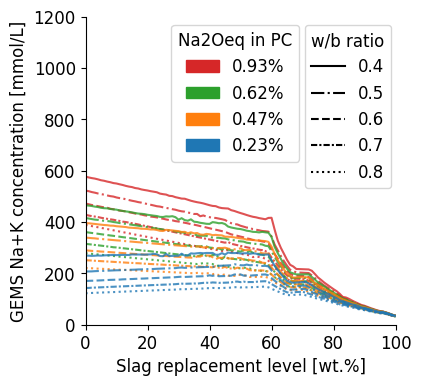

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import matplotlib.patches as mpatches

# Load the spreadsheet
file_path = '/content/2024-06-05 Ana_wb for different alkali_slag.xlsx'
df = pd.read_excel(file_path, sheet_name='Summary', header=None)

# Extract the required values
alkali_levels = df.iloc[1, 1:29].values
wb_ratios = df.iloc[2, 1:29].values
slag_replacement = df.iloc[4:105, 0].values
concentration_levels = df.iloc[4:105, 1:29].values

# Display the extracted values for verification
alkali_levels, wb_ratios, slag_replacement, concentration_levels

# Prepare the data for a combined database
data = []

# Iterate over the concentration levels matrix and match with the respective alkali levels, w/b ratios, and MK replacements
for i in range(len(MK_replacement)):
    for j in range(len(alkali_levels)):
        data.append([
            alkali_levels[j],          # Alkali level
            wb_ratios[j],              # w/b ratio
            slag_replacement[i],         # slag replacement level
            concentration_levels[i, j] # Concentration level
        ])

# Convert to a DataFrame for better visualization
df_combined = pd.DataFrame(data, columns=['Alkali Level', 'w/b Ratio', 'Slag Replacement Level', 'Concentration Level'])
display(df_combined)

# Filter the data to include only the specified w/b ratios
filtered_df = df_combined[df_combined['w/b Ratio'].isin([0.4, 0.5, 0.6, 0.7, 0.8])]

# Check unique w/b Ratio values
unique_wb_ratios = filtered_df['w/b Ratio'].unique()

# Define line styles for all unique w/b ratios in a sequence that the line becomes more solid as the value increases
line_styles = {
    0.4: 'solid',            # Solid
    0.5: 'dashdot',          # Dashed
    0.6: 'dashed',
    0.7: (0, (3, 1, 1, 1)),
    0.8: 'dotted'            # Less dashed
}

# Define specific colors for each alkali level
color_dict = {
    0.23: '#1f77b4',  # Blue
    0.47: '#ff7f0e',  # Orange
    0.62: '#2ca02c',  # Green
    0.93: '#d62728'   # Red
}

# Create a line plot with hue based on Alkali Level and different line styles based on filtered w/b Ratios
plt.figure(figsize=(4,4))

# Iterate through each unique combination of w/b ratios and alkali levels
for alkali_level in filtered_df['Alkali Level'].unique():
    subset = filtered_df[filtered_df['Alkali Level'] == alkali_level]
    for wb_ratio in subset['w/b Ratio'].unique():
        sub_subset = subset[subset['w/b Ratio'] == wb_ratio]
        sns.lineplot(data=sub_subset, x='Slag Replacement Level', y='Concentration Level',
                     linestyle=line_styles[wb_ratio], color=color_dict[alkali_level], label=f'Alkali: {alkali_level}, w/b: {wb_ratio}', alpha=0.8)

# Customize the plot
plt.gca().spines[['top', 'right']].set_visible(False)
plt.xlabel('Slag replacement level [wt.%]')
plt.ylabel('GEMS Na+K concentration [mmol/L]')
plt.ylim(0, 1200)
plt.xlim(0, 100)

# Create legends
alkali_patches = [mpatches.Patch(color=color_dict[alkali_level], label=f'{alkali_level}%') for alkali_level in filtered_df['Alkali Level'].unique()]
line_patches = [mlines.Line2D([], [], linestyle=line_styles[wb], color='black', label=f'{wb}') for wb in line_styles.keys()]

# Add legends to the plot
first_legend = plt.legend(handles=alkali_patches, title='Na2Oeq in PC', loc='upper left', bbox_to_anchor=(.25, 1))
plt.gca().add_artist(first_legend)
plt.legend(handles=line_patches, title='w/b ratio', loc='upper left', bbox_to_anchor=(0.68, 1))

# plt.title('Line Plot of Slag Replacement Level vs. Concentration Level with Alkali Level and w/b Ratios')

plt.show()



,Alkali Level,w/b Ratio,SF Replacement Level,Concentration Level
0,0.93,0.3,1.000000e-09,118.5213
1,0.93,0.4,1.000000e-09,576.8829
2,0.93,0.5,1.000000e-09,522.6248
3,0.93,0.6,1.000000e-09,471.6664
4,0.93,0.7,1.000000e-09,427.9428
...,...,...,...,...
2823,0.23,0.5,1.000000e+02,251.1706
2824,0.23,0.6,1.000000e+02,210.1128
2825,0.23,0.7,1.000000e+02,180.7902
2826,0.23,0.8,1.000000e+02,158.7699


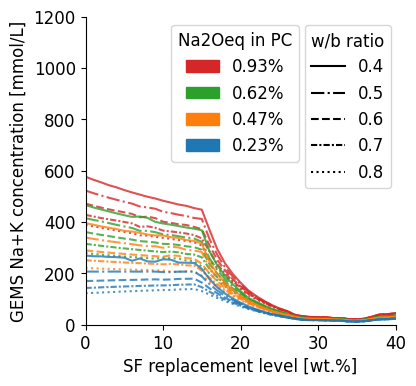

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import matplotlib.patches as mpatches

# Load the spreadsheet
file_path = '/content/2024-06-05 Ana_wb for different alkali_SF.xlsx'
df = pd.read_excel(file_path, sheet_name='Summary', header=None)

# Extract the required values
alkali_levels = df.iloc[1, 1:29].values
wb_ratios = df.iloc[2, 1:29].values
SF_replacement = df.iloc[4:105, 0].values
concentration_levels = df.iloc[4:105, 1:29].values

# Display the extracted values for verification
alkali_levels, wb_ratios, SF_replacement, concentration_levels

# Prepare the data for a combined database
data = []

# Iterate over the concentration levels matrix and match with the respective alkali levels, w/b ratios, and MK replacements
for i in range(len(MK_replacement)):
    for j in range(len(alkali_levels)):
        data.append([
            alkali_levels[j],          # Alkali level
            wb_ratios[j],              # w/b ratio
            SF_replacement[i],         # SF replacement level
            concentration_levels[i, j] # Concentration level
        ])

# Convert to a DataFrame for better visualization
df_combined = pd.DataFrame(data, columns=['Alkali Level', 'w/b Ratio', 'SF Replacement Level', 'Concentration Level'])
display(df_combined)

# Filter the data to include only the specified w/b ratios
filtered_df = df_combined[df_combined['w/b Ratio'].isin([0.4, 0.5, 0.6, 0.7, 0.8])]

# Check unique w/b Ratio values
unique_wb_ratios = filtered_df['w/b Ratio'].unique()

# Define line styles for all unique w/b ratios in a sequence that the line becomes more solid as the value increases
line_styles = {
    0.4: 'solid',            # Solid
    0.5: 'dashdot',          # Dashed
    0.6: 'dashed',
    0.7: (0, (3, 1, 1, 1)),
    0.8: 'dotted'            # Less dashed
}

# Define specific colors for each alkali level
color_dict = {
    0.23: '#1f77b4',  # Blue
    0.47: '#ff7f0e',  # Orange
    0.62: '#2ca02c',  # Green
    0.93: '#d62728'   # Red
}

# Create a line plot with hue based on Alkali Level and different line styles based on filtered w/b Ratios
plt.figure(figsize=(4,4))

# Iterate through each unique combination of w/b ratios and alkali levels
for alkali_level in filtered_df['Alkali Level'].unique():
    subset = filtered_df[filtered_df['Alkali Level'] == alkali_level]
    for wb_ratio in subset['w/b Ratio'].unique():
        sub_subset = subset[subset['w/b Ratio'] == wb_ratio]
        sns.lineplot(data=sub_subset, x='SF Replacement Level', y='Concentration Level',
                     linestyle=line_styles[wb_ratio], color=color_dict[alkali_level], label=f'Alkali: {alkali_level}, w/b: {wb_ratio}', alpha=0.8)

# Customize the plot
plt.gca().spines[['top', 'right']].set_visible(False)
plt.xlabel('SF replacement level [wt.%]')
plt.ylabel('GEMS Na+K concentration [mmol/L]')
plt.ylim(0, 1200)
plt.xlim(0, 40)

# Create legends
alkali_patches = [mpatches.Patch(color=color_dict[alkali_level], label=f'{alkali_level}%') for alkali_level in filtered_df['Alkali Level'].unique()]
line_patches = [mlines.Line2D([], [], linestyle=line_styles[wb], color='black', label=f'{wb}') for wb in line_styles.keys()]

# Add legends to the plot
first_legend = plt.legend(handles=alkali_patches, title='Na2Oeq in PC', loc='upper left', bbox_to_anchor=(.25, 1))
plt.gca().add_artist(first_legend)
plt.legend(handles=line_patches, title='w/b ratio', loc='upper left', bbox_to_anchor=(0.68, 1))

# plt.title('Line Plot of SF Replacement Level vs. Concentration Level with Alkali Level and w/b Ratios')

plt.show()



Taylor

In [ ]:
import math

# Define SCM parameters
scm_parameters = {
    'FA': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0.04,
        'total_k_content_water_soluble': 0.03,
        'fraction_of_glass': 0.8,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.81,
        'm_tot_SCM_K': 2.74
    },
    'MK': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.05,
        'm_tot_SCM_K': 1
    },
    'SF': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.32,
        'm_tot_SCM_K': 0.71
    },
    'slag': {
        'binding_factor_na': 0.08,
        'binding_factor_k': 0.04,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.29,
        'm_tot_SCM_K': 0.38
    }
}

# Define cement parameters
cement_parameters = {
    '0.93': {'m_tot_PC_Na': 0.42, 'm_tot_PC_K': 0.78},
    '0.62': {'m_tot_PC_Na': 0.28, 'm_tot_PC_K': 0.52},
    '0.47': {'m_tot_PC_Na': 0.21, 'm_tot_PC_K': 0.39},
    '0.23': {'m_tot_PC_Na': 0.105, 'm_tot_PC_K': 0.195}
}


def get_scm_parameters(scm_type):
    return scm_parameters.get(scm_type, {})

def get_cement_parameters(alkali_content):
    return cement_parameters.get(alkali_content, {})

def calculate_dor_scm(scm_type_for_dor, replacement_level, time):
    if scm_type_for_dor == 'FA_RILEM':
        dor_scm = replacement_level * (0.49993 - 0.0041 * replacement_level)
    elif scm_type_for_dor == 'FA_Taylor':
        fraction_of_glass = scm_parameters['FA']['fraction_of_glass']
        dor_scm = fraction_of_glass * replacement_level * (1 - math.exp(-(0.043 - (replacement_level * fraction_of_glass * 0.0005)) * time ** (0.585 - (replacement_level * fraction_of_glass * 0.0005))))
    elif scm_type_for_dor == 'SF':
        dor_scm = replacement_level
    elif scm_type_for_dor == 'slag':
        dor_scm = replacement_level * 0.7
    elif scm_type_for_dor == 'MK':
        if replacement_level <= 5:
            dor_scm = replacement_level
        elif replacement_level <= 35:
            dor_scm = replacement_level * (100 - ((replacement_level - 5) * 60 / 30)) / 100
        else:
            dor_scm = replacement_level * 40 / 100
    else:
        dor_scm = 0  # Default value if scm_type does not match

    # print(f"Degree of Reaction (DoR) for SCM {scm_type_for_dor}: {dor_scm}")
    return dor_scm

def calculate_na_k_concentration(replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor):
    scm_params = get_scm_parameters(scm_type_for_parameters)
    cement_params = get_cement_parameters(alkali_content)

    binding_factor_na = scm_params['binding_factor_na']
    binding_factor_k = scm_params['binding_factor_k']
    total_na_content_water_soluble = scm_params['total_na_content_water_soluble']
    total_k_content_water_soluble = scm_params['total_k_content_water_soluble']
    fraction_of_glass = scm_params['fraction_of_glass']
    g_bound_water_per_g_reacted_scm = scm_params['g_bound_water_per_g_reacted_scm']
    m_tot_SCM_Na = scm_params['m_tot_SCM_Na']
    m_tot_SCM_K = scm_params['m_tot_SCM_K']

    m_tot_PC_Na = cement_params['m_tot_PC_Na']
    m_tot_PC_K = cement_params['m_tot_PC_K']

    dor_scm = calculate_dor_scm(scm_type_for_dor, replacement_level, time)

    na_mass = 23.0  # [g/mol]
    k_mass = 39.1   # [g/mol]
    na2o_mass = 62.0  # [g/mol]
    k2o_mass = 94.2   # [g/mol]

    # Calculate F functions
    F_C4AF = 1 - math.exp(-(0.55 + (0.012 * replacement_level)) * (time - 0.9) ** 0.26)
    F_C3A = 1 - math.exp(-(0.77 + (0.008 * replacement_level)) * (time - 0.9) ** 0.28)
    F_C2S = 1 - math.exp(-(0.12 - (0.0007 * replacement_level)) * time ** (0.46 - (0.002 * replacement_level)))
    F_C3S = 1 - math.exp(-(0.7 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)

    # print(f"F_C4AF: {F_C4AF}, F_C3A: {F_C3A}, F_C2S: {F_C2S}, F_C3S: {F_C3S}")

    # F_CRP function
    F_CRP = ((100 - replacement_level) / 100) * replacement_level ** 0.09 * (1 - math.exp(-(0.56 - (0.0043 * replacement_level)) * (time - 0.9) ** 0.25))
    # print(f"F_CRP: {F_CRP}")

    # Fractions for Alite, Belite, Aluminate, Ferrite
    na2o_fractions = {'Alite': 0.44, 'Belite': 0.17, 'Aluminate': 0.36, 'Ferrite': 0.03}
    k2o_fractions = {'Alite': 0.29, 'Belite': 0.41, 'Aluminate': 0.27, 'Ferrite': 0.03}

    # Calculate m_r_Na from PC
    total_na_content_water_soluble_PC = 35

    m_r_na_from_pc = (
        (m_tot_PC_Na * total_na_content_water_soluble_PC / 100) +
        (F_C3S * na2o_fractions['Alite'] + F_C2S * na2o_fractions['Belite'] + F_C3A * na2o_fractions['Aluminate'] + F_C4AF * na2o_fractions['Ferrite']) *
        (1 - total_na_content_water_soluble_PC / 100) * m_tot_PC_Na
    ) * ((100 - replacement_level) / 100) * 2 / na2o_mass
    # print(f"m_r_na_from_pc: {m_r_na_from_pc}")

    # Calculate m_r_Na from SCM
    m_r_na_from_scm = (
        (total_na_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_Na - total_na_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / na2o_mass
    # print(f"m_r_na_from_scm: {m_r_na_from_scm}")


    # Calculate V(t) pore solution
    V_b_t = 31.6 * ((100 - replacement_level) / 100) * (1 - math.exp(-(0.69 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)) + g_bound_water_per_g_reacted_scm * dor_scm
    V_t_pore_solution = (w_b_ratio * 100) - V_b_t
    # print(f"V_b_t: {V_b_t}, V_t_pore_solution: {V_t_pore_solution}")

    # Calculate Na concentration
    b_pc_na = 0.031
    na_concentration = ((m_r_na_from_pc + m_r_na_from_scm) * 1000 / (V_t_pore_solution +
     (b_pc_na * 1000 * F_CRP) +binding_factor_na * 10 * dor_scm)) * 1000
    # print(f"na_concentration: {na_concentration}")



    # Calculate K concentration
    total_k_content_water_soluble_PC = 70

    m_r_k_from_pc = (
        (m_tot_PC_K * total_k_content_water_soluble_PC/ 100) +
        (F_C3S * k2o_fractions['Alite'] + F_C2S * k2o_fractions['Belite'] + F_C3A * k2o_fractions['Aluminate'] + F_C4AF * k2o_fractions['Ferrite']) *
        (1 - total_k_content_water_soluble_PC / 100) * m_tot_PC_K
    ) * ((100 - replacement_level) / 100) * 2 / k2o_mass
    # print(f"m_r_k_from_pc: {m_r_k_from_pc}")


    m_r_k_from_scm = (
        (total_k_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_K - total_k_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / k2o_mass
    # print(f"m_r_k_from_scm: {m_r_k_from_scm}")

    b_pc_k = 0.02

    k_concentration = ((m_r_k_from_pc + m_r_k_from_scm) * 1000 / (V_t_pore_solution + (b_pc_k * 1000 * F_CRP)
    + binding_factor_k * 10 * dor_scm)) * 1000

    # Calculate total Na+K concentration
    na_k_concentration = na_concentration + k_concentration

    return na_k_concentration, na_concentration, k_concentration

# Usage
replacement_level = 5
time = 180
w_b_ratio = 0.4
alkali_content = '0.93'  # Value for alkali content
scm_type_for_parameters = 'SF'  # SCM type for selecting parameters
scm_type_for_dor = 'SF'  # SCM type for calculating DoR

na_k_concentration, na_concentration, k_concentration = calculate_na_k_concentration(
    replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor
)

print(f"Na+K Concentration: {na_k_concentration} mmol/L")
print(f"Na Concentration: {na_concentration} mmol/L")
print(f"K Concentration: {k_concentration} mmol/L")



Na+K Concentration: 565.1601838597426 mmol/L
Na Concentration: 226.9713605743384 mmol/L
K Concentration: 338.1888232854041 mmol/L


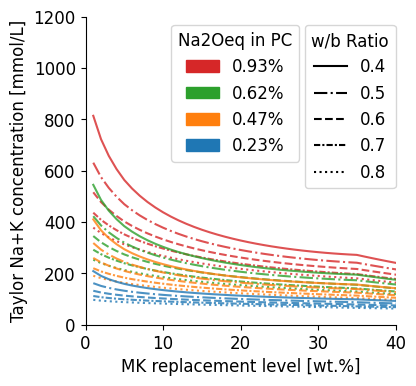

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import matplotlib.patches as mpatches
import pandas as pd

# Constants
scm_type_for_parameters = 'MK'  # SCM type for selecting parameters
scm_type_for_dor = 'MK'  # SCM type for calculating DoR
time = 180  # Constant time value

# Define the ranges for the parameters
replacement_levels = range(1, 101)  # Replacement levels from 1 to 100
alkali_contents = ['0.93','0.62', '0.47','0.23' ]  # Different alkali content values
w_b_ratios = [0.4, 0.5, 0.6, 0.7, 0.8]  # Different w/b ratios

# Function to calculate the concentrations
def calculate_concentrations(replacement_levels, alkali_contents, w_b_ratios):
    results = []
    for replacement_level in replacement_levels:
        for alkali_content in alkali_contents:
            for w_b_ratio in w_b_ratios:
                na_k_concentration, na_concentration, k_concentration = calculate_na_k_concentration(
                    replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor
                )
                results.append((replacement_level, alkali_content, w_b_ratio, na_k_concentration, na_concentration, k_concentration))
    return results

# Calculate the concentrations
concentrations = calculate_concentrations(replacement_levels, alkali_contents, w_b_ratios)

# Convert to DataFrame
df_combined = pd.DataFrame(concentrations, columns=['Replacement Level', 'Alkali Content', 'w/b Ratio', 'Na+K Concentration', 'Na Concentration', 'K Concentration'])

# Filter the data to include only the specified w/b ratios
filtered_df = df_combined[df_combined['w/b Ratio'].isin(w_b_ratios)]

# Define line styles for all unique w/b ratios in a sequence that the line becomes more solid as the value increases
line_styles = {
    0.4: 'solid',            # Solid
    0.5: 'dashdot',          # Dashed
    0.6: 'dashed',
    0.7: (0, (3, 1, 1, 1)),
    0.8: 'dotted'            # Less dashed
}

# Define specific colors for each alkali level
color_dict = {
    '0.23': '#1f77b4',  # Blue
    '0.47': '#ff7f0e',  # Orange
    '0.62': '#2ca02c',  # Green
    '0.93': '#d62728'   # Red
}

# Create a line plot with hue based on Alkali Level and different line styles based on filtered w/b Ratios
plt.figure(figsize=(4,4))

# Iterate through each unique combination of w/b ratios and alkali levels
for alkali_level in filtered_df['Alkali Content'].unique():
    subset = filtered_df[filtered_df['Alkali Content'] == alkali_level]
    for wb_ratio in subset['w/b Ratio'].unique():
        sub_subset = subset[subset['w/b Ratio'] == wb_ratio]
        sns.lineplot(data=sub_subset, x='Replacement Level', y='Na+K Concentration',
                     linestyle=line_styles[wb_ratio], color=color_dict[alkali_level], label=f'Alkali: {alkali_level}, w/b: {wb_ratio}', alpha=0.8)

# Customize the plot
plt.gca().spines[['top', 'right']].set_visible(False)
plt.xlabel('MK replacement level [wt.%]')
plt.ylabel('Taylor Na+K concentration [mmol/L]')
plt.ylim(0, 1200)
plt.xlim(0, 40)

# Create legends
alkali_patches = [mpatches.Patch(color=color_dict[str(alkali_level)], label=f'{alkali_level}%') for alkali_level in filtered_df['Alkali Content'].unique()]
line_patches = [mlines.Line2D([], [], linestyle=line_styles[wb], color='black', label=f'{wb}') for wb in line_styles.keys()]

# Add legends to the plot
first_legend = plt.legend(handles=alkali_patches, title='Na2Oeq in PC', loc='upper left', bbox_to_anchor=(.25, 1))
plt.gca().add_artist(first_legend)
plt.legend(handles=line_patches, title='w/b Ratio', loc='upper left', bbox_to_anchor=(0.68, 1))

# plt.title('Line Plot of Replacement Level vs. Na+K Concentration Level with Alkali Content and w/b Ratios')

plt.show()


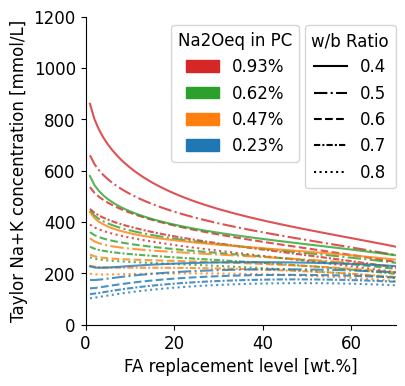

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import matplotlib.patches as mpatches
import pandas as pd

# Constants
scm_type_for_parameters = 'FA'  # SCM type for selecting parameters
scm_type_for_dor = 'FA_RILEM'  # SCM type for calculating DoR
time = 180  # Constant time value

# Define the ranges for the parameters
replacement_levels = range(1, 101)  # Replacement levels from 1 to 100
alkali_contents = ['0.93','0.62', '0.47','0.23' ]  # Different alkali content values
w_b_ratios = [0.4, 0.5, 0.6, 0.7, 0.8]  # Different w/b ratios

# Function to calculate the concentrations
def calculate_concentrations(replacement_levels, alkali_contents, w_b_ratios):
    results = []
    for replacement_level in replacement_levels:
        for alkali_content in alkali_contents:
            for w_b_ratio in w_b_ratios:
                na_k_concentration, na_concentration, k_concentration = calculate_na_k_concentration(
                    replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor
                )
                results.append((replacement_level, alkali_content, w_b_ratio, na_k_concentration, na_concentration, k_concentration))
    return results

# Calculate the concentrations
concentrations = calculate_concentrations(replacement_levels, alkali_contents, w_b_ratios)

# Convert to DataFrame
df_combined = pd.DataFrame(concentrations, columns=['Replacement Level', 'Alkali Content', 'w/b Ratio', 'Na+K Concentration', 'Na Concentration', 'K Concentration'])

# Filter the data to include only the specified w/b ratios
filtered_df = df_combined[df_combined['w/b Ratio'].isin(w_b_ratios)]

# Define line styles for all unique w/b ratios in a sequence that the line becomes more solid as the value increases
line_styles = {
    0.4: 'solid',            # Solid
    0.5: 'dashdot',          # Dashed
    0.6: 'dashed',
    0.7: (0, (3, 1, 1, 1)),
    0.8: 'dotted'            # Less dashed
}

# Define specific colors for each alkali level
color_dict = {
    '0.23': '#1f77b4',  # Blue
    '0.47': '#ff7f0e',  # Orange
    '0.62': '#2ca02c',  # Green
    '0.93': '#d62728'   # Red
}

# Create a line plot with hue based on Alkali Level and different line styles based on filtered w/b Ratios
plt.figure(figsize=(4,4))

# Iterate through each unique combination of w/b ratios and alkali levels
for alkali_level in filtered_df['Alkali Content'].unique():
    subset = filtered_df[filtered_df['Alkali Content'] == alkali_level]
    for wb_ratio in subset['w/b Ratio'].unique():
        sub_subset = subset[subset['w/b Ratio'] == wb_ratio]
        sns.lineplot(data=sub_subset, x='Replacement Level', y='Na+K Concentration',
                     linestyle=line_styles[wb_ratio], color=color_dict[alkali_level], label=f'Alkali: {alkali_level}, w/b: {wb_ratio}', alpha=0.8)

# Customize the plot
plt.gca().spines[['top', 'right']].set_visible(False)
plt.xlabel('FA replacement level [wt.%]')
plt.ylabel('Taylor Na+K concentration [mmol/L]')
plt.ylim(0, 1200)
plt.xlim(0, 70)

# Create legends
alkali_patches = [mpatches.Patch(color=color_dict[str(alkali_level)], label=f'{alkali_level}%') for alkali_level in filtered_df['Alkali Content'].unique()]
line_patches = [mlines.Line2D([], [], linestyle=line_styles[wb], color='black', label=f'{wb}') for wb in line_styles.keys()]

# Add legends to the plot
first_legend = plt.legend(handles=alkali_patches, title='Na2Oeq in PC', loc='upper left', bbox_to_anchor=(.25, 1))
plt.gca().add_artist(first_legend)
plt.legend(handles=line_patches, title='w/b Ratio', loc='upper left', bbox_to_anchor=(0.68, 1))

# plt.title('Line Plot of Replacement Level vs. Na+K Concentration Level with Alkali Content and w/b Ratios')

plt.show()


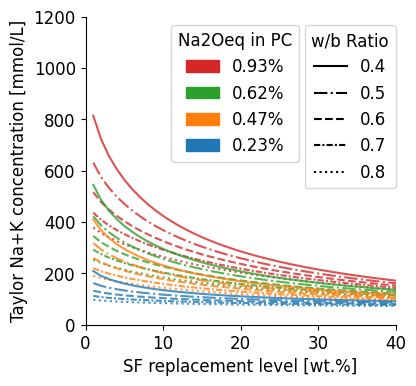

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import matplotlib.patches as mpatches
import pandas as pd

# Constants
scm_type_for_parameters = 'SF'  # SCM type for selecting parameters
scm_type_for_dor = 'SF'  # SCM type for calculating DoR
time = 180  # Constant time value

# Define the ranges for the parameters
replacement_levels = range(1, 101)  # Replacement levels from 1 to 100
alkali_contents = ['0.93','0.62', '0.47','0.23' ]  # Different alkali content values
w_b_ratios = [0.4, 0.5, 0.6, 0.7, 0.8]  # Different w/b ratios

# Function to calculate the concentrations
def calculate_concentrations(replacement_levels, alkali_contents, w_b_ratios):
    results = []
    for replacement_level in replacement_levels:
        for alkali_content in alkali_contents:
            for w_b_ratio in w_b_ratios:
                na_k_concentration, na_concentration, k_concentration = calculate_na_k_concentration(
                    replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor
                )
                results.append((replacement_level, alkali_content, w_b_ratio, na_k_concentration, na_concentration, k_concentration))
    return results

# Calculate the concentrations
concentrations = calculate_concentrations(replacement_levels, alkali_contents, w_b_ratios)

# Convert to DataFrame
df_combined = pd.DataFrame(concentrations, columns=['Replacement Level', 'Alkali Content', 'w/b Ratio', 'Na+K Concentration', 'Na Concentration', 'K Concentration'])

# Filter the data to include only the specified w/b ratios
filtered_df = df_combined[df_combined['w/b Ratio'].isin(w_b_ratios)]

# Define line styles for all unique w/b ratios in a sequence that the line becomes more solid as the value increases
line_styles = {
    0.4: 'solid',            # Solid
    0.5: 'dashdot',          # Dashed
    0.6: 'dashed',
    0.7: (0, (3, 1, 1, 1)),
    0.8: 'dotted'            # Less dashed
}

# Define specific colors for each alkali level
color_dict = {
    '0.23': '#1f77b4',  # Blue
    '0.47': '#ff7f0e',  # Orange
    '0.62': '#2ca02c',  # Green
    '0.93': '#d62728'   # Red
}

# Create a line plot with hue based on Alkali Level and different line styles based on filtered w/b Ratios
plt.figure(figsize=(4,4))

# Iterate through each unique combination of w/b ratios and alkali levels
for alkali_level in filtered_df['Alkali Content'].unique():
    subset = filtered_df[filtered_df['Alkali Content'] == alkali_level]
    for wb_ratio in subset['w/b Ratio'].unique():
        sub_subset = subset[subset['w/b Ratio'] == wb_ratio]
        sns.lineplot(data=sub_subset, x='Replacement Level', y='Na+K Concentration',
                     linestyle=line_styles[wb_ratio], color=color_dict[alkali_level], label=f'Alkali: {alkali_level}, w/b: {wb_ratio}', alpha=0.8)

# Customize the plot
plt.gca().spines[['top', 'right']].set_visible(False)
plt.xlabel('SF replacement level [wt.%]')
plt.ylabel('Taylor Na+K concentration [mmol/L]')
plt.ylim(0, 1200)
plt.xlim(0, 40)

# Create legends
alkali_patches = [mpatches.Patch(color=color_dict[str(alkali_level)], label=f'{alkali_level}%') for alkali_level in filtered_df['Alkali Content'].unique()]
line_patches = [mlines.Line2D([], [], linestyle=line_styles[wb], color='black', label=f'{wb}') for wb in line_styles.keys()]

# Add legends to the plot
first_legend = plt.legend(handles=alkali_patches, title='Na2Oeq in PC', loc='upper left', bbox_to_anchor=(.25, 1))
plt.gca().add_artist(first_legend)
plt.legend(handles=line_patches, title='w/b Ratio', loc='upper left', bbox_to_anchor=(0.68, 1))

# plt.title('Line Plot of Replacement Level vs. Na+K Concentration Level with Alkali Content and w/b Ratios')

plt.show()


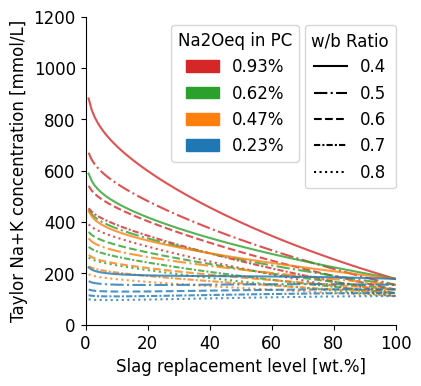

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import matplotlib.patches as mpatches
import pandas as pd

# Constants
scm_type_for_parameters = 'slag'  # SCM type for selecting parameters
scm_type_for_dor = 'slag'  # SCM type for calculating DoR
time = 180  # Constant time value

# Define the ranges for the parameters
replacement_levels = range(1, 101)  # Replacement levels from 1 to 100
alkali_contents = ['0.93','0.62', '0.47','0.23' ]  # Different alkali content values
w_b_ratios = [0.4, 0.5, 0.6, 0.7, 0.8]  # Different w/b ratios

# Function to calculate the concentrations
def calculate_concentrations(replacement_levels, alkali_contents, w_b_ratios):
    results = []
    for replacement_level in replacement_levels:
        for alkali_content in alkali_contents:
            for w_b_ratio in w_b_ratios:
                na_k_concentration, na_concentration, k_concentration = calculate_na_k_concentration(
                    replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor
                )
                results.append((replacement_level, alkali_content, w_b_ratio, na_k_concentration, na_concentration, k_concentration))
    return results

# Calculate the concentrations
concentrations = calculate_concentrations(replacement_levels, alkali_contents, w_b_ratios)

# Convert to DataFrame
df_combined = pd.DataFrame(concentrations, columns=['Replacement Level', 'Alkali Content', 'w/b Ratio', 'Na+K Concentration', 'Na Concentration', 'K Concentration'])

# Filter the data to include only the specified w/b ratios
filtered_df = df_combined[df_combined['w/b Ratio'].isin(w_b_ratios)]

# Define line styles for all unique w/b ratios in a sequence that the line becomes more solid as the value increases
line_styles = {
    0.4: 'solid',            # Solid
    0.5: 'dashdot',          # Dashed
    0.6: 'dashed',
    0.7: (0, (3, 1, 1, 1)),
    0.8: 'dotted'            # Less dashed
}

# Define specific colors for each alkali level
color_dict = {
    '0.23': '#1f77b4',  # Blue
    '0.47': '#ff7f0e',  # Orange
    '0.62': '#2ca02c',  # Green
    '0.93': '#d62728'   # Red
}

# Create a line plot with hue based on Alkali Level and different line styles based on filtered w/b Ratios
plt.figure(figsize=(4,4))

# Iterate through each unique combination of w/b ratios and alkali levels
for alkali_level in filtered_df['Alkali Content'].unique():
    subset = filtered_df[filtered_df['Alkali Content'] == alkali_level]
    for wb_ratio in subset['w/b Ratio'].unique():
        sub_subset = subset[subset['w/b Ratio'] == wb_ratio]
        sns.lineplot(data=sub_subset, x='Replacement Level', y='Na+K Concentration',
                     linestyle=line_styles[wb_ratio], color=color_dict[alkali_level], label=f'Alkali: {alkali_level}, w/b: {wb_ratio}', alpha=0.8)

# Customize the plot
plt.gca().spines[['top', 'right']].set_visible(False)
plt.xlabel('Slag replacement level [wt.%]')
plt.ylabel('Taylor Na+K concentration [mmol/L]')
plt.ylim(0, 1200)
plt.xlim(0, 100)

# Create legends
alkali_patches = [mpatches.Patch(color=color_dict[str(alkali_level)], label=f'{alkali_level}%') for alkali_level in filtered_df['Alkali Content'].unique()]
line_patches = [mlines.Line2D([], [], linestyle=line_styles[wb], color='black', label=f'{wb}') for wb in line_styles.keys()]

# Add legends to the plot
first_legend = plt.legend(handles=alkali_patches, title='Na2Oeq in PC', loc='upper left', bbox_to_anchor=(.25, 1))
plt.gca().add_artist(first_legend)
plt.legend(handles=line_patches, title='w/b Ratio', loc='upper left', bbox_to_anchor=(0.68, 1))

# plt.title('Line Plot of Replacement Level vs. Na+K Concentration Level with Alkali Content and w/b Ratios')

plt.show()


FIGURE 2 - CONTOURN PLOTS

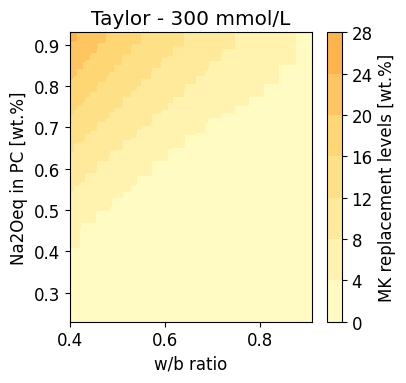

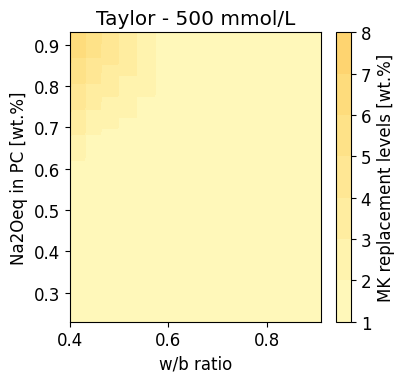

In [ ]:
import math
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import griddata


import math

# Define SCM parameters
scm_parameters = {
    'FA': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0.04,
        'total_k_content_water_soluble': 0.03,
        'fraction_of_glass': 0.8,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.81,
        'm_tot_SCM_K': 2.74
    },
    'MK': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.05,
        'm_tot_SCM_K': 1
    },
    'SF': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.32,
        'm_tot_SCM_K': 0.71
    },
    'slag': {
        'binding_factor_na': 0.08,
        'binding_factor_k': 0.04,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.29,
        'm_tot_SCM_K': 0.38
    }
}

# Define cement parameters
cement_parameters = {
    '0.93': {'m_tot_PC_Na': 0.42, 'm_tot_PC_K': 0.78},
    '0.62': {'m_tot_PC_Na': 0.28, 'm_tot_PC_K': 0.52},
    '0.47': {'m_tot_PC_Na': 0.21, 'm_tot_PC_K': 0.39},
    '0.23': {'m_tot_PC_Na': 0.105, 'm_tot_PC_K': 0.195}
}


def get_scm_parameters(scm_type):
    return scm_parameters.get(scm_type, {})

def get_cement_parameters(alkali_content):
    return cement_parameters.get(alkali_content, {})

def calculate_dor_scm(scm_type_for_dor, replacement_level, time):
    if scm_type_for_dor == 'FA_RILEM':
        dor_scm = replacement_level * (0.49993 - 0.0041 * replacement_level)
    elif scm_type_for_dor == 'FA_Taylor':
        fraction_of_glass = scm_parameters['FA']['fraction_of_glass']
        dor_scm = fraction_of_glass * replacement_level * (1 - math.exp(-(0.043 - (replacement_level * fraction_of_glass * 0.0005)) * time ** (0.585 - (replacement_level * fraction_of_glass * 0.0005))))
    elif scm_type_for_dor == 'SF':
        dor_scm = replacement_level
    elif scm_type_for_dor == 'slag':
        dor_scm = replacement_level * 0.7
    elif scm_type_for_dor == 'MK':
        if replacement_level <= 5:
            dor_scm = replacement_level
        elif replacement_level <= 35:
            dor_scm = replacement_level * (100 - ((replacement_level - 5) * 60 / 30)) / 100
        else:
            dor_scm = replacement_level * 40 / 100
    else:
        dor_scm = 0  # Default value if scm_type does not match

    # print(f"Degree of Reaction (DoR) for SCM {scm_type_for_dor}: {dor_scm}")
    return dor_scm

def calculate_na_k_concentration(replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor):
    scm_params = get_scm_parameters(scm_type_for_parameters)
    cement_params = get_cement_parameters(alkali_content)

    binding_factor_na = scm_params['binding_factor_na']
    binding_factor_k = scm_params['binding_factor_k']
    total_na_content_water_soluble = scm_params['total_na_content_water_soluble']
    total_k_content_water_soluble = scm_params['total_k_content_water_soluble']
    fraction_of_glass = scm_params['fraction_of_glass']
    g_bound_water_per_g_reacted_scm = scm_params['g_bound_water_per_g_reacted_scm']
    m_tot_SCM_Na = scm_params['m_tot_SCM_Na']
    m_tot_SCM_K = scm_params['m_tot_SCM_K']

    m_tot_PC_Na = cement_params['m_tot_PC_Na']
    m_tot_PC_K = cement_params['m_tot_PC_K']

    dor_scm = calculate_dor_scm(scm_type_for_dor, replacement_level, time)

    na_mass = 23.0  # [g/mol]
    k_mass = 39.1   # [g/mol]
    na2o_mass = 62.0  # [g/mol]
    k2o_mass = 94.2   # [g/mol]

    # Calculate F functions
    F_C4AF = 1 - math.exp(-(0.55 + (0.012 * replacement_level)) * (time - 0.9) ** 0.26)
    F_C3A = 1 - math.exp(-(0.77 + (0.008 * replacement_level)) * (time - 0.9) ** 0.28)
    F_C2S = 1 - math.exp(-(0.12 - (0.0007 * replacement_level)) * time ** (0.46 - (0.002 * replacement_level)))
    F_C3S = 1 - math.exp(-(0.7 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)

    # print(f"F_C4AF: {F_C4AF}, F_C3A: {F_C3A}, F_C2S: {F_C2S}, F_C3S: {F_C3S}")

    # F_CRP function
    F_CRP = ((100 - replacement_level) / 100) * replacement_level ** 0.09 * (1 - math.exp(-(0.56 - (0.0043 * replacement_level)) * (time - 0.9) ** 0.25))
    # print(f"F_CRP: {F_CRP}")

    # Fractions for Alite, Belite, Aluminate, Ferrite
    na2o_fractions = {'Alite': 0.44, 'Belite': 0.17, 'Aluminate': 0.36, 'Ferrite': 0.03}
    k2o_fractions = {'Alite': 0.29, 'Belite': 0.41, 'Aluminate': 0.27, 'Ferrite': 0.03}

    # Calculate m_r_Na from PC
    total_na_content_water_soluble_PC = 35

    m_r_na_from_pc = (
        (m_tot_PC_Na * total_na_content_water_soluble_PC / 100) +
        (F_C3S * na2o_fractions['Alite'] + F_C2S * na2o_fractions['Belite'] + F_C3A * na2o_fractions['Aluminate'] + F_C4AF * na2o_fractions['Ferrite']) *
        (1 - total_na_content_water_soluble_PC / 100) * m_tot_PC_Na
    ) * ((100 - replacement_level) / 100) * 2 / na2o_mass
    # print(f"m_r_na_from_pc: {m_r_na_from_pc}")

    # Calculate m_r_Na from SCM
    m_r_na_from_scm = (
        (total_na_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_Na - total_na_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / na2o_mass
    # print(f"m_r_na_from_scm: {m_r_na_from_scm}")


    # Calculate V(t) pore solution
    V_b_t = 31.6 * ((100 - replacement_level) / 100) * (1 - math.exp(-(0.69 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)) + g_bound_water_per_g_reacted_scm * dor_scm
    V_t_pore_solution = (w_b_ratio * 100) - V_b_t
    # print(f"V_b_t: {V_b_t}, V_t_pore_solution: {V_t_pore_solution}")

    # Calculate Na concentration
    b_pc_na = 0.031
    na_concentration = ((m_r_na_from_pc + m_r_na_from_scm) * 1000 / (V_t_pore_solution +
     (b_pc_na * 1000 * F_CRP) +binding_factor_na * 10 * dor_scm)) * 1000
    # print(f"na_concentration: {na_concentration}")



    # Calculate K concentration
    total_k_content_water_soluble_PC = 70

    m_r_k_from_pc = (
        (m_tot_PC_K * total_k_content_water_soluble_PC/ 100) +
        (F_C3S * k2o_fractions['Alite'] + F_C2S * k2o_fractions['Belite'] + F_C3A * k2o_fractions['Aluminate'] + F_C4AF * k2o_fractions['Ferrite']) *
        (1 - total_k_content_water_soluble_PC / 100) * m_tot_PC_K
    ) * ((100 - replacement_level) / 100) * 2 / k2o_mass
    # print(f"m_r_k_from_pc: {m_r_k_from_pc}")


    m_r_k_from_scm = (
        (total_k_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_K - total_k_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / k2o_mass
    # print(f"m_r_k_from_scm: {m_r_k_from_scm}")

    b_pc_k = 0.02

    k_concentration = ((m_r_k_from_pc + m_r_k_from_scm) * 1000 / (V_t_pore_solution + (b_pc_k * 1000 * F_CRP)
    + binding_factor_k * 10 * dor_scm)) * 1000

    # Calculate total Na+K concentration
    na_k_concentration = na_concentration + k_concentration

    return na_k_concentration, na_concentration, k_concentration

# Constants
scm_type_for_parameters = 'MK'  # SCM type for selecting parameters
scm_type_for_dor = 'MK'  # SCM type for calculating DoR
time = 180  # Constant time value

# Define the ranges for the parameters
replacement_levels = np.arange(1, 100)  # Replacement levels from 1 to 40
alkali_contents = ['0.23', '0.47', '0.62', '0.93']  # Different alkali content values
w_b_ratios = np.arange(0.4, 0.91, 0.001)  # w/b ratios from 0.4 to 0.9

# Function to calculate the concentrations for 300 mmol/L
def calculate_replacement_levels_for_concentration(target_concentration, replacement_levels, w_b_ratios, alkali_contents):
    results = []
    for alkali_content in alkali_contents:
        for w_b_ratio in w_b_ratios:
            for replacement_level in replacement_levels:
                na_k_concentration, na_concentration, k_concentration = calculate_na_k_concentration(
                    replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor
                )
                if na_k_concentration <= target_concentration:
                    results.append((w_b_ratio, alkali_content, replacement_level))
                    break
    return results

# Target concentration
target_concentration = 300  # mmol/L

# Calculate the replacement levels
replacement_data = calculate_replacement_levels_for_concentration(target_concentration, replacement_levels, w_b_ratios, alkali_contents)

# Convert to DataFrame for easier plotting
df_replacement = pd.DataFrame(replacement_data, columns=['w/b Ratio', 'Alkali Content', 'Replacement Level'])

# Create meshgrid for plotting
W, A = np.meshgrid(df_replacement['w/b Ratio'].unique(), df_replacement['Alkali Content'].unique().astype(float))

# Interpolate the replacement levels
points = df_replacement[['w/b Ratio', 'Alkali Content']].values
values = df_replacement['Replacement Level'].values
Z = griddata(points, values, (W, A), method='linear', fill_value=0)

# Create contour plots for the Taylor model (Alkali Limit: 300 mmol/L)
plt.figure(figsize=(4.2, 4))
contour_plot1 = plt.contourf(W, A, Z, cmap='YlOrRd', vmin=0, vmax=70)
plt.colorbar(label='MK replacement levels [wt.%]', extend='both')
plt.title('Taylor - 300 mmol/L')
plt.xlabel('w/b ratio')
plt.ylabel('Na2Oeq in PC [wt.%]')

plt.tight_layout()
plt.show()


# Target concentration
target_concentration = 500  # mmol/L12e

# Calculate the replacement levels
replacement_data = calculate_replacement_levels_for_concentration(target_concentration, replacement_levels, w_b_ratios, alkali_contents)

# Convert to DataFrame
df_replacement = pd.DataFrame(replacement_data, columns=['w/b Ratio', 'Alkali Content', 'Replacement Level'])

# Create meshgrid for plotting
W, A = np.meshgrid(df_replacement['w/b Ratio'].unique(), df_replacement['Alkali Content'].unique().astype(float))

# Interpolate the replacement levels
points = df_replacement[['w/b Ratio', 'Alkali Content']].values
values = df_replacement['Replacement Level'].values
Z = griddata(points, values, (W, A), method='linear', fill_value=0)

# Create contour plots for the Taylor model (Alkali Limit: 300 mmol/L)
plt.figure(figsize=(4.2, 4))
contour_plot1 = plt.contourf(W, A, Z, cmap='YlOrRd', vmin=0, vmax=28)
plt.colorbar(label='MK replacement levels [wt.%]', extend='both')
plt.title('Taylor - 500 mmol/L')
plt.xlabel('w/b ratio')
plt.ylabel('Na2Oeq in PC [wt.%]')

plt.tight_layout()
plt.show()


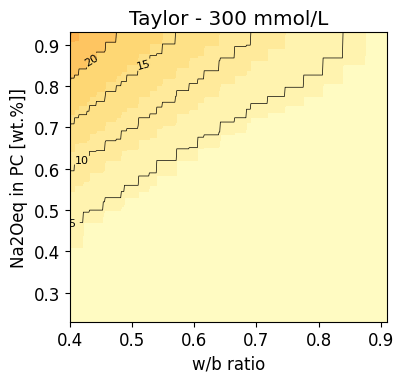

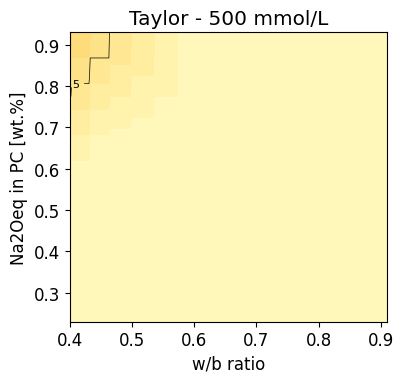

In [ ]:
import math
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import griddata


import math

# Define SCM parameters
scm_parameters = {
    'FA': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0.04,
        'total_k_content_water_soluble': 0.03,
        'fraction_of_glass': 0.8,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.81,
        'm_tot_SCM_K': 2.74
    },
    'MK': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.05,
        'm_tot_SCM_K': 1
    },
    'SF': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.32,
        'm_tot_SCM_K': 0.71
    },
    'slag': {
        'binding_factor_na': 0.08,
        'binding_factor_k': 0.04,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.29,
        'm_tot_SCM_K': 0.38
    }
}

# Define cement parameters
cement_parameters = {
    '0.93': {'m_tot_PC_Na': 0.42, 'm_tot_PC_K': 0.78},
    '0.62': {'m_tot_PC_Na': 0.28, 'm_tot_PC_K': 0.52},
    '0.47': {'m_tot_PC_Na': 0.21, 'm_tot_PC_K': 0.39},
    '0.23': {'m_tot_PC_Na': 0.105, 'm_tot_PC_K': 0.195}
}


def get_scm_parameters(scm_type):
    return scm_parameters.get(scm_type, {})

def get_cement_parameters(alkali_content):
    return cement_parameters.get(alkali_content, {})

def calculate_dor_scm(scm_type_for_dor, replacement_level, time):
    if scm_type_for_dor == 'FA_RILEM':
        dor_scm = replacement_level * (0.49993 - 0.0041 * replacement_level)
    elif scm_type_for_dor == 'FA_Taylor':
        fraction_of_glass = scm_parameters['FA']['fraction_of_glass']
        dor_scm = fraction_of_glass * replacement_level * (1 - math.exp(-(0.043 - (replacement_level * fraction_of_glass * 0.0005)) * time ** (0.585 - (replacement_level * fraction_of_glass * 0.0005))))
    elif scm_type_for_dor == 'SF':
        dor_scm = replacement_level
    elif scm_type_for_dor == 'slag':
        dor_scm = replacement_level * 0.7
    elif scm_type_for_dor == 'MK':
        if replacement_level <= 5:
            dor_scm = replacement_level
        elif replacement_level <= 35:
            dor_scm = replacement_level * (100 - ((replacement_level - 5) * 60 / 30)) / 100
        else:
            dor_scm = replacement_level * 40 / 100
    else:
        dor_scm = 0  # Default value if scm_type does not match

    # print(f"Degree of Reaction (DoR) for SCM {scm_type_for_dor}: {dor_scm}")
    return dor_scm

def calculate_na_k_concentration(replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor):
    scm_params = get_scm_parameters(scm_type_for_parameters)
    cement_params = get_cement_parameters(alkali_content)

    binding_factor_na = scm_params['binding_factor_na']
    binding_factor_k = scm_params['binding_factor_k']
    total_na_content_water_soluble = scm_params['total_na_content_water_soluble']
    total_k_content_water_soluble = scm_params['total_k_content_water_soluble']
    fraction_of_glass = scm_params['fraction_of_glass']
    g_bound_water_per_g_reacted_scm = scm_params['g_bound_water_per_g_reacted_scm']
    m_tot_SCM_Na = scm_params['m_tot_SCM_Na']
    m_tot_SCM_K = scm_params['m_tot_SCM_K']

    m_tot_PC_Na = cement_params['m_tot_PC_Na']
    m_tot_PC_K = cement_params['m_tot_PC_K']

    dor_scm = calculate_dor_scm(scm_type_for_dor, replacement_level, time)

    na_mass = 23.0  # [g/mol]
    k_mass = 39.1   # [g/mol]
    na2o_mass = 62.0  # [g/mol]
    k2o_mass = 94.2   # [g/mol]

    # Calculate F functions
    F_C4AF = 1 - math.exp(-(0.55 + (0.012 * replacement_level)) * (time - 0.9) ** 0.26)
    F_C3A = 1 - math.exp(-(0.77 + (0.008 * replacement_level)) * (time - 0.9) ** 0.28)
    F_C2S = 1 - math.exp(-(0.12 - (0.0007 * replacement_level)) * time ** (0.46 - (0.002 * replacement_level)))
    F_C3S = 1 - math.exp(-(0.7 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)

    # print(f"F_C4AF: {F_C4AF}, F_C3A: {F_C3A}, F_C2S: {F_C2S}, F_C3S: {F_C3S}")

    # F_CRP function
    F_CRP = ((100 - replacement_level) / 100) * replacement_level ** 0.09 * (1 - math.exp(-(0.56 - (0.0043 * replacement_level)) * (time - 0.9) ** 0.25))
    # print(f"F_CRP: {F_CRP}")

    # Fractions for Alite, Belite, Aluminate, Ferrite
    na2o_fractions = {'Alite': 0.44, 'Belite': 0.17, 'Aluminate': 0.36, 'Ferrite': 0.03}
    k2o_fractions = {'Alite': 0.29, 'Belite': 0.41, 'Aluminate': 0.27, 'Ferrite': 0.03}

    # Calculate m_r_Na from PC
    total_na_content_water_soluble_PC = 35

    m_r_na_from_pc = (
        (m_tot_PC_Na * total_na_content_water_soluble_PC / 100) +
        (F_C3S * na2o_fractions['Alite'] + F_C2S * na2o_fractions['Belite'] + F_C3A * na2o_fractions['Aluminate'] + F_C4AF * na2o_fractions['Ferrite']) *
        (1 - total_na_content_water_soluble_PC / 100) * m_tot_PC_Na
    ) * ((100 - replacement_level) / 100) * 2 / na2o_mass
    # print(f"m_r_na_from_pc: {m_r_na_from_pc}")

    # Calculate m_r_Na from SCM
    m_r_na_from_scm = (
        (total_na_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_Na - total_na_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / na2o_mass
    # print(f"m_r_na_from_scm: {m_r_na_from_scm}")


    # Calculate V(t) pore solution
    V_b_t = 31.6 * ((100 - replacement_level) / 100) * (1 - math.exp(-(0.69 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)) + g_bound_water_per_g_reacted_scm * dor_scm
    V_t_pore_solution = (w_b_ratio * 100) - V_b_t
    # print(f"V_b_t: {V_b_t}, V_t_pore_solution: {V_t_pore_solution}")

    # Calculate Na concentration
    b_pc_na = 0.031
    na_concentration = ((m_r_na_from_pc + m_r_na_from_scm) * 1000 / (V_t_pore_solution +
     (b_pc_na * 1000 * F_CRP) +binding_factor_na * 10 * dor_scm)) * 1000
    # print(f"na_concentration: {na_concentration}")



    # Calculate K concentration
    total_k_content_water_soluble_PC = 70

    m_r_k_from_pc = (
        (m_tot_PC_K * total_k_content_water_soluble_PC/ 100) +
        (F_C3S * k2o_fractions['Alite'] + F_C2S * k2o_fractions['Belite'] + F_C3A * k2o_fractions['Aluminate'] + F_C4AF * k2o_fractions['Ferrite']) *
        (1 - total_k_content_water_soluble_PC / 100) * m_tot_PC_K
    ) * ((100 - replacement_level) / 100) * 2 / k2o_mass
    # print(f"m_r_k_from_pc: {m_r_k_from_pc}")


    m_r_k_from_scm = (
        (total_k_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_K - total_k_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / k2o_mass
    # print(f"m_r_k_from_scm: {m_r_k_from_scm}")

    b_pc_k = 0.02

    k_concentration = ((m_r_k_from_pc + m_r_k_from_scm) * 1000 / (V_t_pore_solution + (b_pc_k * 1000 * F_CRP)
    + binding_factor_k * 10 * dor_scm)) * 1000

    # Calculate total Na+K concentration
    na_k_concentration = na_concentration + k_concentration

    return na_k_concentration, na_concentration, k_concentration

# Constants
scm_type_for_parameters = 'MK'  # SCM type for selecting parameters
scm_type_for_dor = 'MK'  # SCM type for calculating DoR
time = 180  # Constant time value

# Define the ranges for the parameters
replacement_levels = np.arange(1, 100)  # Replacement levels from 1 to 40
alkali_contents = ['0.23', '0.47', '0.62', '0.93']  # Different alkali content values
w_b_ratios = np.arange(0.4, 0.91, 0.001)  # w/b ratios from 0.4 to 0.9

# Function to calculate the concentrations for 300 mmol/L
def calculate_replacement_levels_for_concentration(target_concentration, replacement_levels, w_b_ratios, alkali_contents):
    results = []
    for alkali_content in alkali_contents:
        for w_b_ratio in w_b_ratios:
            for replacement_level in replacement_levels:
                na_k_concentration, na_concentration, k_concentration = calculate_na_k_concentration(
                    replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor
                )
                if na_k_concentration <= target_concentration:
                    results.append((w_b_ratio, alkali_content, replacement_level))
                    break
    return results

## First Target concentration (300 mmol/L)
target_concentration = 300  # mmol/L

# Calculate the replacement levels
replacement_data = calculate_replacement_levels_for_concentration(target_concentration, replacement_levels, w_b_ratios, alkali_contents)

# Convert to DataFrame
df_replacement = pd.DataFrame(replacement_data, columns=['w/b Ratio', 'Alkali Content', 'Replacement Level'])

# Create meshgrid for plotting
W, A = np.meshgrid(df_replacement['w/b Ratio'].unique(), df_replacement['Alkali Content'].unique().astype(float))

# Interpolate the replacement levels
points = df_replacement[['w/b Ratio', 'Alkali Content']].values
values = df_replacement['Replacement Level'].values
Z = griddata(points, values, (W, A), method='linear', fill_value=0)

# Create contour plots for the Taylor model (Alkali Limit: 300 mmol/L)
plt.figure(figsize=(4.2, 4))
contour_plot1 = plt.contourf(W, A, Z, cmap='YlOrRd', vmin=0, vmax=70)
# plt.colorbar(label='MK Replacement Levels (%)', extend='both')

# Add contour lines at 5% intervals (including 10% and 20%)
contour_lines = plt.contour(W, A, Z, levels=np.arange(5, 75, 5), colors='black', linewidths=0.5)
plt.clabel(contour_lines, inline=True, fontsize=8, fmt='%d')

plt.title('Taylor - 300 mmol/L')
plt.xlabel('w/b ratio')
plt.ylabel('Na2Oeq in PC [wt.%]')

plt.tight_layout()
plt.show()

# Second Target concentration (500 mmol/L)
target_concentration = 500  # mmol/L

# Calculate the replacement levels
replacement_data = calculate_replacement_levels_for_concentration(target_concentration, replacement_levels, w_b_ratios, alkali_contents)

# Convert to DataFrame
df_replacement = pd.DataFrame(replacement_data, columns=['w/b Ratio', 'Alkali Content', 'Replacement Level'])

# Create meshgrid for plotting
W, A = np.meshgrid(df_replacement['w/b Ratio'].unique(), df_replacement['Alkali Content'].unique().astype(float))

# Interpolate the replacement levels
points = df_replacement[['w/b Ratio', 'Alkali Content']].values
values = df_replacement['Replacement Level'].values
Z = griddata(points, values, (W, A), method='linear', fill_value=0)

# Create contour plots for the Taylor model (Alkali Limit: 500 mmol/L)
plt.figure(figsize=(4.2, 4))
contour_plot2 = plt.contourf(W, A, Z, cmap='YlOrRd', vmin=0, vmax=28)
# plt.colorbar(label='MK Replacement Levels (%)', extend='both')

# Add contour lines at 5% intervals (including 10% and 20%)
contour_lines = plt.contour(W, A, Z, levels=np.arange(5, 30, 5), colors='black', linewidths=0.5)
plt.clabel(contour_lines, inline=True, fontsize=8, fmt='%d')

plt.title('Taylor - 500 mmol/L')
plt.xlabel('w/b ratio')
plt.ylabel('Na2Oeq in PC [wt.%]')

plt.tight_layout()
plt.show()

In [ ]:
# Function to get the closest replacement levels for given w/b ratio and alkali content
def get_closest_replacement_levels(df_replacement, w_b_ratio, alkali_content, tolerance=0.01):
    specific_values = df_replacement[(df_replacement['w/b Ratio'].between(w_b_ratio - tolerance, w_b_ratio + tolerance)) &
                                     (df_replacement['Alkali Content'] == alkali_content)]
    return specific_values

# Get the closest replacement levels for w/b ratio around 0.5 and Na2Oeq of 0.93 for both cases
w_b_ratio = 0.9
alkali_content = '0.93'
tolerance = 0.01

# Target concentration 300 mmol/L
target_concentration = 300  # mmol/L
replacement_data_300 = calculate_replacement_levels_for_concentration(target_concentration, replacement_levels, w_b_ratios, alkali_contents)
df_replacement_300 = pd.DataFrame(replacement_data_300, columns=['w/b Ratio', 'Alkali Content', 'Replacement Level'])
closest_values_300 = get_closest_replacement_levels(df_replacement_300, w_b_ratio, alkali_content, tolerance)

# Target concentration 500 mmol/L
target_concentration = 500  # mmol/L
replacement_data_500 = calculate_replacement_levels_for_concentration(target_concentration, replacement_levels, w_b_ratios, alkali_contents)
df_replacement_500 = pd.DataFrame(replacement_data_500, columns=['w/b Ratio', 'Alkali Content', 'Replacement Level'])
closest_values_500 = get_closest_replacement_levels(df_replacement_500, w_b_ratio, alkali_content, tolerance)

closest_values_300, closest_values_500


(      w/b Ratio Alkali Content  Replacement Level
 2020      0.890           0.93                  4
 2021      0.891           0.93                  4
 2022      0.892           0.93                  4
 2023      0.893           0.93                  4
 2024      0.894           0.93                  4
 2025      0.895           0.93                  4
 2026      0.896           0.93                  4
 2027      0.897           0.93                  4
 2028      0.898           0.93                  4
 2029      0.899           0.93                  4
 2030      0.900           0.93                  4
 2031      0.901           0.93                  4
 2032      0.902           0.93                  4
 2033      0.903           0.93                  4
 2034      0.904           0.93                  4
 2035      0.905           0.93                  4
 2036      0.906           0.93                  4
 2037      0.907           0.93                  4
 2038      0.908           0.93

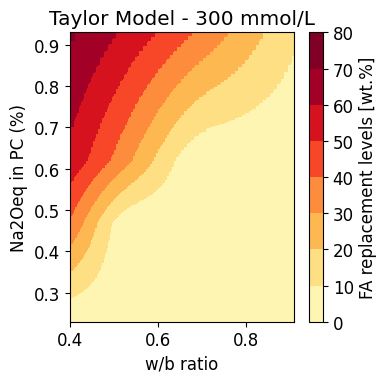

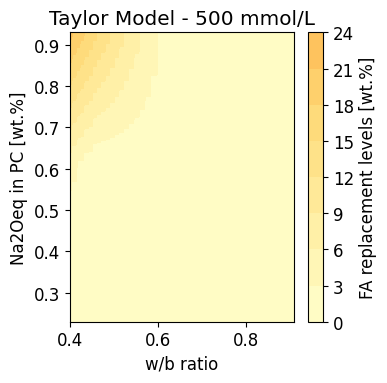

In [ ]:
import math
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import griddata


import math

# Define SCM parameters
scm_parameters = {
    'FA': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0.04,
        'total_k_content_water_soluble': 0.03,
        'fraction_of_glass': 0.8,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.81,
        'm_tot_SCM_K': 2.74
    },
    'MK': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.05,
        'm_tot_SCM_K': 1
    },
    'SF': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.32,
        'm_tot_SCM_K': 0.71
    },
    'slag': {
        'binding_factor_na': 0.08,
        'binding_factor_k': 0.04,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.29,
        'm_tot_SCM_K': 0.38
    }
}

# Define cement parameters
cement_parameters = {
    '0.93': {'m_tot_PC_Na': 0.42, 'm_tot_PC_K': 0.78},
    '0.62': {'m_tot_PC_Na': 0.28, 'm_tot_PC_K': 0.52},
    '0.47': {'m_tot_PC_Na': 0.21, 'm_tot_PC_K': 0.39},
    '0.23': {'m_tot_PC_Na': 0.105, 'm_tot_PC_K': 0.195}
}


def get_scm_parameters(scm_type):
    return scm_parameters.get(scm_type, {})

def get_cement_parameters(alkali_content):
    return cement_parameters.get(alkali_content, {})

def calculate_dor_scm(scm_type_for_dor, replacement_level, time):
    if scm_type_for_dor == 'FA_RILEM':
        dor_scm = replacement_level * (0.49993 - 0.0041 * replacement_level)
    elif scm_type_for_dor == 'FA_Taylor':
        fraction_of_glass = scm_parameters['FA']['fraction_of_glass']
        dor_scm = fraction_of_glass * replacement_level * (1 - math.exp(-(0.043 - (replacement_level * fraction_of_glass * 0.0005)) * time ** (0.585 - (replacement_level * fraction_of_glass * 0.0005))))
    elif scm_type_for_dor == 'SF':
        dor_scm = replacement_level
    elif scm_type_for_dor == 'slag':
        dor_scm = replacement_level * 0.7
    elif scm_type_for_dor == 'MK':
        if replacement_level <= 5:
            dor_scm = replacement_level
        elif replacement_level <= 35:
            dor_scm = replacement_level * (100 - ((replacement_level - 5) * 60 / 30)) / 100
        else:
            dor_scm = replacement_level * 40 / 100
    else:
        dor_scm = 0  # Default value if scm_type does not match

    # print(f"Degree of Reaction (DoR) for SCM {scm_type_for_dor}: {dor_scm}")
    return dor_scm

def calculate_na_k_concentration(replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor):
    scm_params = get_scm_parameters(scm_type_for_parameters)
    cement_params = get_cement_parameters(alkali_content)

    binding_factor_na = scm_params['binding_factor_na']
    binding_factor_k = scm_params['binding_factor_k']
    total_na_content_water_soluble = scm_params['total_na_content_water_soluble']
    total_k_content_water_soluble = scm_params['total_k_content_water_soluble']
    fraction_of_glass = scm_params['fraction_of_glass']
    g_bound_water_per_g_reacted_scm = scm_params['g_bound_water_per_g_reacted_scm']
    m_tot_SCM_Na = scm_params['m_tot_SCM_Na']
    m_tot_SCM_K = scm_params['m_tot_SCM_K']

    m_tot_PC_Na = cement_params['m_tot_PC_Na']
    m_tot_PC_K = cement_params['m_tot_PC_K']

    dor_scm = calculate_dor_scm(scm_type_for_dor, replacement_level, time)

    na_mass = 23.0  # [g/mol]
    k_mass = 39.1   # [g/mol]
    na2o_mass = 62.0  # [g/mol]
    k2o_mass = 94.2   # [g/mol]

    # Calculate F functions
    F_C4AF = 1 - math.exp(-(0.55 + (0.012 * replacement_level)) * (time - 0.9) ** 0.26)
    F_C3A = 1 - math.exp(-(0.77 + (0.008 * replacement_level)) * (time - 0.9) ** 0.28)
    F_C2S = 1 - math.exp(-(0.12 - (0.0007 * replacement_level)) * time ** (0.46 - (0.002 * replacement_level)))
    F_C3S = 1 - math.exp(-(0.7 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)

    # print(f"F_C4AF: {F_C4AF}, F_C3A: {F_C3A}, F_C2S: {F_C2S}, F_C3S: {F_C3S}")

    # F_CRP function
    F_CRP = ((100 - replacement_level) / 100) * replacement_level ** 0.09 * (1 - math.exp(-(0.56 - (0.0043 * replacement_level)) * (time - 0.9) ** 0.25))
    # print(f"F_CRP: {F_CRP}")

    # Fractions for Alite, Belite, Aluminate, Ferrite
    na2o_fractions = {'Alite': 0.44, 'Belite': 0.17, 'Aluminate': 0.36, 'Ferrite': 0.03}
    k2o_fractions = {'Alite': 0.29, 'Belite': 0.41, 'Aluminate': 0.27, 'Ferrite': 0.03}

    # Calculate m_r_Na from PC
    total_na_content_water_soluble_PC = 35

    m_r_na_from_pc = (
        (m_tot_PC_Na * total_na_content_water_soluble_PC / 100) +
        (F_C3S * na2o_fractions['Alite'] + F_C2S * na2o_fractions['Belite'] + F_C3A * na2o_fractions['Aluminate'] + F_C4AF * na2o_fractions['Ferrite']) *
        (1 - total_na_content_water_soluble_PC / 100) * m_tot_PC_Na
    ) * ((100 - replacement_level) / 100) * 2 / na2o_mass
    # print(f"m_r_na_from_pc: {m_r_na_from_pc}")

    # Calculate m_r_Na from SCM
    m_r_na_from_scm = (
        (total_na_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_Na - total_na_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / na2o_mass
    # print(f"m_r_na_from_scm: {m_r_na_from_scm}")


    # Calculate V(t) pore solution
    V_b_t = 31.6 * ((100 - replacement_level) / 100) * (1 - math.exp(-(0.69 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)) + g_bound_water_per_g_reacted_scm * dor_scm
    V_t_pore_solution = (w_b_ratio * 100) - V_b_t
    # print(f"V_b_t: {V_b_t}, V_t_pore_solution: {V_t_pore_solution}")

    # Calculate Na concentration
    b_pc_na = 0.031
    na_concentration = ((m_r_na_from_pc + m_r_na_from_scm) * 1000 / (V_t_pore_solution +
     (b_pc_na * 1000 * F_CRP) +binding_factor_na * 10 * dor_scm)) * 1000
    # print(f"na_concentration: {na_concentration}")



    # Calculate K concentration
    total_k_content_water_soluble_PC = 70

    m_r_k_from_pc = (
        (m_tot_PC_K * total_k_content_water_soluble_PC/ 100) +
        (F_C3S * k2o_fractions['Alite'] + F_C2S * k2o_fractions['Belite'] + F_C3A * k2o_fractions['Aluminate'] + F_C4AF * k2o_fractions['Ferrite']) *
        (1 - total_k_content_water_soluble_PC / 100) * m_tot_PC_K
    ) * ((100 - replacement_level) / 100) * 2 / k2o_mass
    # print(f"m_r_k_from_pc: {m_r_k_from_pc}")


    m_r_k_from_scm = (
        (total_k_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_K - total_k_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / k2o_mass
    # print(f"m_r_k_from_scm: {m_r_k_from_scm}")

    b_pc_k = 0.02

    k_concentration = ((m_r_k_from_pc + m_r_k_from_scm) * 1000 / (V_t_pore_solution + (b_pc_k * 1000 * F_CRP)
    + binding_factor_k * 10 * dor_scm)) * 1000

    # Calculate total Na+K concentration
    na_k_concentration = na_concentration + k_concentration

    return na_k_concentration, na_concentration, k_concentration

# Constants
scm_type_for_parameters = 'FA'  # SCM type for selecting parameters
scm_type_for_dor = 'FA_RILEM'  # SCM type for calculating DoR
time = 180  # Constant time value

# Define the ranges for the parameters
replacement_levels = np.arange(1, 100)  # Replacement levels from 1 to 40
alkali_contents = ['0.23', '0.47', '0.62', '0.93']  # Different alkali content values
w_b_ratios = np.arange(0.4, 0.91, 0.001)  # w/b ratios from 0.4 to 0.9

# Function to calculate the concentrations for 300 mmol/L
def calculate_replacement_levels_for_concentration(target_concentration, replacement_levels, w_b_ratios, alkali_contents):
    results = []
    for alkali_content in alkali_contents:
        for w_b_ratio in w_b_ratios:
            for replacement_level in replacement_levels:
                na_k_concentration, na_concentration, k_concentration = calculate_na_k_concentration(
                    replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor
                )
                if na_k_concentration <= target_concentration:
                    results.append((w_b_ratio, alkali_content, replacement_level))
                    break
    return results

# Target concentration
target_concentration = 300  # mmol/L

# Calculate the replacement levels
replacement_data = calculate_replacement_levels_for_concentration(target_concentration, replacement_levels, w_b_ratios, alkali_contents)

# Convert to DataFrame
df_replacement = pd.DataFrame(replacement_data, columns=['w/b Ratio', 'Alkali Content', 'Replacement Level'])

# Create meshgrid for plotting
W, A = np.meshgrid(df_replacement['w/b Ratio'].unique(), df_replacement['Alkali Content'].unique().astype(float))

# Interpolate the replacement levels
points = df_replacement[['w/b Ratio', 'Alkali Content']].values
values = df_replacement['Replacement Level'].values
Z = griddata(points, values, (W, A), method='linear', fill_value=0)

# Create contour plots for the Taylor model (Alkali Limit: 300 mmol/L)
plt.figure(figsize=(4, 4))
contour_plot1 = plt.contourf(W, A, Z, cmap='YlOrRd', vmin=0, vmax=70)
plt.colorbar(label='FA replacement levels [wt.%]', extend='both')
plt.title('Taylor Model - 300 mmol/L')
plt.xlabel('w/b ratio')
plt.ylabel('Na2Oeq in PC (%)')

plt.tight_layout()
plt.show()


# Target concentration
target_concentration = 500  # mmol/L

# Calculate the replacement levels
replacement_data = calculate_replacement_levels_for_concentration(target_concentration, replacement_levels, w_b_ratios, alkali_contents)

# Convert to DataFrame
df_replacement = pd.DataFrame(replacement_data, columns=['w/b Ratio', 'Alkali Content', 'Replacement Level'])

# Create meshgrid for plotting
W, A = np.meshgrid(df_replacement['w/b Ratio'].unique(), df_replacement['Alkali Content'].unique().astype(float))

# Interpolate the replacement levels
points = df_replacement[['w/b Ratio', 'Alkali Content']].values
values = df_replacement['Replacement Level'].values
Z = griddata(points, values, (W, A), method='linear', fill_value=0)

# Create contour plots for the Taylor model (Alkali Limit: 300 mmol/L)
plt.figure(figsize=(4, 4))
contour_plot1 = plt.contourf(W, A, Z, cmap='YlOrRd', vmin=0, vmax=70)
plt.colorbar(label='FA replacement levels [wt.%]', extend='both')
plt.title('Taylor Model - 500 mmol/L')
plt.xlabel('w/b ratio')
plt.ylabel('Na2Oeq in PC [wt.%]')

plt.tight_layout()
plt.show()


In [ ]:
# Function to get the closest replacement levels for given w/b ratio and alkali content
def get_closest_replacement_levels(df_replacement, w_b_ratio, alkali_content, tolerance=0.01):
    specific_values = df_replacement[(df_replacement['w/b Ratio'].between(w_b_ratio - tolerance, w_b_ratio + tolerance)) &
                                     (df_replacement['Alkali Content'] == alkali_content)]
    return specific_values

# Get the closest replacement levels for w/b ratio around 0.5 and Na2Oeq of 0.93 for both cases
w_b_ratio = 0.9
alkali_content = '0.93'
tolerance = 0.01

# Target concentration 300 mmol/L
target_concentration = 300  # mmol/L
replacement_data_300 = calculate_replacement_levels_for_concentration(target_concentration, replacement_levels, w_b_ratios, alkali_contents)
df_replacement_300 = pd.DataFrame(replacement_data_300, columns=['w/b Ratio', 'Alkali Content', 'Replacement Level'])
closest_values_300 = get_closest_replacement_levels(df_replacement_300, w_b_ratio, alkali_content, tolerance)

# Target concentration 500 mmol/L
target_concentration = 500  # mmol/L
replacement_data_500 = calculate_replacement_levels_for_concentration(target_concentration, replacement_levels, w_b_ratios, alkali_contents)
df_replacement_500 = pd.DataFrame(replacement_data_500, columns=['w/b Ratio', 'Alkali Content', 'Replacement Level'])
closest_values_500 = get_closest_replacement_levels(df_replacement_500, w_b_ratio, alkali_content, tolerance)

closest_values_300, closest_values_500


(      w/b Ratio Alkali Content  Replacement Level
 2020      0.890           0.93                 14
 2021      0.891           0.93                 14
 2022      0.892           0.93                 14
 2023      0.893           0.93                 13
 2024      0.894           0.93                 13
 2025      0.895           0.93                 13
 2026      0.896           0.93                 13
 2027      0.897           0.93                 13
 2028      0.898           0.93                 13
 2029      0.899           0.93                 13
 2030      0.900           0.93                 13
 2031      0.901           0.93                 13
 2032      0.902           0.93                 12
 2033      0.903           0.93                 12
 2034      0.904           0.93                 12
 2035      0.905           0.93                 12
 2036      0.906           0.93                 12
 2037      0.907           0.93                 12
 2038      0.908           0.93

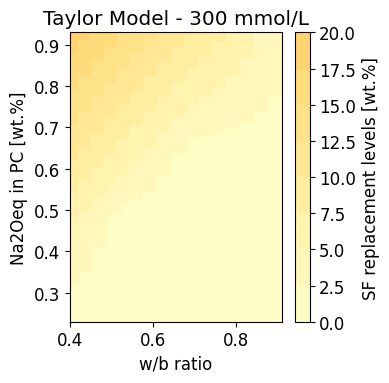

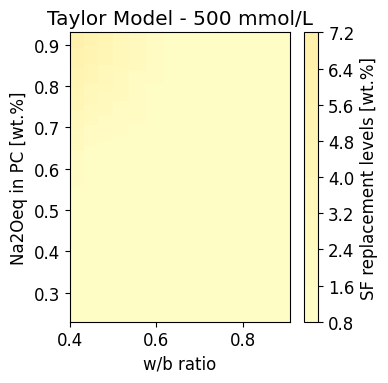

In [ ]:
import math
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import griddata


import math

# Define SCM parameters
scm_parameters = {
    'FA': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0.04,
        'total_k_content_water_soluble': 0.03,
        'fraction_of_glass': 0.8,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.81,
        'm_tot_SCM_K': 2.74
    },
    'MK': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.05,
        'm_tot_SCM_K': 1
    },
    'SF': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.32,
        'm_tot_SCM_K': 0.71
    },
    'slag': {
        'binding_factor_na': 0.08,
        'binding_factor_k': 0.04,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.29,
        'm_tot_SCM_K': 0.38
    }
}

# Define cement parameters
cement_parameters = {
    '0.93': {'m_tot_PC_Na': 0.42, 'm_tot_PC_K': 0.78},
    '0.62': {'m_tot_PC_Na': 0.28, 'm_tot_PC_K': 0.52},
    '0.47': {'m_tot_PC_Na': 0.21, 'm_tot_PC_K': 0.39},
    '0.23': {'m_tot_PC_Na': 0.105, 'm_tot_PC_K': 0.195}
}


def get_scm_parameters(scm_type):
    return scm_parameters.get(scm_type, {})

def get_cement_parameters(alkali_content):
    return cement_parameters.get(alkali_content, {})

def calculate_dor_scm(scm_type_for_dor, replacement_level, time):
    if scm_type_for_dor == 'FA_RILEM':
        dor_scm = replacement_level * (0.49993 - 0.0041 * replacement_level)
    elif scm_type_for_dor == 'FA_Taylor':
        fraction_of_glass = scm_parameters['FA']['fraction_of_glass']
        dor_scm = fraction_of_glass * replacement_level * (1 - math.exp(-(0.043 - (replacement_level * fraction_of_glass * 0.0005)) * time ** (0.585 - (replacement_level * fraction_of_glass * 0.0005))))
    elif scm_type_for_dor == 'SF':
        dor_scm = replacement_level
    elif scm_type_for_dor == 'slag':
        dor_scm = replacement_level * 0.7
    elif scm_type_for_dor == 'MK':
        if replacement_level <= 5:
            dor_scm = replacement_level
        elif replacement_level <= 35:
            dor_scm = replacement_level * (100 - ((replacement_level - 5) * 60 / 30)) / 100
        else:
            dor_scm = replacement_level * 40 / 100
    else:
        dor_scm = 0  # Default value if scm_type does not match

    # print(f"Degree of Reaction (DoR) for SCM {scm_type_for_dor}: {dor_scm}")
    return dor_scm

def calculate_na_k_concentration(replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor):
    scm_params = get_scm_parameters(scm_type_for_parameters)
    cement_params = get_cement_parameters(alkali_content)

    binding_factor_na = scm_params['binding_factor_na']
    binding_factor_k = scm_params['binding_factor_k']
    total_na_content_water_soluble = scm_params['total_na_content_water_soluble']
    total_k_content_water_soluble = scm_params['total_k_content_water_soluble']
    fraction_of_glass = scm_params['fraction_of_glass']
    g_bound_water_per_g_reacted_scm = scm_params['g_bound_water_per_g_reacted_scm']
    m_tot_SCM_Na = scm_params['m_tot_SCM_Na']
    m_tot_SCM_K = scm_params['m_tot_SCM_K']

    m_tot_PC_Na = cement_params['m_tot_PC_Na']
    m_tot_PC_K = cement_params['m_tot_PC_K']

    dor_scm = calculate_dor_scm(scm_type_for_dor, replacement_level, time)

    na_mass = 23.0  # [g/mol]
    k_mass = 39.1   # [g/mol]
    na2o_mass = 62.0  # [g/mol]
    k2o_mass = 94.2   # [g/mol]

    # Calculate F functions
    F_C4AF = 1 - math.exp(-(0.55 + (0.012 * replacement_level)) * (time - 0.9) ** 0.26)
    F_C3A = 1 - math.exp(-(0.77 + (0.008 * replacement_level)) * (time - 0.9) ** 0.28)
    F_C2S = 1 - math.exp(-(0.12 - (0.0007 * replacement_level)) * time ** (0.46 - (0.002 * replacement_level)))
    F_C3S = 1 - math.exp(-(0.7 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)

    # print(f"F_C4AF: {F_C4AF}, F_C3A: {F_C3A}, F_C2S: {F_C2S}, F_C3S: {F_C3S}")

    # F_CRP function
    F_CRP = ((100 - replacement_level) / 100) * replacement_level ** 0.09 * (1 - math.exp(-(0.56 - (0.0043 * replacement_level)) * (time - 0.9) ** 0.25))
    # print(f"F_CRP: {F_CRP}")

    # Fractions for Alite, Belite, Aluminate, Ferrite
    na2o_fractions = {'Alite': 0.44, 'Belite': 0.17, 'Aluminate': 0.36, 'Ferrite': 0.03}
    k2o_fractions = {'Alite': 0.29, 'Belite': 0.41, 'Aluminate': 0.27, 'Ferrite': 0.03}

    # Calculate m_r_Na from PC
    total_na_content_water_soluble_PC = 35

    m_r_na_from_pc = (
        (m_tot_PC_Na * total_na_content_water_soluble_PC / 100) +
        (F_C3S * na2o_fractions['Alite'] + F_C2S * na2o_fractions['Belite'] + F_C3A * na2o_fractions['Aluminate'] + F_C4AF * na2o_fractions['Ferrite']) *
        (1 - total_na_content_water_soluble_PC / 100) * m_tot_PC_Na
    ) * ((100 - replacement_level) / 100) * 2 / na2o_mass
    # print(f"m_r_na_from_pc: {m_r_na_from_pc}")

    # Calculate m_r_Na from SCM
    m_r_na_from_scm = (
        (total_na_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_Na - total_na_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / na2o_mass
    # print(f"m_r_na_from_scm: {m_r_na_from_scm}")


    # Calculate V(t) pore solution
    V_b_t = 31.6 * ((100 - replacement_level) / 100) * (1 - math.exp(-(0.69 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)) + g_bound_water_per_g_reacted_scm * dor_scm
    V_t_pore_solution = (w_b_ratio * 100) - V_b_t
    # print(f"V_b_t: {V_b_t}, V_t_pore_solution: {V_t_pore_solution}")

    # Calculate Na concentration
    b_pc_na = 0.031
    na_concentration = ((m_r_na_from_pc + m_r_na_from_scm) * 1000 / (V_t_pore_solution +
     (b_pc_na * 1000 * F_CRP) +binding_factor_na * 10 * dor_scm)) * 1000
    # print(f"na_concentration: {na_concentration}")



    # Calculate K concentration
    total_k_content_water_soluble_PC = 70

    m_r_k_from_pc = (
        (m_tot_PC_K * total_k_content_water_soluble_PC/ 100) +
        (F_C3S * k2o_fractions['Alite'] + F_C2S * k2o_fractions['Belite'] + F_C3A * k2o_fractions['Aluminate'] + F_C4AF * k2o_fractions['Ferrite']) *
        (1 - total_k_content_water_soluble_PC / 100) * m_tot_PC_K
    ) * ((100 - replacement_level) / 100) * 2 / k2o_mass
    # print(f"m_r_k_from_pc: {m_r_k_from_pc}")


    m_r_k_from_scm = (
        (total_k_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_K - total_k_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / k2o_mass
    # print(f"m_r_k_from_scm: {m_r_k_from_scm}")

    b_pc_k = 0.02

    k_concentration = ((m_r_k_from_pc + m_r_k_from_scm) * 1000 / (V_t_pore_solution + (b_pc_k * 1000 * F_CRP)
    + binding_factor_k * 10 * dor_scm)) * 1000

    # Calculate total Na+K concentration
    na_k_concentration = na_concentration + k_concentration

    return na_k_concentration, na_concentration, k_concentration

# Constants
scm_type_for_parameters = 'SF'  # SCM type for selecting parameters
scm_type_for_dor = 'SF'  # SCM type for calculating DoR
time = 180  # Constant time value

# Define the ranges for the parameters
replacement_levels = np.arange(1, 100)  # Replacement levels from 1 to 40
alkali_contents = ['0.23', '0.47', '0.62', '0.93']  # Different alkali content values
w_b_ratios = np.arange(0.4, 0.91, 0.001)  # w/b ratios from 0.4 to 0.9

# Function to calculate the concentrations for 300 mmol/L
def calculate_replacement_levels_for_concentration(target_concentration, replacement_levels, w_b_ratios, alkali_contents):
    results = []
    for alkali_content in alkali_contents:
        for w_b_ratio in w_b_ratios:
            for replacement_level in replacement_levels:
                na_k_concentration, na_concentration, k_concentration = calculate_na_k_concentration(
                    replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor
                )
                if na_k_concentration <= target_concentration:
                    results.append((w_b_ratio, alkali_content, replacement_level))
                    break
    return results

# Target concentration
target_concentration = 300  # mmol/L

# Calculate the replacement levels
replacement_data = calculate_replacement_levels_for_concentration(target_concentration, replacement_levels, w_b_ratios, alkali_contents)

# Convert to DataFrame
df_replacement = pd.DataFrame(replacement_data, columns=['w/b Ratio', 'Alkali Content', 'Replacement Level'])

# Create meshgrid for plotting
W, A = np.meshgrid(df_replacement['w/b Ratio'].unique(), df_replacement['Alkali Content'].unique().astype(float))

# Interpolate the replacement levels
points = df_replacement[['w/b Ratio', 'Alkali Content']].values
values = df_replacement['Replacement Level'].values
Z = griddata(points, values, (W, A), method='linear', fill_value=0)

# Create contour plots for the Taylor model (Alkali Limit: 300 mmol/L)
plt.figure(figsize=(4, 4))
contour_plot1 = plt.contourf(W, A, Z, cmap='YlOrRd', vmin=0, vmax=70)
plt.colorbar(label='SF replacement levels [wt.%]', extend='both')
plt.title('Taylor Model - 300 mmol/L')
plt.xlabel('w/b ratio')
plt.ylabel('Na2Oeq in PC [wt.%]')

plt.tight_layout()
plt.show()


# Target concentration
target_concentration = 500  # mmol/L

# Calculate the replacement levels
replacement_data = calculate_replacement_levels_for_concentration(target_concentration, replacement_levels, w_b_ratios, alkali_contents)

# Convert to DataFrame
df_replacement = pd.DataFrame(replacement_data, columns=['w/b Ratio', 'Alkali Content', 'Replacement Level'])

# Create meshgrid for plotting
W, A = np.meshgrid(df_replacement['w/b Ratio'].unique(), df_replacement['Alkali Content'].unique().astype(float))

# Interpolate the replacement levels
points = df_replacement[['w/b Ratio', 'Alkali Content']].values
values = df_replacement['Replacement Level'].values
Z = griddata(points, values, (W, A), method='linear', fill_value=0)

# Create contour plots for the Taylor model (Alkali Limit: 300 mmol/L)
plt.figure(figsize=(4, 4))
contour_plot1 = plt.contourf(W, A, Z, cmap='YlOrRd', vmin=0, vmax=70)
plt.colorbar(label='SF replacement levels [wt.%]', extend='both')
plt.title('Taylor Model - 500 mmol/L')
plt.xlabel('w/b ratio')
plt.ylabel('Na2Oeq in PC [wt.%]')

plt.tight_layout()
plt.show()


In [ ]:
# Function to get the closest replacement levels for given w/b ratio and alkali content
def get_closest_replacement_levels(df_replacement, w_b_ratio, alkali_content, tolerance=0.01):
    specific_values = df_replacement[(df_replacement['w/b Ratio'].between(w_b_ratio - tolerance, w_b_ratio + tolerance)) &
                                     (df_replacement['Alkali Content'] == alkali_content)]
    return specific_values

# Get the closest replacement levels for w/b ratio around 0.5 and Na2Oeq of 0.93 for both cases
w_b_ratio = 0.9
alkali_content = '0.93'
tolerance = 0.01

# Target concentration 300 mmol/L
target_concentration = 300  # mmol/L
replacement_data_300 = calculate_replacement_levels_for_concentration(target_concentration, replacement_levels, w_b_ratios, alkali_contents)
df_replacement_300 = pd.DataFrame(replacement_data_300, columns=['w/b Ratio', 'Alkali Content', 'Replacement Level'])
closest_values_300 = get_closest_replacement_levels(df_replacement_300, w_b_ratio, alkali_content, tolerance)

# Target concentration 500 mmol/L
target_concentration = 500  # mmol/L
replacement_data_500 = calculate_replacement_levels_for_concentration(target_concentration, replacement_levels, w_b_ratios, alkali_contents)
df_replacement_500 = pd.DataFrame(replacement_data_500, columns=['w/b Ratio', 'Alkali Content', 'Replacement Level'])
closest_values_500 = get_closest_replacement_levels(df_replacement_500, w_b_ratio, alkali_content, tolerance)

closest_values_300, closest_values_500


(      w/b Ratio Alkali Content  Replacement Level
 2020      0.890           0.93                  4
 2021      0.891           0.93                  4
 2022      0.892           0.93                  4
 2023      0.893           0.93                  4
 2024      0.894           0.93                  4
 2025      0.895           0.93                  4
 2026      0.896           0.93                  4
 2027      0.897           0.93                  4
 2028      0.898           0.93                  4
 2029      0.899           0.93                  4
 2030      0.900           0.93                  4
 2031      0.901           0.93                  4
 2032      0.902           0.93                  4
 2033      0.903           0.93                  4
 2034      0.904           0.93                  4
 2035      0.905           0.93                  4
 2036      0.906           0.93                  4
 2037      0.907           0.93                  4
 2038      0.908           0.93

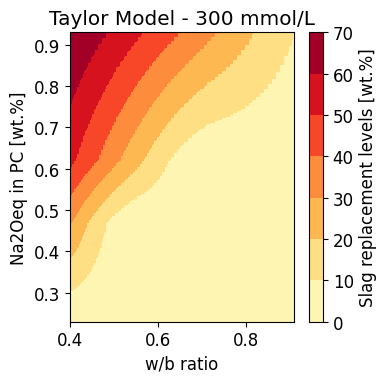

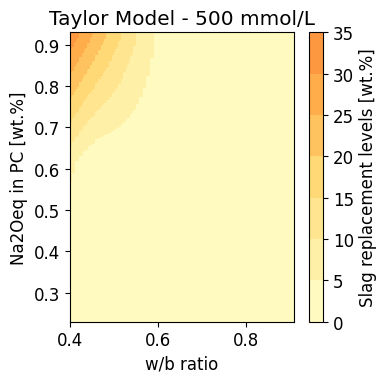

In [ ]:
import math
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import griddata


import math

# Define SCM parameters
scm_parameters = {
    'FA': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0.04,
        'total_k_content_water_soluble': 0.03,
        'fraction_of_glass': 0.8,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.81,
        'm_tot_SCM_K': 2.74
    },
    'MK': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.05,
        'm_tot_SCM_K': 1
    },
    'SF': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.32,
        'm_tot_SCM_K': 0.71
    },
    'slag': {
        'binding_factor_na': 0.08,
        'binding_factor_k': 0.04,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.29,
        'm_tot_SCM_K': 0.38
    }
}

# Define cement parameters
cement_parameters = {
    '0.93': {'m_tot_PC_Na': 0.42, 'm_tot_PC_K': 0.78},
    '0.62': {'m_tot_PC_Na': 0.28, 'm_tot_PC_K': 0.52},
    '0.47': {'m_tot_PC_Na': 0.21, 'm_tot_PC_K': 0.39},
    '0.23': {'m_tot_PC_Na': 0.105, 'm_tot_PC_K': 0.195}
}


def get_scm_parameters(scm_type):
    return scm_parameters.get(scm_type, {})

def get_cement_parameters(alkali_content):
    return cement_parameters.get(alkali_content, {})

def calculate_dor_scm(scm_type_for_dor, replacement_level, time):
    if scm_type_for_dor == 'FA_RILEM':
        dor_scm = replacement_level * (0.49993 - 0.0041 * replacement_level)
    elif scm_type_for_dor == 'FA_Taylor':
        fraction_of_glass = scm_parameters['FA']['fraction_of_glass']
        dor_scm = fraction_of_glass * replacement_level * (1 - math.exp(-(0.043 - (replacement_level * fraction_of_glass * 0.0005)) * time ** (0.585 - (replacement_level * fraction_of_glass * 0.0005))))
    elif scm_type_for_dor == 'SF':
        dor_scm = replacement_level
    elif scm_type_for_dor == 'slag':
        dor_scm = replacement_level * 0.7
    elif scm_type_for_dor == 'MK':
        if replacement_level <= 5:
            dor_scm = replacement_level
        elif replacement_level <= 35:
            dor_scm = replacement_level * (100 - ((replacement_level - 5) * 60 / 30)) / 100
        else:
            dor_scm = replacement_level * 40 / 100
    else:
        dor_scm = 0  # Default value if scm_type does not match

    # print(f"Degree of Reaction (DoR) for SCM {scm_type_for_dor}: {dor_scm}")
    return dor_scm

def calculate_na_k_concentration(replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor):
    scm_params = get_scm_parameters(scm_type_for_parameters)
    cement_params = get_cement_parameters(alkali_content)

    binding_factor_na = scm_params['binding_factor_na']
    binding_factor_k = scm_params['binding_factor_k']
    total_na_content_water_soluble = scm_params['total_na_content_water_soluble']
    total_k_content_water_soluble = scm_params['total_k_content_water_soluble']
    fraction_of_glass = scm_params['fraction_of_glass']
    g_bound_water_per_g_reacted_scm = scm_params['g_bound_water_per_g_reacted_scm']
    m_tot_SCM_Na = scm_params['m_tot_SCM_Na']
    m_tot_SCM_K = scm_params['m_tot_SCM_K']

    m_tot_PC_Na = cement_params['m_tot_PC_Na']
    m_tot_PC_K = cement_params['m_tot_PC_K']

    dor_scm = calculate_dor_scm(scm_type_for_dor, replacement_level, time)

    na_mass = 23.0  # [g/mol]
    k_mass = 39.1   # [g/mol]
    na2o_mass = 62.0  # [g/mol]
    k2o_mass = 94.2   # [g/mol]

    # Calculate F functions
    F_C4AF = 1 - math.exp(-(0.55 + (0.012 * replacement_level)) * (time - 0.9) ** 0.26)
    F_C3A = 1 - math.exp(-(0.77 + (0.008 * replacement_level)) * (time - 0.9) ** 0.28)
    F_C2S = 1 - math.exp(-(0.12 - (0.0007 * replacement_level)) * time ** (0.46 - (0.002 * replacement_level)))
    F_C3S = 1 - math.exp(-(0.7 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)

    # print(f"F_C4AF: {F_C4AF}, F_C3A: {F_C3A}, F_C2S: {F_C2S}, F_C3S: {F_C3S}")

    # F_CRP function
    F_CRP = ((100 - replacement_level) / 100) * replacement_level ** 0.09 * (1 - math.exp(-(0.56 - (0.0043 * replacement_level)) * (time - 0.9) ** 0.25))
    # print(f"F_CRP: {F_CRP}")

    # Fractions for Alite, Belite, Aluminate, Ferrite
    na2o_fractions = {'Alite': 0.44, 'Belite': 0.17, 'Aluminate': 0.36, 'Ferrite': 0.03}
    k2o_fractions = {'Alite': 0.29, 'Belite': 0.41, 'Aluminate': 0.27, 'Ferrite': 0.03}

    # Calculate m_r_Na from PC
    total_na_content_water_soluble_PC = 35

    m_r_na_from_pc = (
        (m_tot_PC_Na * total_na_content_water_soluble_PC / 100) +
        (F_C3S * na2o_fractions['Alite'] + F_C2S * na2o_fractions['Belite'] + F_C3A * na2o_fractions['Aluminate'] + F_C4AF * na2o_fractions['Ferrite']) *
        (1 - total_na_content_water_soluble_PC / 100) * m_tot_PC_Na
    ) * ((100 - replacement_level) / 100) * 2 / na2o_mass
    # print(f"m_r_na_from_pc: {m_r_na_from_pc}")

    # Calculate m_r_Na from SCM
    m_r_na_from_scm = (
        (total_na_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_Na - total_na_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / na2o_mass
    # print(f"m_r_na_from_scm: {m_r_na_from_scm}")


    # Calculate V(t) pore solution
    V_b_t = 31.6 * ((100 - replacement_level) / 100) * (1 - math.exp(-(0.69 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)) + g_bound_water_per_g_reacted_scm * dor_scm
    V_t_pore_solution = (w_b_ratio * 100) - V_b_t
    # print(f"V_b_t: {V_b_t}, V_t_pore_solution: {V_t_pore_solution}")

    # Calculate Na concentration
    b_pc_na = 0.031
    na_concentration = ((m_r_na_from_pc + m_r_na_from_scm) * 1000 / (V_t_pore_solution +
     (b_pc_na * 1000 * F_CRP) +binding_factor_na * 10 * dor_scm)) * 1000
    # print(f"na_concentration: {na_concentration}")



    # Calculate K concentration
    total_k_content_water_soluble_PC = 70

    m_r_k_from_pc = (
        (m_tot_PC_K * total_k_content_water_soluble_PC/ 100) +
        (F_C3S * k2o_fractions['Alite'] + F_C2S * k2o_fractions['Belite'] + F_C3A * k2o_fractions['Aluminate'] + F_C4AF * k2o_fractions['Ferrite']) *
        (1 - total_k_content_water_soluble_PC / 100) * m_tot_PC_K
    ) * ((100 - replacement_level) / 100) * 2 / k2o_mass
    # print(f"m_r_k_from_pc: {m_r_k_from_pc}")


    m_r_k_from_scm = (
        (total_k_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_K - total_k_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / k2o_mass
    # print(f"m_r_k_from_scm: {m_r_k_from_scm}")

    b_pc_k = 0.02

    k_concentration = ((m_r_k_from_pc + m_r_k_from_scm) * 1000 / (V_t_pore_solution + (b_pc_k * 1000 * F_CRP)
    + binding_factor_k * 10 * dor_scm)) * 1000

    # Calculate total Na+K concentration
    na_k_concentration = na_concentration + k_concentration

    return na_k_concentration, na_concentration, k_concentration

# Constants
scm_type_for_parameters = 'slag'  # SCM type for selecting parameters
scm_type_for_dor = 'slag'  # SCM type for calculating DoR
time = 180  # Constant time value

# Define the ranges for the parameters
replacement_levels = np.arange(1, 100)  # Replacement levels from 1 to 40
alkali_contents = ['0.23', '0.47', '0.62', '0.93']  # Different alkali content values
w_b_ratios = np.arange(0.4, 0.91, 0.001)  # w/b ratios from 0.4 to 0.9

# Function to calculate the concentrations for 300 mmol/L
def calculate_replacement_levels_for_concentration(target_concentration, replacement_levels, w_b_ratios, alkali_contents):
    results = []
    for alkali_content in alkali_contents:
        for w_b_ratio in w_b_ratios:
            for replacement_level in replacement_levels:
                na_k_concentration, na_concentration, k_concentration = calculate_na_k_concentration(
                    replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor
                )
                if na_k_concentration <= target_concentration:
                    results.append((w_b_ratio, alkali_content, replacement_level))
                    break
    return results

# Target concentration
target_concentration = 300  # mmol/L

# Calculate the replacement levels
replacement_data = calculate_replacement_levels_for_concentration(target_concentration, replacement_levels, w_b_ratios, alkali_contents)

# Convert to DataFrame
df_replacement = pd.DataFrame(replacement_data, columns=['w/b Ratio', 'Alkali Content', 'Replacement Level'])

# Create meshgrid for plotting
W, A = np.meshgrid(df_replacement['w/b Ratio'].unique(), df_replacement['Alkali Content'].unique().astype(float))

# Interpolate the replacement levels
points = df_replacement[['w/b Ratio', 'Alkali Content']].values
values = df_replacement['Replacement Level'].values
Z = griddata(points, values, (W, A), method='linear', fill_value=0)

# Create contour plots for the Taylor model (Alkali Limit: 300 mmol/L)
plt.figure(figsize=(4, 4))
contour_plot1 = plt.contourf(W, A, Z, cmap='YlOrRd', vmin=0, vmax=70)
plt.colorbar(label='Slag replacement levels [wt.%]', extend='both')
plt.title('Taylor Model - 300 mmol/L')
plt.xlabel('w/b ratio')
plt.ylabel('Na2Oeq in PC [wt.%]')

plt.tight_layout()
plt.show()


# Target concentration
target_concentration = 500  # mmol/L

# Calculate the replacement levels
replacement_data = calculate_replacement_levels_for_concentration(target_concentration, replacement_levels, w_b_ratios, alkali_contents)

# Convert to DataFrame
df_replacement = pd.DataFrame(replacement_data, columns=['w/b Ratio', 'Alkali Content', 'Replacement Level'])

# Create meshgrid for plotting
W, A = np.meshgrid(df_replacement['w/b Ratio'].unique(), df_replacement['Alkali Content'].unique().astype(float))

# Interpolate the replacement levels
points = df_replacement[['w/b Ratio', 'Alkali Content']].values
values = df_replacement['Replacement Level'].values
Z = griddata(points, values, (W, A), method='linear', fill_value=0)

# Create contour plots for the Taylor model (Alkali Limit: 300 mmol/L)
plt.figure(figsize=(4, 4))
contour_plot1 = plt.contourf(W, A, Z, cmap='YlOrRd', vmin=0, vmax=70)
plt.colorbar(label='Slag replacement levels [wt.%]', extend='both')
plt.title('Taylor Model - 500 mmol/L')
plt.xlabel('w/b ratio')
plt.ylabel('Na2Oeq in PC [wt.%]')

plt.tight_layout()
plt.show()


In [ ]:
# Function to get the closest replacement levels for given w/b ratio and alkali content
def get_closest_replacement_levels(df_replacement, w_b_ratio, alkali_content, tolerance=0.01):
    specific_values = df_replacement[(df_replacement['w/b Ratio'].between(w_b_ratio - tolerance, w_b_ratio + tolerance)) &
                                     (df_replacement['Alkali Content'] == alkali_content)]
    return specific_values

# Get the closest replacement levels for w/b ratio around 0.5 and Na2Oeq of 0.93 for both cases
w_b_ratio = 0.9
alkali_content = '0.93'
tolerance = 0.01

# Target concentration 300 mmol/L
target_concentration = 300  # mmol/L
replacement_data_300 = calculate_replacement_levels_for_concentration(target_concentration, replacement_levels, w_b_ratios, alkali_contents)
df_replacement_300 = pd.DataFrame(replacement_data_300, columns=['w/b Ratio', 'Alkali Content', 'Replacement Level'])
closest_values_300 = get_closest_replacement_levels(df_replacement_300, w_b_ratio, alkali_content, tolerance)

# Target concentration 500 mmol/L
target_concentration = 500  # mmol/L
replacement_data_500 = calculate_replacement_levels_for_concentration(target_concentration, replacement_levels, w_b_ratios, alkali_contents)
df_replacement_500 = pd.DataFrame(replacement_data_500, columns=['w/b Ratio', 'Alkali Content', 'Replacement Level'])
closest_values_500 = get_closest_replacement_levels(df_replacement_500, w_b_ratio, alkali_content, tolerance)

closest_values_300, closest_values_500


(      w/b Ratio Alkali Content  Replacement Level
 2020      0.890           0.93                 12
 2021      0.891           0.93                 12
 2022      0.892           0.93                 12
 2023      0.893           0.93                 12
 2024      0.894           0.93                 12
 2025      0.895           0.93                 11
 2026      0.896           0.93                 11
 2027      0.897           0.93                 11
 2028      0.898           0.93                 11
 2029      0.899           0.93                 11
 2030      0.900           0.93                 11
 2031      0.901           0.93                 11
 2032      0.902           0.93                 11
 2033      0.903           0.93                 11
 2034      0.904           0.93                 10
 2035      0.905           0.93                 10
 2036      0.906           0.93                 10
 2037      0.907           0.93                 10
 2038      0.908           0.93

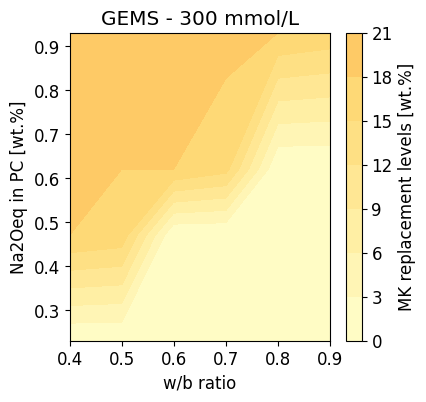

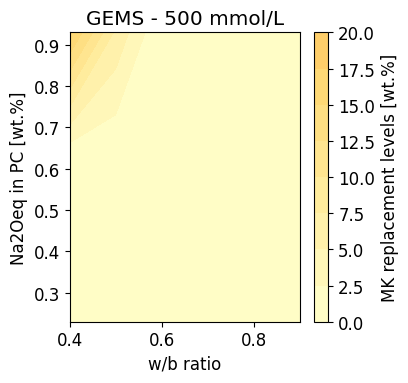

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


# Load the spreadsheet
file_path = '/content/2024-06-05 Ana_wb for different alkali_MK.xlsx'
df = pd.read_excel(file_path, sheet_name='Summary', header=None)

# Extract the required values
w_b_ratios = df.iloc[2, 1:29].values
na2oeq_values = df.iloc[1, 1:29].values

# Extract GEMS data for 300 and 500 mmol/L
replacement_levels_FA_300_GEMS = df.iloc[105, 1:29].values.astype(float)  # Row 106 (0-based index 105)
replacement_levels_FA_500_GEMS = df.iloc[106, 1:29].values.astype(float)  # Row 107 (0-based index 106)


# Remove NaN values
valid_indices_300 = ~np.isnan(replacement_levels_FA_300_GEMS)
valid_indices_500 = ~np.isnan(replacement_levels_FA_500_GEMS)

w_b_ratios_300 = w_b_ratios[valid_indices_300]
na2oeq_values_300 = na2oeq_values[valid_indices_300]
replacement_levels_FA_300_GEMS = replacement_levels_FA_300_GEMS[valid_indices_300]

w_b_ratios_500 = w_b_ratios[valid_indices_500]
na2oeq_values_500 = na2oeq_values[valid_indices_500]
replacement_levels_FA_500_GEMS = replacement_levels_FA_500_GEMS[valid_indices_500]

# Create meshgrid for contour plots
unique_w_b_ratios_300 = np.unique(w_b_ratios_300)
unique_na2oeq_values_300 = np.unique(na2oeq_values_300)
W_b_ratios_300, Na2oeq_values_300 = np.meshgrid(unique_w_b_ratios_300, unique_na2oeq_values_300)

unique_w_b_ratios_500 = np.unique(w_b_ratios_500)
unique_na2oeq_values_500 = np.unique(na2oeq_values_500)
W_b_ratios_500, Na2oeq_values_500 = np.meshgrid(unique_w_b_ratios_500, unique_na2oeq_values_500)

# Create the Z matrix by aligning with the meshgrid
Z_300_GEMS = np.zeros_like(W_b_ratios_300, dtype=float)
Z_500_GEMS = np.zeros_like(W_b_ratios_500, dtype=float)

# Populate Z matrices
for i in range(len(w_b_ratios_300)):
    row = np.where(unique_na2oeq_values_300 == na2oeq_values_300[i])[0][0]
    col = np.where(unique_w_b_ratios_300 == w_b_ratios_300[i])[0][0]
    Z_300_GEMS[row, col] = replacement_levels_FA_300_GEMS[i]

for i in range(len(w_b_ratios_500)):
    row = np.where(unique_na2oeq_values_500 == na2oeq_values_500[i])[0][0]
    col = np.where(unique_w_b_ratios_500 == w_b_ratios_500[i])[0][0]
    Z_500_GEMS[row, col] = replacement_levels_FA_500_GEMS[i]

# Create contour plots for MK (Alkali Limit: 300 mmol/L)
plt.figure(figsize=(4.2, 4))
contour_plot1 = plt.contourf(W_b_ratios_300, Na2oeq_values_300, Z_300_GEMS, cmap='YlOrRd', vmin=0, vmax=65)
plt.colorbar(label='MK replacement levels [wt.%]', extend='both')
plt.title('GEMS - 300 mmol/L')
plt.xlabel('w/b ratio')
plt.ylabel('Na2Oeq in PC [wt.%]')

# Create contour plots for MK (Alkali Limit: 500 mmol/L)
plt.figure(figsize=(4.2, 4))
contour_plot2 = plt.contourf(W_b_ratios_500, Na2oeq_values_500, Z_500_GEMS, cmap='YlOrRd', vmin=0, vmax=65)
plt.colorbar(label='MK replacement levels [wt.%]', extend='both')
plt.title('GEMS - 500 mmol/L')
plt.xlabel('w/b ratio')
plt.ylabel('Na2Oeq in PC [wt.%]')

plt.tight_layout()
plt.show()



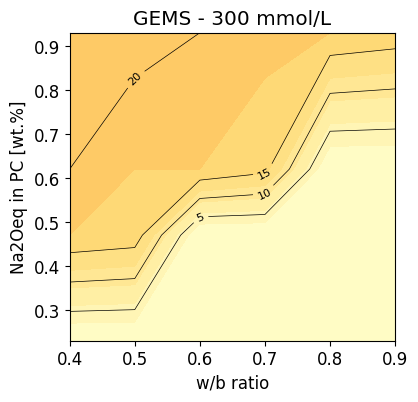

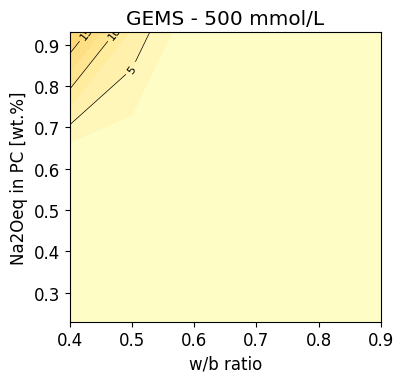

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the spreadsheet
file_path = '/content/2024-06-05 Ana_wb for different alkali_MK.xlsx'
df = pd.read_excel(file_path, sheet_name='Summary', header=None)

# Extract the required values
w_b_ratios = df.iloc[2, 1:29].values
na2oeq_values = df.iloc[1, 1:29].values

# Extract GEMS data for 300 and 500 mmol/L
replacement_levels_FA_300_GEMS = df.iloc[105, 1:29].values.astype(float)  # Row 106 (0-based index 105)
replacement_levels_FA_500_GEMS = df.iloc[106, 1:29].values.astype(float)  # Row 107 (0-based index 106)

# Remove NaN values
valid_indices_300 = ~np.isnan(replacement_levels_FA_300_GEMS)
valid_indices_500 = ~np.isnan(replacement_levels_FA_500_GEMS)

w_b_ratios_300 = w_b_ratios[valid_indices_300]
na2oeq_values_300 = na2oeq_values[valid_indices_300]
replacement_levels_FA_300_GEMS = replacement_levels_FA_300_GEMS[valid_indices_300]

w_b_ratios_500 = w_b_ratios[valid_indices_500]
na2oeq_values_500 = na2oeq_values[valid_indices_500]
replacement_levels_FA_500_GEMS = replacement_levels_FA_500_GEMS[valid_indices_500]

# Create meshgrid for contour plots
unique_w_b_ratios_300 = np.unique(w_b_ratios_300)
unique_na2oeq_values_300 = np.unique(na2oeq_values_300)
W_b_ratios_300, Na2oeq_values_300 = np.meshgrid(unique_w_b_ratios_300, unique_na2oeq_values_300)

unique_w_b_ratios_500 = np.unique(w_b_ratios_500)
unique_na2oeq_values_500 = np.unique(na2oeq_values_500)
W_b_ratios_500, Na2oeq_values_500 = np.meshgrid(unique_w_b_ratios_500, unique_na2oeq_values_500)

# Create the Z matrix by aligning with the meshgrid
Z_300_GEMS = np.zeros_like(W_b_ratios_300, dtype=float)
Z_500_GEMS = np.zeros_like(W_b_ratios_500, dtype=float)

# Populate Z matrices
for i in range(len(w_b_ratios_300)):
    row = np.where(unique_na2oeq_values_300 == na2oeq_values_300[i])[0][0]
    col = np.where(unique_w_b_ratios_300 == w_b_ratios_300[i])[0][0]
    Z_300_GEMS[row, col] = replacement_levels_FA_300_GEMS[i]

for i in range(len(w_b_ratios_500)):
    row = np.where(unique_na2oeq_values_500 == na2oeq_values_500[i])[0][0]
    col = np.where(unique_w_b_ratios_500 == w_b_ratios_500[i])[0][0]
    Z_500_GEMS[row, col] = replacement_levels_FA_500_GEMS[i]

# Create contour plots for MK (Alkali Limit: 300 mmol/L)
plt.figure(figsize=(4.2, 4))
contour_plot1 = plt.contourf(W_b_ratios_300, Na2oeq_values_300, Z_300_GEMS, cmap='YlOrRd', vmin=0, vmax=65)
# plt.colorbar(label='MK Replacement Levels (%)', extend='both')

# Add contour lines
contour_lines_300 = plt.contour(W_b_ratios_300, Na2oeq_values_300, Z_300_GEMS, levels=np.arange(5, 70, 5), colors='black', linewidths=0.5)
plt.clabel(contour_lines_300, inline=True, fontsize=8, fmt='%d')

plt.title('GEMS - 300 mmol/L')
plt.xlabel('w/b ratio')
plt.ylabel('Na2Oeq in PC [wt.%]')

# Create contour plots for MK (Alkali Limit: 500 mmol/L)
plt.figure(figsize=(4.2, 4))
contour_plot2 = plt.contourf(W_b_ratios_500, Na2oeq_values_500, Z_500_GEMS, cmap='YlOrRd', vmin=0, vmax=65)
# plt.colorbar(label='MK Replacement Levels (%)', extend='both')

# Add contour lines
contour_lines_500 = plt.contour(W_b_ratios_500, Na2oeq_values_500, Z_500_GEMS, levels=np.arange(5, 70, 5), colors='black', linewidths=0.5)
plt.clabel(contour_lines_500, inline=True, fontsize=8, fmt='%d')

plt.title('GEMS - 500 mmol/L')
plt.xlabel('w/b ratio')
plt.ylabel('Na2Oeq in PC [wt.%]')

plt.tight_layout()
plt.show()


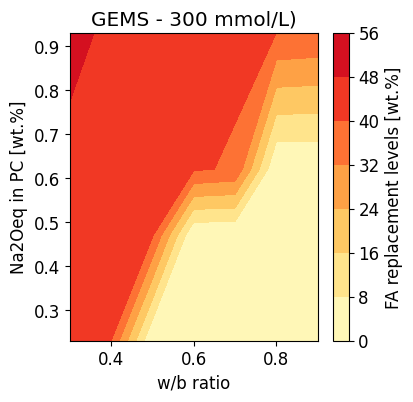

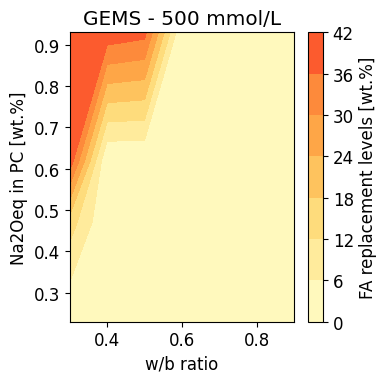

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


# Load the spreadsheet
file_path = '/content/2024-06-05 Ana_wb for different alkali_FA.xlsx'
df = pd.read_excel(file_path, sheet_name='Summary', header=None)

# Extract the required values
w_b_ratios = df.iloc[2, 1:29].values
na2oeq_values = df.iloc[1, 1:29].values

# Extract GEMS data for 300 and 500 mmol/L
replacement_levels_FA_300_GEMS = df.iloc[105, 1:29].values.astype(float)  # Row 106 (0-based index 105)
replacement_levels_FA_500_GEMS = df.iloc[106, 1:29].values.astype(float)  # Row 107 (0-based index 106)


# Remove NaN values
valid_indices_300 = ~np.isnan(replacement_levels_FA_300_GEMS)
valid_indices_500 = ~np.isnan(replacement_levels_FA_500_GEMS)

w_b_ratios_300 = w_b_ratios[valid_indices_300]
na2oeq_values_300 = na2oeq_values[valid_indices_300]
replacement_levels_FA_300_GEMS = replacement_levels_FA_300_GEMS[valid_indices_300]

w_b_ratios_500 = w_b_ratios[valid_indices_500]
na2oeq_values_500 = na2oeq_values[valid_indices_500]
replacement_levels_FA_500_GEMS = replacement_levels_FA_500_GEMS[valid_indices_500]

# Create meshgrid for contour plots
unique_w_b_ratios_300 = np.unique(w_b_ratios_300)
unique_na2oeq_values_300 = np.unique(na2oeq_values_300)
W_b_ratios_300, Na2oeq_values_300 = np.meshgrid(unique_w_b_ratios_300, unique_na2oeq_values_300)

unique_w_b_ratios_500 = np.unique(w_b_ratios_500)
unique_na2oeq_values_500 = np.unique(na2oeq_values_500)
W_b_ratios_500, Na2oeq_values_500 = np.meshgrid(unique_w_b_ratios_500, unique_na2oeq_values_500)

# Create the Z matrix by aligning with the meshgrid
Z_300_GEMS = np.zeros_like(W_b_ratios_300, dtype=float)
Z_500_GEMS = np.zeros_like(W_b_ratios_500, dtype=float)

# Populate Z matrices
for i in range(len(w_b_ratios_300)):
    row = np.where(unique_na2oeq_values_300 == na2oeq_values_300[i])[0][0]
    col = np.where(unique_w_b_ratios_300 == w_b_ratios_300[i])[0][0]
    Z_300_GEMS[row, col] = replacement_levels_FA_300_GEMS[i]

for i in range(len(w_b_ratios_500)):
    row = np.where(unique_na2oeq_values_500 == na2oeq_values_500[i])[0][0]
    col = np.where(unique_w_b_ratios_500 == w_b_ratios_500[i])[0][0]
    Z_500_GEMS[row, col] = replacement_levels_FA_500_GEMS[i]

# Create contour plots for MK (Alkali Limit: 300 mmol/L)
plt.figure(figsize=(4, 4))
contour_plot1 = plt.contourf(W_b_ratios_300, Na2oeq_values_300, Z_300_GEMS, cmap='YlOrRd', vmin=0, vmax=65)
plt.colorbar(label='FA replacement levels [wt.%]', extend='both')
plt.title('GEMS - 300 mmol/L)')
plt.xlabel('w/b ratio')
plt.ylabel('Na2Oeq in PC [wt.%]')

# Create contour plots for MK (Alkali Limit: 500 mmol/L)
plt.figure(figsize=(4, 4))
contour_plot2 = plt.contourf(W_b_ratios_500, Na2oeq_values_500, Z_500_GEMS, cmap='YlOrRd', vmin=0, vmax=65)
plt.colorbar(label='FA replacement levels [wt.%]', extend='both')
plt.title('GEMS - 500 mmol/L')
plt.xlabel('w/b ratio')
plt.ylabel('Na2Oeq in PC [wt.%]')

plt.tight_layout()
plt.show()



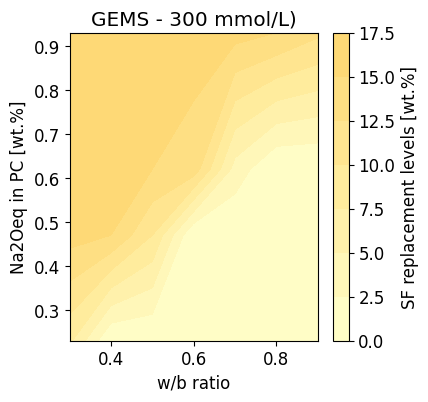

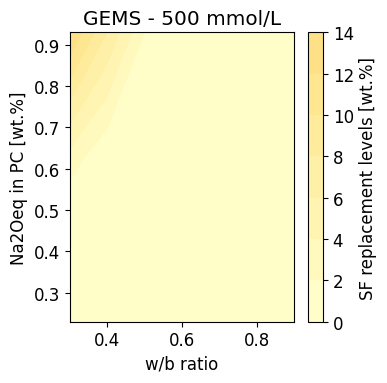

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


# Load the spreadsheet
file_path = '/content/2024-06-05 Ana_wb for different alkali_SF.xlsx'
df = pd.read_excel(file_path, sheet_name='Summary', header=None)

# Extract the required values
w_b_ratios = df.iloc[2, 1:29].values
na2oeq_values = df.iloc[1, 1:29].values

# Extract GEMS data for 300 and 500 mmol/L
replacement_levels_FA_300_GEMS = df.iloc[105, 1:29].values.astype(float)  # Row 106 (0-based index 105)
replacement_levels_FA_500_GEMS = df.iloc[106, 1:29].values.astype(float)  # Row 107 (0-based index 106)


# Remove NaN values
valid_indices_300 = ~np.isnan(replacement_levels_FA_300_GEMS)
valid_indices_500 = ~np.isnan(replacement_levels_FA_500_GEMS)

w_b_ratios_300 = w_b_ratios[valid_indices_300]
na2oeq_values_300 = na2oeq_values[valid_indices_300]
replacement_levels_FA_300_GEMS = replacement_levels_FA_300_GEMS[valid_indices_300]

w_b_ratios_500 = w_b_ratios[valid_indices_500]
na2oeq_values_500 = na2oeq_values[valid_indices_500]
replacement_levels_FA_500_GEMS = replacement_levels_FA_500_GEMS[valid_indices_500]

# Create meshgrid for contour plots
unique_w_b_ratios_300 = np.unique(w_b_ratios_300)
unique_na2oeq_values_300 = np.unique(na2oeq_values_300)
W_b_ratios_300, Na2oeq_values_300 = np.meshgrid(unique_w_b_ratios_300, unique_na2oeq_values_300)

unique_w_b_ratios_500 = np.unique(w_b_ratios_500)
unique_na2oeq_values_500 = np.unique(na2oeq_values_500)
W_b_ratios_500, Na2oeq_values_500 = np.meshgrid(unique_w_b_ratios_500, unique_na2oeq_values_500)

# Create the Z matrix by aligning with the meshgrid
Z_300_GEMS = np.zeros_like(W_b_ratios_300, dtype=float)
Z_500_GEMS = np.zeros_like(W_b_ratios_500, dtype=float)

# Populate Z matrices
for i in range(len(w_b_ratios_300)):
    row = np.where(unique_na2oeq_values_300 == na2oeq_values_300[i])[0][0]
    col = np.where(unique_w_b_ratios_300 == w_b_ratios_300[i])[0][0]
    Z_300_GEMS[row, col] = replacement_levels_FA_300_GEMS[i]

for i in range(len(w_b_ratios_500)):
    row = np.where(unique_na2oeq_values_500 == na2oeq_values_500[i])[0][0]
    col = np.where(unique_w_b_ratios_500 == w_b_ratios_500[i])[0][0]
    Z_500_GEMS[row, col] = replacement_levels_FA_500_GEMS[i]

# Create contour plots for MK (Alkali Limit: 300 mmol/L)
plt.figure(figsize=(4, 4))
contour_plot1 = plt.contourf(W_b_ratios_300, Na2oeq_values_300, Z_300_GEMS, cmap='YlOrRd', vmin=0, vmax=65)
plt.colorbar(label='SF replacement levels [wt.%]', extend='both')
plt.title('GEMS - 300 mmol/L)')
plt.xlabel('w/b ratio')
plt.ylabel('Na2Oeq in PC [wt.%]')

# Create contour plots for MK (Alkali Limit: 500 mmol/L)
plt.figure(figsize=(4, 4))
contour_plot2 = plt.contourf(W_b_ratios_500, Na2oeq_values_500, Z_500_GEMS, cmap='YlOrRd', vmin=0, vmax=65)
plt.colorbar(label='SF replacement levels [wt.%]', extend='both')
plt.title('GEMS - 500 mmol/L')
plt.xlabel('w/b ratio')
plt.ylabel('Na2Oeq in PC [wt.%]')

plt.tight_layout()
plt.show()



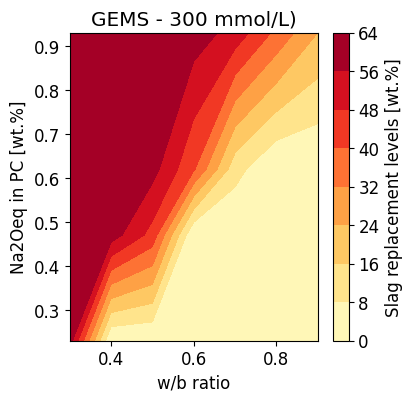

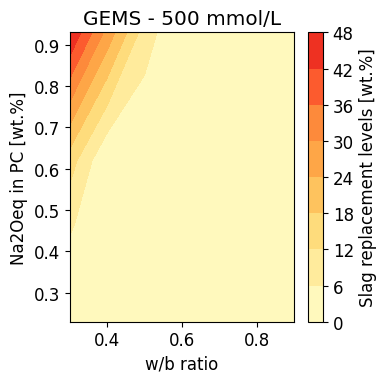

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


# Load the spreadsheet
file_path = '/content/2024-06-05 Ana_wb for different alkali_slag.xlsx'
df = pd.read_excel(file_path, sheet_name='Summary', header=None)

# Extract the required values
w_b_ratios = df.iloc[2, 1:29].values
na2oeq_values = df.iloc[1, 1:29].values

# Extract GEMS data for 300 and 500 mmol/L
replacement_levels_FA_300_GEMS = df.iloc[105, 1:29].values.astype(float)  # Row 106 (0-based index 105)
replacement_levels_FA_500_GEMS = df.iloc[106, 1:29].values.astype(float)  # Row 107 (0-based index 106)


# Remove NaN values
valid_indices_300 = ~np.isnan(replacement_levels_FA_300_GEMS)
valid_indices_500 = ~np.isnan(replacement_levels_FA_500_GEMS)

w_b_ratios_300 = w_b_ratios[valid_indices_300]
na2oeq_values_300 = na2oeq_values[valid_indices_300]
replacement_levels_FA_300_GEMS = replacement_levels_FA_300_GEMS[valid_indices_300]

w_b_ratios_500 = w_b_ratios[valid_indices_500]
na2oeq_values_500 = na2oeq_values[valid_indices_500]
replacement_levels_FA_500_GEMS = replacement_levels_FA_500_GEMS[valid_indices_500]

# Create meshgrid for contour plots
unique_w_b_ratios_300 = np.unique(w_b_ratios_300)
unique_na2oeq_values_300 = np.unique(na2oeq_values_300)
W_b_ratios_300, Na2oeq_values_300 = np.meshgrid(unique_w_b_ratios_300, unique_na2oeq_values_300)

unique_w_b_ratios_500 = np.unique(w_b_ratios_500)
unique_na2oeq_values_500 = np.unique(na2oeq_values_500)
W_b_ratios_500, Na2oeq_values_500 = np.meshgrid(unique_w_b_ratios_500, unique_na2oeq_values_500)

# Create the Z matrix by aligning with the meshgrid
Z_300_GEMS = np.zeros_like(W_b_ratios_300, dtype=float)
Z_500_GEMS = np.zeros_like(W_b_ratios_500, dtype=float)

# Populate Z matrices
for i in range(len(w_b_ratios_300)):
    row = np.where(unique_na2oeq_values_300 == na2oeq_values_300[i])[0][0]
    col = np.where(unique_w_b_ratios_300 == w_b_ratios_300[i])[0][0]
    Z_300_GEMS[row, col] = replacement_levels_FA_300_GEMS[i]

for i in range(len(w_b_ratios_500)):
    row = np.where(unique_na2oeq_values_500 == na2oeq_values_500[i])[0][0]
    col = np.where(unique_w_b_ratios_500 == w_b_ratios_500[i])[0][0]
    Z_500_GEMS[row, col] = replacement_levels_FA_500_GEMS[i]

# Create contour plots for MK (Alkali Limit: 300 mmol/L)
plt.figure(figsize=(4, 4))
contour_plot1 = plt.contourf(W_b_ratios_300, Na2oeq_values_300, Z_300_GEMS, cmap='YlOrRd', vmin=0, vmax=65)
plt.colorbar(label='Slag replacement levels [wt.%]', extend='both')
plt.title('GEMS - 300 mmol/L)')
plt.xlabel('w/b ratio')
plt.ylabel('Na2Oeq in PC [wt.%]')

# Create contour plots for MK (Alkali Limit: 500 mmol/L)
plt.figure(figsize=(4, 4))
contour_plot2 = plt.contourf(W_b_ratios_500, Na2oeq_values_500, Z_500_GEMS, cmap='YlOrRd', vmin=0, vmax=65)
plt.colorbar(label='Slag replacement levels [wt.%]', extend='both')
plt.title('GEMS - 500 mmol/L')
plt.xlabel('w/b ratio')
plt.ylabel('Na2Oeq in PC [wt.%]')

plt.tight_layout()
plt.show()



MK-COMPOSITES VARYING ALKALI CONTENT

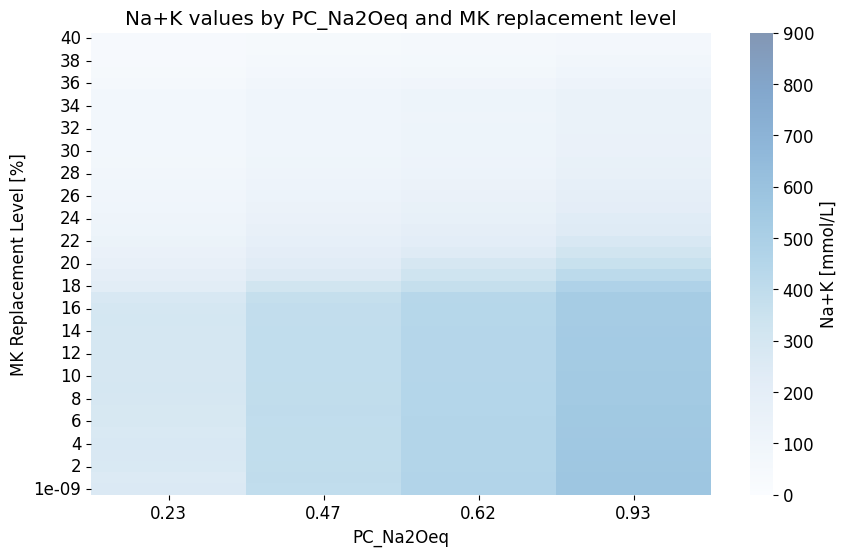

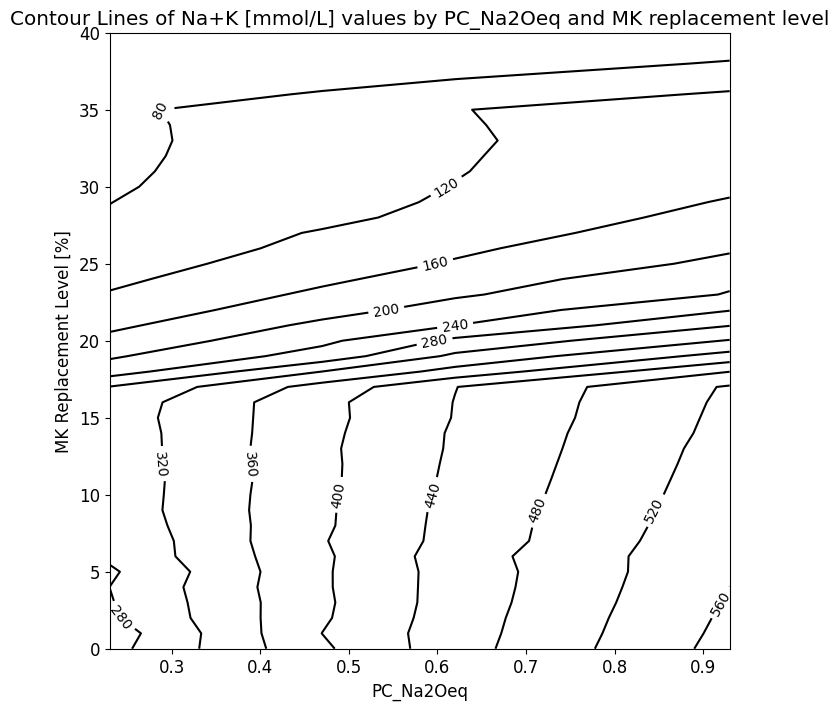

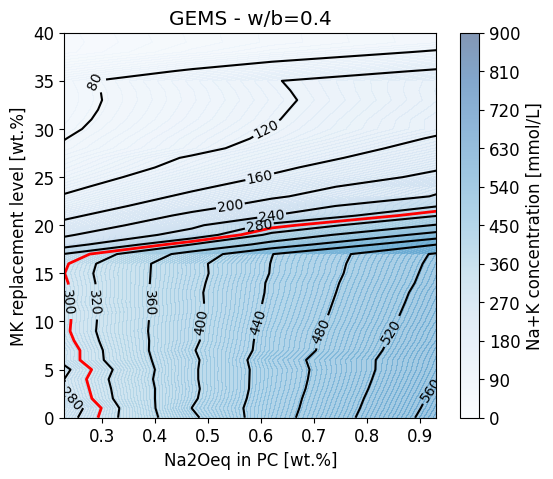

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load the spreadsheet
file_path = '/content/2024-06-05 Ana_wb for different alkali_MK.xlsx'
df = pd.read_excel(file_path, sheet_name='Summary', header=None)

# Extract the required values
alkali_levels = df.iloc[1, 1:29].values
wb_ratios = df.iloc[2, 1:29].values
MK_replacement = df.iloc[4:105, 0].values
concentration_levels = df.iloc[4:105, 1:29].values

# Filter data to include only replacement levels up to 40
valid_indices_replacement = MK_replacement <= 40
MK_replacement = MK_replacement[valid_indices_replacement]
concentration_levels = concentration_levels[valid_indices_replacement]

# Filter data to include only w/b ratios up to 0.7
valid_indices_wb = wb_ratios == 0.4
alkali_levels = alkali_levels[valid_indices_wb]
concentration_levels = concentration_levels[:, valid_indices_wb]

# Create a DataFrame for the concentration levels
df_concentration = pd.DataFrame(concentration_levels, index=MK_replacement, columns=alkali_levels)

# Ensure all values are numeric
df_concentration = df_concentration.apply(pd.to_numeric, errors='coerce')

# Convert column names to strings, remove percentage symbols, and convert to float
df_concentration.columns = df_concentration.columns.astype(str).str.rstrip('%').astype(float)

# Define the constant range for the color bar
vmin_value_Na2O = 0
vmax_value_Na2O = 900

# Plotting the heatmap with seaborn and setting the color scale limits
plt.figure(figsize=(10, 6))
heatmap = sns.heatmap(df_concentration, annot=False, fmt=".0f", linewidths=.0, cmap="Blues",
                      vmin=vmin_value_Na2O, vmax=vmax_value_Na2O, alpha=0.5)  # Set the color scale limits here
heatmap.invert_yaxis()  # Invert the y-axis to have the highest replacement level at the top
heatmap.invert_xaxis()

# Add color bar with the defined limits and label
colorbar = heatmap.collections[0].colorbar
colorbar.set_label('Na+K [mmol/L]')
colorbar.set_ticks(np.linspace(vmin_value_Na2O, vmax_value_Na2O, num=len(colorbar.get_ticks())))

plt.xlabel('PC_Na2Oeq')
plt.ylabel('MK Replacement Level [%]')
plt.title('Na+K values by PC_Na2Oeq and MK replacement level')

# plt.show()

# Creating a meshgrid for the contour plot with the correct orientation
X_Na2O, Y_Na2O = np.meshgrid(df_concentration.columns, df_concentration.index)
Z_Na2O = df_concentration.values

# Plotting the contour lines
plt.figure(figsize=(8, 8))
contour_lines_Na2O = plt.contour(X_Na2O, Y_Na2O, Z_Na2O, levels=15, colors='black')
plt.clabel(contour_lines_Na2O, inline=True, fontsize=10)
plt.title('Contour Lines of Na+K [mmol/L] values by PC_Na2Oeq and MK replacement level')
plt.xlabel('PC_Na2Oeq')
plt.ylabel('MK Replacement Level [%]')
# plt.gca().invert_yaxis()  # Invert the y-axis if needed
# plt.show()

# Creating filled contour plot with colors corresponding to the levels of Na2O values within the specified range
plt.figure(figsize=(6, 5))
contour_filled_Na2O = plt.contourf(X_Na2O, Y_Na2O, Z_Na2O, levels=np.linspace(vmin_value_Na2O, vmax_value_Na2O, 300),
                              cmap="Blues", alpha=0.5, vmin=vmin_value_Na2O, vmax=vmax_value_Na2O)

# Adding contour lines on top of the filled contour for better visibility of the levels
contour_lines_Na2O = plt.contour(X_Na2O, Y_Na2O, Z_Na2O, levels=15, colors='black')
plt.clabel(contour_lines_Na2O, inline=True, fontsize=10)

# Adding the bold contour line for level 300
bold_contour = plt.contour(X_Na2O, Y_Na2O, Z_Na2O, levels=[300], colors='red', linewidths=2)
# # Adding labels manually with specific font properties
fmt = {300: '300'}
labels = plt.clabel(bold_contour, fmt=fmt, colors='black', fontsize=10, inline=True)

# Adding color bar on the side to represent the scale with the defined range
colorbar_Na2O = plt.colorbar(contour_filled_Na2O, extend='both', ticks=np.linspace(vmin_value_Na2O, vmax_value_Na2O, 11))
colorbar_Na2O.set_label('Na+K concentration [mmol/L]')

plt.title('GEMS - w/b=0.4')
plt.xlabel('Na2Oeq in PC [wt.%]')
plt.ylabel('MK replacement level [wt.%]')

plt.show()


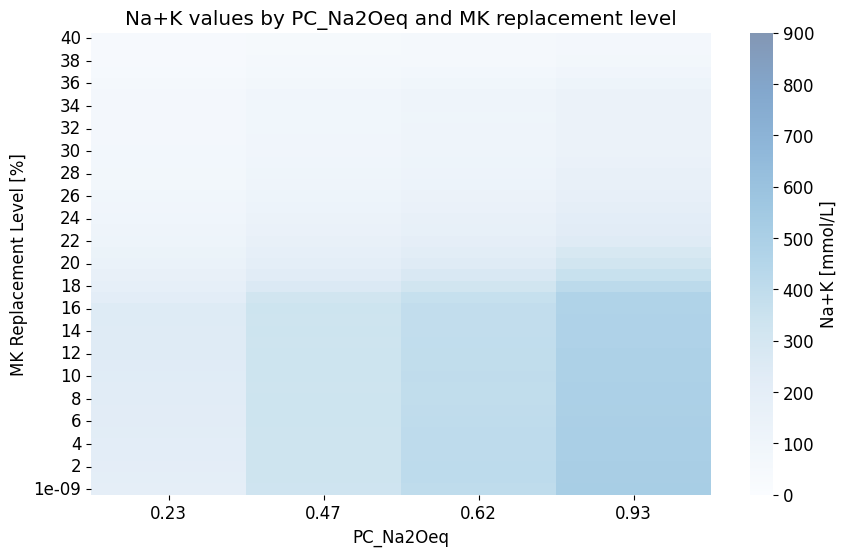

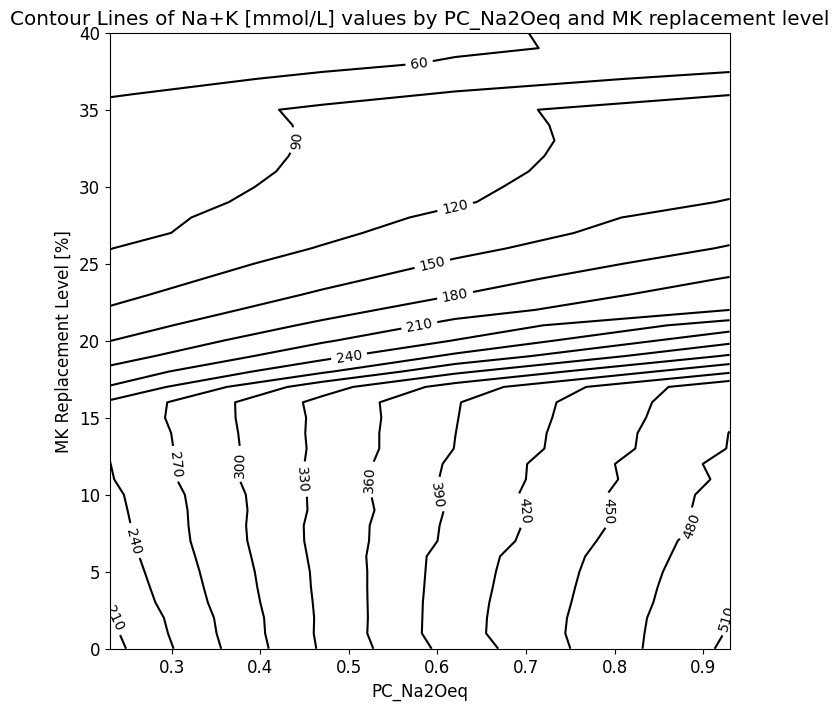

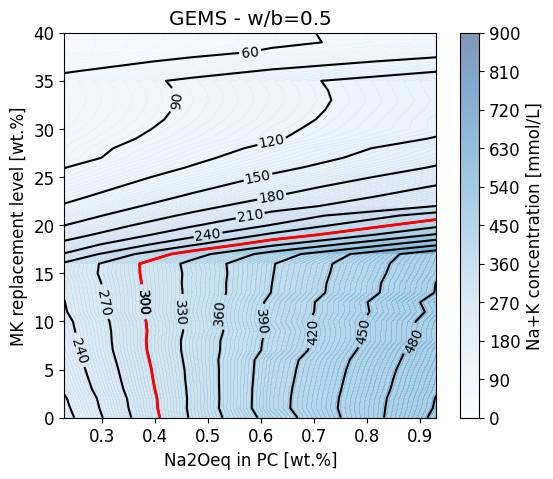

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load the spreadsheet
file_path = '/content/2024-06-05 Ana_wb for different alkali_MK.xlsx'
df = pd.read_excel(file_path, sheet_name='Summary', header=None)

# Extract the required values
alkali_levels = df.iloc[1, 1:29].values
wb_ratios = df.iloc[2, 1:29].values
MK_replacement = df.iloc[4:105, 0].values
concentration_levels = df.iloc[4:105, 1:29].values

# Filter data to include only replacement levels up to 40
valid_indices_replacement = MK_replacement <= 40
MK_replacement = MK_replacement[valid_indices_replacement]
concentration_levels = concentration_levels[valid_indices_replacement]

# Filter data to include only w/b ratios up to 0.7
valid_indices_wb = wb_ratios == 0.5
alkali_levels = alkali_levels[valid_indices_wb]
concentration_levels = concentration_levels[:, valid_indices_wb]

# Create a DataFrame for the concentration levels
df_concentration = pd.DataFrame(concentration_levels, index=MK_replacement, columns=alkali_levels)

# Ensure all values are numeric
df_concentration = df_concentration.apply(pd.to_numeric, errors='coerce')

# Convert column names to strings, remove percentage symbols, and convert to float
df_concentration.columns = df_concentration.columns.astype(str).str.rstrip('%').astype(float)

# Define the constant range for the color bar
vmin_value_Na2O = 0
vmax_value_Na2O = 900

# Plotting the heatmap with seaborn and setting the color scale limits
plt.figure(figsize=(10, 6))
heatmap = sns.heatmap(df_concentration, annot=False, fmt=".0f", linewidths=.0, cmap="Blues",
                      vmin=vmin_value_Na2O, vmax=vmax_value_Na2O, alpha=0.5)  # Set the color scale limits here
heatmap.invert_yaxis()  # Invert the y-axis to have the highest replacement level at the top
heatmap.invert_xaxis()

# Add color bar with the defined limits and label
colorbar = heatmap.collections[0].colorbar
colorbar.set_label('Na+K [mmol/L]')
colorbar.set_ticks(np.linspace(vmin_value_Na2O, vmax_value_Na2O, num=len(colorbar.get_ticks())))

plt.xlabel('PC_Na2Oeq')
plt.ylabel('MK Replacement Level [%]')
plt.title('Na+K values by PC_Na2Oeq and MK replacement level')

# plt.show()

# Creating a meshgrid for the contour plot with the correct orientation
X_Na2O, Y_Na2O = np.meshgrid(df_concentration.columns, df_concentration.index)
Z_Na2O = df_concentration.values

# Plotting the contour lines
plt.figure(figsize=(8, 8))
contour_lines_Na2O = plt.contour(X_Na2O, Y_Na2O, Z_Na2O, levels=15, colors='black')
plt.clabel(contour_lines_Na2O, inline=True, fontsize=10)
plt.title('Contour Lines of Na+K [mmol/L] values by PC_Na2Oeq and MK replacement level')
plt.xlabel('PC_Na2Oeq')
plt.ylabel('MK Replacement Level [%]')
# plt.gca().invert_yaxis()  # Invert the y-axis if needed
# plt.show()

# Creating filled contour plot with colors corresponding to the levels of Na2O values within the specified range
plt.figure(figsize=(6, 5))
contour_filled_Na2O = plt.contourf(X_Na2O, Y_Na2O, Z_Na2O, levels=np.linspace(vmin_value_Na2O, vmax_value_Na2O, 300),
                              cmap="Blues", alpha=0.5, vmin=vmin_value_Na2O, vmax=vmax_value_Na2O)

# Adding contour lines on top of the filled contour for better visibility of the levels
contour_lines_Na2O = plt.contour(X_Na2O, Y_Na2O, Z_Na2O, levels=15, colors='black')
plt.clabel(contour_lines_Na2O, inline=True, fontsize=10)

# Adding the bold contour line for level 300
bold_contour = plt.contour(X_Na2O, Y_Na2O, Z_Na2O, levels=[300], colors='red', linewidths=2)
# # Adding labels manually with specific font properties
fmt = {300: '300'}
labels = plt.clabel(bold_contour, fmt=fmt, colors='black', fontsize=10, inline=True)

# Adding color bar on the side to represent the scale with the defined range
colorbar_Na2O = plt.colorbar(contour_filled_Na2O, extend='both', ticks=np.linspace(vmin_value_Na2O, vmax_value_Na2O, 11))
colorbar_Na2O.set_label('Na+K concentration [mmol/L]')

plt.title('GEMS - w/b=0.5')
plt.xlabel('Na2Oeq in PC [wt.%]')
plt.ylabel('MK replacement level [wt.%]')

plt.show()


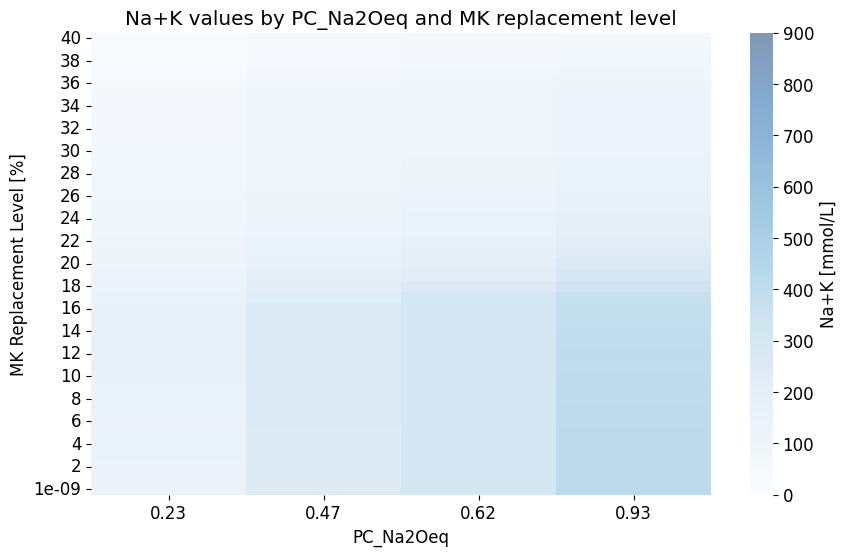

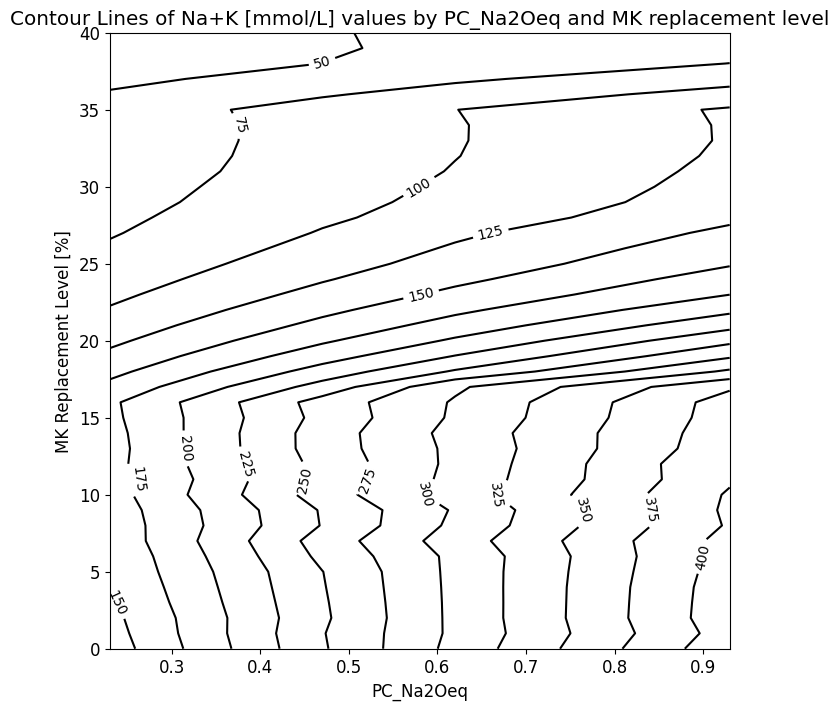

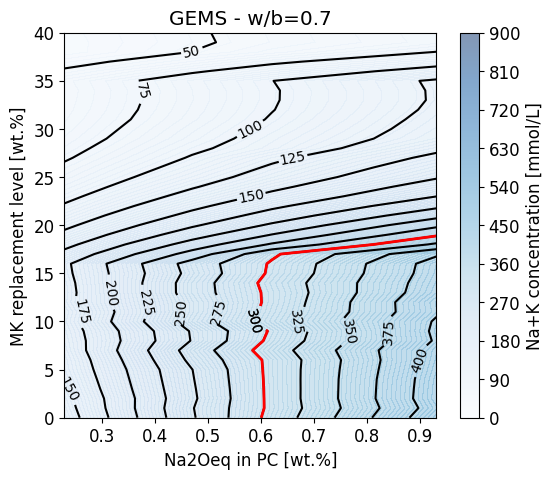

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load the spreadsheet
file_path = '/content/2024-06-05 Ana_wb for different alkali_MK.xlsx'
df = pd.read_excel(file_path, sheet_name='Summary', header=None)

# Extract the required values
alkali_levels = df.iloc[1, 1:29].values
wb_ratios = df.iloc[2, 1:29].values
MK_replacement = df.iloc[4:105, 0].values
concentration_levels = df.iloc[4:105, 1:29].values

# Filter data to include only replacement levels up to 40
valid_indices_replacement = MK_replacement <= 40
MK_replacement = MK_replacement[valid_indices_replacement]
concentration_levels = concentration_levels[valid_indices_replacement]

# Filter data to include only w/b ratios up to 0.7
valid_indices_wb = wb_ratios == 0.7
alkali_levels = alkali_levels[valid_indices_wb]
concentration_levels = concentration_levels[:, valid_indices_wb]

# Create a DataFrame for the concentration levels
df_concentration = pd.DataFrame(concentration_levels, index=MK_replacement, columns=alkali_levels)

# Ensure all values are numeric
df_concentration = df_concentration.apply(pd.to_numeric, errors='coerce')

# Convert column names to strings, remove percentage symbols, and convert to float
df_concentration.columns = df_concentration.columns.astype(str).str.rstrip('%').astype(float)

# Define the constant range for the color bar
vmin_value_Na2O = 0
vmax_value_Na2O = 900

# Plotting the heatmap with seaborn and setting the color scale limits
plt.figure(figsize=(10, 6))
heatmap = sns.heatmap(df_concentration, annot=False, fmt=".0f", linewidths=.0, cmap="Blues",
                      vmin=vmin_value_Na2O, vmax=vmax_value_Na2O, alpha=0.5)  # Set the color scale limits here
heatmap.invert_yaxis()  # Invert the y-axis to have the highest replacement level at the top
heatmap.invert_xaxis()

# Add color bar with the defined limits and label
colorbar = heatmap.collections[0].colorbar
colorbar.set_label('Na+K [mmol/L]')
colorbar.set_ticks(np.linspace(vmin_value_Na2O, vmax_value_Na2O, num=len(colorbar.get_ticks())))

plt.xlabel('PC_Na2Oeq')
plt.ylabel('MK Replacement Level [%]')
plt.title('Na+K values by PC_Na2Oeq and MK replacement level')

# plt.show()

# Creating a meshgrid for the contour plot with the correct orientation
X_Na2O, Y_Na2O = np.meshgrid(df_concentration.columns, df_concentration.index)
Z_Na2O = df_concentration.values

# Plotting the contour lines
plt.figure(figsize=(8, 8))
contour_lines_Na2O = plt.contour(X_Na2O, Y_Na2O, Z_Na2O, levels=15, colors='black')
plt.clabel(contour_lines_Na2O, inline=True, fontsize=10)
plt.title('Contour Lines of Na+K [mmol/L] values by PC_Na2Oeq and MK replacement level')
plt.xlabel('PC_Na2Oeq')
plt.ylabel('MK Replacement Level [%]')
# plt.gca().invert_yaxis()  # Invert the y-axis if needed
# plt.show()

# Creating filled contour plot with colors corresponding to the levels of Na2O values within the specified range
plt.figure(figsize=(6, 5))
contour_filled_Na2O = plt.contourf(X_Na2O, Y_Na2O, Z_Na2O, levels=np.linspace(vmin_value_Na2O, vmax_value_Na2O, 300),
                              cmap="Blues", alpha=0.5, vmin=vmin_value_Na2O, vmax=vmax_value_Na2O)

# Adding contour lines on top of the filled contour for better visibility of the levels
contour_lines_Na2O = plt.contour(X_Na2O, Y_Na2O, Z_Na2O, levels=15, colors='black')
plt.clabel(contour_lines_Na2O, inline=True, fontsize=10)

# Adding the bold contour line for level 300
bold_contour = plt.contour(X_Na2O, Y_Na2O, Z_Na2O, levels=[300], colors='red', linewidths=2)
# Adding labels manually with specific font properties
fmt = {300: '300'}
labels = plt.clabel(bold_contour, fmt=fmt, colors='black', fontsize=10, inline=True)

# Adding color bar on the side to represent the scale with the defined range
colorbar_Na2O = plt.colorbar(contour_filled_Na2O, extend='both', ticks=np.linspace(vmin_value_Na2O, vmax_value_Na2O, 11))
colorbar_Na2O.set_label('Na+K concentration [mmol/L]')

plt.title('GEMS - w/b=0.7')
plt.xlabel('Na2Oeq in PC [wt.%]')
plt.ylabel('MK replacement level [wt.%]')

plt.show()


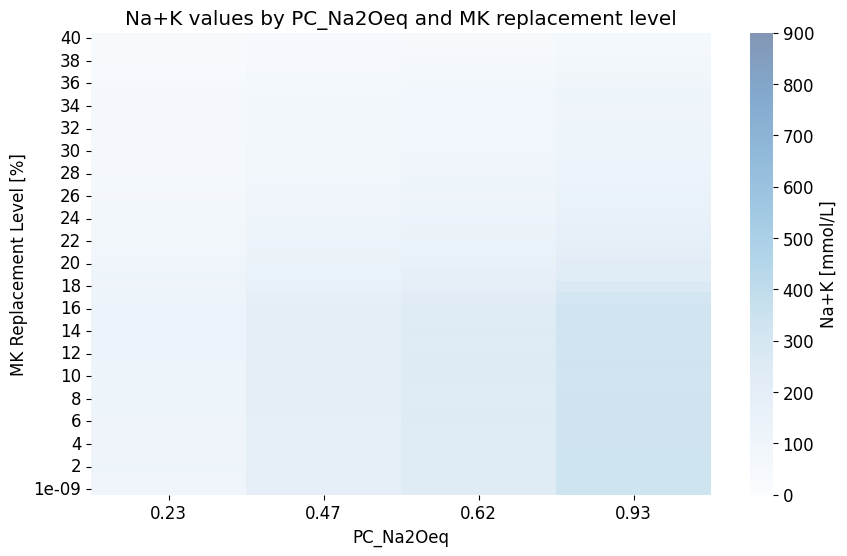

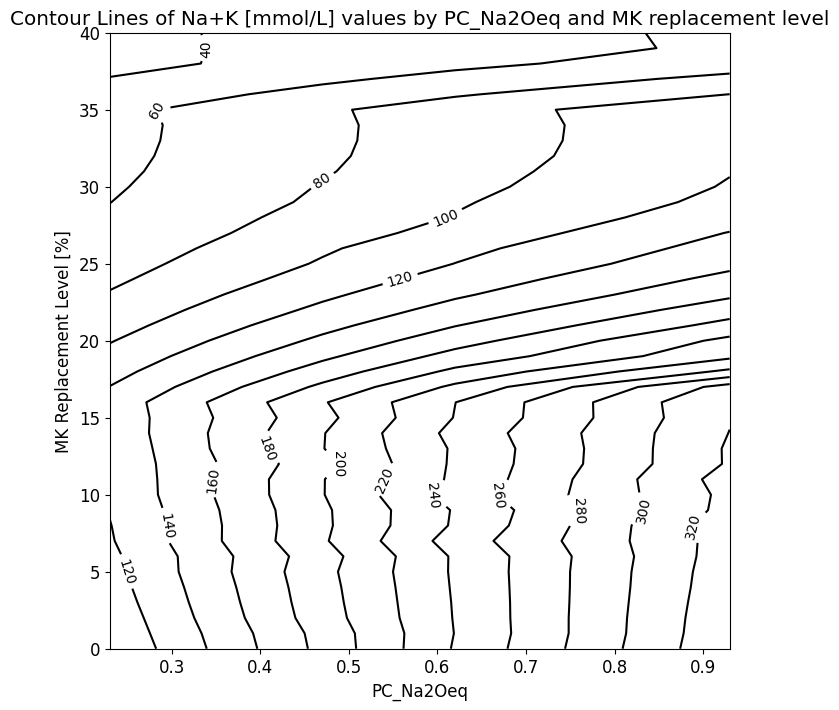

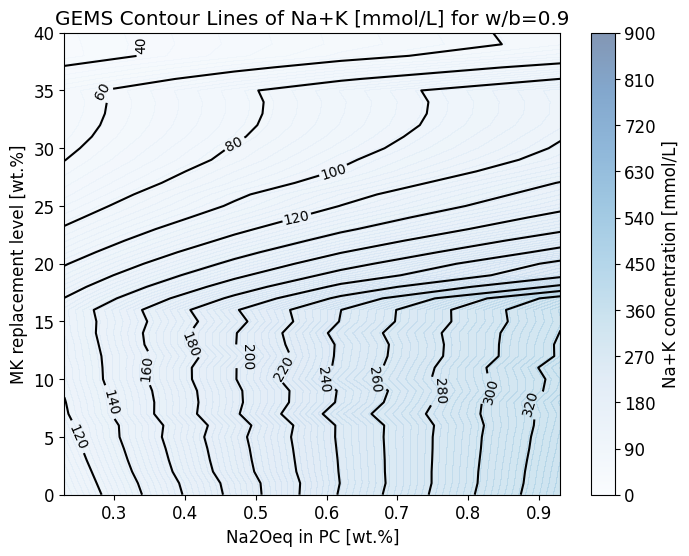

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load the spreadsheet
file_path = '/content/2024-06-05 Ana_wb for different alkali_MK.xlsx'
df = pd.read_excel(file_path, sheet_name='Summary', header=None)

# Extract the required values
alkali_levels = df.iloc[1, 1:29].values
wb_ratios = df.iloc[2, 1:29].values
MK_replacement = df.iloc[4:105, 0].values
concentration_levels = df.iloc[4:105, 1:29].values

# Filter data to include only replacement levels up to 40
valid_indices_replacement = MK_replacement <=40
MK_replacement = MK_replacement[valid_indices_replacement]
concentration_levels = concentration_levels[valid_indices_replacement]

# Filter data to include only w/b ratios up to 0.7
valid_indices_wb = wb_ratios == 0.9
alkali_levels = alkali_levels[valid_indices_wb]
concentration_levels = concentration_levels[:, valid_indices_wb]

# Create a DataFrame for the concentration levels
df_concentration = pd.DataFrame(concentration_levels, index=MK_replacement, columns=alkali_levels)

# Ensure all values are numeric
df_concentration = df_concentration.apply(pd.to_numeric, errors='coerce')

# Convert column names to strings, remove percentage symbols, and convert to float
df_concentration.columns = df_concentration.columns.astype(str).str.rstrip('%').astype(float)

# Print to verify the data
# print(df_concentration.head())

# Define the constant range for the color bar
vmin_value_Na2O = 0
vmax_value_Na2O = 900

# Plotting the heatmap with seaborn and setting the color scale limits
plt.figure(figsize=(10, 6))
heatmap = sns.heatmap(df_concentration, annot=False, fmt=".0f", linewidths=.0, cmap="Blues",
                      vmin=vmin_value_Na2O, vmax=vmax_value_Na2O, alpha=0.5)  # Set the color scale limits here
heatmap.invert_yaxis()  # Invert the y-axis to have the highest replacement level at the top
heatmap.invert_xaxis()

# Add color bar with the defined limits and label
colorbar = heatmap.collections[0].colorbar
colorbar.set_label('Na+K [mmol/L]')
colorbar.set_ticks(np.linspace(vmin_value_Na2O, vmax_value_Na2O, num=len(colorbar.get_ticks())))

plt.xlabel('PC_Na2Oeq')
plt.ylabel('MK Replacement Level [%]')
plt.title('Na+K values by PC_Na2Oeq and MK replacement level')

# plt.show()

# Creating a meshgrid for the contour plot with the correct orientation
X_Na2O, Y_Na2O = np.meshgrid(df_concentration.columns, df_concentration.index)
Z_Na2O = df_concentration.values

# Plotting the contour lines
plt.figure(figsize=(8, 8))
contour_lines_Na2O = plt.contour(X_Na2O, Y_Na2O, Z_Na2O, levels=15, colors='black')
plt.clabel(contour_lines_Na2O, inline=True, fontsize=10)
plt.title('Contour Lines of Na+K [mmol/L] values by PC_Na2Oeq and MK replacement level')
plt.xlabel('PC_Na2Oeq')
plt.ylabel('MK Replacement Level [%]')
# plt.gca().invert_yaxis()  # Invert the y-axis if needed
# plt.show()

# Creating filled contour plot with colors corresponding to the levels of Na2O values within the specified range
plt.figure(figsize=(8, 6))
contour_filled_Na2O = plt.contourf(X_Na2O, Y_Na2O, Z_Na2O, levels=np.linspace(vmin_value_Na2O, vmax_value_Na2O, 300),
                              cmap="Blues", alpha=0.5, vmin=vmin_value_Na2O, vmax=vmax_value_Na2O)

# Adding contour lines on top of the filled contour for better visibility of the levels
contour_lines_Na2O = plt.contour(X_Na2O, Y_Na2O, Z_Na2O, levels=15, colors='black')
plt.clabel(contour_lines_Na2O, inline=True, fontsize=10)

# Adding color bar on the side to represent the scale with the defined range
colorbar_Na2O = plt.colorbar(contour_filled_Na2O, extend='both', ticks=np.linspace(vmin_value_Na2O, vmax_value_Na2O, 11))
colorbar_Na2O.set_label('Na+K concentration [mmol/L]')

plt.title('GEMS Contour Lines of Na+K [mmol/L] for w/b=0.9')
plt.xlabel('Na2Oeq in PC [wt.%]')
plt.ylabel('MK replacement level [wt.%]')

plt.show()


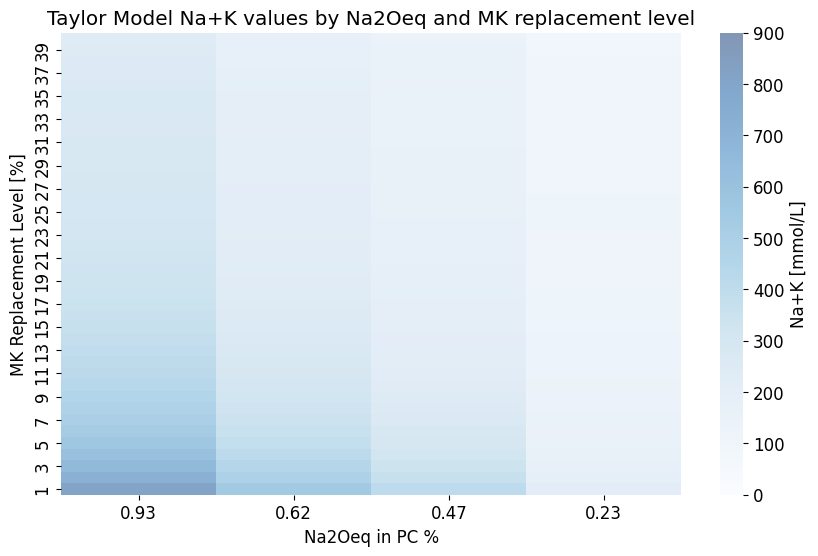

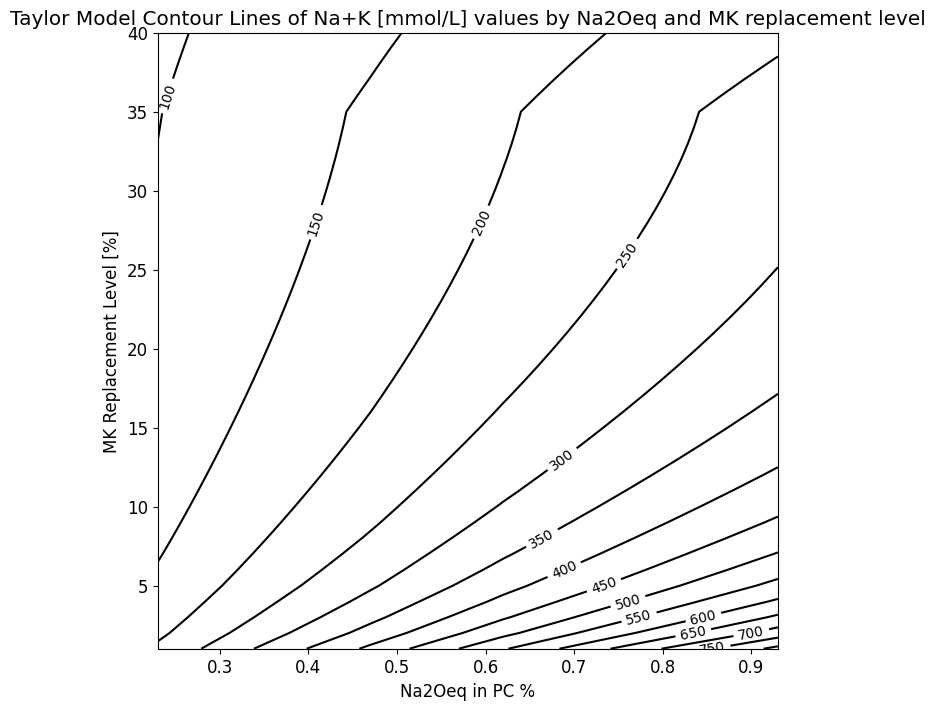

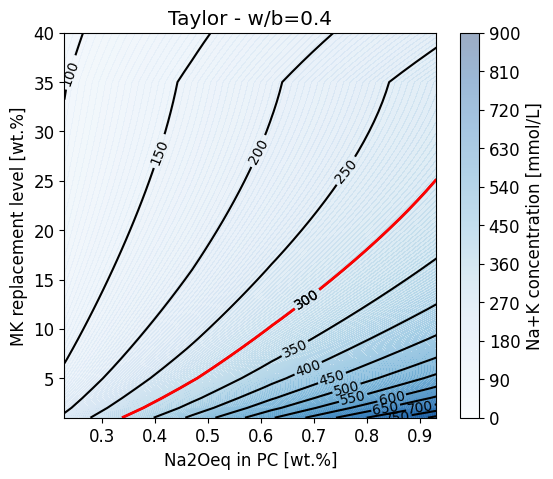

In [ ]:
import math
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


# Define SCM parameters
scm_parameters = {
    'FA': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0.04,
        'total_k_content_water_soluble': 0.03,
        'fraction_of_glass': 0.8,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.81,
        'm_tot_SCM_K': 2.74
    },
    'MK': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.05,
        'm_tot_SCM_K': 1
    },
    'SF': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.32,
        'm_tot_SCM_K': 0.71
    },
    'slag': {
        'binding_factor_na': 0.08,
        'binding_factor_k': 0.04,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.29,
        'm_tot_SCM_K': 0.38
    }
}

# Define cement parameters
cement_parameters = {
    '0.93': {'m_tot_PC_Na': 0.42, 'm_tot_PC_K': 0.78},
    '0.62': {'m_tot_PC_Na': 0.28, 'm_tot_PC_K': 0.52},
    '0.47': {'m_tot_PC_Na': 0.21, 'm_tot_PC_K': 0.39},
    '0.23': {'m_tot_PC_Na': 0.105, 'm_tot_PC_K': 0.195}
}


def get_scm_parameters(scm_type):
    return scm_parameters.get(scm_type, {})

def get_cement_parameters(alkali_content):
    return cement_parameters.get(alkali_content, {})

def calculate_dor_scm(scm_type_for_dor, replacement_level, time):
    if scm_type_for_dor == 'FA_RILEM':
        dor_scm = replacement_level * (0.49993 - 0.0041 * replacement_level)
    elif scm_type_for_dor == 'FA_Taylor':
        fraction_of_glass = scm_parameters['FA']['fraction_of_glass']
        dor_scm = fraction_of_glass * replacement_level * (1 - math.exp(-(0.043 - (replacement_level * fraction_of_glass * 0.0005)) * time ** (0.585 - (replacement_level * fraction_of_glass * 0.0005))))
    elif scm_type_for_dor == 'SF':
        dor_scm = replacement_level
    elif scm_type_for_dor == 'slag':
        dor_scm = replacement_level * 0.7
    elif scm_type_for_dor == 'MK':
        if replacement_level <= 5:
            dor_scm = replacement_level
        elif replacement_level <= 35:
            dor_scm = replacement_level * (100 - ((replacement_level - 5) * 60 / 30)) / 100
        else:
            dor_scm = replacement_level * 40 / 100
    else:
        dor_scm = 0  # Default value if scm_type does not match

    # print(f"Degree of Reaction (DoR) for SCM {scm_type_for_dor}: {dor_scm}")
    return dor_scm

def calculate_na_k_concentration(replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor):
    scm_params = get_scm_parameters(scm_type_for_parameters)
    cement_params = get_cement_parameters(alkali_content)

    binding_factor_na = scm_params['binding_factor_na']
    binding_factor_k = scm_params['binding_factor_k']
    total_na_content_water_soluble = scm_params['total_na_content_water_soluble']
    total_k_content_water_soluble = scm_params['total_k_content_water_soluble']
    fraction_of_glass = scm_params['fraction_of_glass']
    g_bound_water_per_g_reacted_scm = scm_params['g_bound_water_per_g_reacted_scm']
    m_tot_SCM_Na = scm_params['m_tot_SCM_Na']
    m_tot_SCM_K = scm_params['m_tot_SCM_K']

    m_tot_PC_Na = cement_params['m_tot_PC_Na']
    m_tot_PC_K = cement_params['m_tot_PC_K']

    dor_scm = calculate_dor_scm(scm_type_for_dor, replacement_level, time)

    na_mass = 23.0  # [g/mol]
    k_mass = 39.1   # [g/mol]
    na2o_mass = 62.0  # [g/mol]
    k2o_mass = 94.2   # [g/mol]

    # Calculate F functions
    F_C4AF = 1 - math.exp(-(0.55 + (0.012 * replacement_level)) * (time - 0.9) ** 0.26)
    F_C3A = 1 - math.exp(-(0.77 + (0.008 * replacement_level)) * (time - 0.9) ** 0.28)
    F_C2S = 1 - math.exp(-(0.12 - (0.0007 * replacement_level)) * time ** (0.46 - (0.002 * replacement_level)))
    F_C3S = 1 - math.exp(-(0.7 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)

    # print(f"F_C4AF: {F_C4AF}, F_C3A: {F_C3A}, F_C2S: {F_C2S}, F_C3S: {F_C3S}")

    # F_CRP function
    F_CRP = ((100 - replacement_level) / 100) * replacement_level ** 0.09 * (1 - math.exp(-(0.56 - (0.0043 * replacement_level)) * (time - 0.9) ** 0.25))
    # print(f"F_CRP: {F_CRP}")

    # Fractions for Alite, Belite, Aluminate, Ferrite
    na2o_fractions = {'Alite': 0.44, 'Belite': 0.17, 'Aluminate': 0.36, 'Ferrite': 0.03}
    k2o_fractions = {'Alite': 0.29, 'Belite': 0.41, 'Aluminate': 0.27, 'Ferrite': 0.03}

    # Calculate m_r_Na from PC
    total_na_content_water_soluble_PC = 35

    m_r_na_from_pc = (
        (m_tot_PC_Na * total_na_content_water_soluble_PC / 100) +
        (F_C3S * na2o_fractions['Alite'] + F_C2S * na2o_fractions['Belite'] + F_C3A * na2o_fractions['Aluminate'] + F_C4AF * na2o_fractions['Ferrite']) *
        (1 - total_na_content_water_soluble_PC / 100) * m_tot_PC_Na
    ) * ((100 - replacement_level) / 100) * 2 / na2o_mass
    # print(f"m_r_na_from_pc: {m_r_na_from_pc}")

    # Calculate m_r_Na from SCM
    m_r_na_from_scm = (
        (total_na_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_Na - total_na_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / na2o_mass
    # print(f"m_r_na_from_scm: {m_r_na_from_scm}")


    # Calculate V(t) pore solution
    V_b_t = 31.6 * ((100 - replacement_level) / 100) * (1 - math.exp(-(0.69 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)) + g_bound_water_per_g_reacted_scm * dor_scm
    V_t_pore_solution = (w_b_ratio * 100) - V_b_t
    # print(f"V_b_t: {V_b_t}, V_t_pore_solution: {V_t_pore_solution}")

    # Calculate Na concentration
    b_pc_na = 0.031
    na_concentration = ((m_r_na_from_pc + m_r_na_from_scm) * 1000 / (V_t_pore_solution +
     (b_pc_na * 1000 * F_CRP) +binding_factor_na * 10 * dor_scm)) * 1000
    # print(f"na_concentration: {na_concentration}")



    # Calculate K concentration
    total_k_content_water_soluble_PC = 70

    m_r_k_from_pc = (
        (m_tot_PC_K * total_k_content_water_soluble_PC/ 100) +
        (F_C3S * k2o_fractions['Alite'] + F_C2S * k2o_fractions['Belite'] + F_C3A * k2o_fractions['Aluminate'] + F_C4AF * k2o_fractions['Ferrite']) *
        (1 - total_k_content_water_soluble_PC / 100) * m_tot_PC_K
    ) * ((100 - replacement_level) / 100) * 2 / k2o_mass
    # print(f"m_r_k_from_pc: {m_r_k_from_pc}")


    m_r_k_from_scm = (
        (total_k_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_K - total_k_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / k2o_mass
    # print(f"m_r_k_from_scm: {m_r_k_from_scm}")

    b_pc_k = 0.02

    k_concentration = ((m_r_k_from_pc + m_r_k_from_scm) * 1000 / (V_t_pore_solution + (b_pc_k * 1000 * F_CRP)
    + binding_factor_k * 10 * dor_scm)) * 1000

    # Calculate total Na+K concentration
    na_k_concentration = na_concentration + k_concentration

    return na_k_concentration, na_concentration, k_concentration

# Constants
scm_type_for_parameters = 'MK'  # SCM type for selecting parameters
scm_type_for_dor = 'MK'  # SCM type for calculating DoR
time = 180  # Constant time value

# Define the ranges for the parameters
replacement_levels = range(1, 101)  # Replacement levels from 1 to 100
alkali_contents = ['0.93','0.62', '0.47','0.23' ]  # Different alkali content values
w_b_ratios = [0.4]  # Only w/b ratio of 0.9

# Function to calculate the concentrations
def calculate_concentrations(replacement_levels, alkali_contents, w_b_ratios):
    results = []
    for replacement_level in replacement_levels:
        for alkali_content in alkali_contents:
            for w_b_ratio in w_b_ratios:
                na_k_concentration, na_concentration, k_concentration = calculate_na_k_concentration(
                    replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor
                )
                results.append((replacement_level, alkali_content, w_b_ratio, na_k_concentration, na_concentration, k_concentration))
    return results

# Calculate the concentrations
concentrations = calculate_concentrations(replacement_levels, alkali_contents, w_b_ratios)

# Convert to DataFrame
df_combined = pd.DataFrame(concentrations, columns=['Replacement Level', 'Alkali Content', 'w/b Ratio', 'Na+K Concentration', 'Na Concentration', 'K Concentration'])

# Filter the data to include only replacement levels up to 40
filtered_df = df_combined[df_combined['Replacement Level'] <= 40]

# Pivot the DataFrame to get the necessary format for contour plotting
pivot_table = filtered_df.pivot(index='Replacement Level', columns='Alkali Content', values='Na+K Concentration')

# Extract values for contour plot
X = pivot_table.columns.values.astype(float)
Y = pivot_table.index.values.astype(float)
Z = pivot_table.values

# Define the constant range for the color bar
vmin_value_Na2O = 0
vmax_value_Na2O = 900

# Plotting the heatmap with seaborn and setting the color scale limits
plt.figure(figsize=(10, 6))
heatmap = sns.heatmap(pivot_table, annot=False, fmt=".0f", linewidths=.0, cmap="Blues",
                      vmin=vmin_value_Na2O, vmax=vmax_value_Na2O, alpha=0.5)
heatmap.invert_yaxis()  # Invert the y-axis to have the highest replacement level at the top
heatmap.invert_xaxis()

# Add color bar with the defined limits and label
colorbar = heatmap.collections[0].colorbar
colorbar.set_label('Na+K [mmol/L]')
colorbar.set_ticks(np.linspace(vmin_value_Na2O, vmax_value_Na2O, num=len(colorbar.get_ticks())))

plt.xlabel('Na2Oeq in PC %')
plt.ylabel('MK Replacement Level [%]')
plt.title('Taylor Model Na+K values by Na2Oeq and MK replacement level')

# plt.show()

# Creating a meshgrid for the contour plot with the correct orientation
X_Na2O, Y_Na2O = np.meshgrid(X, Y)

# Plotting the contour lines
plt.figure(figsize=(8, 8))
contour_lines_Na2O = plt.contour(X_Na2O, Y_Na2O, Z, levels=15, colors='black')
plt.clabel(contour_lines_Na2O, inline=True, fontsize=10)
plt.title('Taylor Model Contour Lines of Na+K [mmol/L] values by Na2Oeq and MK replacement level')
plt.xlabel('Na2Oeq in PC %')
plt.ylabel('MK Replacement Level [%]')
# plt.gca().invert_yaxis()  # Invert the y-axis if needed
# plt.show()

# Creating filled contour plot with colors corresponding to the levels of Na2O values within the specified range
plt.figure(figsize=(6, 5))
contour_filled_Na2O = plt.contourf(X_Na2O, Y_Na2O, Z, levels=np.linspace(vmin_value_Na2O, vmax_value_Na2O, 300),
                              cmap="Blues", alpha=0.4, vmin=vmin_value_Na2O, vmax=vmax_value_Na2O)

# Adding contour lines on top of the filled contour for better visibility of the levels
contour_lines_Na2O = plt.contour(X_Na2O, Y_Na2O, Z, levels=15, colors='black')
plt.clabel(contour_lines_Na2O, inline=True, fontsize=10)

# Adding the bold contour line for level 300
bold_contour = plt.contour(X_Na2O, Y_Na2O, Z, levels=[300], colors='red', linewidths=2)
# Adding labels manually with specific font properties
fmt = {300: '300'}
labels = plt.clabel(bold_contour, fmt=fmt, colors='black', fontsize=10, inline=True)

# Adding color bar on the side to represent the scale with the defined range
colorbar_Na2O = plt.colorbar(contour_filled_Na2O, extend='both', ticks=np.linspace(vmin_value_Na2O, vmax_value_Na2O, 11))
colorbar_Na2O.set_label('Na+K concentration [mmol/L]')

plt.title('Taylor - w/b=0.4')
plt.xlabel('Na2Oeq in PC [wt.%]')
plt.ylabel('MK replacement level [wt.%]')

plt.show()



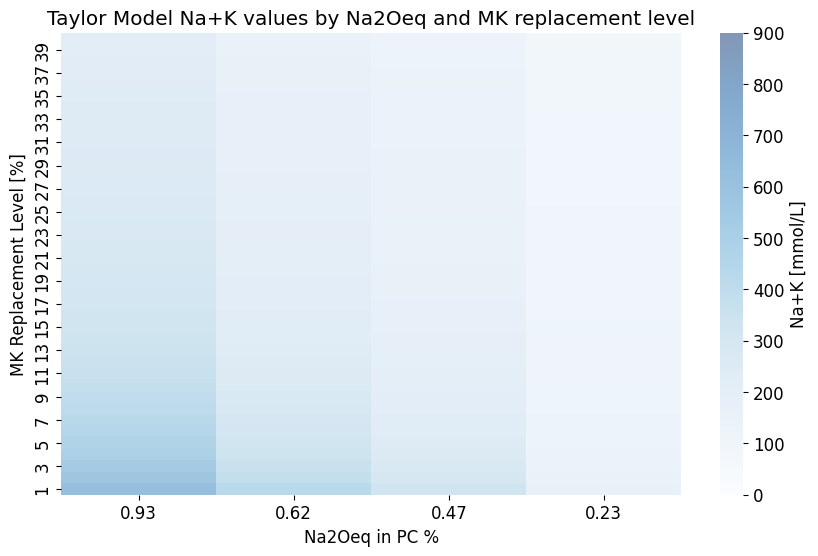

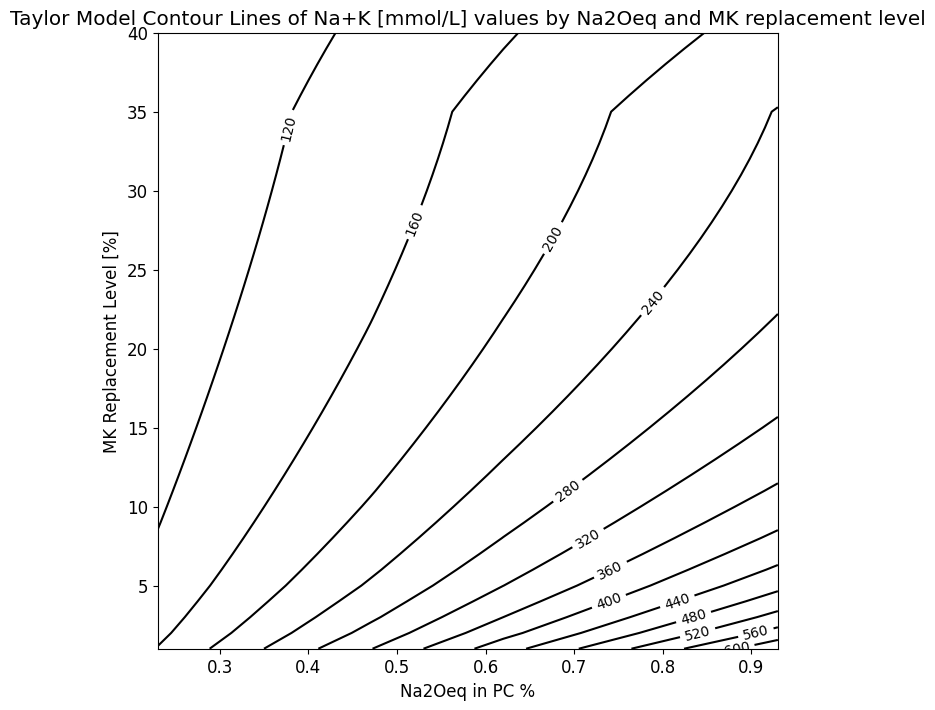

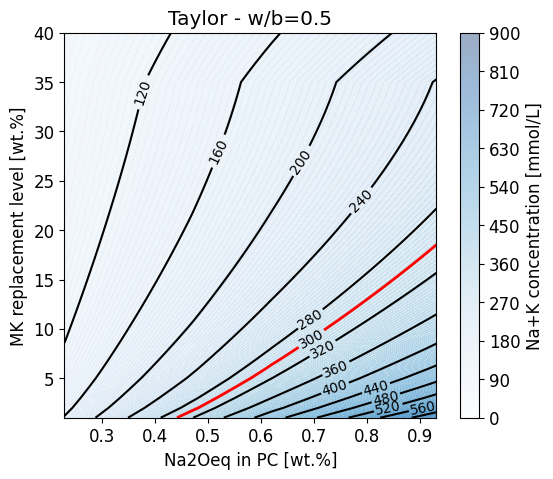

In [ ]:
import math
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


# Define SCM parameters
scm_parameters = {
    'FA': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0.04,
        'total_k_content_water_soluble': 0.03,
        'fraction_of_glass': 0.8,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.81,
        'm_tot_SCM_K': 2.74
    },
    'MK': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.05,
        'm_tot_SCM_K': 1
    },
    'SF': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.32,
        'm_tot_SCM_K': 0.71
    },
    'slag': {
        'binding_factor_na': 0.08,
        'binding_factor_k': 0.04,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.29,
        'm_tot_SCM_K': 0.38
    }
}

# Define cement parameters
cement_parameters = {
    '0.93': {'m_tot_PC_Na': 0.42, 'm_tot_PC_K': 0.78},
    '0.62': {'m_tot_PC_Na': 0.28, 'm_tot_PC_K': 0.52},
    '0.47': {'m_tot_PC_Na': 0.21, 'm_tot_PC_K': 0.39},
    '0.23': {'m_tot_PC_Na': 0.105, 'm_tot_PC_K': 0.195}
}


def get_scm_parameters(scm_type):
    return scm_parameters.get(scm_type, {})

def get_cement_parameters(alkali_content):
    return cement_parameters.get(alkali_content, {})

def calculate_dor_scm(scm_type_for_dor, replacement_level, time):
    if scm_type_for_dor == 'FA_RILEM':
        dor_scm = replacement_level * (0.49993 - 0.0041 * replacement_level)
    elif scm_type_for_dor == 'FA_Taylor':
        fraction_of_glass = scm_parameters['FA']['fraction_of_glass']
        dor_scm = fraction_of_glass * replacement_level * (1 - math.exp(-(0.043 - (replacement_level * fraction_of_glass * 0.0005)) * time ** (0.585 - (replacement_level * fraction_of_glass * 0.0005))))
    elif scm_type_for_dor == 'SF':
        dor_scm = replacement_level
    elif scm_type_for_dor == 'slag':
        dor_scm = replacement_level * 0.7
    elif scm_type_for_dor == 'MK':
        if replacement_level <= 5:
            dor_scm = replacement_level
        elif replacement_level <= 35:
            dor_scm = replacement_level * (100 - ((replacement_level - 5) * 60 / 30)) / 100
        else:
            dor_scm = replacement_level * 40 / 100
    else:
        dor_scm = 0  # Default value if scm_type does not match

    # print(f"Degree of Reaction (DoR) for SCM {scm_type_for_dor}: {dor_scm}")
    return dor_scm

def calculate_na_k_concentration(replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor):
    scm_params = get_scm_parameters(scm_type_for_parameters)
    cement_params = get_cement_parameters(alkali_content)

    binding_factor_na = scm_params['binding_factor_na']
    binding_factor_k = scm_params['binding_factor_k']
    total_na_content_water_soluble = scm_params['total_na_content_water_soluble']
    total_k_content_water_soluble = scm_params['total_k_content_water_soluble']
    fraction_of_glass = scm_params['fraction_of_glass']
    g_bound_water_per_g_reacted_scm = scm_params['g_bound_water_per_g_reacted_scm']
    m_tot_SCM_Na = scm_params['m_tot_SCM_Na']
    m_tot_SCM_K = scm_params['m_tot_SCM_K']

    m_tot_PC_Na = cement_params['m_tot_PC_Na']
    m_tot_PC_K = cement_params['m_tot_PC_K']

    dor_scm = calculate_dor_scm(scm_type_for_dor, replacement_level, time)

    na_mass = 23.0  # [g/mol]
    k_mass = 39.1   # [g/mol]
    na2o_mass = 62.0  # [g/mol]
    k2o_mass = 94.2   # [g/mol]

    # Calculate F functions
    F_C4AF = 1 - math.exp(-(0.55 + (0.012 * replacement_level)) * (time - 0.9) ** 0.26)
    F_C3A = 1 - math.exp(-(0.77 + (0.008 * replacement_level)) * (time - 0.9) ** 0.28)
    F_C2S = 1 - math.exp(-(0.12 - (0.0007 * replacement_level)) * time ** (0.46 - (0.002 * replacement_level)))
    F_C3S = 1 - math.exp(-(0.7 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)

    # print(f"F_C4AF: {F_C4AF}, F_C3A: {F_C3A}, F_C2S: {F_C2S}, F_C3S: {F_C3S}")

    # F_CRP function
    F_CRP = ((100 - replacement_level) / 100) * replacement_level ** 0.09 * (1 - math.exp(-(0.56 - (0.0043 * replacement_level)) * (time - 0.9) ** 0.25))
    # print(f"F_CRP: {F_CRP}")

    # Fractions for Alite, Belite, Aluminate, Ferrite
    na2o_fractions = {'Alite': 0.44, 'Belite': 0.17, 'Aluminate': 0.36, 'Ferrite': 0.03}
    k2o_fractions = {'Alite': 0.29, 'Belite': 0.41, 'Aluminate': 0.27, 'Ferrite': 0.03}

    # Calculate m_r_Na from PC
    total_na_content_water_soluble_PC = 35

    m_r_na_from_pc = (
        (m_tot_PC_Na * total_na_content_water_soluble_PC / 100) +
        (F_C3S * na2o_fractions['Alite'] + F_C2S * na2o_fractions['Belite'] + F_C3A * na2o_fractions['Aluminate'] + F_C4AF * na2o_fractions['Ferrite']) *
        (1 - total_na_content_water_soluble_PC / 100) * m_tot_PC_Na
    ) * ((100 - replacement_level) / 100) * 2 / na2o_mass
    # print(f"m_r_na_from_pc: {m_r_na_from_pc}")

    # Calculate m_r_Na from SCM
    m_r_na_from_scm = (
        (total_na_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_Na - total_na_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / na2o_mass
    # print(f"m_r_na_from_scm: {m_r_na_from_scm}")


    # Calculate V(t) pore solution
    V_b_t = 31.6 * ((100 - replacement_level) / 100) * (1 - math.exp(-(0.69 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)) + g_bound_water_per_g_reacted_scm * dor_scm
    V_t_pore_solution = (w_b_ratio * 100) - V_b_t
    # print(f"V_b_t: {V_b_t}, V_t_pore_solution: {V_t_pore_solution}")

    # Calculate Na concentration
    b_pc_na = 0.031
    na_concentration = ((m_r_na_from_pc + m_r_na_from_scm) * 1000 / (V_t_pore_solution +
     (b_pc_na * 1000 * F_CRP) +binding_factor_na * 10 * dor_scm)) * 1000
    # print(f"na_concentration: {na_concentration}")



    # Calculate K concentration
    total_k_content_water_soluble_PC = 70

    m_r_k_from_pc = (
        (m_tot_PC_K * total_k_content_water_soluble_PC/ 100) +
        (F_C3S * k2o_fractions['Alite'] + F_C2S * k2o_fractions['Belite'] + F_C3A * k2o_fractions['Aluminate'] + F_C4AF * k2o_fractions['Ferrite']) *
        (1 - total_k_content_water_soluble_PC / 100) * m_tot_PC_K
    ) * ((100 - replacement_level) / 100) * 2 / k2o_mass
    # print(f"m_r_k_from_pc: {m_r_k_from_pc}")


    m_r_k_from_scm = (
        (total_k_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_K - total_k_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / k2o_mass
    # print(f"m_r_k_from_scm: {m_r_k_from_scm}")

    b_pc_k = 0.02

    k_concentration = ((m_r_k_from_pc + m_r_k_from_scm) * 1000 / (V_t_pore_solution + (b_pc_k * 1000 * F_CRP)
    + binding_factor_k * 10 * dor_scm)) * 1000

    # Calculate total Na+K concentration
    na_k_concentration = na_concentration + k_concentration

    return na_k_concentration, na_concentration, k_concentration

# Constants
scm_type_for_parameters = 'MK'  # SCM type for selecting parameters
scm_type_for_dor = 'MK'  # SCM type for calculating DoR
time = 180  # Constant time value

# Define the ranges for the parameters
replacement_levels = range(1, 101)  # Replacement levels from 1 to 100
alkali_contents = ['0.93','0.62', '0.47','0.23' ]  # Different alkali content values
w_b_ratios = [0.5]  # Only w/b ratio of 0.9

# Function to calculate the concentrations
def calculate_concentrations(replacement_levels, alkali_contents, w_b_ratios):
    results = []
    for replacement_level in replacement_levels:
        for alkali_content in alkali_contents:
            for w_b_ratio in w_b_ratios:
                na_k_concentration, na_concentration, k_concentration = calculate_na_k_concentration(
                    replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor
                )
                results.append((replacement_level, alkali_content, w_b_ratio, na_k_concentration, na_concentration, k_concentration))
    return results

# Calculate the concentrations
concentrations = calculate_concentrations(replacement_levels, alkali_contents, w_b_ratios)

# Convert to DataFrame
df_combined = pd.DataFrame(concentrations, columns=['Replacement Level', 'Alkali Content', 'w/b Ratio', 'Na+K Concentration', 'Na Concentration', 'K Concentration'])

# Filter the data to include only replacement levels up to 40
filtered_df = df_combined[df_combined['Replacement Level'] <= 40]

# Pivot the DataFrame to get the necessary format for contour plotting
pivot_table = filtered_df.pivot(index='Replacement Level', columns='Alkali Content', values='Na+K Concentration')

# Extract values for contour plot
X = pivot_table.columns.values.astype(float)
Y = pivot_table.index.values.astype(float)
Z = pivot_table.values

# Define the constant range for the color bar
vmin_value_Na2O = 0
vmax_value_Na2O = 900

# Plotting the heatmap with seaborn and setting the color scale limits
plt.figure(figsize=(10, 6))
heatmap = sns.heatmap(pivot_table, annot=False, fmt=".0f", linewidths=.0, cmap="Blues",
                      vmin=vmin_value_Na2O, vmax=vmax_value_Na2O, alpha=0.5)
heatmap.invert_yaxis()  # Invert the y-axis to have the highest replacement level at the top
heatmap.invert_xaxis()

# Add color bar with the defined limits and label
colorbar = heatmap.collections[0].colorbar
colorbar.set_label('Na+K [mmol/L]')
colorbar.set_ticks(np.linspace(vmin_value_Na2O, vmax_value_Na2O, num=len(colorbar.get_ticks())))

plt.xlabel('Na2Oeq in PC %')
plt.ylabel('MK Replacement Level [%]')
plt.title('Taylor Model Na+K values by Na2Oeq and MK replacement level')

# plt.show()

# Creating a meshgrid for the contour plot with the correct orientation
X_Na2O, Y_Na2O = np.meshgrid(X, Y)

# Plotting the contour lines
plt.figure(figsize=(8, 8))
contour_lines_Na2O = plt.contour(X_Na2O, Y_Na2O, Z, levels=15, colors='black')
plt.clabel(contour_lines_Na2O, inline=True, fontsize=10)
plt.title('Taylor Model Contour Lines of Na+K [mmol/L] values by Na2Oeq and MK replacement level')
plt.xlabel('Na2Oeq in PC %')
plt.ylabel('MK Replacement Level [%]')
# plt.gca().invert_yaxis()  # Invert the y-axis if needed
# plt.show()

# Creating filled contour plot with colors corresponding to the levels of Na2O values within the specified range
plt.figure(figsize=(6, 5))
contour_filled_Na2O = plt.contourf(X_Na2O, Y_Na2O, Z, levels=np.linspace(vmin_value_Na2O, vmax_value_Na2O, 300),
                              cmap="Blues", alpha=0.4, vmin=vmin_value_Na2O, vmax=vmax_value_Na2O)

# Adding contour lines on top of the filled contour for better visibility of the levels
contour_lines_Na2O = plt.contour(X_Na2O, Y_Na2O, Z, levels=15, colors='black')
plt.clabel(contour_lines_Na2O, inline=True, fontsize=10)

# Adding the bold contour line for level 300
bold_contour = plt.contour(X_Na2O, Y_Na2O, Z, levels=[300], colors='red', linewidths=2)
# Adding labels manually with specific font properties
fmt = {300: '300'}
labels = plt.clabel(bold_contour, fmt=fmt, colors='black', fontsize=10, inline=True)

# Adding color bar on the side to represent the scale with the defined range
colorbar_Na2O = plt.colorbar(contour_filled_Na2O, extend='both', ticks=np.linspace(vmin_value_Na2O, vmax_value_Na2O, 11))
colorbar_Na2O.set_label('Na+K concentration [mmol/L]')

plt.title('Taylor - w/b=0.5')
plt.xlabel('Na2Oeq in PC [wt.%]')
plt.ylabel('MK replacement level [wt.%]')

plt.show()



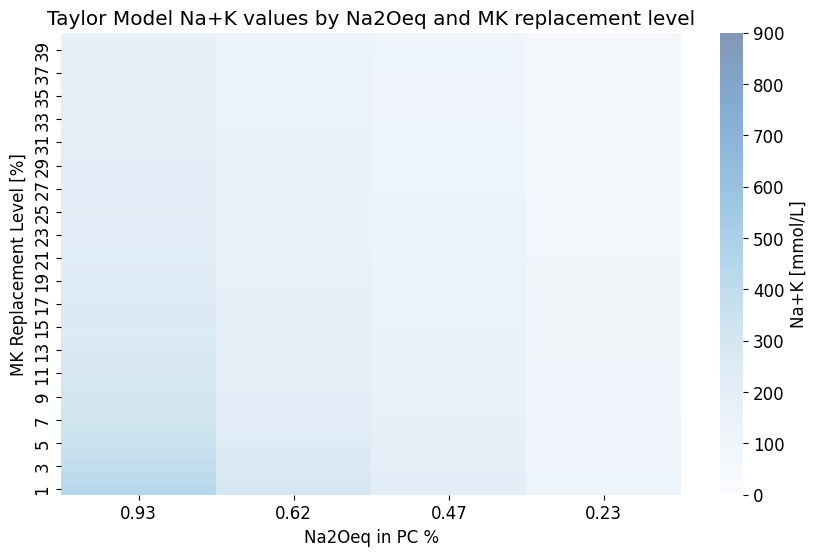

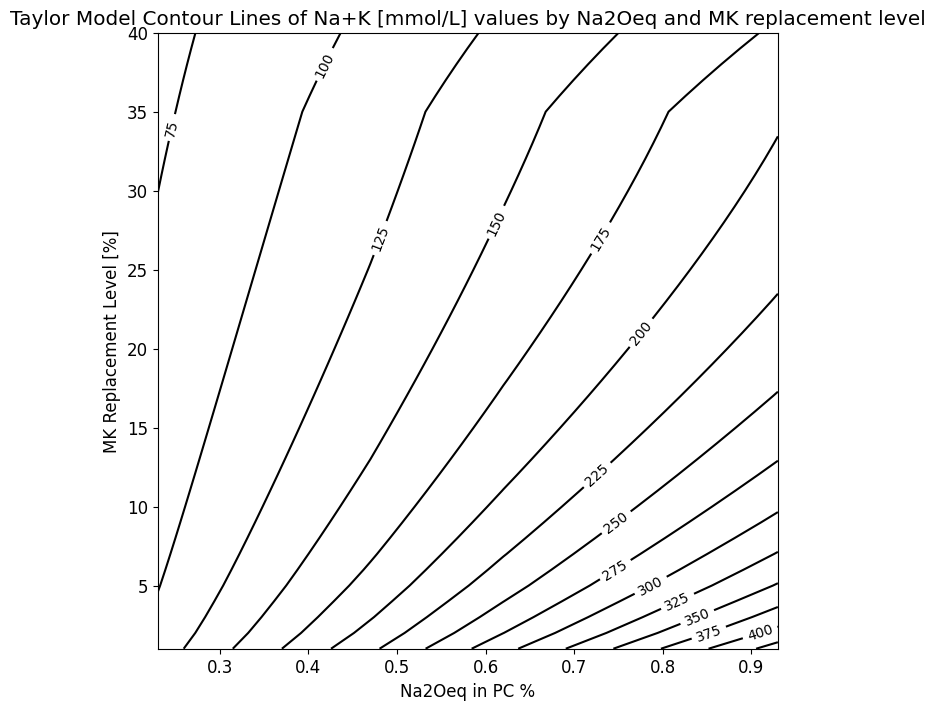

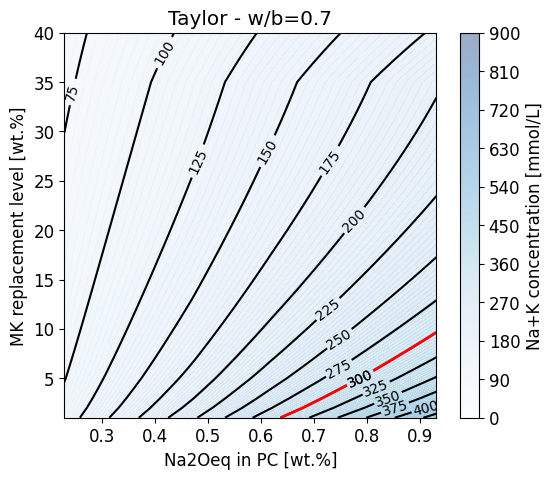

In [ ]:
import math
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Define SCM parameters
scm_parameters = {
    'FA': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0.04,
        'total_k_content_water_soluble': 0.03,
        'fraction_of_glass': 0.8,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.81,
        'm_tot_SCM_K': 2.74
    },
    'MK': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.05,
        'm_tot_SCM_K': 1
    },
    'SF': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.32,
        'm_tot_SCM_K': 0.71
    },
    'slag': {
        'binding_factor_na': 0.08,
        'binding_factor_k': 0.04,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.29,
        'm_tot_SCM_K': 0.38
    }
}

# Define cement parameters
cement_parameters = {
    '0.93': {'m_tot_PC_Na': 0.42, 'm_tot_PC_K': 0.78},
    '0.62': {'m_tot_PC_Na': 0.28, 'm_tot_PC_K': 0.52},
    '0.47': {'m_tot_PC_Na': 0.21, 'm_tot_PC_K': 0.39},
    '0.23': {'m_tot_PC_Na': 0.105, 'm_tot_PC_K': 0.195}
}


def get_scm_parameters(scm_type):
    return scm_parameters.get(scm_type, {})

def get_cement_parameters(alkali_content):
    return cement_parameters.get(alkali_content, {})

def calculate_dor_scm(scm_type_for_dor, replacement_level, time):
    if scm_type_for_dor == 'FA_RILEM':
        dor_scm = replacement_level * (0.49993 - 0.0041 * replacement_level)
    elif scm_type_for_dor == 'FA_Taylor':
        fraction_of_glass = scm_parameters['FA']['fraction_of_glass']
        dor_scm = fraction_of_glass * replacement_level * (1 - math.exp(-(0.043 - (replacement_level * fraction_of_glass * 0.0005)) * time ** (0.585 - (replacement_level * fraction_of_glass * 0.0005))))
    elif scm_type_for_dor == 'SF':
        dor_scm = replacement_level
    elif scm_type_for_dor == 'slag':
        dor_scm = replacement_level * 0.7
    elif scm_type_for_dor == 'MK':
        if replacement_level <= 5:
            dor_scm = replacement_level
        elif replacement_level <= 35:
            dor_scm = replacement_level * (100 - ((replacement_level - 5) * 60 / 30)) / 100
        else:
            dor_scm = replacement_level * 40 / 100
    else:
        dor_scm = 0  # Default value if scm_type does not match

    # print(f"Degree of Reaction (DoR) for SCM {scm_type_for_dor}: {dor_scm}")
    return dor_scm

def calculate_na_k_concentration(replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor):
    scm_params = get_scm_parameters(scm_type_for_parameters)
    cement_params = get_cement_parameters(alkali_content)

    binding_factor_na = scm_params['binding_factor_na']
    binding_factor_k = scm_params['binding_factor_k']
    total_na_content_water_soluble = scm_params['total_na_content_water_soluble']
    total_k_content_water_soluble = scm_params['total_k_content_water_soluble']
    fraction_of_glass = scm_params['fraction_of_glass']
    g_bound_water_per_g_reacted_scm = scm_params['g_bound_water_per_g_reacted_scm']
    m_tot_SCM_Na = scm_params['m_tot_SCM_Na']
    m_tot_SCM_K = scm_params['m_tot_SCM_K']

    m_tot_PC_Na = cement_params['m_tot_PC_Na']
    m_tot_PC_K = cement_params['m_tot_PC_K']

    dor_scm = calculate_dor_scm(scm_type_for_dor, replacement_level, time)

    na_mass = 23.0  # [g/mol]
    k_mass = 39.1   # [g/mol]
    na2o_mass = 62.0  # [g/mol]
    k2o_mass = 94.2   # [g/mol]

    # Calculate F functions
    F_C4AF = 1 - math.exp(-(0.55 + (0.012 * replacement_level)) * (time - 0.9) ** 0.26)
    F_C3A = 1 - math.exp(-(0.77 + (0.008 * replacement_level)) * (time - 0.9) ** 0.28)
    F_C2S = 1 - math.exp(-(0.12 - (0.0007 * replacement_level)) * time ** (0.46 - (0.002 * replacement_level)))
    F_C3S = 1 - math.exp(-(0.7 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)

    # print(f"F_C4AF: {F_C4AF}, F_C3A: {F_C3A}, F_C2S: {F_C2S}, F_C3S: {F_C3S}")

    # F_CRP function
    F_CRP = ((100 - replacement_level) / 100) * replacement_level ** 0.09 * (1 - math.exp(-(0.56 - (0.0043 * replacement_level)) * (time - 0.9) ** 0.25))
    # print(f"F_CRP: {F_CRP}")

    # Fractions for Alite, Belite, Aluminate, Ferrite
    na2o_fractions = {'Alite': 0.44, 'Belite': 0.17, 'Aluminate': 0.36, 'Ferrite': 0.03}
    k2o_fractions = {'Alite': 0.29, 'Belite': 0.41, 'Aluminate': 0.27, 'Ferrite': 0.03}

    # Calculate m_r_Na from PC
    total_na_content_water_soluble_PC = 35

    m_r_na_from_pc = (
        (m_tot_PC_Na * total_na_content_water_soluble_PC / 100) +
        (F_C3S * na2o_fractions['Alite'] + F_C2S * na2o_fractions['Belite'] + F_C3A * na2o_fractions['Aluminate'] + F_C4AF * na2o_fractions['Ferrite']) *
        (1 - total_na_content_water_soluble_PC / 100) * m_tot_PC_Na
    ) * ((100 - replacement_level) / 100) * 2 / na2o_mass
    # print(f"m_r_na_from_pc: {m_r_na_from_pc}")

    # Calculate m_r_Na from SCM
    m_r_na_from_scm = (
        (total_na_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_Na - total_na_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / na2o_mass
    # print(f"m_r_na_from_scm: {m_r_na_from_scm}")


    # Calculate V(t) pore solution
    V_b_t = 31.6 * ((100 - replacement_level) / 100) * (1 - math.exp(-(0.69 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)) + g_bound_water_per_g_reacted_scm * dor_scm
    V_t_pore_solution = (w_b_ratio * 100) - V_b_t
    # print(f"V_b_t: {V_b_t}, V_t_pore_solution: {V_t_pore_solution}")

    # Calculate Na concentration
    b_pc_na = 0.031
    na_concentration = ((m_r_na_from_pc + m_r_na_from_scm) * 1000 / (V_t_pore_solution +
     (b_pc_na * 1000 * F_CRP) +binding_factor_na * 10 * dor_scm)) * 1000
    # print(f"na_concentration: {na_concentration}")



    # Calculate K concentration
    total_k_content_water_soluble_PC = 70

    m_r_k_from_pc = (
        (m_tot_PC_K * total_k_content_water_soluble_PC/ 100) +
        (F_C3S * k2o_fractions['Alite'] + F_C2S * k2o_fractions['Belite'] + F_C3A * k2o_fractions['Aluminate'] + F_C4AF * k2o_fractions['Ferrite']) *
        (1 - total_k_content_water_soluble_PC / 100) * m_tot_PC_K
    ) * ((100 - replacement_level) / 100) * 2 / k2o_mass
    # print(f"m_r_k_from_pc: {m_r_k_from_pc}")


    m_r_k_from_scm = (
        (total_k_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_K - total_k_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / k2o_mass
    # print(f"m_r_k_from_scm: {m_r_k_from_scm}")

    b_pc_k = 0.02

    k_concentration = ((m_r_k_from_pc + m_r_k_from_scm) * 1000 / (V_t_pore_solution + (b_pc_k * 1000 * F_CRP)
    + binding_factor_k * 10 * dor_scm)) * 1000

    # Calculate total Na+K concentration
    na_k_concentration = na_concentration + k_concentration

    return na_k_concentration, na_concentration, k_concentration

# Constants
scm_type_for_parameters = 'MK'  # SCM type for selecting parameters
scm_type_for_dor = 'MK'  # SCM type for calculating DoR
time = 180  # Constant time value

# Define the ranges for the parameters
replacement_levels = range(1, 101)  # Replacement levels from 1 to 100
alkali_contents = ['0.93','0.62', '0.47','0.23' ]  # Different alkali content values
w_b_ratios = [0.7]  # Only w/b ratio of 0.9

# Function to calculate the concentrations
def calculate_concentrations(replacement_levels, alkali_contents, w_b_ratios):
    results = []
    for replacement_level in replacement_levels:
        for alkali_content in alkali_contents:
            for w_b_ratio in w_b_ratios:
                na_k_concentration, na_concentration, k_concentration = calculate_na_k_concentration(
                    replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor
                )
                results.append((replacement_level, alkali_content, w_b_ratio, na_k_concentration, na_concentration, k_concentration))
    return results

# Calculate the concentrations
concentrations = calculate_concentrations(replacement_levels, alkali_contents, w_b_ratios)

# Convert to DataFrame
df_combined = pd.DataFrame(concentrations, columns=['Replacement Level', 'Alkali Content', 'w/b Ratio', 'Na+K Concentration', 'Na Concentration', 'K Concentration'])

# Filter the data to include only replacement levels up to 40
filtered_df = df_combined[df_combined['Replacement Level'] <= 40]

# Pivot the DataFrame to get the necessary format for contour plotting
pivot_table = filtered_df.pivot(index='Replacement Level', columns='Alkali Content', values='Na+K Concentration')

# Extract values for contour plot
X = pivot_table.columns.values.astype(float)
Y = pivot_table.index.values.astype(float)
Z = pivot_table.values

# Define the constant range for the color bar
vmin_value_Na2O = 0
vmax_value_Na2O = 900

# Plotting the heatmap with seaborn and setting the color scale limits
plt.figure(figsize=(10, 6))
heatmap = sns.heatmap(pivot_table, annot=False, fmt=".0f", linewidths=.0, cmap="Blues",
                      vmin=vmin_value_Na2O, vmax=vmax_value_Na2O, alpha=0.5)
heatmap.invert_yaxis()  # Invert the y-axis to have the highest replacement level at the top
heatmap.invert_xaxis()

# Add color bar with the defined limits and label
colorbar = heatmap.collections[0].colorbar
colorbar.set_label('Na+K [mmol/L]')
colorbar.set_ticks(np.linspace(vmin_value_Na2O, vmax_value_Na2O, num=len(colorbar.get_ticks())))

plt.xlabel('Na2Oeq in PC %')
plt.ylabel('MK Replacement Level [%]')
plt.title('Taylor Model Na+K values by Na2Oeq and MK replacement level')

# plt.show()

# Creating a meshgrid for the contour plot with the correct orientation
X_Na2O, Y_Na2O = np.meshgrid(X, Y)

# Plotting the contour lines
plt.figure(figsize=(8, 8))
contour_lines_Na2O = plt.contour(X_Na2O, Y_Na2O, Z, levels=15, colors='black')
plt.clabel(contour_lines_Na2O, inline=True, fontsize=10)
plt.title('Taylor Model Contour Lines of Na+K [mmol/L] values by Na2Oeq and MK replacement level')
plt.xlabel('Na2Oeq in PC %')
plt.ylabel('MK Replacement Level [%]')
# plt.gca().invert_yaxis()  # Invert the y-axis if needed
# plt.show()

# Creating filled contour plot with colors corresponding to the levels of Na2O values within the specified range
plt.figure(figsize=(6, 5))
contour_filled_Na2O = plt.contourf(X_Na2O, Y_Na2O, Z, levels=np.linspace(vmin_value_Na2O, vmax_value_Na2O, 300),
                              cmap="Blues", alpha=0.4, vmin=vmin_value_Na2O, vmax=vmax_value_Na2O)

# Adding contour lines on top of the filled contour for better visibility of the levels
contour_lines_Na2O = plt.contour(X_Na2O, Y_Na2O, Z, levels=15, colors='black')
plt.clabel(contour_lines_Na2O, inline=True, fontsize=10)


# Adding the bold contour line for level 300
bold_contour = plt.contour(X_Na2O, Y_Na2O, Z, levels=[300], colors='red', linewidths=2)
# Adding labels manually with specific font properties
fmt = {300: '300'}
labels = plt.clabel(bold_contour, fmt=fmt, colors='black', fontsize=10, inline=True)

# Adding color bar on the side to represent the scale with the defined range
colorbar_Na2O = plt.colorbar(contour_filled_Na2O, extend='both', ticks=np.linspace(vmin_value_Na2O, vmax_value_Na2O, 11))
colorbar_Na2O.set_label('Na+K concentration [mmol/L]')

plt.title('Taylor - w/b=0.7')
plt.xlabel('Na2Oeq in PC [wt.%]')
plt.ylabel('MK replacement level [wt.%]')

plt.show()



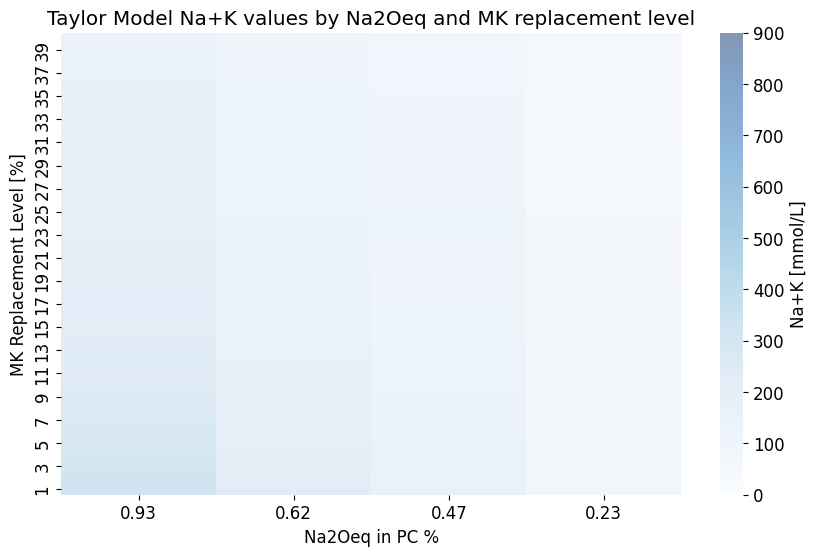

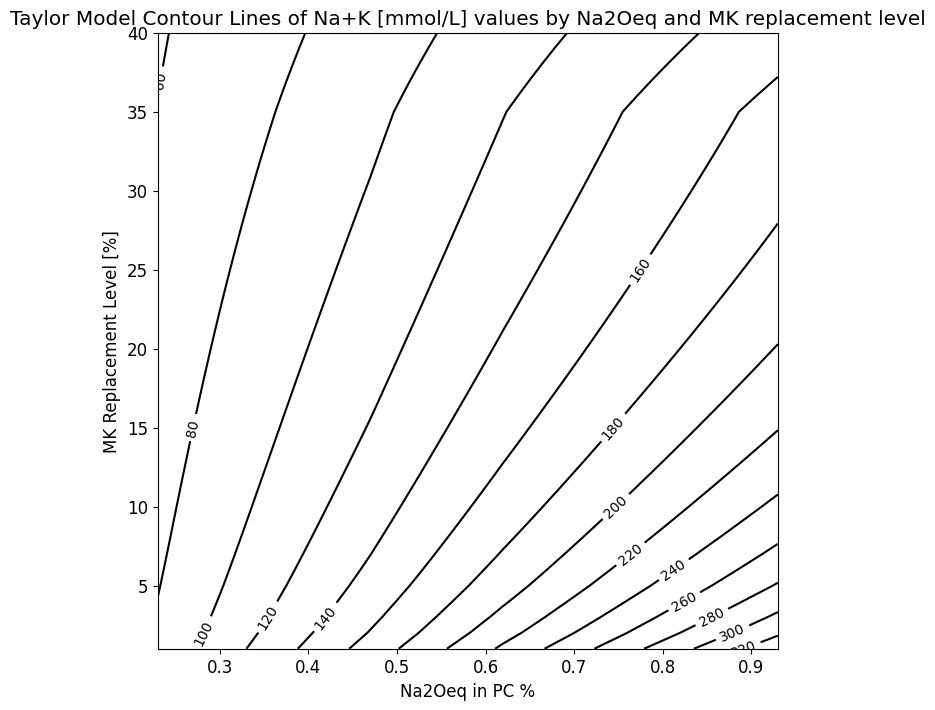

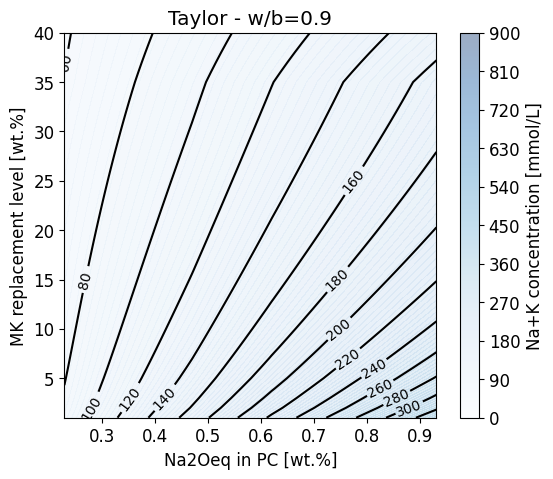

In [ ]:
import math
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Define SCM parameters
scm_parameters = {
    'FA': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0.04,
        'total_k_content_water_soluble': 0.03,
        'fraction_of_glass': 0.8,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.81,
        'm_tot_SCM_K': 2.74
    },
    'MK': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.05,
        'm_tot_SCM_K': 1
    },
    'SF': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.32,
        'm_tot_SCM_K': 0.71
    },
    'slag': {
        'binding_factor_na': 0.08,
        'binding_factor_k': 0.04,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.29,
        'm_tot_SCM_K': 0.38
    }
}

# Define cement parameters
cement_parameters = {
    '0.93': {'m_tot_PC_Na': 0.42, 'm_tot_PC_K': 0.78},
    '0.62': {'m_tot_PC_Na': 0.28, 'm_tot_PC_K': 0.52},
    '0.47': {'m_tot_PC_Na': 0.21, 'm_tot_PC_K': 0.39},
    '0.23': {'m_tot_PC_Na': 0.105, 'm_tot_PC_K': 0.195}
}


def get_scm_parameters(scm_type):
    return scm_parameters.get(scm_type, {})

def get_cement_parameters(alkali_content):
    return cement_parameters.get(alkali_content, {})

def calculate_dor_scm(scm_type_for_dor, replacement_level, time):
    if scm_type_for_dor == 'FA_RILEM':
        dor_scm = replacement_level * (0.49993 - 0.0041 * replacement_level)
    elif scm_type_for_dor == 'FA_Taylor':
        fraction_of_glass = scm_parameters['FA']['fraction_of_glass']
        dor_scm = fraction_of_glass * replacement_level * (1 - math.exp(-(0.043 - (replacement_level * fraction_of_glass * 0.0005)) * time ** (0.585 - (replacement_level * fraction_of_glass * 0.0005))))
    elif scm_type_for_dor == 'SF':
        dor_scm = replacement_level
    elif scm_type_for_dor == 'slag':
        dor_scm = replacement_level * 0.7
    elif scm_type_for_dor == 'MK':
        if replacement_level <= 5:
            dor_scm = replacement_level
        elif replacement_level <= 35:
            dor_scm = replacement_level * (100 - ((replacement_level - 5) * 60 / 30)) / 100
        else:
            dor_scm = replacement_level * 40 / 100
    else:
        dor_scm = 0  # Default value if scm_type does not match

    # print(f"Degree of Reaction (DoR) for SCM {scm_type_for_dor}: {dor_scm}")
    return dor_scm

def calculate_na_k_concentration(replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor):
    scm_params = get_scm_parameters(scm_type_for_parameters)
    cement_params = get_cement_parameters(alkali_content)

    binding_factor_na = scm_params['binding_factor_na']
    binding_factor_k = scm_params['binding_factor_k']
    total_na_content_water_soluble = scm_params['total_na_content_water_soluble']
    total_k_content_water_soluble = scm_params['total_k_content_water_soluble']
    fraction_of_glass = scm_params['fraction_of_glass']
    g_bound_water_per_g_reacted_scm = scm_params['g_bound_water_per_g_reacted_scm']
    m_tot_SCM_Na = scm_params['m_tot_SCM_Na']
    m_tot_SCM_K = scm_params['m_tot_SCM_K']

    m_tot_PC_Na = cement_params['m_tot_PC_Na']
    m_tot_PC_K = cement_params['m_tot_PC_K']

    dor_scm = calculate_dor_scm(scm_type_for_dor, replacement_level, time)

    na_mass = 23.0  # [g/mol]
    k_mass = 39.1   # [g/mol]
    na2o_mass = 62.0  # [g/mol]
    k2o_mass = 94.2   # [g/mol]

    # Calculate F functions
    F_C4AF = 1 - math.exp(-(0.55 + (0.012 * replacement_level)) * (time - 0.9) ** 0.26)
    F_C3A = 1 - math.exp(-(0.77 + (0.008 * replacement_level)) * (time - 0.9) ** 0.28)
    F_C2S = 1 - math.exp(-(0.12 - (0.0007 * replacement_level)) * time ** (0.46 - (0.002 * replacement_level)))
    F_C3S = 1 - math.exp(-(0.7 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)

    # print(f"F_C4AF: {F_C4AF}, F_C3A: {F_C3A}, F_C2S: {F_C2S}, F_C3S: {F_C3S}")

    # F_CRP function
    F_CRP = ((100 - replacement_level) / 100) * replacement_level ** 0.09 * (1 - math.exp(-(0.56 - (0.0043 * replacement_level)) * (time - 0.9) ** 0.25))
    # print(f"F_CRP: {F_CRP}")

    # Fractions for Alite, Belite, Aluminate, Ferrite
    na2o_fractions = {'Alite': 0.44, 'Belite': 0.17, 'Aluminate': 0.36, 'Ferrite': 0.03}
    k2o_fractions = {'Alite': 0.29, 'Belite': 0.41, 'Aluminate': 0.27, 'Ferrite': 0.03}

    # Calculate m_r_Na from PC
    total_na_content_water_soluble_PC = 35

    m_r_na_from_pc = (
        (m_tot_PC_Na * total_na_content_water_soluble_PC / 100) +
        (F_C3S * na2o_fractions['Alite'] + F_C2S * na2o_fractions['Belite'] + F_C3A * na2o_fractions['Aluminate'] + F_C4AF * na2o_fractions['Ferrite']) *
        (1 - total_na_content_water_soluble_PC / 100) * m_tot_PC_Na
    ) * ((100 - replacement_level) / 100) * 2 / na2o_mass
    # print(f"m_r_na_from_pc: {m_r_na_from_pc}")

    # Calculate m_r_Na from SCM
    m_r_na_from_scm = (
        (total_na_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_Na - total_na_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / na2o_mass
    # print(f"m_r_na_from_scm: {m_r_na_from_scm}")


    # Calculate V(t) pore solution
    V_b_t = 31.6 * ((100 - replacement_level) / 100) * (1 - math.exp(-(0.69 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)) + g_bound_water_per_g_reacted_scm * dor_scm
    V_t_pore_solution = (w_b_ratio * 100) - V_b_t
    # print(f"V_b_t: {V_b_t}, V_t_pore_solution: {V_t_pore_solution}")

    # Calculate Na concentration
    b_pc_na = 0.031
    na_concentration = ((m_r_na_from_pc + m_r_na_from_scm) * 1000 / (V_t_pore_solution +
     (b_pc_na * 1000 * F_CRP) +binding_factor_na * 10 * dor_scm)) * 1000
    # print(f"na_concentration: {na_concentration}")



    # Calculate K concentration
    total_k_content_water_soluble_PC = 70

    m_r_k_from_pc = (
        (m_tot_PC_K * total_k_content_water_soluble_PC/ 100) +
        (F_C3S * k2o_fractions['Alite'] + F_C2S * k2o_fractions['Belite'] + F_C3A * k2o_fractions['Aluminate'] + F_C4AF * k2o_fractions['Ferrite']) *
        (1 - total_k_content_water_soluble_PC / 100) * m_tot_PC_K
    ) * ((100 - replacement_level) / 100) * 2 / k2o_mass
    # print(f"m_r_k_from_pc: {m_r_k_from_pc}")


    m_r_k_from_scm = (
        (total_k_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_K - total_k_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / k2o_mass
    # print(f"m_r_k_from_scm: {m_r_k_from_scm}")

    b_pc_k = 0.02

    k_concentration = ((m_r_k_from_pc + m_r_k_from_scm) * 1000 / (V_t_pore_solution + (b_pc_k * 1000 * F_CRP)
    + binding_factor_k * 10 * dor_scm)) * 1000

    # Calculate total Na+K concentration
    na_k_concentration = na_concentration + k_concentration

    return na_k_concentration, na_concentration, k_concentration

# Constants
scm_type_for_parameters = 'MK'  # SCM type for selecting parameters
scm_type_for_dor = 'MK'  # SCM type for calculating DoR
time = 180  # Constant time value

# Define the ranges for the parameters
replacement_levels = range(1, 101)  # Replacement levels from 1 to 100
alkali_contents = ['0.93','0.62', '0.47','0.23' ]  # Different alkali content values
w_b_ratios = [0.9]  # Only w/b ratio of 0.9

# Function to calculate the concentrations
def calculate_concentrations(replacement_levels, alkali_contents, w_b_ratios):
    results = []
    for replacement_level in replacement_levels:
        for alkali_content in alkali_contents:
            for w_b_ratio in w_b_ratios:
                na_k_concentration, na_concentration, k_concentration = calculate_na_k_concentration(
                    replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor
                )
                results.append((replacement_level, alkali_content, w_b_ratio, na_k_concentration, na_concentration, k_concentration))
    return results

# Calculate the concentrations
concentrations = calculate_concentrations(replacement_levels, alkali_contents, w_b_ratios)

# Convert to DataFrame
df_combined = pd.DataFrame(concentrations, columns=['Replacement Level', 'Alkali Content', 'w/b Ratio', 'Na+K Concentration', 'Na Concentration', 'K Concentration'])

# Filter the data to include only replacement levels up to 40
filtered_df = df_combined[df_combined['Replacement Level'] <= 40]

# Pivot the DataFrame to get the necessary format for contour plotting
pivot_table = filtered_df.pivot(index='Replacement Level', columns='Alkali Content', values='Na+K Concentration')

# Extract values for contour plot
X = pivot_table.columns.values.astype(float)
Y = pivot_table.index.values.astype(float)
Z = pivot_table.values

# Define the constant range for the color bar
vmin_value_Na2O = 0
vmax_value_Na2O = 900

# Plotting the heatmap with seaborn and setting the color scale limits
plt.figure(figsize=(10, 6))
heatmap = sns.heatmap(pivot_table, annot=False, fmt=".0f", linewidths=.0, cmap="Blues",
                      vmin=vmin_value_Na2O, vmax=vmax_value_Na2O, alpha=0.5)
heatmap.invert_yaxis()  # Invert the y-axis to have the highest replacement level at the top
heatmap.invert_xaxis()

# Add color bar with the defined limits and label
colorbar = heatmap.collections[0].colorbar
colorbar.set_label('Na+K [mmol/L]')
colorbar.set_ticks(np.linspace(vmin_value_Na2O, vmax_value_Na2O, num=len(colorbar.get_ticks())))

plt.xlabel('Na2Oeq in PC %')
plt.ylabel('MK Replacement Level [%]')
plt.title('Taylor Model Na+K values by Na2Oeq and MK replacement level')

# plt.show()

# Creating a meshgrid for the contour plot with the correct orientation
X_Na2O, Y_Na2O = np.meshgrid(X, Y)

# Plotting the contour lines
plt.figure(figsize=(8, 8))
contour_lines_Na2O = plt.contour(X_Na2O, Y_Na2O, Z, levels=15, colors='black')
plt.clabel(contour_lines_Na2O, inline=True, fontsize=10)
plt.title('Taylor Model Contour Lines of Na+K [mmol/L] values by Na2Oeq and MK replacement level')
plt.xlabel('Na2Oeq in PC %')
plt.ylabel('MK Replacement Level [%]')
# plt.gca().invert_yaxis()  # Invert the y-axis if needed
# plt.show()

# Creating filled contour plot with colors corresponding to the levels of Na2O values within the specified range
plt.figure(figsize=(6, 5))
contour_filled_Na2O = plt.contourf(X_Na2O, Y_Na2O, Z, levels=np.linspace(vmin_value_Na2O, vmax_value_Na2O, 300),
                              cmap="Blues", alpha=0.4, vmin=vmin_value_Na2O, vmax=vmax_value_Na2O)

# Adding contour lines on top of the filled contour for better visibility of the levels
contour_lines_Na2O = plt.contour(X_Na2O, Y_Na2O, Z, levels=15, colors='black')
plt.clabel(contour_lines_Na2O, inline=True, fontsize=10)

# Adding color bar on the side to represent the scale with the defined range
colorbar_Na2O = plt.colorbar(contour_filled_Na2O, extend='both', ticks=np.linspace(vmin_value_Na2O, vmax_value_Na2O, 11))
colorbar_Na2O.set_label('Na+K concentration [mmol/L]')

plt.title('Taylor - w/b=0.9')
plt.xlabel('Na2Oeq in PC [wt.%]')
plt.ylabel('MK replacement level [wt.%]')

plt.show()



MK COMPOSITE CEMENTS WITH VARYING W/B RATIO

            0.4       0.5       0.6       0.7       0.8       0.9
1e-09  574.2643  516.2509  462.7958  417.9820  376.4479  337.2176
1      570.3107  512.2652  458.5861  411.6066  370.9138  336.0304
2      566.9243  510.9712  460.1384  415.5696  373.5386  335.1627
3      563.3810  507.9534  457.3133  414.9521  371.9440  334.0686
4      560.1598  506.2274  455.7664  414.1380  370.5402  332.8677


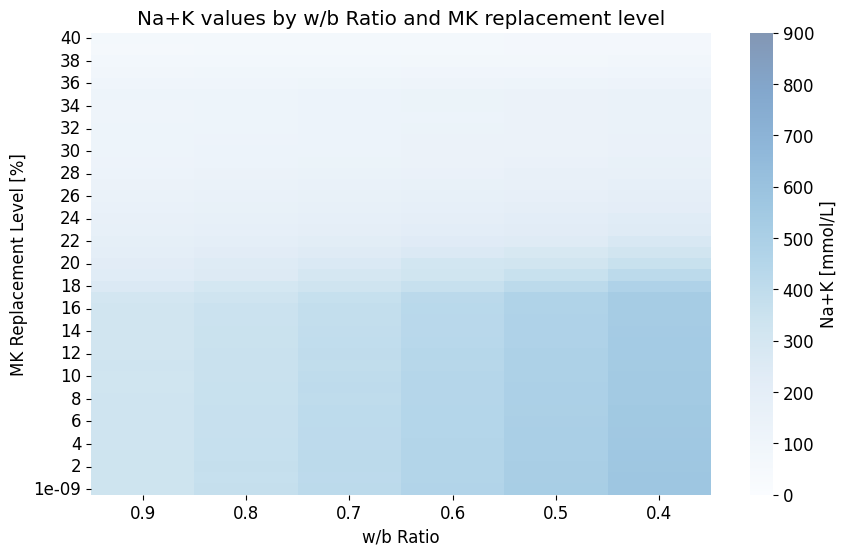

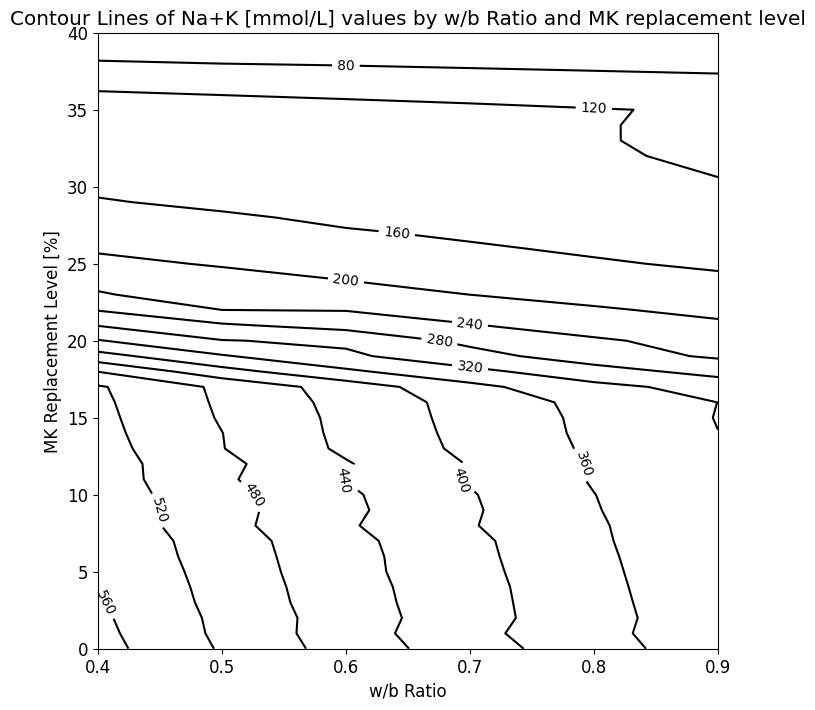

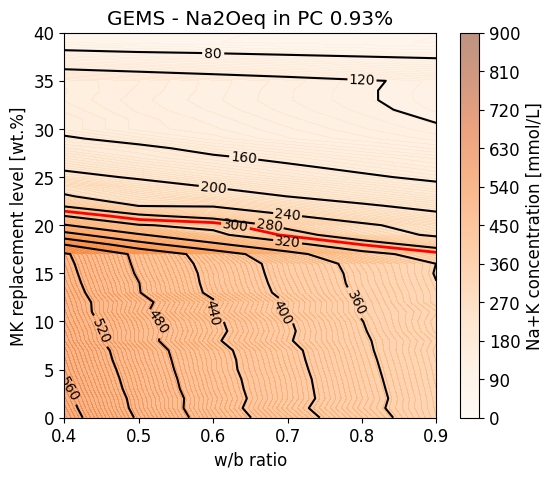

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load the spreadsheet
file_path = '/content/2024-06-05 Ana_wb for different alkali_MK.xlsx'
df = pd.read_excel(file_path, sheet_name='Summary', header=None)

# Extract the required values
alkali_levels = df.iloc[1, 1:29].values
wb_ratios = df.iloc[2, 1:29].values
MK_replacement = df.iloc[4:105, 0].values
concentration_levels = df.iloc[4:105, 1:29].values

# Filter data to include only replacement levels up to 40
valid_indices_replacement = MK_replacement <= 40
MK_replacement = MK_replacement[valid_indices_replacement]
concentration_levels = concentration_levels[valid_indices_replacement]

# Filter data to include only alkali levels equal to 0.93
valid_indices_alkali = alkali_levels == 0.93
wb_ratios = wb_ratios[valid_indices_alkali]
concentration_levels = concentration_levels[:, valid_indices_alkali]

# Further filter to include only w/b ratios starting from 0.4
valid_indices_wb_start = wb_ratios >= 0.4
wb_ratios = wb_ratios[valid_indices_wb_start]
concentration_levels = concentration_levels[:, valid_indices_wb_start]

# Create a DataFrame for the concentration levels
df_concentration = pd.DataFrame(concentration_levels, index=MK_replacement, columns=wb_ratios)

# Ensure all values are numeric
df_concentration = df_concentration.apply(pd.to_numeric, errors='coerce')

# Convert column names to strings, remove percentage symbols, and convert to float
df_concentration.columns = df_concentration.columns.astype(str).str.rstrip('%').astype(float)

# Print to verify the data
print(df_concentration.head())

# Define the constant range for the color bar
vmin_value_Na2O = 0
vmax_value_Na2O = 900

# Plotting the heatmap with seaborn and setting the color scale limits
plt.figure(figsize=(10, 6))
heatmap = sns.heatmap(df_concentration, annot=False, fmt=".0f", linewidths=.0, cmap="Blues",
                      vmin=vmin_value_Na2O, vmax=vmax_value_Na2O, alpha=0.5)  # Set the color scale limits here
heatmap.invert_yaxis()  # Invert the y-axis to have the highest replacement level at the top
heatmap.invert_xaxis()

# Add color bar with the defined limits and label
colorbar = heatmap.collections[0].colorbar
colorbar.set_label('Na+K [mmol/L]')
colorbar.set_ticks(np.linspace(vmin_value_Na2O, vmax_value_Na2O, num=len(colorbar.get_ticks())))

plt.xlabel('w/b Ratio')
plt.ylabel('MK Replacement Level [%]')
plt.title('Na+K values by w/b Ratio and MK replacement level')

# plt.show()

# Creating a meshgrid for the contour plot with the correct orientation
X_Na2O, Y_Na2O = np.meshgrid(df_concentration.columns, df_concentration.index)
Z_Na2O = df_concentration.values

# Plotting the contour lines
plt.figure(figsize=(8, 8))
contour_lines_Na2O = plt.contour(X_Na2O, Y_Na2O, Z_Na2O, levels=15, colors='black')
plt.clabel(contour_lines_Na2O, inline=True, fontsize=10)
plt.title('Contour Lines of Na+K [mmol/L] values by w/b Ratio and MK replacement level')
plt.xlabel('w/b Ratio')
plt.ylabel('MK Replacement Level [%]')
# plt.gca().invert_yaxis()  # Invert the y-axis if needed
# plt.show()

# Creating filled contour plot with colors corresponding to the levels of Na2O values within the specified range
plt.figure(figsize=(6, 5))
contour_filled_Na2O = plt.contourf(X_Na2O, Y_Na2O, Z_Na2O, levels=np.linspace(vmin_value_Na2O, vmax_value_Na2O, 300),
                              cmap="Oranges", alpha=0.5, vmin=vmin_value_Na2O, vmax=vmax_value_Na2O)

# Adding contour lines on top of the filled contour for better visibility of the levels
contour_lines_Na2O = plt.contour(X_Na2O, Y_Na2O, Z_Na2O, levels=15, colors='black')
plt.clabel(contour_lines_Na2O, inline=True, fontsize=10)

# Adding the bold contour line for level 300
bold_contour = plt.contour(X_Na2O, Y_Na2O, Z_Na2O, levels=[300], colors='red', linewidths=2)
# # Adding labels manually with specific font properties
fmt = {300: '300'}
labels = plt.clabel(bold_contour, fmt=fmt, colors='black', fontsize=10, inline=True)

# Adding color bar on the side to represent the scale with the defined range
colorbar_Na2O = plt.colorbar(contour_filled_Na2O, extend='both', ticks=np.linspace(vmin_value_Na2O, vmax_value_Na2O, 11))
colorbar_Na2O.set_label('Na+K concentration [mmol/L]')

plt.title('GEMS - Na2Oeq in PC 0.93%')
plt.xlabel('w/b ratio')
plt.ylabel('MK replacement level [wt.%]')

plt.show()


            0.4       0.5       0.6       0.7       0.8       0.9
1e-09  463.7568  402.0714  351.1478  307.9393  273.0644  241.8019
1      461.7617  408.2763  350.1779  305.3656  273.1926  240.4967
2      460.3436  408.0591  351.3716  305.7477  269.7639  241.0840
3      458.4354  407.4842  351.1308  305.8391  270.2167  241.4645
4      457.4169  406.2922  350.7029  306.0595  270.6800  242.0316


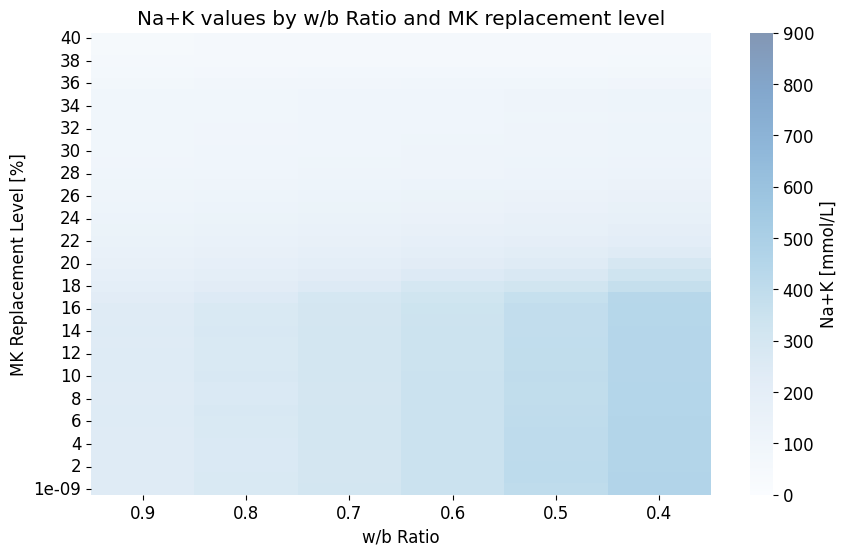

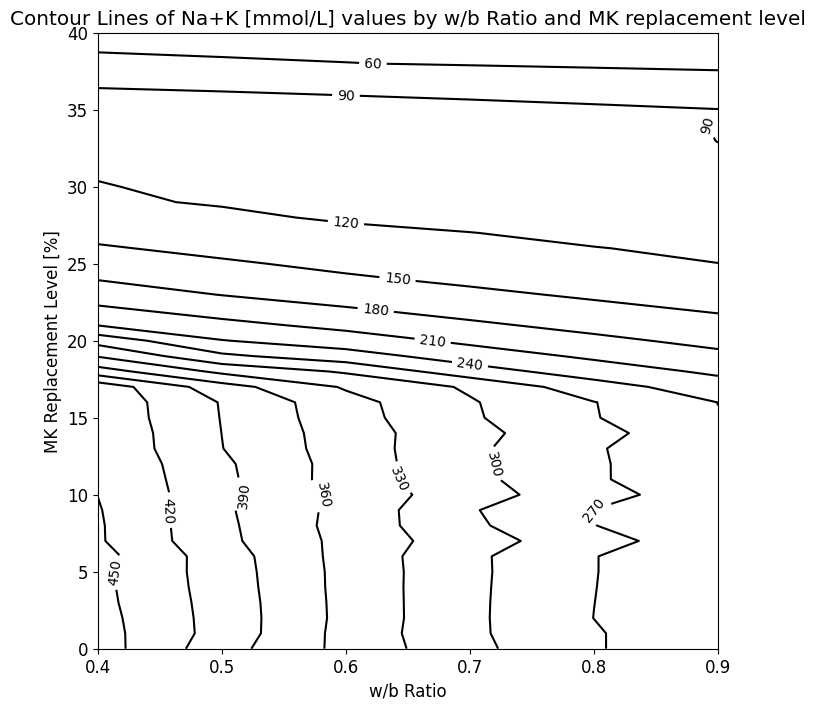

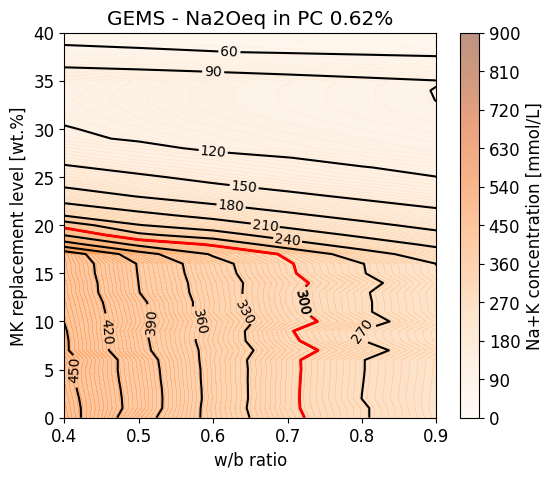

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load the spreadsheet
file_path = '/content/2024-06-05 Ana_wb for different alkali_MK.xlsx'
df = pd.read_excel(file_path, sheet_name='Summary', header=None)

# Extract the required values
alkali_levels = df.iloc[1, 1:29].values
wb_ratios = df.iloc[2, 1:29].values
MK_replacement = df.iloc[4:105, 0].values
concentration_levels = df.iloc[4:105, 1:29].values

# Filter data to include only replacement levels up to 40
valid_indices_replacement = MK_replacement <= 40
MK_replacement = MK_replacement[valid_indices_replacement]
concentration_levels = concentration_levels[valid_indices_replacement]

# Filter data to include only alkali levels equal to 0.93
valid_indices_alkali = alkali_levels == 0.62
wb_ratios = wb_ratios[valid_indices_alkali]
concentration_levels = concentration_levels[:, valid_indices_alkali]

# Further filter to include only w/b ratios starting from 0.4
valid_indices_wb_start = wb_ratios >= 0.4
wb_ratios = wb_ratios[valid_indices_wb_start]
concentration_levels = concentration_levels[:, valid_indices_wb_start]

# Create a DataFrame for the concentration levels
df_concentration = pd.DataFrame(concentration_levels, index=MK_replacement, columns=wb_ratios)

# Ensure all values are numeric
df_concentration = df_concentration.apply(pd.to_numeric, errors='coerce')

# Convert column names to strings, remove percentage symbols, and convert to float
df_concentration.columns = df_concentration.columns.astype(str).str.rstrip('%').astype(float)

# Print to verify the data
print(df_concentration.head())

# Define the constant range for the color bar
vmin_value_Na2O = 0
vmax_value_Na2O = 900

# Plotting the heatmap with seaborn and setting the color scale limits
plt.figure(figsize=(10, 6))
heatmap = sns.heatmap(df_concentration, annot=False, fmt=".0f", linewidths=.0, cmap="Blues",
                      vmin=vmin_value_Na2O, vmax=vmax_value_Na2O, alpha=0.5)  # Set the color scale limits here
heatmap.invert_yaxis()  # Invert the y-axis to have the highest replacement level at the top
heatmap.invert_xaxis()

# Add color bar with the defined limits and label
colorbar = heatmap.collections[0].colorbar
colorbar.set_label('Na+K [mmol/L]')
colorbar.set_ticks(np.linspace(vmin_value_Na2O, vmax_value_Na2O, num=len(colorbar.get_ticks())))

plt.xlabel('w/b Ratio')
plt.ylabel('MK Replacement Level [%]')
plt.title('Na+K values by w/b Ratio and MK replacement level')

# plt.show()

# Creating a meshgrid for the contour plot with the correct orientation
X_Na2O, Y_Na2O = np.meshgrid(df_concentration.columns, df_concentration.index)
Z_Na2O = df_concentration.values

# Plotting the contour lines
plt.figure(figsize=(8, 8))
contour_lines_Na2O = plt.contour(X_Na2O, Y_Na2O, Z_Na2O, levels=15, colors='black')
plt.clabel(contour_lines_Na2O, inline=True, fontsize=10)
plt.title('Contour Lines of Na+K [mmol/L] values by w/b Ratio and MK replacement level')
plt.xlabel('w/b Ratio')
plt.ylabel('MK Replacement Level [%]')
# plt.gca().invert_yaxis()  # Invert the y-axis if needed
# plt.show()

# Creating filled contour plot with colors corresponding to the levels of Na2O values within the specified range
plt.figure(figsize=(6, 5))
contour_filled_Na2O = plt.contourf(X_Na2O, Y_Na2O, Z_Na2O, levels=np.linspace(vmin_value_Na2O, vmax_value_Na2O, 300),
                              cmap="Oranges", alpha=0.5, vmin=vmin_value_Na2O, vmax=vmax_value_Na2O)

# Adding contour lines on top of the filled contour for better visibility of the levels
contour_lines_Na2O = plt.contour(X_Na2O, Y_Na2O, Z_Na2O, levels=15, colors='black')
plt.clabel(contour_lines_Na2O, inline=True, fontsize=10)

# Adding color bar on the side to represent the scale with the defined range
colorbar_Na2O = plt.colorbar(contour_filled_Na2O, extend='both', ticks=np.linspace(vmin_value_Na2O, vmax_value_Na2O, 11))
colorbar_Na2O.set_label('Na+K concentration [mmol/L]')

# Adding the bold contour line for level 300
bold_contour = plt.contour(X_Na2O, Y_Na2O, Z_Na2O, levels=[300], colors='red', linewidths=2)
# # Adding labels manually with specific font properties
fmt = {300: '300'}
labels = plt.clabel(bold_contour, fmt=fmt, colors='black', fontsize=10, inline=True)

plt.title('GEMS - Na2Oeq in PC 0.62%')
plt.xlabel('w/b ratio')
plt.ylabel('MK replacement level [wt.%]')

plt.show()


            0.4       0.5       0.6       0.7       0.8       0.9
1e-09  393.3910  333.7649  287.3295  247.1765  210.5705  185.6709
1      400.3344  335.2700  288.1966  248.5624  211.8244  186.8346
2      395.2003  334.8510  284.4128  245.9125  215.4078  190.6268
3      393.6222  335.4499  285.5346  247.0641  216.6947  191.9769
4      395.0728  336.3112  286.9162  248.3612  217.9193  192.9790


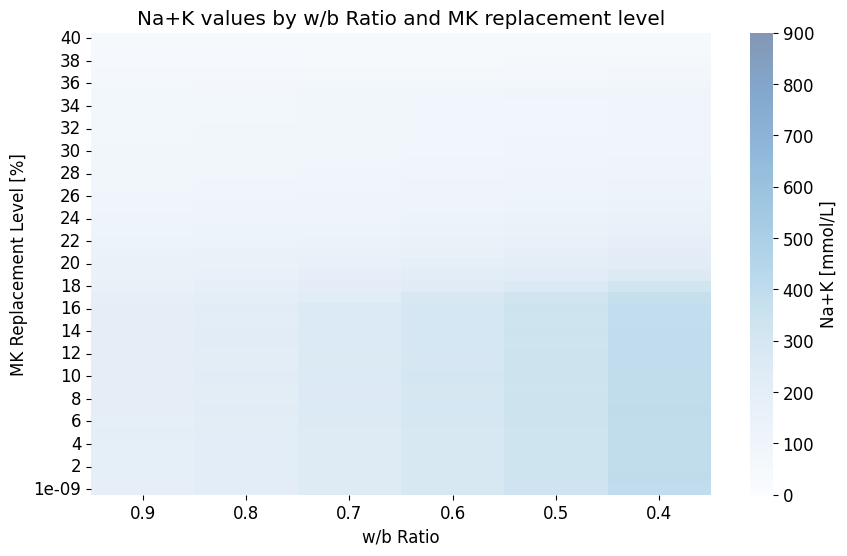

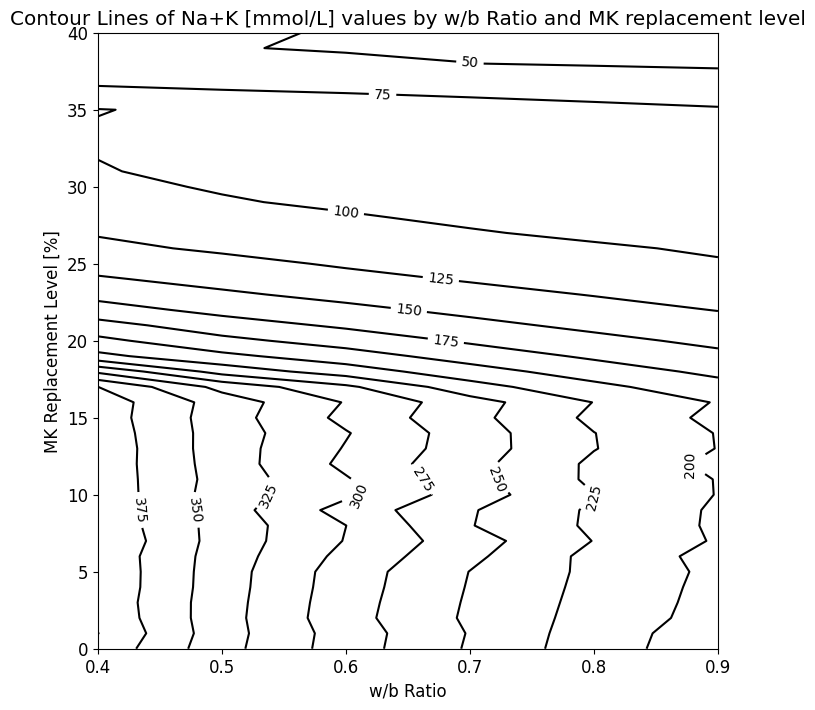

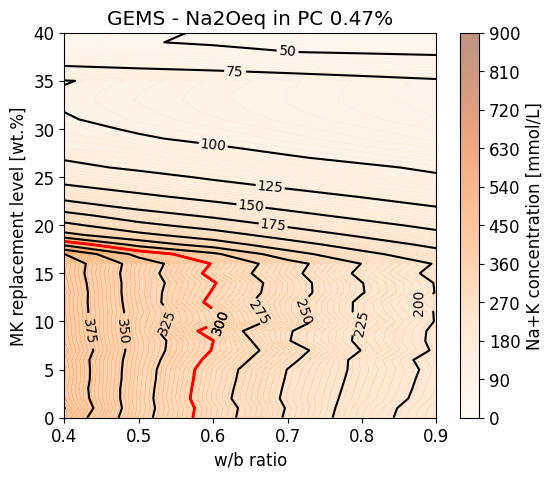

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load the spreadsheet
file_path = '/content/2024-06-05 Ana_wb for different alkali_MK.xlsx'
df = pd.read_excel(file_path, sheet_name='Summary', header=None)

# Extract the required values
alkali_levels = df.iloc[1, 1:29].values
wb_ratios = df.iloc[2, 1:29].values
MK_replacement = df.iloc[4:105, 0].values
concentration_levels = df.iloc[4:105, 1:29].values

# Filter data to include only replacement levels up to 40
valid_indices_replacement = MK_replacement <= 40
MK_replacement = MK_replacement[valid_indices_replacement]
concentration_levels = concentration_levels[valid_indices_replacement]

# Filter data to include only alkali levels equal to 0.93
valid_indices_alkali = alkali_levels == 0.47
wb_ratios = wb_ratios[valid_indices_alkali]
concentration_levels = concentration_levels[:, valid_indices_alkali]

# Further filter to include only w/b ratios starting from 0.4
valid_indices_wb_start = wb_ratios >= 0.4
wb_ratios = wb_ratios[valid_indices_wb_start]
concentration_levels = concentration_levels[:, valid_indices_wb_start]

# Create a DataFrame for the concentration levels
df_concentration = pd.DataFrame(concentration_levels, index=MK_replacement, columns=wb_ratios)

# Ensure all values are numeric
df_concentration = df_concentration.apply(pd.to_numeric, errors='coerce')

# Convert column names to strings, remove percentage symbols, and convert to float
df_concentration.columns = df_concentration.columns.astype(str).str.rstrip('%').astype(float)

# Print to verify the data
print(df_concentration.head())

# Define the constant range for the color bar
vmin_value_Na2O = 0
vmax_value_Na2O = 900

# Plotting the heatmap with seaborn and setting the color scale limits
plt.figure(figsize=(10, 6))
heatmap = sns.heatmap(df_concentration, annot=False, fmt=".0f", linewidths=.0, cmap="Blues",
                      vmin=vmin_value_Na2O, vmax=vmax_value_Na2O, alpha=0.5)  # Set the color scale limits here
heatmap.invert_yaxis()  # Invert the y-axis to have the highest replacement level at the top
heatmap.invert_xaxis()

# Add color bar with the defined limits and label
colorbar = heatmap.collections[0].colorbar
colorbar.set_label('Na+K [mmol/L]')
colorbar.set_ticks(np.linspace(vmin_value_Na2O, vmax_value_Na2O, num=len(colorbar.get_ticks())))

plt.xlabel('w/b Ratio')
plt.ylabel('MK Replacement Level [%]')
plt.title('Na+K values by w/b Ratio and MK replacement level')

# plt.show()

# Creating a meshgrid for the contour plot with the correct orientation
X_Na2O, Y_Na2O = np.meshgrid(df_concentration.columns, df_concentration.index)
Z_Na2O = df_concentration.values

# Plotting the contour lines
plt.figure(figsize=(8, 8))
contour_lines_Na2O = plt.contour(X_Na2O, Y_Na2O, Z_Na2O, levels=15, colors='black')
plt.clabel(contour_lines_Na2O, inline=True, fontsize=10)
plt.title('Contour Lines of Na+K [mmol/L] values by w/b Ratio and MK replacement level')
plt.xlabel('w/b Ratio')
plt.ylabel('MK Replacement Level [%]')
# plt.gca().invert_yaxis()  # Invert the y-axis if needed
# plt.show()

# Creating filled contour plot with colors corresponding to the levels of Na2O values within the specified range
plt.figure(figsize=(6, 5))
contour_filled_Na2O = plt.contourf(X_Na2O, Y_Na2O, Z_Na2O, levels=np.linspace(vmin_value_Na2O, vmax_value_Na2O, 300),
                              cmap="Oranges", alpha=0.5, vmin=vmin_value_Na2O, vmax=vmax_value_Na2O)

# Adding contour lines on top of the filled contour for better visibility of the levels
contour_lines_Na2O = plt.contour(X_Na2O, Y_Na2O, Z_Na2O, levels=15, colors='black')
plt.clabel(contour_lines_Na2O, inline=True, fontsize=10)

# Adding the bold contour line for level 300
bold_contour = plt.contour(X_Na2O, Y_Na2O, Z_Na2O, levels=[300], colors='red', linewidths=2)
# # Adding labels manually with specific font properties
fmt = {300: '300'}
labels = plt.clabel(bold_contour, fmt=fmt, colors='black', fontsize=10, inline=True)

# Adding color bar on the side to represent the scale with the defined range
colorbar_Na2O = plt.colorbar(contour_filled_Na2O, extend='both', ticks=np.linspace(vmin_value_Na2O, vmax_value_Na2O, 11))
colorbar_Na2O.set_label('Na+K concentration [mmol/L]')

plt.title('GEMS - Na2Oeq in PC 0.47%')
plt.xlabel('w/b ratio')
plt.ylabel('MK replacement level [wt.%]')

plt.show()


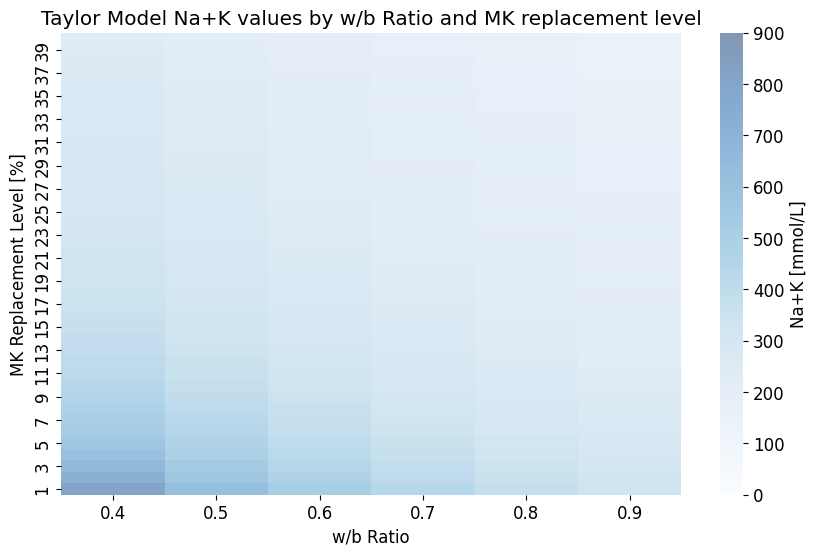

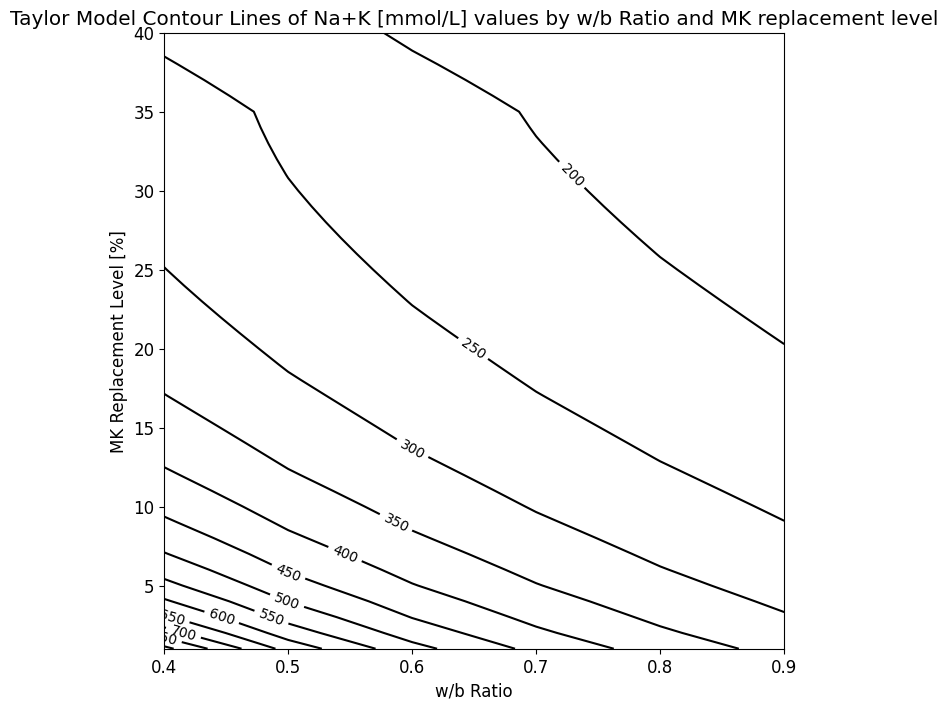

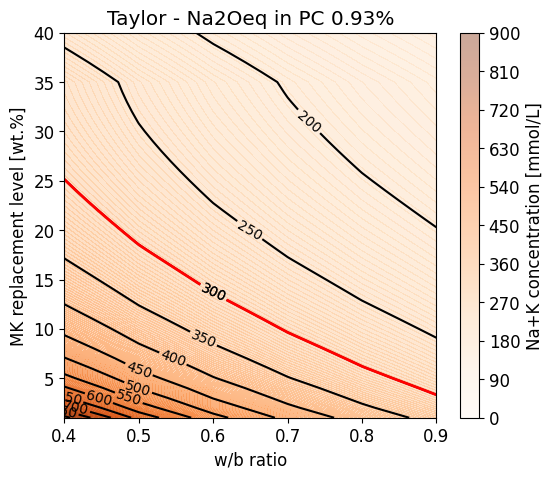

In [ ]:
import math
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import math

# Define SCM parameters
scm_parameters = {
    'FA': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0.04,
        'total_k_content_water_soluble': 0.03,
        'fraction_of_glass': 0.8,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.81,
        'm_tot_SCM_K': 2.74
    },
    'MK': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.05,
        'm_tot_SCM_K': 1
    },
    'SF': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.32,
        'm_tot_SCM_K': 0.71
    },
    'slag': {
        'binding_factor_na': 0.08,
        'binding_factor_k': 0.04,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.29,
        'm_tot_SCM_K': 0.38
    }
}

# Define cement parameters
cement_parameters = {
    '0.93': {'m_tot_PC_Na': 0.42, 'm_tot_PC_K': 0.78},
    '0.62': {'m_tot_PC_Na': 0.28, 'm_tot_PC_K': 0.52},
    '0.47': {'m_tot_PC_Na': 0.21, 'm_tot_PC_K': 0.39},
    '0.23': {'m_tot_PC_Na': 0.105, 'm_tot_PC_K': 0.195}
}


def get_scm_parameters(scm_type):
    return scm_parameters.get(scm_type, {})

def get_cement_parameters(alkali_content):
    return cement_parameters.get(alkali_content, {})

def calculate_dor_scm(scm_type_for_dor, replacement_level, time):
    if scm_type_for_dor == 'FA_RILEM':
        dor_scm = replacement_level * (0.49993 - 0.0041 * replacement_level)
    elif scm_type_for_dor == 'FA_Taylor':
        fraction_of_glass = scm_parameters['FA']['fraction_of_glass']
        dor_scm = fraction_of_glass * replacement_level * (1 - math.exp(-(0.043 - (replacement_level * fraction_of_glass * 0.0005)) * time ** (0.585 - (replacement_level * fraction_of_glass * 0.0005))))
    elif scm_type_for_dor == 'SF':
        dor_scm = replacement_level
    elif scm_type_for_dor == 'slag':
        dor_scm = replacement_level * 0.7
    elif scm_type_for_dor == 'MK':
        if replacement_level <= 5:
            dor_scm = replacement_level
        elif replacement_level <= 35:
            dor_scm = replacement_level * (100 - ((replacement_level - 5) * 60 / 30)) / 100
        else:
            dor_scm = replacement_level * 40 / 100
    else:
        dor_scm = 0  # Default value if scm_type does not match

    # print(f"Degree of Reaction (DoR) for SCM {scm_type_for_dor}: {dor_scm}")
    return dor_scm

def calculate_na_k_concentration(replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor):
    scm_params = get_scm_parameters(scm_type_for_parameters)
    cement_params = get_cement_parameters(alkali_content)

    binding_factor_na = scm_params['binding_factor_na']
    binding_factor_k = scm_params['binding_factor_k']
    total_na_content_water_soluble = scm_params['total_na_content_water_soluble']
    total_k_content_water_soluble = scm_params['total_k_content_water_soluble']
    fraction_of_glass = scm_params['fraction_of_glass']
    g_bound_water_per_g_reacted_scm = scm_params['g_bound_water_per_g_reacted_scm']
    m_tot_SCM_Na = scm_params['m_tot_SCM_Na']
    m_tot_SCM_K = scm_params['m_tot_SCM_K']

    m_tot_PC_Na = cement_params['m_tot_PC_Na']
    m_tot_PC_K = cement_params['m_tot_PC_K']

    dor_scm = calculate_dor_scm(scm_type_for_dor, replacement_level, time)

    na_mass = 23.0  # [g/mol]
    k_mass = 39.1   # [g/mol]
    na2o_mass = 62.0  # [g/mol]
    k2o_mass = 94.2   # [g/mol]

    # Calculate F functions
    F_C4AF = 1 - math.exp(-(0.55 + (0.012 * replacement_level)) * (time - 0.9) ** 0.26)
    F_C3A = 1 - math.exp(-(0.77 + (0.008 * replacement_level)) * (time - 0.9) ** 0.28)
    F_C2S = 1 - math.exp(-(0.12 - (0.0007 * replacement_level)) * time ** (0.46 - (0.002 * replacement_level)))
    F_C3S = 1 - math.exp(-(0.7 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)

    # print(f"F_C4AF: {F_C4AF}, F_C3A: {F_C3A}, F_C2S: {F_C2S}, F_C3S: {F_C3S}")

    # F_CRP function
    F_CRP = ((100 - replacement_level) / 100) * replacement_level ** 0.09 * (1 - math.exp(-(0.56 - (0.0043 * replacement_level)) * (time - 0.9) ** 0.25))
    # print(f"F_CRP: {F_CRP}")

    # Fractions for Alite, Belite, Aluminate, Ferrite
    na2o_fractions = {'Alite': 0.44, 'Belite': 0.17, 'Aluminate': 0.36, 'Ferrite': 0.03}
    k2o_fractions = {'Alite': 0.29, 'Belite': 0.41, 'Aluminate': 0.27, 'Ferrite': 0.03}

    # Calculate m_r_Na from PC
    total_na_content_water_soluble_PC = 35

    m_r_na_from_pc = (
        (m_tot_PC_Na * total_na_content_water_soluble_PC / 100) +
        (F_C3S * na2o_fractions['Alite'] + F_C2S * na2o_fractions['Belite'] + F_C3A * na2o_fractions['Aluminate'] + F_C4AF * na2o_fractions['Ferrite']) *
        (1 - total_na_content_water_soluble_PC / 100) * m_tot_PC_Na
    ) * ((100 - replacement_level) / 100) * 2 / na2o_mass
    # print(f"m_r_na_from_pc: {m_r_na_from_pc}")

    # Calculate m_r_Na from SCM
    m_r_na_from_scm = (
        (total_na_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_Na - total_na_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / na2o_mass
    # print(f"m_r_na_from_scm: {m_r_na_from_scm}")


    # Calculate V(t) pore solution
    V_b_t = 31.6 * ((100 - replacement_level) / 100) * (1 - math.exp(-(0.69 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)) + g_bound_water_per_g_reacted_scm * dor_scm
    V_t_pore_solution = (w_b_ratio * 100) - V_b_t
    # print(f"V_b_t: {V_b_t}, V_t_pore_solution: {V_t_pore_solution}")

    # Calculate Na concentration
    b_pc_na = 0.031
    na_concentration = ((m_r_na_from_pc + m_r_na_from_scm) * 1000 / (V_t_pore_solution +
     (b_pc_na * 1000 * F_CRP) +binding_factor_na * 10 * dor_scm)) * 1000
    # print(f"na_concentration: {na_concentration}")



    # Calculate K concentration
    total_k_content_water_soluble_PC = 70

    m_r_k_from_pc = (
        (m_tot_PC_K * total_k_content_water_soluble_PC/ 100) +
        (F_C3S * k2o_fractions['Alite'] + F_C2S * k2o_fractions['Belite'] + F_C3A * k2o_fractions['Aluminate'] + F_C4AF * k2o_fractions['Ferrite']) *
        (1 - total_k_content_water_soluble_PC / 100) * m_tot_PC_K
    ) * ((100 - replacement_level) / 100) * 2 / k2o_mass
    # print(f"m_r_k_from_pc: {m_r_k_from_pc}")


    m_r_k_from_scm = (
        (total_k_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_K - total_k_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / k2o_mass
    # print(f"m_r_k_from_scm: {m_r_k_from_scm}")

    b_pc_k = 0.02

    k_concentration = ((m_r_k_from_pc + m_r_k_from_scm) * 1000 / (V_t_pore_solution + (b_pc_k * 1000 * F_CRP)
    + binding_factor_k * 10 * dor_scm)) * 1000

    # Calculate total Na+K concentration
    na_k_concentration = na_concentration + k_concentration

    return na_k_concentration, na_concentration, k_concentration

# Constants
scm_type_for_parameters = 'MK'  # SCM type for selecting parameters
scm_type_for_dor = 'MK'  # SCM type for calculating DoR
time = 180  # Constant time value

# Define the ranges for the parameters
replacement_levels = range(1, 41)  # Replacement levels from 1 to 40
alkali_content = '0.93'  # Specific alkali content value
w_b_ratios = [0.4, 0.5, 0.6, 0.7, 0.8, 0.9]  # Different w/b ratios

# Function to calculate the concentrations
def calculate_concentrations(replacement_levels, alkali_content, w_b_ratios):
    results = []
    for replacement_level in replacement_levels:
        for w_b_ratio in w_b_ratios:
            na_k_concentration, na_concentration, k_concentration = calculate_na_k_concentration(
                replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor
            )
            results.append((replacement_level, w_b_ratio, na_k_concentration, na_concentration, k_concentration))
    return results

# Calculate the concentrations
concentrations = calculate_concentrations(replacement_levels, alkali_content, w_b_ratios)

# Convert to DataFrame
df_combined = pd.DataFrame(concentrations, columns=['Replacement Level', 'w/b Ratio', 'Na+K Concentration', 'Na Concentration', 'K Concentration'])

# Pivot the DataFrame to get the necessary format for contour plotting
pivot_table = df_combined.pivot(index='Replacement Level', columns='w/b Ratio', values='Na+K Concentration')

# Extract values for contour plot
X = pivot_table.columns.values.astype(float)
Y = pivot_table.index.values.astype(float)
Z = pivot_table.values

# Define the constant range for the color bar
vmin_value_Na2O = 0
vmax_value_Na2O = 900

# Plotting the heatmap with seaborn and setting the color scale limits
plt.figure(figsize=(10, 6))
heatmap = sns.heatmap(pivot_table, annot=False, fmt=".0f", linewidths=.0, cmap="Blues",
                      vmin=vmin_value_Na2O, vmax=vmax_value_Na2O, alpha=0.5)
heatmap.invert_yaxis()  # Invert the y-axis to have the highest replacement level at the top

# Add color bar with the defined limits and label
colorbar = heatmap.collections[0].colorbar
colorbar.set_label('Na+K [mmol/L]')
colorbar.set_ticks(np.linspace(vmin_value_Na2O, vmax_value_Na2O, num=len(colorbar.get_ticks())))

plt.xlabel('w/b Ratio')
plt.ylabel('MK Replacement Level [%]')
plt.title('Taylor Model Na+K values by w/b Ratio and MK replacement level')

plt.show()

# Creating a meshgrid for the contour plot with the correct orientation
X_Na2O, Y_Na2O = np.meshgrid(X, Y)

# Plotting the contour lines
plt.figure(figsize=(8, 8))
contour_lines_Na2O = plt.contour(X_Na2O, Y_Na2O, Z, levels=15, colors='black')
plt.clabel(contour_lines_Na2O, inline=True, fontsize=10)
plt.title('Taylor Model Contour Lines of Na+K [mmol/L] values by w/b Ratio and MK replacement level')
plt.xlabel('w/b Ratio')
plt.ylabel('MK Replacement Level [%]')
plt.show()

# Creating filled contour plot with colors corresponding to the levels of Na2O values within the specified range
plt.figure(figsize=(6, 5))
contour_filled_Na2O = plt.contourf(X_Na2O, Y_Na2O, Z, levels=np.linspace(vmin_value_Na2O, vmax_value_Na2O, 300),
                                   cmap="Oranges", alpha=0.4, vmin=vmin_value_Na2O, vmax=vmax_value_Na2O)

# Adding contour lines on top of the filled contour for better visibility of the levels
contour_lines_Na2O = plt.contour(X_Na2O, Y_Na2O, Z, levels=15, colors='black')
plt.clabel(contour_lines_Na2O, inline=True, fontsize=10)

# Adding the bold contour line for level 300
bold_contour = plt.contour(X_Na2O, Y_Na2O, Z, levels=[300], colors='red', linewidths=2)
# Adding labels manually with specific font properties
fmt = {300: '300'}
labels = plt.clabel(bold_contour, fmt=fmt, colors='black', fontsize=10, inline=True)

# Adding color bar on the side to represent the scale with the defined range
colorbar_Na2O = plt.colorbar(contour_filled_Na2O, extend='both', ticks=np.linspace(vmin_value_Na2O, vmax_value_Na2O, 11))
colorbar_Na2O.set_label('Na+K concentration [mmol/L]')

plt.title('Taylor - Na2Oeq in PC 0.93%')
plt.xlabel('w/b ratio')
plt.ylabel('MK replacement level [wt.%]')

plt.show()


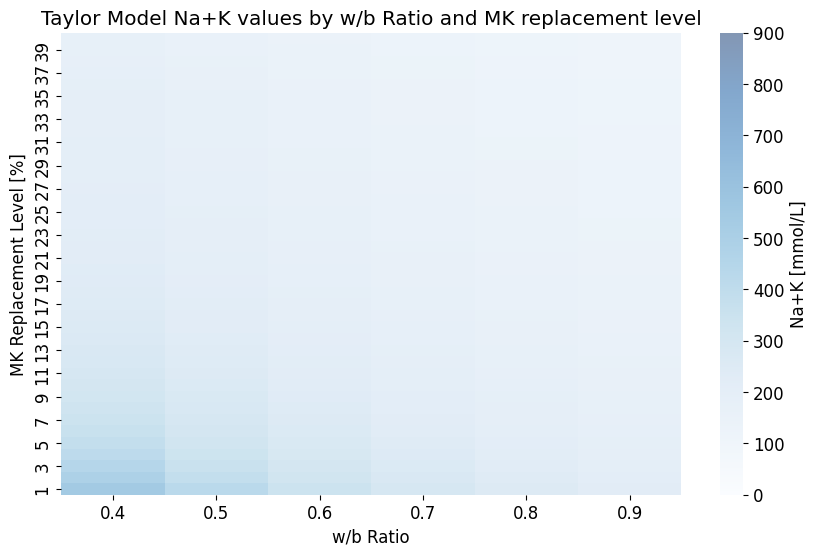

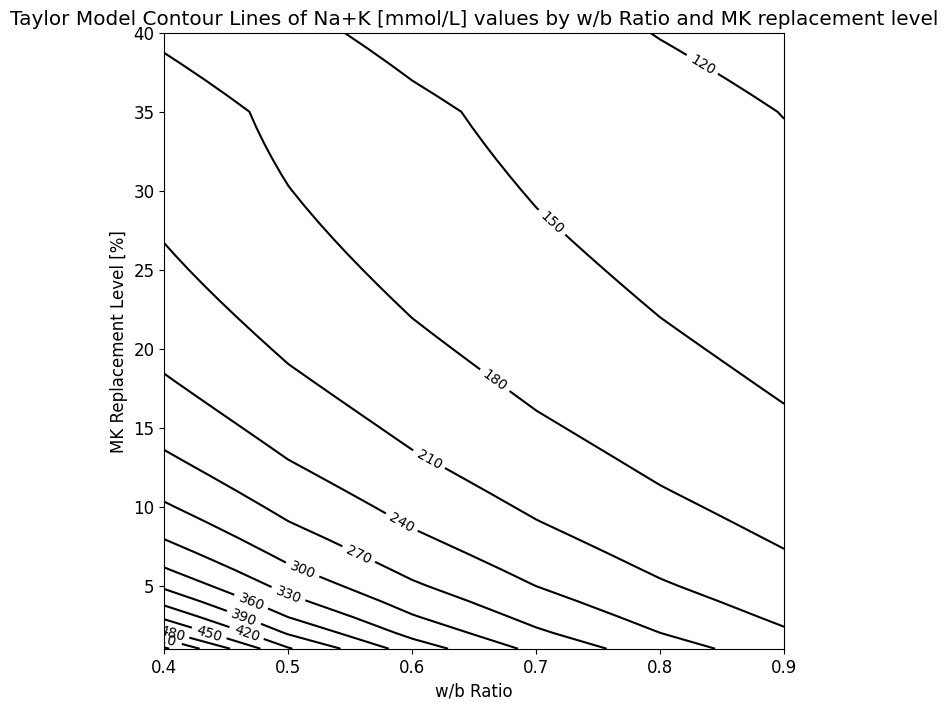

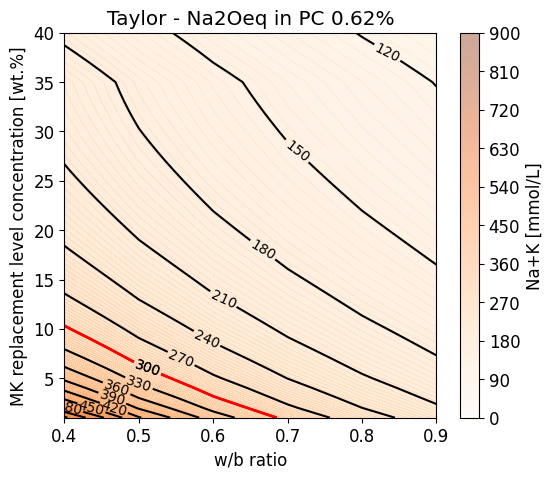

In [ ]:
import math
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import math

# Define SCM parameters
scm_parameters = {
    'FA': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0.04,
        'total_k_content_water_soluble': 0.03,
        'fraction_of_glass': 0.8,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.81,
        'm_tot_SCM_K': 2.74
    },
    'MK': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.05,
        'm_tot_SCM_K': 1
    },
    'SF': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.32,
        'm_tot_SCM_K': 0.71
    },
    'slag': {
        'binding_factor_na': 0.08,
        'binding_factor_k': 0.04,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.29,
        'm_tot_SCM_K': 0.38
    }
}

# Define cement parameters
cement_parameters = {
    '0.93': {'m_tot_PC_Na': 0.42, 'm_tot_PC_K': 0.78},
    '0.62': {'m_tot_PC_Na': 0.28, 'm_tot_PC_K': 0.52},
    '0.47': {'m_tot_PC_Na': 0.21, 'm_tot_PC_K': 0.39},
    '0.23': {'m_tot_PC_Na': 0.105, 'm_tot_PC_K': 0.195}
}


def get_scm_parameters(scm_type):
    return scm_parameters.get(scm_type, {})

def get_cement_parameters(alkali_content):
    return cement_parameters.get(alkali_content, {})

def calculate_dor_scm(scm_type_for_dor, replacement_level, time):
    if scm_type_for_dor == 'FA_RILEM':
        dor_scm = replacement_level * (0.49993 - 0.0041 * replacement_level)
    elif scm_type_for_dor == 'FA_Taylor':
        fraction_of_glass = scm_parameters['FA']['fraction_of_glass']
        dor_scm = fraction_of_glass * replacement_level * (1 - math.exp(-(0.043 - (replacement_level * fraction_of_glass * 0.0005)) * time ** (0.585 - (replacement_level * fraction_of_glass * 0.0005))))
    elif scm_type_for_dor == 'SF':
        dor_scm = replacement_level
    elif scm_type_for_dor == 'slag':
        dor_scm = replacement_level * 0.7
    elif scm_type_for_dor == 'MK':
        if replacement_level <= 5:
            dor_scm = replacement_level
        elif replacement_level <= 35:
            dor_scm = replacement_level * (100 - ((replacement_level - 5) * 60 / 30)) / 100
        else:
            dor_scm = replacement_level * 40 / 100
    else:
        dor_scm = 0  # Default value if scm_type does not match

    # print(f"Degree of Reaction (DoR) for SCM {scm_type_for_dor}: {dor_scm}")
    return dor_scm

def calculate_na_k_concentration(replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor):
    scm_params = get_scm_parameters(scm_type_for_parameters)
    cement_params = get_cement_parameters(alkali_content)

    binding_factor_na = scm_params['binding_factor_na']
    binding_factor_k = scm_params['binding_factor_k']
    total_na_content_water_soluble = scm_params['total_na_content_water_soluble']
    total_k_content_water_soluble = scm_params['total_k_content_water_soluble']
    fraction_of_glass = scm_params['fraction_of_glass']
    g_bound_water_per_g_reacted_scm = scm_params['g_bound_water_per_g_reacted_scm']
    m_tot_SCM_Na = scm_params['m_tot_SCM_Na']
    m_tot_SCM_K = scm_params['m_tot_SCM_K']

    m_tot_PC_Na = cement_params['m_tot_PC_Na']
    m_tot_PC_K = cement_params['m_tot_PC_K']

    dor_scm = calculate_dor_scm(scm_type_for_dor, replacement_level, time)

    na_mass = 23.0  # [g/mol]
    k_mass = 39.1   # [g/mol]
    na2o_mass = 62.0  # [g/mol]
    k2o_mass = 94.2   # [g/mol]

    # Calculate F functions
    F_C4AF = 1 - math.exp(-(0.55 + (0.012 * replacement_level)) * (time - 0.9) ** 0.26)
    F_C3A = 1 - math.exp(-(0.77 + (0.008 * replacement_level)) * (time - 0.9) ** 0.28)
    F_C2S = 1 - math.exp(-(0.12 - (0.0007 * replacement_level)) * time ** (0.46 - (0.002 * replacement_level)))
    F_C3S = 1 - math.exp(-(0.7 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)

    # print(f"F_C4AF: {F_C4AF}, F_C3A: {F_C3A}, F_C2S: {F_C2S}, F_C3S: {F_C3S}")

    # F_CRP function
    F_CRP = ((100 - replacement_level) / 100) * replacement_level ** 0.09 * (1 - math.exp(-(0.56 - (0.0043 * replacement_level)) * (time - 0.9) ** 0.25))
    # print(f"F_CRP: {F_CRP}")

    # Fractions for Alite, Belite, Aluminate, Ferrite
    na2o_fractions = {'Alite': 0.44, 'Belite': 0.17, 'Aluminate': 0.36, 'Ferrite': 0.03}
    k2o_fractions = {'Alite': 0.29, 'Belite': 0.41, 'Aluminate': 0.27, 'Ferrite': 0.03}

    # Calculate m_r_Na from PC
    total_na_content_water_soluble_PC = 35

    m_r_na_from_pc = (
        (m_tot_PC_Na * total_na_content_water_soluble_PC / 100) +
        (F_C3S * na2o_fractions['Alite'] + F_C2S * na2o_fractions['Belite'] + F_C3A * na2o_fractions['Aluminate'] + F_C4AF * na2o_fractions['Ferrite']) *
        (1 - total_na_content_water_soluble_PC / 100) * m_tot_PC_Na
    ) * ((100 - replacement_level) / 100) * 2 / na2o_mass
    # print(f"m_r_na_from_pc: {m_r_na_from_pc}")

    # Calculate m_r_Na from SCM
    m_r_na_from_scm = (
        (total_na_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_Na - total_na_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / na2o_mass
    # print(f"m_r_na_from_scm: {m_r_na_from_scm}")


    # Calculate V(t) pore solution
    V_b_t = 31.6 * ((100 - replacement_level) / 100) * (1 - math.exp(-(0.69 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)) + g_bound_water_per_g_reacted_scm * dor_scm
    V_t_pore_solution = (w_b_ratio * 100) - V_b_t
    # print(f"V_b_t: {V_b_t}, V_t_pore_solution: {V_t_pore_solution}")

    # Calculate Na concentration
    b_pc_na = 0.031
    na_concentration = ((m_r_na_from_pc + m_r_na_from_scm) * 1000 / (V_t_pore_solution +
     (b_pc_na * 1000 * F_CRP) +binding_factor_na * 10 * dor_scm)) * 1000
    # print(f"na_concentration: {na_concentration}")



    # Calculate K concentration
    total_k_content_water_soluble_PC = 70

    m_r_k_from_pc = (
        (m_tot_PC_K * total_k_content_water_soluble_PC/ 100) +
        (F_C3S * k2o_fractions['Alite'] + F_C2S * k2o_fractions['Belite'] + F_C3A * k2o_fractions['Aluminate'] + F_C4AF * k2o_fractions['Ferrite']) *
        (1 - total_k_content_water_soluble_PC / 100) * m_tot_PC_K
    ) * ((100 - replacement_level) / 100) * 2 / k2o_mass
    # print(f"m_r_k_from_pc: {m_r_k_from_pc}")


    m_r_k_from_scm = (
        (total_k_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_K - total_k_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / k2o_mass
    # print(f"m_r_k_from_scm: {m_r_k_from_scm}")

    b_pc_k = 0.02

    k_concentration = ((m_r_k_from_pc + m_r_k_from_scm) * 1000 / (V_t_pore_solution + (b_pc_k * 1000 * F_CRP)
    + binding_factor_k * 10 * dor_scm)) * 1000

    # Calculate total Na+K concentration
    na_k_concentration = na_concentration + k_concentration

    return na_k_concentration, na_concentration, k_concentration

# Constants
scm_type_for_parameters = 'MK'  # SCM type for selecting parameters
scm_type_for_dor = 'MK'  # SCM type for calculating DoR
time = 180  # Constant time value

# Define the ranges for the parameters
replacement_levels = range(1, 41)  # Replacement levels from 1 to 40
alkali_content = '0.62'  # Specific alkali content value
w_b_ratios = [0.4, 0.5, 0.6, 0.7, 0.8, 0.9]  # Different w/b ratios

# Function to calculate the concentrations
def calculate_concentrations(replacement_levels, alkali_content, w_b_ratios):
    results = []
    for replacement_level in replacement_levels:
        for w_b_ratio in w_b_ratios:
            na_k_concentration, na_concentration, k_concentration = calculate_na_k_concentration(
                replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor
            )
            results.append((replacement_level, w_b_ratio, na_k_concentration, na_concentration, k_concentration))
    return results

# Calculate the concentrations
concentrations = calculate_concentrations(replacement_levels, alkali_content, w_b_ratios)

# Convert to DataFrame
df_combined = pd.DataFrame(concentrations, columns=['Replacement Level', 'w/b Ratio', 'Na+K Concentration', 'Na Concentration', 'K Concentration'])

# Pivot the DataFrame to get the necessary format for contour plotting
pivot_table = df_combined.pivot(index='Replacement Level', columns='w/b Ratio', values='Na+K Concentration')

# Extract values for contour plot
X = pivot_table.columns.values.astype(float)
Y = pivot_table.index.values.astype(float)
Z = pivot_table.values

# Define the constant range for the color bar
vmin_value_Na2O = 0
vmax_value_Na2O = 900

# Plotting the heatmap with seaborn and setting the color scale limits
plt.figure(figsize=(10, 6))
heatmap = sns.heatmap(pivot_table, annot=False, fmt=".0f", linewidths=.0, cmap="Blues",
                      vmin=vmin_value_Na2O, vmax=vmax_value_Na2O, alpha=0.5)
heatmap.invert_yaxis()  # Invert the y-axis to have the highest replacement level at the top

# Add color bar with the defined limits and label
colorbar = heatmap.collections[0].colorbar
colorbar.set_label('Na+K [mmol/L]')
colorbar.set_ticks(np.linspace(vmin_value_Na2O, vmax_value_Na2O, num=len(colorbar.get_ticks())))

plt.xlabel('w/b Ratio')
plt.ylabel('MK Replacement Level [%]')
plt.title('Taylor Model Na+K values by w/b Ratio and MK replacement level')

plt.show()

# Creating a meshgrid for the contour plot with the correct orientation
X_Na2O, Y_Na2O = np.meshgrid(X, Y)

# Plotting the contour lines
plt.figure(figsize=(8, 8))
contour_lines_Na2O = plt.contour(X_Na2O, Y_Na2O, Z, levels=15, colors='black')
plt.clabel(contour_lines_Na2O, inline=True, fontsize=10)
plt.title('Taylor Model Contour Lines of Na+K [mmol/L] values by w/b Ratio and MK replacement level')
plt.xlabel('w/b Ratio')
plt.ylabel('MK Replacement Level [%]')
plt.show()

# Creating filled contour plot with colors corresponding to the levels of Na2O values within the specified range
plt.figure(figsize=(6, 5))
contour_filled_Na2O = plt.contourf(X_Na2O, Y_Na2O, Z, levels=np.linspace(vmin_value_Na2O, vmax_value_Na2O, 300),
                                   cmap="Oranges", alpha=0.4, vmin=vmin_value_Na2O, vmax=vmax_value_Na2O)

# Adding contour lines on top of the filled contour for better visibility of the levels
contour_lines_Na2O = plt.contour(X_Na2O, Y_Na2O, Z, levels=15, colors='black')
plt.clabel(contour_lines_Na2O, inline=True, fontsize=10)

# Adding the bold contour line for level 300
bold_contour = plt.contour(X_Na2O, Y_Na2O, Z, levels=[300], colors='red', linewidths=2)
# Adding labels manually with specific font properties
fmt = {300: '300'}
labels = plt.clabel(bold_contour, fmt=fmt, colors='black', fontsize=10, inline=True)

# Adding color bar on the side to represent the scale with the defined range
colorbar_Na2O = plt.colorbar(contour_filled_Na2O, extend='both', ticks=np.linspace(vmin_value_Na2O, vmax_value_Na2O, 11))
colorbar_Na2O.set_label('Na+K [mmol/L]')

plt.title('Taylor - Na2Oeq in PC 0.62%')
plt.xlabel('w/b ratio')
plt.ylabel('MK replacement level concentration [wt.%]')

plt.show()


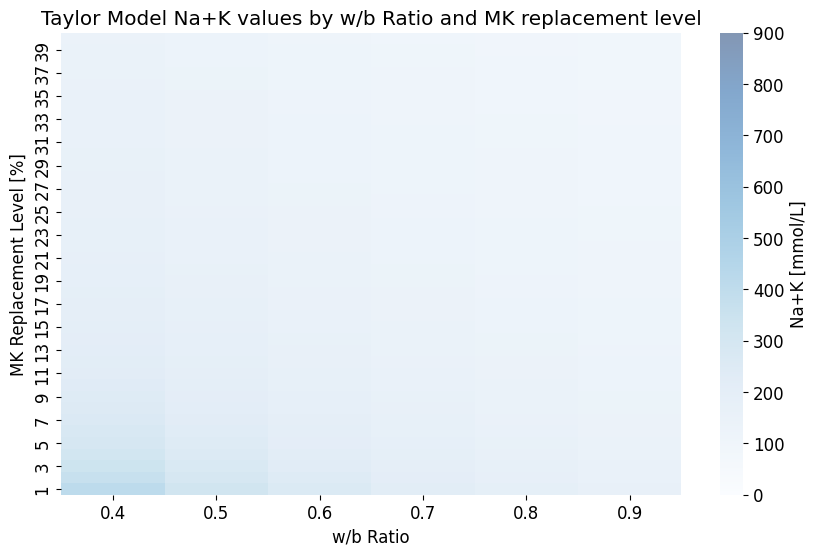

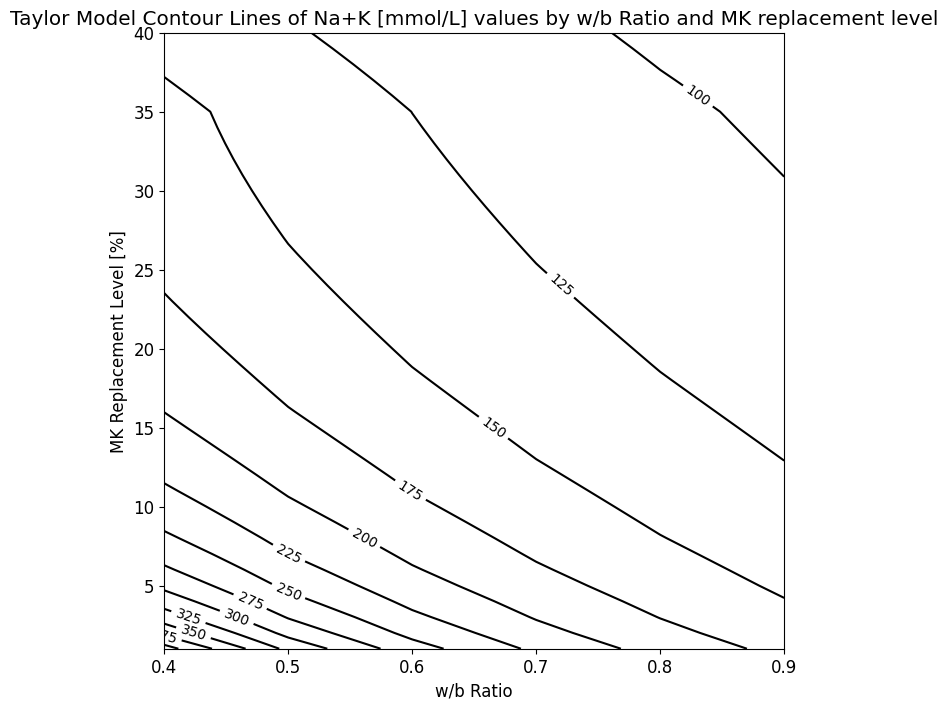

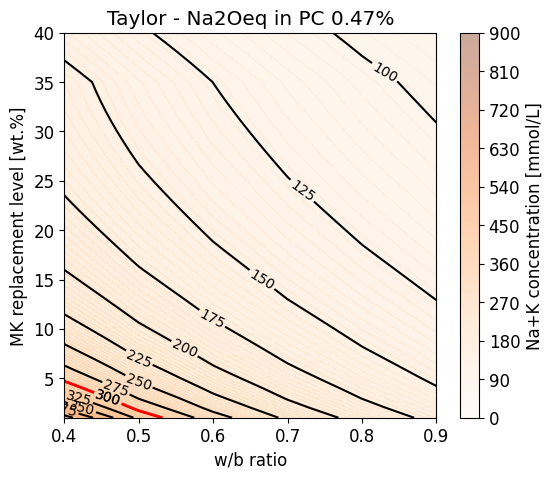

In [ ]:
import math
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import math

# Define SCM parameters
scm_parameters = {
    'FA': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0.04,
        'total_k_content_water_soluble': 0.03,
        'fraction_of_glass': 0.8,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.81,
        'm_tot_SCM_K': 2.74
    },
    'MK': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.05,
        'm_tot_SCM_K': 1
    },
    'SF': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.32,
        'm_tot_SCM_K': 0.71
    },
    'slag': {
        'binding_factor_na': 0.08,
        'binding_factor_k': 0.04,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.29,
        'm_tot_SCM_K': 0.38
    }
}

# Define cement parameters
cement_parameters = {
    '0.93': {'m_tot_PC_Na': 0.42, 'm_tot_PC_K': 0.78},
    '0.62': {'m_tot_PC_Na': 0.28, 'm_tot_PC_K': 0.52},
    '0.47': {'m_tot_PC_Na': 0.21, 'm_tot_PC_K': 0.39},
    '0.23': {'m_tot_PC_Na': 0.105, 'm_tot_PC_K': 0.195}
}


def get_scm_parameters(scm_type):
    return scm_parameters.get(scm_type, {})

def get_cement_parameters(alkali_content):
    return cement_parameters.get(alkali_content, {})

def calculate_dor_scm(scm_type_for_dor, replacement_level, time):
    if scm_type_for_dor == 'FA_RILEM':
        dor_scm = replacement_level * (0.49993 - 0.0041 * replacement_level)
    elif scm_type_for_dor == 'FA_Taylor':
        fraction_of_glass = scm_parameters['FA']['fraction_of_glass']
        dor_scm = fraction_of_glass * replacement_level * (1 - math.exp(-(0.043 - (replacement_level * fraction_of_glass * 0.0005)) * time ** (0.585 - (replacement_level * fraction_of_glass * 0.0005))))
    elif scm_type_for_dor == 'SF':
        dor_scm = replacement_level
    elif scm_type_for_dor == 'slag':
        dor_scm = replacement_level * 0.7
    elif scm_type_for_dor == 'MK':
        if replacement_level <= 5:
            dor_scm = replacement_level
        elif replacement_level <= 35:
            dor_scm = replacement_level * (100 - ((replacement_level - 5) * 60 / 30)) / 100
        else:
            dor_scm = replacement_level * 40 / 100
    else:
        dor_scm = 0  # Default value if scm_type does not match

    # print(f"Degree of Reaction (DoR) for SCM {scm_type_for_dor}: {dor_scm}")
    return dor_scm

def calculate_na_k_concentration(replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor):
    scm_params = get_scm_parameters(scm_type_for_parameters)
    cement_params = get_cement_parameters(alkali_content)

    binding_factor_na = scm_params['binding_factor_na']
    binding_factor_k = scm_params['binding_factor_k']
    total_na_content_water_soluble = scm_params['total_na_content_water_soluble']
    total_k_content_water_soluble = scm_params['total_k_content_water_soluble']
    fraction_of_glass = scm_params['fraction_of_glass']
    g_bound_water_per_g_reacted_scm = scm_params['g_bound_water_per_g_reacted_scm']
    m_tot_SCM_Na = scm_params['m_tot_SCM_Na']
    m_tot_SCM_K = scm_params['m_tot_SCM_K']

    m_tot_PC_Na = cement_params['m_tot_PC_Na']
    m_tot_PC_K = cement_params['m_tot_PC_K']

    dor_scm = calculate_dor_scm(scm_type_for_dor, replacement_level, time)

    na_mass = 23.0  # [g/mol]
    k_mass = 39.1   # [g/mol]
    na2o_mass = 62.0  # [g/mol]
    k2o_mass = 94.2   # [g/mol]

    # Calculate F functions
    F_C4AF = 1 - math.exp(-(0.55 + (0.012 * replacement_level)) * (time - 0.9) ** 0.26)
    F_C3A = 1 - math.exp(-(0.77 + (0.008 * replacement_level)) * (time - 0.9) ** 0.28)
    F_C2S = 1 - math.exp(-(0.12 - (0.0007 * replacement_level)) * time ** (0.46 - (0.002 * replacement_level)))
    F_C3S = 1 - math.exp(-(0.7 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)

    # print(f"F_C4AF: {F_C4AF}, F_C3A: {F_C3A}, F_C2S: {F_C2S}, F_C3S: {F_C3S}")

    # F_CRP function
    F_CRP = ((100 - replacement_level) / 100) * replacement_level ** 0.09 * (1 - math.exp(-(0.56 - (0.0043 * replacement_level)) * (time - 0.9) ** 0.25))
    # print(f"F_CRP: {F_CRP}")

    # Fractions for Alite, Belite, Aluminate, Ferrite
    na2o_fractions = {'Alite': 0.44, 'Belite': 0.17, 'Aluminate': 0.36, 'Ferrite': 0.03}
    k2o_fractions = {'Alite': 0.29, 'Belite': 0.41, 'Aluminate': 0.27, 'Ferrite': 0.03}

    # Calculate m_r_Na from PC
    total_na_content_water_soluble_PC = 35

    m_r_na_from_pc = (
        (m_tot_PC_Na * total_na_content_water_soluble_PC / 100) +
        (F_C3S * na2o_fractions['Alite'] + F_C2S * na2o_fractions['Belite'] + F_C3A * na2o_fractions['Aluminate'] + F_C4AF * na2o_fractions['Ferrite']) *
        (1 - total_na_content_water_soluble_PC / 100) * m_tot_PC_Na
    ) * ((100 - replacement_level) / 100) * 2 / na2o_mass
    # print(f"m_r_na_from_pc: {m_r_na_from_pc}")

    # Calculate m_r_Na from SCM
    m_r_na_from_scm = (
        (total_na_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_Na - total_na_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / na2o_mass
    # print(f"m_r_na_from_scm: {m_r_na_from_scm}")


    # Calculate V(t) pore solution
    V_b_t = 31.6 * ((100 - replacement_level) / 100) * (1 - math.exp(-(0.69 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)) + g_bound_water_per_g_reacted_scm * dor_scm
    V_t_pore_solution = (w_b_ratio * 100) - V_b_t
    # print(f"V_b_t: {V_b_t}, V_t_pore_solution: {V_t_pore_solution}")

    # Calculate Na concentration
    b_pc_na = 0.031
    na_concentration = ((m_r_na_from_pc + m_r_na_from_scm) * 1000 / (V_t_pore_solution +
     (b_pc_na * 1000 * F_CRP) +binding_factor_na * 10 * dor_scm)) * 1000
    # print(f"na_concentration: {na_concentration}")



    # Calculate K concentration
    total_k_content_water_soluble_PC = 70

    m_r_k_from_pc = (
        (m_tot_PC_K * total_k_content_water_soluble_PC/ 100) +
        (F_C3S * k2o_fractions['Alite'] + F_C2S * k2o_fractions['Belite'] + F_C3A * k2o_fractions['Aluminate'] + F_C4AF * k2o_fractions['Ferrite']) *
        (1 - total_k_content_water_soluble_PC / 100) * m_tot_PC_K
    ) * ((100 - replacement_level) / 100) * 2 / k2o_mass
    # print(f"m_r_k_from_pc: {m_r_k_from_pc}")


    m_r_k_from_scm = (
        (total_k_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_K - total_k_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / k2o_mass
    # print(f"m_r_k_from_scm: {m_r_k_from_scm}")

    b_pc_k = 0.02

    k_concentration = ((m_r_k_from_pc + m_r_k_from_scm) * 1000 / (V_t_pore_solution + (b_pc_k * 1000 * F_CRP)
    + binding_factor_k * 10 * dor_scm)) * 1000

    # Calculate total Na+K concentration
    na_k_concentration = na_concentration + k_concentration

    return na_k_concentration, na_concentration, k_concentration

# Constants
scm_type_for_parameters = 'MK'  # SCM type for selecting parameters
scm_type_for_dor = 'MK'  # SCM type for calculating DoR
time = 180  # Constant time value

# Define the ranges for the parameters
replacement_levels = range(1, 41)  # Replacement levels from 1 to 40
alkali_content = '0.47'  # Specific alkali content value
w_b_ratios = [0.4, 0.5, 0.6, 0.7, 0.8, 0.9]  # Different w/b ratios

# Function to calculate the concentrations
def calculate_concentrations(replacement_levels, alkali_content, w_b_ratios):
    results = []
    for replacement_level in replacement_levels:
        for w_b_ratio in w_b_ratios:
            na_k_concentration, na_concentration, k_concentration = calculate_na_k_concentration(
                replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor
            )
            results.append((replacement_level, w_b_ratio, na_k_concentration, na_concentration, k_concentration))
    return results

# Calculate the concentrations
concentrations = calculate_concentrations(replacement_levels, alkali_content, w_b_ratios)

# Convert to DataFrame
df_combined = pd.DataFrame(concentrations, columns=['Replacement Level', 'w/b Ratio', 'Na+K Concentration', 'Na Concentration', 'K Concentration'])

# Pivot the DataFrame to get the necessary format for contour plotting
pivot_table = df_combined.pivot(index='Replacement Level', columns='w/b Ratio', values='Na+K Concentration')

# Extract values for contour plot
X = pivot_table.columns.values.astype(float)
Y = pivot_table.index.values.astype(float)
Z = pivot_table.values

# Define the constant range for the color bar
vmin_value_Na2O = 0
vmax_value_Na2O = 900

# Plotting the heatmap with seaborn and setting the color scale limits
plt.figure(figsize=(10, 6))
heatmap = sns.heatmap(pivot_table, annot=False, fmt=".0f", linewidths=.0, cmap="Blues",
                      vmin=vmin_value_Na2O, vmax=vmax_value_Na2O, alpha=0.5)
heatmap.invert_yaxis()  # Invert the y-axis to have the highest replacement level at the top

# Add color bar with the defined limits and label
colorbar = heatmap.collections[0].colorbar
colorbar.set_label('Na+K [mmol/L]')
colorbar.set_ticks(np.linspace(vmin_value_Na2O, vmax_value_Na2O, num=len(colorbar.get_ticks())))

plt.xlabel('w/b Ratio')
plt.ylabel('MK Replacement Level [%]')
plt.title('Taylor Model Na+K values by w/b Ratio and MK replacement level')

plt.show()

# Creating a meshgrid for the contour plot with the correct orientation
X_Na2O, Y_Na2O = np.meshgrid(X, Y)

# Plotting the contour lines
plt.figure(figsize=(8, 8))
contour_lines_Na2O = plt.contour(X_Na2O, Y_Na2O, Z, levels=15, colors='black')
plt.clabel(contour_lines_Na2O, inline=True, fontsize=10)
plt.title('Taylor Model Contour Lines of Na+K [mmol/L] values by w/b Ratio and MK replacement level')
plt.xlabel('w/b Ratio')
plt.ylabel('MK Replacement Level [%]')
plt.show()

# Creating filled contour plot with colors corresponding to the levels of Na2O values within the specified range
plt.figure(figsize=(6, 5))
contour_filled_Na2O = plt.contourf(X_Na2O, Y_Na2O, Z, levels=np.linspace(vmin_value_Na2O, vmax_value_Na2O, 300),
                                   cmap="Oranges", alpha=0.4, vmin=vmin_value_Na2O, vmax=vmax_value_Na2O)

# Adding contour lines on top of the filled contour for better visibility of the levels
contour_lines_Na2O = plt.contour(X_Na2O, Y_Na2O, Z, levels=15, colors='black')
plt.clabel(contour_lines_Na2O, inline=True, fontsize=10)

# Adding the bold contour line for level 300
bold_contour = plt.contour(X_Na2O, Y_Na2O, Z, levels=[300], colors='red', linewidths=2)
# Adding labels manually with specific font properties
fmt = {300: '300'}
labels = plt.clabel(bold_contour, fmt=fmt, colors='black', fontsize=10, inline=True)

# Adding color bar on the side to represent the scale with the defined range
colorbar_Na2O = plt.colorbar(contour_filled_Na2O, extend='both', ticks=np.linspace(vmin_value_Na2O, vmax_value_Na2O, 11))
colorbar_Na2O.set_label('Na+K concentration [mmol/L]')

plt.title('Taylor - Na2Oeq in PC 0.47%')
plt.xlabel('w/b ratio')
plt.ylabel('MK replacement level [wt.%]')

plt.show()


3D SURFACE PLOT

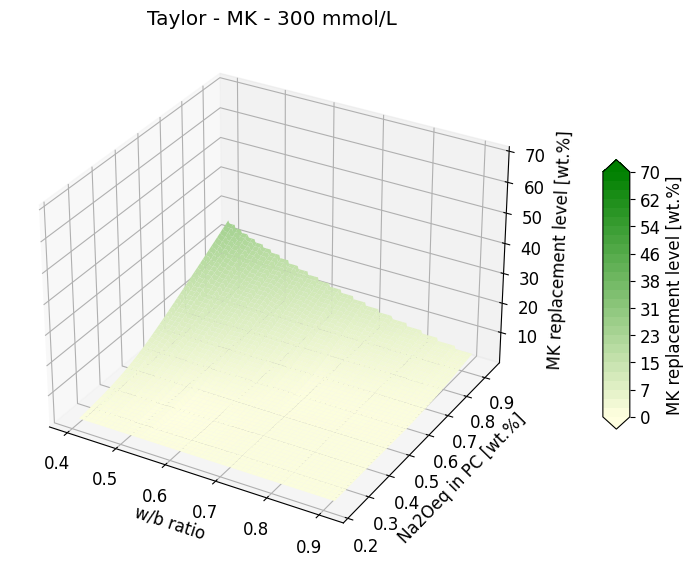

In [ ]:
import math
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import griddata


import math

# Define SCM parameters
scm_parameters = {
    'FA': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0.04,
        'total_k_content_water_soluble': 0.03,
        'fraction_of_glass': 0.8,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.81,
        'm_tot_SCM_K': 2.74
    },
    'MK': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.05,
        'm_tot_SCM_K': 1
    },
    'SF': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.32,
        'm_tot_SCM_K': 0.71
    },
    'slag': {
        'binding_factor_na': 0.08,
        'binding_factor_k': 0.04,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.29,
        'm_tot_SCM_K': 0.38
    }
}

# Define cement parameters
cement_parameters = {
    '0.93': {'m_tot_PC_Na': 0.42, 'm_tot_PC_K': 0.78},
    '0.62': {'m_tot_PC_Na': 0.28, 'm_tot_PC_K': 0.52},
    '0.47': {'m_tot_PC_Na': 0.21, 'm_tot_PC_K': 0.39},
    '0.23': {'m_tot_PC_Na': 0.105, 'm_tot_PC_K': 0.195}
}


def get_scm_parameters(scm_type):
    return scm_parameters.get(scm_type, {})

def get_cement_parameters(alkali_content):
    return cement_parameters.get(alkali_content, {})

def calculate_dor_scm(scm_type_for_dor, replacement_level, time):
    if scm_type_for_dor == 'FA_RILEM':
        dor_scm = replacement_level * (0.49993 - 0.0041 * replacement_level)
    elif scm_type_for_dor == 'FA_Taylor':
        fraction_of_glass = scm_parameters['FA']['fraction_of_glass']
        dor_scm = fraction_of_glass * replacement_level * (1 - math.exp(-(0.043 - (replacement_level * fraction_of_glass * 0.0005)) * time ** (0.585 - (replacement_level * fraction_of_glass * 0.0005))))
    elif scm_type_for_dor == 'SF':
        dor_scm = replacement_level
    elif scm_type_for_dor == 'slag':
        dor_scm = replacement_level * 0.7
    elif scm_type_for_dor == 'MK':
        if replacement_level <= 5:
            dor_scm = replacement_level
        elif replacement_level <= 35:
            dor_scm = replacement_level * (100 - ((replacement_level - 5) * 60 / 30)) / 100
        else:
            dor_scm = replacement_level * 40 / 100
    else:
        dor_scm = 0  # Default value if scm_type does not match

    # print(f"Degree of Reaction (DoR) for SCM {scm_type_for_dor}: {dor_scm}")
    return dor_scm

def calculate_na_k_concentration(replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor):
    scm_params = get_scm_parameters(scm_type_for_parameters)
    cement_params = get_cement_parameters(alkali_content)

    binding_factor_na = scm_params['binding_factor_na']
    binding_factor_k = scm_params['binding_factor_k']
    total_na_content_water_soluble = scm_params['total_na_content_water_soluble']
    total_k_content_water_soluble = scm_params['total_k_content_water_soluble']
    fraction_of_glass = scm_params['fraction_of_glass']
    g_bound_water_per_g_reacted_scm = scm_params['g_bound_water_per_g_reacted_scm']
    m_tot_SCM_Na = scm_params['m_tot_SCM_Na']
    m_tot_SCM_K = scm_params['m_tot_SCM_K']

    m_tot_PC_Na = cement_params['m_tot_PC_Na']
    m_tot_PC_K = cement_params['m_tot_PC_K']

    dor_scm = calculate_dor_scm(scm_type_for_dor, replacement_level, time)

    na_mass = 23.0  # [g/mol]
    k_mass = 39.1   # [g/mol]
    na2o_mass = 62.0  # [g/mol]
    k2o_mass = 94.2   # [g/mol]

    # Calculate F functions
    F_C4AF = 1 - math.exp(-(0.55 + (0.012 * replacement_level)) * (time - 0.9) ** 0.26)
    F_C3A = 1 - math.exp(-(0.77 + (0.008 * replacement_level)) * (time - 0.9) ** 0.28)
    F_C2S = 1 - math.exp(-(0.12 - (0.0007 * replacement_level)) * time ** (0.46 - (0.002 * replacement_level)))
    F_C3S = 1 - math.exp(-(0.7 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)

    # print(f"F_C4AF: {F_C4AF}, F_C3A: {F_C3A}, F_C2S: {F_C2S}, F_C3S: {F_C3S}")

    # F_CRP function
    F_CRP = ((100 - replacement_level) / 100) * replacement_level ** 0.09 * (1 - math.exp(-(0.56 - (0.0043 * replacement_level)) * (time - 0.9) ** 0.25))
    # print(f"F_CRP: {F_CRP}")

    # Fractions for Alite, Belite, Aluminate, Ferrite
    na2o_fractions = {'Alite': 0.44, 'Belite': 0.17, 'Aluminate': 0.36, 'Ferrite': 0.03}
    k2o_fractions = {'Alite': 0.29, 'Belite': 0.41, 'Aluminate': 0.27, 'Ferrite': 0.03}

    # Calculate m_r_Na from PC
    total_na_content_water_soluble_PC = 35

    m_r_na_from_pc = (
        (m_tot_PC_Na * total_na_content_water_soluble_PC / 100) +
        (F_C3S * na2o_fractions['Alite'] + F_C2S * na2o_fractions['Belite'] + F_C3A * na2o_fractions['Aluminate'] + F_C4AF * na2o_fractions['Ferrite']) *
        (1 - total_na_content_water_soluble_PC / 100) * m_tot_PC_Na
    ) * ((100 - replacement_level) / 100) * 2 / na2o_mass
    # print(f"m_r_na_from_pc: {m_r_na_from_pc}")

    # Calculate m_r_Na from SCM
    m_r_na_from_scm = (
        (total_na_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_Na - total_na_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / na2o_mass
    # print(f"m_r_na_from_scm: {m_r_na_from_scm}")


    # Calculate V(t) pore solution
    V_b_t = 31.6 * ((100 - replacement_level) / 100) * (1 - math.exp(-(0.69 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)) + g_bound_water_per_g_reacted_scm * dor_scm
    V_t_pore_solution = (w_b_ratio * 100) - V_b_t
    # print(f"V_b_t: {V_b_t}, V_t_pore_solution: {V_t_pore_solution}")

    # Calculate Na concentration
    b_pc_na = 0.031
    na_concentration = ((m_r_na_from_pc + m_r_na_from_scm) * 1000 / (V_t_pore_solution +
     (b_pc_na * 1000 * F_CRP) +binding_factor_na * 10 * dor_scm)) * 1000
    # print(f"na_concentration: {na_concentration}")



    # Calculate K concentration
    total_k_content_water_soluble_PC = 70

    m_r_k_from_pc = (
        (m_tot_PC_K * total_k_content_water_soluble_PC/ 100) +
        (F_C3S * k2o_fractions['Alite'] + F_C2S * k2o_fractions['Belite'] + F_C3A * k2o_fractions['Aluminate'] + F_C4AF * k2o_fractions['Ferrite']) *
        (1 - total_k_content_water_soluble_PC / 100) * m_tot_PC_K
    ) * ((100 - replacement_level) / 100) * 2 / k2o_mass
    # print(f"m_r_k_from_pc: {m_r_k_from_pc}")


    m_r_k_from_scm = (
        (total_k_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_K - total_k_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / k2o_mass
    # print(f"m_r_k_from_scm: {m_r_k_from_scm}")

    b_pc_k = 0.02

    k_concentration = ((m_r_k_from_pc + m_r_k_from_scm) * 1000 / (V_t_pore_solution + (b_pc_k * 1000 * F_CRP)
    + binding_factor_k * 10 * dor_scm)) * 1000

    # Calculate total Na+K concentration
    na_k_concentration = na_concentration + k_concentration

    return na_k_concentration, na_concentration, k_concentration

# Constants
scm_type_for_parameters = 'MK'  # SCM type for selecting parameters
scm_type_for_dor = 'MK'  # SCM type for calculating DoR
time = 180  # Constant time value

# Define the ranges for the parameters
replacement_levels = np.arange(1, 100)  # Replacement levels from 1 to 40
alkali_contents = ['0.23', '0.47', '0.62', '0.93']  # Different alkali content values
w_b_ratios = np.arange(0.4, 0.91, 0.001)  # w/b ratios from 0.4 to 0.9

# Function to calculate the concentrations for 300 mmol/L
def calculate_replacement_levels_for_concentration(target_concentration, replacement_levels, w_b_ratios, alkali_contents):
    results = []
    for alkali_content in alkali_contents:
        for w_b_ratio in w_b_ratios:
            for replacement_level in replacement_levels:
                na_k_concentration, na_concentration, k_concentration = calculate_na_k_concentration(
                    replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor
                )
                if na_k_concentration <= target_concentration:
                    results.append((w_b_ratio, alkali_content, replacement_level))
                    break
    return results

# Target concentration
target_concentration = 300  # mmol/L

# Calculate the replacement levels
replacement_data = calculate_replacement_levels_for_concentration(target_concentration, replacement_levels, w_b_ratios, alkali_contents)

# Convert to DataFrame for easier plotting
df_replacement = pd.DataFrame(replacement_data, columns=['w/b Ratio', 'Alkali Content', 'Replacement Level'])

# Ensure Alkali Content is treated as float
df_replacement['Alkali Content'] = df_replacement['Alkali Content'].astype(float)

# Create a dense meshgrid for smoother interpolation
W_dense, A_dense = np.meshgrid(
    np.linspace(df_replacement['w/b Ratio'].min(), df_replacement['w/b Ratio'].max(), 300),
    np.linspace(df_replacement['Alkali Content'].min(), df_replacement['Alkali Content'].max(), 300)
)

# Interpolate the replacement levels on the dense grid
points = df_replacement[['w/b Ratio', 'Alkali Content']].values
values = df_replacement['Replacement Level'].values
Z_dense = griddata(points, values, (W_dense, A_dense), method='cubic', fill_value=0)

# Create a custom colormap with a smooth transition from light yellow to green
cmap = LinearSegmentedColormap.from_list('yellow_green', ['#FFFFE0', 'green'], N=800)

# Plotting the surface
fig = plt.figure(figsize=(9, 7))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W_dense, A_dense, Z_dense, cmap=cmap, edgecolor='none', vmin=0, vmax=70)

# Add color bar which maps values to colors
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10, pad=0.1, label='MK replacement level [wt.%]', extend='both', boundaries=np.linspace(0, 70, 28), format='%d')

ax.set_xlabel('w/b ratio')
ax.set_ylabel('Na2Oeq in PC [wt.%]')
ax.set_zlabel('MK replacement level [wt.%]')
ax.set_zlim(1, 70)
ax.set_title('Taylor - MK - 300 mmol/L')

plt.show()





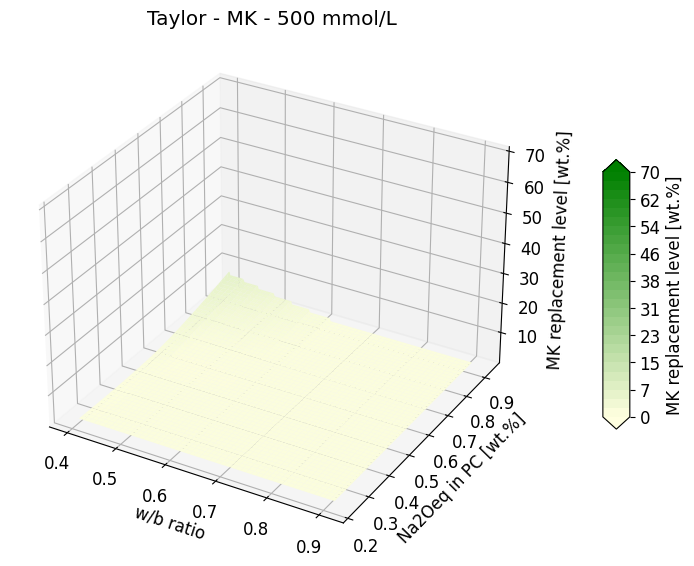

In [ ]:
import math
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import griddata


import math

# Define SCM parameters
scm_parameters = {
    'FA': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0.04,
        'total_k_content_water_soluble': 0.03,
        'fraction_of_glass': 0.8,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.81,
        'm_tot_SCM_K': 2.74
    },
    'MK': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.05,
        'm_tot_SCM_K': 1
    },
    'SF': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.32,
        'm_tot_SCM_K': 0.71
    },
    'slag': {
        'binding_factor_na': 0.08,
        'binding_factor_k': 0.04,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.29,
        'm_tot_SCM_K': 0.38
    }
}

# Define cement parameters
cement_parameters = {
    '0.93': {'m_tot_PC_Na': 0.42, 'm_tot_PC_K': 0.78},
    '0.62': {'m_tot_PC_Na': 0.28, 'm_tot_PC_K': 0.52},
    '0.47': {'m_tot_PC_Na': 0.21, 'm_tot_PC_K': 0.39},
    '0.23': {'m_tot_PC_Na': 0.105, 'm_tot_PC_K': 0.195}
}


def get_scm_parameters(scm_type):
    return scm_parameters.get(scm_type, {})

def get_cement_parameters(alkali_content):
    return cement_parameters.get(alkali_content, {})

def calculate_dor_scm(scm_type_for_dor, replacement_level, time):
    if scm_type_for_dor == 'FA_RILEM':
        dor_scm = replacement_level * (0.49993 - 0.0041 * replacement_level)
    elif scm_type_for_dor == 'FA_Taylor':
        fraction_of_glass = scm_parameters['FA']['fraction_of_glass']
        dor_scm = fraction_of_glass * replacement_level * (1 - math.exp(-(0.043 - (replacement_level * fraction_of_glass * 0.0005)) * time ** (0.585 - (replacement_level * fraction_of_glass * 0.0005))))
    elif scm_type_for_dor == 'SF':
        dor_scm = replacement_level
    elif scm_type_for_dor == 'slag':
        dor_scm = replacement_level * 0.7
    elif scm_type_for_dor == 'MK':
        if replacement_level <= 5:
            dor_scm = replacement_level
        elif replacement_level <= 35:
            dor_scm = replacement_level * (100 - ((replacement_level - 5) * 60 / 30)) / 100
        else:
            dor_scm = replacement_level * 40 / 100
    else:
        dor_scm = 0  # Default value if scm_type does not match

    # print(f"Degree of Reaction (DoR) for SCM {scm_type_for_dor}: {dor_scm}")
    return dor_scm

def calculate_na_k_concentration(replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor):
    scm_params = get_scm_parameters(scm_type_for_parameters)
    cement_params = get_cement_parameters(alkali_content)

    binding_factor_na = scm_params['binding_factor_na']
    binding_factor_k = scm_params['binding_factor_k']
    total_na_content_water_soluble = scm_params['total_na_content_water_soluble']
    total_k_content_water_soluble = scm_params['total_k_content_water_soluble']
    fraction_of_glass = scm_params['fraction_of_glass']
    g_bound_water_per_g_reacted_scm = scm_params['g_bound_water_per_g_reacted_scm']
    m_tot_SCM_Na = scm_params['m_tot_SCM_Na']
    m_tot_SCM_K = scm_params['m_tot_SCM_K']

    m_tot_PC_Na = cement_params['m_tot_PC_Na']
    m_tot_PC_K = cement_params['m_tot_PC_K']

    dor_scm = calculate_dor_scm(scm_type_for_dor, replacement_level, time)

    na_mass = 23.0  # [g/mol]
    k_mass = 39.1   # [g/mol]
    na2o_mass = 62.0  # [g/mol]
    k2o_mass = 94.2   # [g/mol]

    # Calculate F functions
    F_C4AF = 1 - math.exp(-(0.55 + (0.012 * replacement_level)) * (time - 0.9) ** 0.26)
    F_C3A = 1 - math.exp(-(0.77 + (0.008 * replacement_level)) * (time - 0.9) ** 0.28)
    F_C2S = 1 - math.exp(-(0.12 - (0.0007 * replacement_level)) * time ** (0.46 - (0.002 * replacement_level)))
    F_C3S = 1 - math.exp(-(0.7 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)

    # print(f"F_C4AF: {F_C4AF}, F_C3A: {F_C3A}, F_C2S: {F_C2S}, F_C3S: {F_C3S}")

    # F_CRP function
    F_CRP = ((100 - replacement_level) / 100) * replacement_level ** 0.09 * (1 - math.exp(-(0.56 - (0.0043 * replacement_level)) * (time - 0.9) ** 0.25))
    # print(f"F_CRP: {F_CRP}")

    # Fractions for Alite, Belite, Aluminate, Ferrite
    na2o_fractions = {'Alite': 0.44, 'Belite': 0.17, 'Aluminate': 0.36, 'Ferrite': 0.03}
    k2o_fractions = {'Alite': 0.29, 'Belite': 0.41, 'Aluminate': 0.27, 'Ferrite': 0.03}

    # Calculate m_r_Na from PC
    total_na_content_water_soluble_PC = 35

    m_r_na_from_pc = (
        (m_tot_PC_Na * total_na_content_water_soluble_PC / 100) +
        (F_C3S * na2o_fractions['Alite'] + F_C2S * na2o_fractions['Belite'] + F_C3A * na2o_fractions['Aluminate'] + F_C4AF * na2o_fractions['Ferrite']) *
        (1 - total_na_content_water_soluble_PC / 100) * m_tot_PC_Na
    ) * ((100 - replacement_level) / 100) * 2 / na2o_mass
    # print(f"m_r_na_from_pc: {m_r_na_from_pc}")

    # Calculate m_r_Na from SCM
    m_r_na_from_scm = (
        (total_na_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_Na - total_na_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / na2o_mass
    # print(f"m_r_na_from_scm: {m_r_na_from_scm}")


    # Calculate V(t) pore solution
    V_b_t = 31.6 * ((100 - replacement_level) / 100) * (1 - math.exp(-(0.69 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)) + g_bound_water_per_g_reacted_scm * dor_scm
    V_t_pore_solution = (w_b_ratio * 100) - V_b_t
    # print(f"V_b_t: {V_b_t}, V_t_pore_solution: {V_t_pore_solution}")

    # Calculate Na concentration
    b_pc_na = 0.031
    na_concentration = ((m_r_na_from_pc + m_r_na_from_scm) * 1000 / (V_t_pore_solution +
     (b_pc_na * 1000 * F_CRP) +binding_factor_na * 10 * dor_scm)) * 1000
    # print(f"na_concentration: {na_concentration}")



    # Calculate K concentration
    total_k_content_water_soluble_PC = 70

    m_r_k_from_pc = (
        (m_tot_PC_K * total_k_content_water_soluble_PC/ 100) +
        (F_C3S * k2o_fractions['Alite'] + F_C2S * k2o_fractions['Belite'] + F_C3A * k2o_fractions['Aluminate'] + F_C4AF * k2o_fractions['Ferrite']) *
        (1 - total_k_content_water_soluble_PC / 100) * m_tot_PC_K
    ) * ((100 - replacement_level) / 100) * 2 / k2o_mass
    # print(f"m_r_k_from_pc: {m_r_k_from_pc}")


    m_r_k_from_scm = (
        (total_k_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_K - total_k_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / k2o_mass
    # print(f"m_r_k_from_scm: {m_r_k_from_scm}")

    b_pc_k = 0.02

    k_concentration = ((m_r_k_from_pc + m_r_k_from_scm) * 1000 / (V_t_pore_solution + (b_pc_k * 1000 * F_CRP)
    + binding_factor_k * 10 * dor_scm)) * 1000

    # Calculate total Na+K concentration
    na_k_concentration = na_concentration + k_concentration

    return na_k_concentration, na_concentration, k_concentration

# Constants
scm_type_for_parameters = 'MK'  # SCM type for selecting parameters
scm_type_for_dor = 'MK'  # SCM type for calculating DoR
time = 180  # Constant time value

# Define the ranges for the parameters
replacement_levels = np.arange(1, 100)  # Replacement levels from 1 to 40
alkali_contents = ['0.23', '0.47', '0.62', '0.93']  # Different alkali content values
w_b_ratios = np.arange(0.4, 0.91, 0.001)  # w/b ratios from 0.4 to 0.9

# Function to calculate the concentrations for 300 mmol/L
def calculate_replacement_levels_for_concentration(target_concentration, replacement_levels, w_b_ratios, alkali_contents):
    results = []
    for alkali_content in alkali_contents:
        for w_b_ratio in w_b_ratios:
            for replacement_level in replacement_levels:
                na_k_concentration, na_concentration, k_concentration = calculate_na_k_concentration(
                    replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor
                )
                if na_k_concentration <= target_concentration:
                    results.append((w_b_ratio, alkali_content, replacement_level))
                    break
    return results

# Target concentration
target_concentration = 500  # mmol/L

# Calculate the replacement levels
replacement_data = calculate_replacement_levels_for_concentration(target_concentration, replacement_levels, w_b_ratios, alkali_contents)

# Convert to DataFrame for easier plotting
df_replacement = pd.DataFrame(replacement_data, columns=['w/b Ratio', 'Alkali Content', 'Replacement Level'])

# Ensure Alkali Content is treated as float
df_replacement['Alkali Content'] = df_replacement['Alkali Content'].astype(float)

# Create a dense meshgrid for smoother interpolation
W_dense, A_dense = np.meshgrid(
    np.linspace(df_replacement['w/b Ratio'].min(), df_replacement['w/b Ratio'].max(), 300),
    np.linspace(df_replacement['Alkali Content'].min(), df_replacement['Alkali Content'].max(), 300)
)

# Interpolate the replacement levels on the dense grid
points = df_replacement[['w/b Ratio', 'Alkali Content']].values
values = df_replacement['Replacement Level'].values
Z_dense = griddata(points, values, (W_dense, A_dense), method='cubic', fill_value=0)

# Create a custom colormap with a smooth transition from light yellow to green
cmap = LinearSegmentedColormap.from_list('yellow_green', ['#FFFFE0', 'green'], N=800)

# Plotting the surface
fig = plt.figure(figsize=(9, 7))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W_dense, A_dense, Z_dense, cmap=cmap, edgecolor='none', vmin=0, vmax=70)

# Add color bar which maps values to colors
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10, pad=0.1, label='MK replacement level [wt.%]', extend='both', boundaries=np.linspace(0, 70, 28), format='%d')

ax.set_xlabel('w/b ratio')
ax.set_ylabel('Na2Oeq in PC [wt.%]')
ax.set_zlabel('MK replacement level [wt.%]')
ax.set_zlim(1, 70)
ax.set_title('Taylor - MK - 500 mmol/L')

plt.show()





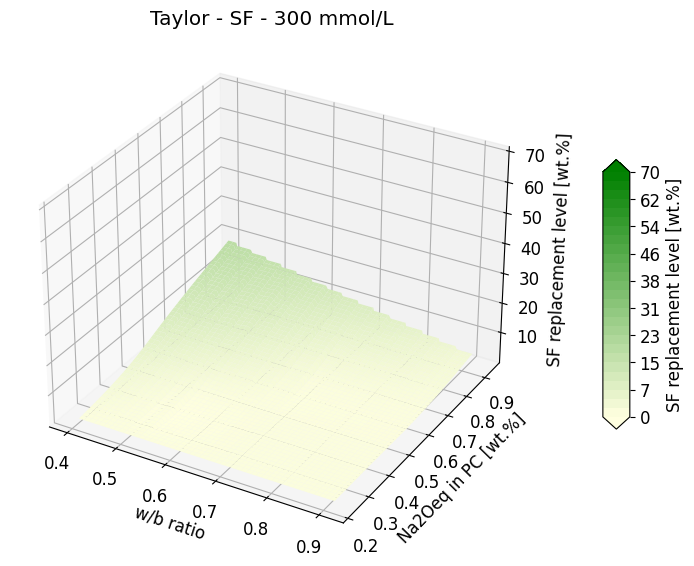

In [ ]:
import math

# Define SCM parameters
scm_parameters = {
    'FA': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0.04,
        'total_k_content_water_soluble': 0.03,
        'fraction_of_glass': 0.8,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.81,
        'm_tot_SCM_K': 2.74
    },
    'MK': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.05,
        'm_tot_SCM_K': 1
    },
    'SF': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.32,
        'm_tot_SCM_K': 0.71
    },
    'slag': {
        'binding_factor_na': 0.08,
        'binding_factor_k': 0.04,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.29,
        'm_tot_SCM_K': 0.38
    }
}

# Define cement parameters
cement_parameters = {
    '0.93': {'m_tot_PC_Na': 0.42, 'm_tot_PC_K': 0.78},
    '0.62': {'m_tot_PC_Na': 0.28, 'm_tot_PC_K': 0.52},
    '0.47': {'m_tot_PC_Na': 0.21, 'm_tot_PC_K': 0.39},
    '0.23': {'m_tot_PC_Na': 0.105, 'm_tot_PC_K': 0.195}
}


def get_scm_parameters(scm_type):
    return scm_parameters.get(scm_type, {})

def get_cement_parameters(alkali_content):
    return cement_parameters.get(alkali_content, {})

def calculate_dor_scm(scm_type_for_dor, replacement_level, time):
    if scm_type_for_dor == 'FA_RILEM':
        dor_scm = replacement_level * (0.49993 - 0.0041 * replacement_level)
    elif scm_type_for_dor == 'FA_Taylor':
        fraction_of_glass = scm_parameters['FA']['fraction_of_glass']
        dor_scm = fraction_of_glass * replacement_level * (1 - math.exp(-(0.043 - (replacement_level * fraction_of_glass * 0.0005)) * time ** (0.585 - (replacement_level * fraction_of_glass * 0.0005))))
    elif scm_type_for_dor == 'SF':
        dor_scm = replacement_level
    elif scm_type_for_dor == 'slag':
        dor_scm = replacement_level * 0.7
    elif scm_type_for_dor == 'MK':
        if replacement_level <= 5:
            dor_scm = replacement_level
        elif replacement_level <= 35:
            dor_scm = replacement_level * (100 - ((replacement_level - 5) * 60 / 30)) / 100
        else:
            dor_scm = replacement_level * 40 / 100
    else:
        dor_scm = 0  # Default value if scm_type does not match

    # print(f"Degree of Reaction (DoR) for SCM {scm_type_for_dor}: {dor_scm}")
    return dor_scm

def calculate_na_k_concentration(replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor):
    scm_params = get_scm_parameters(scm_type_for_parameters)
    cement_params = get_cement_parameters(alkali_content)

    binding_factor_na = scm_params['binding_factor_na']
    binding_factor_k = scm_params['binding_factor_k']
    total_na_content_water_soluble = scm_params['total_na_content_water_soluble']
    total_k_content_water_soluble = scm_params['total_k_content_water_soluble']
    fraction_of_glass = scm_params['fraction_of_glass']
    g_bound_water_per_g_reacted_scm = scm_params['g_bound_water_per_g_reacted_scm']
    m_tot_SCM_Na = scm_params['m_tot_SCM_Na']
    m_tot_SCM_K = scm_params['m_tot_SCM_K']

    m_tot_PC_Na = cement_params['m_tot_PC_Na']
    m_tot_PC_K = cement_params['m_tot_PC_K']

    dor_scm = calculate_dor_scm(scm_type_for_dor, replacement_level, time)

    na_mass = 23.0  # [g/mol]
    k_mass = 39.1   # [g/mol]
    na2o_mass = 62.0  # [g/mol]
    k2o_mass = 94.2   # [g/mol]

    # Calculate F functions
    F_C4AF = 1 - math.exp(-(0.55 + (0.012 * replacement_level)) * (time - 0.9) ** 0.26)
    F_C3A = 1 - math.exp(-(0.77 + (0.008 * replacement_level)) * (time - 0.9) ** 0.28)
    F_C2S = 1 - math.exp(-(0.12 - (0.0007 * replacement_level)) * time ** (0.46 - (0.002 * replacement_level)))
    F_C3S = 1 - math.exp(-(0.7 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)

    # print(f"F_C4AF: {F_C4AF}, F_C3A: {F_C3A}, F_C2S: {F_C2S}, F_C3S: {F_C3S}")

    # F_CRP function
    F_CRP = ((100 - replacement_level) / 100) * replacement_level ** 0.09 * (1 - math.exp(-(0.56 - (0.0043 * replacement_level)) * (time - 0.9) ** 0.25))
    # print(f"F_CRP: {F_CRP}")

    # Fractions for Alite, Belite, Aluminate, Ferrite
    na2o_fractions = {'Alite': 0.44, 'Belite': 0.17, 'Aluminate': 0.36, 'Ferrite': 0.03}
    k2o_fractions = {'Alite': 0.29, 'Belite': 0.41, 'Aluminate': 0.27, 'Ferrite': 0.03}

    # Calculate m_r_Na from PC
    total_na_content_water_soluble_PC = 35

    m_r_na_from_pc = (
        (m_tot_PC_Na * total_na_content_water_soluble_PC / 100) +
        (F_C3S * na2o_fractions['Alite'] + F_C2S * na2o_fractions['Belite'] + F_C3A * na2o_fractions['Aluminate'] + F_C4AF * na2o_fractions['Ferrite']) *
        (1 - total_na_content_water_soluble_PC / 100) * m_tot_PC_Na
    ) * ((100 - replacement_level) / 100) * 2 / na2o_mass
    # print(f"m_r_na_from_pc: {m_r_na_from_pc}")

    # Calculate m_r_Na from SCM
    m_r_na_from_scm = (
        (total_na_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_Na - total_na_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / na2o_mass
    # print(f"m_r_na_from_scm: {m_r_na_from_scm}")


    # Calculate V(t) pore solution
    V_b_t = 31.6 * ((100 - replacement_level) / 100) * (1 - math.exp(-(0.69 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)) + g_bound_water_per_g_reacted_scm * dor_scm
    V_t_pore_solution = (w_b_ratio * 100) - V_b_t
    # print(f"V_b_t: {V_b_t}, V_t_pore_solution: {V_t_pore_solution}")

    # Calculate Na concentration
    b_pc_na = 0.031
    na_concentration = ((m_r_na_from_pc + m_r_na_from_scm) * 1000 / (V_t_pore_solution +
     (b_pc_na * 1000 * F_CRP) +binding_factor_na * 10 * dor_scm)) * 1000
    # print(f"na_concentration: {na_concentration}")



    # Calculate K concentration
    total_k_content_water_soluble_PC = 70

    m_r_k_from_pc = (
        (m_tot_PC_K * total_k_content_water_soluble_PC/ 100) +
        (F_C3S * k2o_fractions['Alite'] + F_C2S * k2o_fractions['Belite'] + F_C3A * k2o_fractions['Aluminate'] + F_C4AF * k2o_fractions['Ferrite']) *
        (1 - total_k_content_water_soluble_PC / 100) * m_tot_PC_K
    ) * ((100 - replacement_level) / 100) * 2 / k2o_mass
    # print(f"m_r_k_from_pc: {m_r_k_from_pc}")


    m_r_k_from_scm = (
        (total_k_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_K - total_k_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / k2o_mass
    # print(f"m_r_k_from_scm: {m_r_k_from_scm}")

    b_pc_k = 0.02

    k_concentration = ((m_r_k_from_pc + m_r_k_from_scm) * 1000 / (V_t_pore_solution + (b_pc_k * 1000 * F_CRP)
    + binding_factor_k * 10 * dor_scm)) * 1000

    # Calculate total Na+K concentration
    na_k_concentration = na_concentration + k_concentration

    return na_k_concentration, na_concentration, k_concentration

# Constants
scm_type_for_parameters = 'SF'  # SCM type for selecting parameters
scm_type_for_dor = 'SF'  # SCM type for calculating DoR
time = 180  # Constant time value

# Define the ranges for the parameters
replacement_levels = np.arange(1, 100)  # Replacement levels from 1 to 40
alkali_contents = ['0.23', '0.47', '0.62', '0.93']  # Different alkali content values
w_b_ratios = np.arange(0.4, 0.91, 0.001)  # w/b ratios from 0.4 to 0.9

# Function to calculate the concentrations for 300 mmol/L
def calculate_replacement_levels_for_concentration(target_concentration, replacement_levels, w_b_ratios, alkali_contents):
    results = []
    for alkali_content in alkali_contents:
        for w_b_ratio in w_b_ratios:
            for replacement_level in replacement_levels:
                na_k_concentration, na_concentration, k_concentration = calculate_na_k_concentration(
                    replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor
                )
                if na_k_concentration <= target_concentration:
                    results.append((w_b_ratio, alkali_content, replacement_level))
                    break
    return results

# Target concentration
target_concentration = 300  # mmol/L

# Calculate the replacement levels
replacement_data = calculate_replacement_levels_for_concentration(target_concentration, replacement_levels, w_b_ratios, alkali_contents)

# Convert to DataFrame for easier plotting
df_replacement = pd.DataFrame(replacement_data, columns=['w/b Ratio', 'Alkali Content', 'Replacement Level'])

# Ensure Alkali Content is treated as float
df_replacement['Alkali Content'] = df_replacement['Alkali Content'].astype(float)

# Create a dense meshgrid for smoother interpolation
W_dense, A_dense = np.meshgrid(
    np.linspace(df_replacement['w/b Ratio'].min(), df_replacement['w/b Ratio'].max(), 300),
    np.linspace(df_replacement['Alkali Content'].min(), df_replacement['Alkali Content'].max(), 300)
)

# Interpolate the replacement levels on the dense grid
points = df_replacement[['w/b Ratio', 'Alkali Content']].values
values = df_replacement['Replacement Level'].values
Z_dense = griddata(points, values, (W_dense, A_dense), method='cubic', fill_value=0)

# Create a custom colormap with a smooth transition from light yellow to green
cmap = LinearSegmentedColormap.from_list('yellow_green', ['#FFFFE0', 'green'], N=800)

# Plotting the surface
fig = plt.figure(figsize=(9, 7))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W_dense, A_dense, Z_dense, cmap=cmap, edgecolor='none', vmin=0, vmax=70)

# Add color bar which maps values to colors
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10, pad=0.1, label='SF replacement level [wt.%]', extend='both', boundaries=np.linspace(0, 70, 28), format='%d')

ax.set_xlabel('w/b ratio')
ax.set_ylabel('Na2Oeq in PC [wt.%]')
ax.set_zlabel('SF replacement level [wt.%]')
ax.set_zlim(1, 70)
ax.set_title('Taylor - SF - 300 mmol/L')

plt.show()





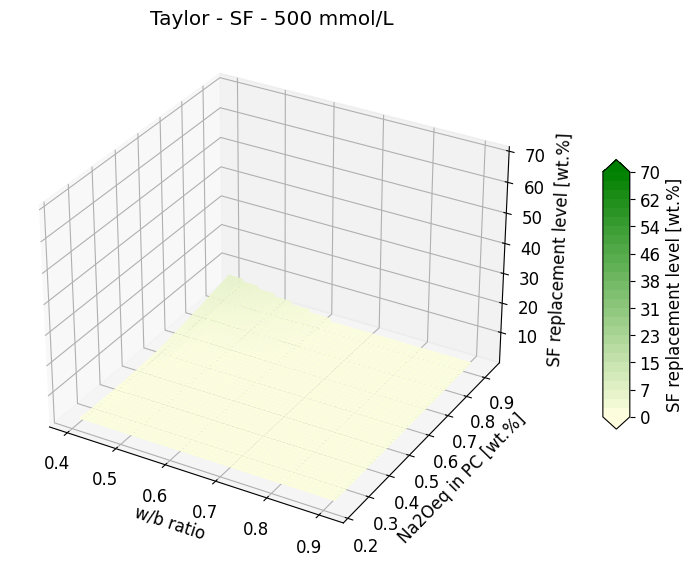

In [ ]:
import math

# Define SCM parameters
scm_parameters = {
    'FA': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0.04,
        'total_k_content_water_soluble': 0.03,
        'fraction_of_glass': 0.8,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.81,
        'm_tot_SCM_K': 2.74
    },
    'MK': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.05,
        'm_tot_SCM_K': 1
    },
    'SF': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.32,
        'm_tot_SCM_K': 0.71
    },
    'slag': {
        'binding_factor_na': 0.08,
        'binding_factor_k': 0.04,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.29,
        'm_tot_SCM_K': 0.38
    }
}

# Define cement parameters
cement_parameters = {
    '0.93': {'m_tot_PC_Na': 0.42, 'm_tot_PC_K': 0.78},
    '0.62': {'m_tot_PC_Na': 0.28, 'm_tot_PC_K': 0.52},
    '0.47': {'m_tot_PC_Na': 0.21, 'm_tot_PC_K': 0.39},
    '0.23': {'m_tot_PC_Na': 0.105, 'm_tot_PC_K': 0.195}
}


def get_scm_parameters(scm_type):
    return scm_parameters.get(scm_type, {})

def get_cement_parameters(alkali_content):
    return cement_parameters.get(alkali_content, {})

def calculate_dor_scm(scm_type_for_dor, replacement_level, time):
    if scm_type_for_dor == 'FA_RILEM':
        dor_scm = replacement_level * (0.49993 - 0.0041 * replacement_level)
    elif scm_type_for_dor == 'FA_Taylor':
        fraction_of_glass = scm_parameters['FA']['fraction_of_glass']
        dor_scm = fraction_of_glass * replacement_level * (1 - math.exp(-(0.043 - (replacement_level * fraction_of_glass * 0.0005)) * time ** (0.585 - (replacement_level * fraction_of_glass * 0.0005))))
    elif scm_type_for_dor == 'SF':
        dor_scm = replacement_level
    elif scm_type_for_dor == 'slag':
        dor_scm = replacement_level * 0.7
    elif scm_type_for_dor == 'MK':
        if replacement_level <= 5:
            dor_scm = replacement_level
        elif replacement_level <= 35:
            dor_scm = replacement_level * (100 - ((replacement_level - 5) * 60 / 30)) / 100
        else:
            dor_scm = replacement_level * 40 / 100
    else:
        dor_scm = 0  # Default value if scm_type does not match

    # print(f"Degree of Reaction (DoR) for SCM {scm_type_for_dor}: {dor_scm}")
    return dor_scm

def calculate_na_k_concentration(replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor):
    scm_params = get_scm_parameters(scm_type_for_parameters)
    cement_params = get_cement_parameters(alkali_content)

    binding_factor_na = scm_params['binding_factor_na']
    binding_factor_k = scm_params['binding_factor_k']
    total_na_content_water_soluble = scm_params['total_na_content_water_soluble']
    total_k_content_water_soluble = scm_params['total_k_content_water_soluble']
    fraction_of_glass = scm_params['fraction_of_glass']
    g_bound_water_per_g_reacted_scm = scm_params['g_bound_water_per_g_reacted_scm']
    m_tot_SCM_Na = scm_params['m_tot_SCM_Na']
    m_tot_SCM_K = scm_params['m_tot_SCM_K']

    m_tot_PC_Na = cement_params['m_tot_PC_Na']
    m_tot_PC_K = cement_params['m_tot_PC_K']

    dor_scm = calculate_dor_scm(scm_type_for_dor, replacement_level, time)

    na_mass = 23.0  # [g/mol]
    k_mass = 39.1   # [g/mol]
    na2o_mass = 62.0  # [g/mol]
    k2o_mass = 94.2   # [g/mol]

    # Calculate F functions
    F_C4AF = 1 - math.exp(-(0.55 + (0.012 * replacement_level)) * (time - 0.9) ** 0.26)
    F_C3A = 1 - math.exp(-(0.77 + (0.008 * replacement_level)) * (time - 0.9) ** 0.28)
    F_C2S = 1 - math.exp(-(0.12 - (0.0007 * replacement_level)) * time ** (0.46 - (0.002 * replacement_level)))
    F_C3S = 1 - math.exp(-(0.7 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)

    # print(f"F_C4AF: {F_C4AF}, F_C3A: {F_C3A}, F_C2S: {F_C2S}, F_C3S: {F_C3S}")

    # F_CRP function
    F_CRP = ((100 - replacement_level) / 100) * replacement_level ** 0.09 * (1 - math.exp(-(0.56 - (0.0043 * replacement_level)) * (time - 0.9) ** 0.25))
    # print(f"F_CRP: {F_CRP}")

    # Fractions for Alite, Belite, Aluminate, Ferrite
    na2o_fractions = {'Alite': 0.44, 'Belite': 0.17, 'Aluminate': 0.36, 'Ferrite': 0.03}
    k2o_fractions = {'Alite': 0.29, 'Belite': 0.41, 'Aluminate': 0.27, 'Ferrite': 0.03}

    # Calculate m_r_Na from PC
    total_na_content_water_soluble_PC = 35

    m_r_na_from_pc = (
        (m_tot_PC_Na * total_na_content_water_soluble_PC / 100) +
        (F_C3S * na2o_fractions['Alite'] + F_C2S * na2o_fractions['Belite'] + F_C3A * na2o_fractions['Aluminate'] + F_C4AF * na2o_fractions['Ferrite']) *
        (1 - total_na_content_water_soluble_PC / 100) * m_tot_PC_Na
    ) * ((100 - replacement_level) / 100) * 2 / na2o_mass
    # print(f"m_r_na_from_pc: {m_r_na_from_pc}")

    # Calculate m_r_Na from SCM
    m_r_na_from_scm = (
        (total_na_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_Na - total_na_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / na2o_mass
    # print(f"m_r_na_from_scm: {m_r_na_from_scm}")


    # Calculate V(t) pore solution
    V_b_t = 31.6 * ((100 - replacement_level) / 100) * (1 - math.exp(-(0.69 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)) + g_bound_water_per_g_reacted_scm * dor_scm
    V_t_pore_solution = (w_b_ratio * 100) - V_b_t
    # print(f"V_b_t: {V_b_t}, V_t_pore_solution: {V_t_pore_solution}")

    # Calculate Na concentration
    b_pc_na = 0.031
    na_concentration = ((m_r_na_from_pc + m_r_na_from_scm) * 1000 / (V_t_pore_solution +
     (b_pc_na * 1000 * F_CRP) +binding_factor_na * 10 * dor_scm)) * 1000
    # print(f"na_concentration: {na_concentration}")



    # Calculate K concentration
    total_k_content_water_soluble_PC = 70

    m_r_k_from_pc = (
        (m_tot_PC_K * total_k_content_water_soluble_PC/ 100) +
        (F_C3S * k2o_fractions['Alite'] + F_C2S * k2o_fractions['Belite'] + F_C3A * k2o_fractions['Aluminate'] + F_C4AF * k2o_fractions['Ferrite']) *
        (1 - total_k_content_water_soluble_PC / 100) * m_tot_PC_K
    ) * ((100 - replacement_level) / 100) * 2 / k2o_mass
    # print(f"m_r_k_from_pc: {m_r_k_from_pc}")


    m_r_k_from_scm = (
        (total_k_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_K - total_k_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / k2o_mass
    # print(f"m_r_k_from_scm: {m_r_k_from_scm}")

    b_pc_k = 0.02

    k_concentration = ((m_r_k_from_pc + m_r_k_from_scm) * 1000 / (V_t_pore_solution + (b_pc_k * 1000 * F_CRP)
    + binding_factor_k * 10 * dor_scm)) * 1000

    # Calculate total Na+K concentration
    na_k_concentration = na_concentration + k_concentration

    return na_k_concentration, na_concentration, k_concentration

# Constants
scm_type_for_parameters = 'SF'  # SCM type for selecting parameters
scm_type_for_dor = 'SF'  # SCM type for calculating DoR
time = 180  # Constant time value

# Define the ranges for the parameters
replacement_levels = np.arange(1, 100)  # Replacement levels from 1 to 40
alkali_contents = ['0.23', '0.47', '0.62', '0.93']  # Different alkali content values
w_b_ratios = np.arange(0.4, 0.91, 0.001)  # w/b ratios from 0.4 to 0.9

# Function to calculate the concentrations for 300 mmol/L
def calculate_replacement_levels_for_concentration(target_concentration, replacement_levels, w_b_ratios, alkali_contents):
    results = []
    for alkali_content in alkali_contents:
        for w_b_ratio in w_b_ratios:
            for replacement_level in replacement_levels:
                na_k_concentration, na_concentration, k_concentration = calculate_na_k_concentration(
                    replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor
                )
                if na_k_concentration <= target_concentration:
                    results.append((w_b_ratio, alkali_content, replacement_level))
                    break
    return results

# Target concentration
target_concentration = 500  # mmol/L

# Calculate the replacement levels
replacement_data = calculate_replacement_levels_for_concentration(target_concentration, replacement_levels, w_b_ratios, alkali_contents)

# Convert to DataFrame for easier plotting
df_replacement = pd.DataFrame(replacement_data, columns=['w/b Ratio', 'Alkali Content', 'Replacement Level'])

# Ensure Alkali Content is treated as float
df_replacement['Alkali Content'] = df_replacement['Alkali Content'].astype(float)

# Create a dense meshgrid for smoother interpolation
W_dense, A_dense = np.meshgrid(
    np.linspace(df_replacement['w/b Ratio'].min(), df_replacement['w/b Ratio'].max(), 300),
    np.linspace(df_replacement['Alkali Content'].min(), df_replacement['Alkali Content'].max(), 300)
)

# Interpolate the replacement levels on the dense grid
points = df_replacement[['w/b Ratio', 'Alkali Content']].values
values = df_replacement['Replacement Level'].values
Z_dense = griddata(points, values, (W_dense, A_dense), method='cubic', fill_value=0)

# Create a custom colormap with a smooth transition from light yellow to green
cmap = LinearSegmentedColormap.from_list('yellow_green', ['#FFFFE0', 'green'], N=800)

# Plotting the surface
fig = plt.figure(figsize=(9, 7))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W_dense, A_dense, Z_dense, cmap=cmap, edgecolor='none', vmin=0, vmax=70)

# Add color bar which maps values to colors
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10, pad=0.1, label='SF replacement level [wt.%]', extend='both', boundaries=np.linspace(0, 70, 28), format='%d')

ax.set_xlabel('w/b ratio')
ax.set_ylabel('Na2Oeq in PC [wt.%]')
ax.set_zlabel('SF replacement level [wt.%]')
ax.set_zlim(1, 70)
ax.set_title('Taylor - SF - 500 mmol/L')

plt.show()





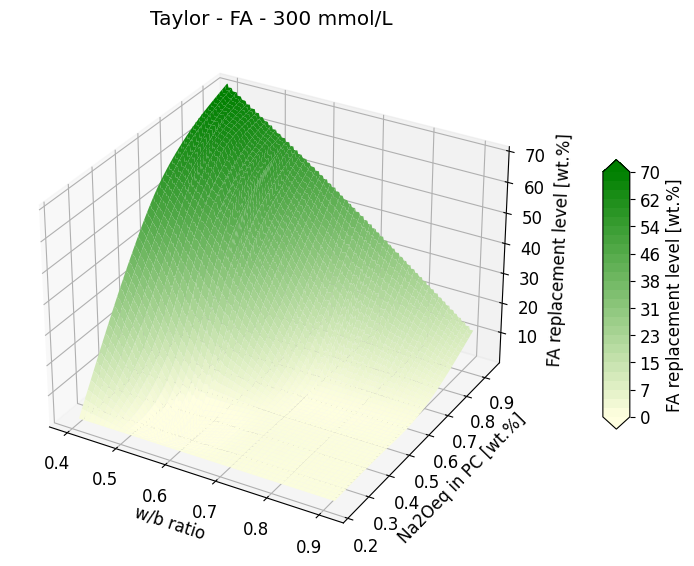

In [ ]:
import math
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import griddata

import math

# Define SCM parameters
scm_parameters = {
    'FA': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0.04,
        'total_k_content_water_soluble': 0.03,
        'fraction_of_glass': 0.8,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.81,
        'm_tot_SCM_K': 2.74
    },
    'MK': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.05,
        'm_tot_SCM_K': 1
    },
    'SF': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.32,
        'm_tot_SCM_K': 0.71
    },
    'slag': {
        'binding_factor_na': 0.08,
        'binding_factor_k': 0.04,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.29,
        'm_tot_SCM_K': 0.38
    }
}

# Define cement parameters
cement_parameters = {
    '0.93': {'m_tot_PC_Na': 0.42, 'm_tot_PC_K': 0.78},
    '0.62': {'m_tot_PC_Na': 0.28, 'm_tot_PC_K': 0.52},
    '0.47': {'m_tot_PC_Na': 0.21, 'm_tot_PC_K': 0.39},
    '0.23': {'m_tot_PC_Na': 0.105, 'm_tot_PC_K': 0.195}
}


def get_scm_parameters(scm_type):
    return scm_parameters.get(scm_type, {})

def get_cement_parameters(alkali_content):
    return cement_parameters.get(alkali_content, {})

def calculate_dor_scm(scm_type_for_dor, replacement_level, time):
    if scm_type_for_dor == 'FA_RILEM':
        dor_scm = replacement_level * (0.49993 - 0.0041 * replacement_level)
    elif scm_type_for_dor == 'FA_Taylor':
        fraction_of_glass = scm_parameters['FA']['fraction_of_glass']
        dor_scm = fraction_of_glass * replacement_level * (1 - math.exp(-(0.043 - (replacement_level * fraction_of_glass * 0.0005)) * time ** (0.585 - (replacement_level * fraction_of_glass * 0.0005))))
    elif scm_type_for_dor == 'SF':
        dor_scm = replacement_level
    elif scm_type_for_dor == 'slag':
        dor_scm = replacement_level * 0.7
    elif scm_type_for_dor == 'MK':
        if replacement_level <= 5:
            dor_scm = replacement_level
        elif replacement_level <= 35:
            dor_scm = replacement_level * (100 - ((replacement_level - 5) * 60 / 30)) / 100
        else:
            dor_scm = replacement_level * 40 / 100
    else:
        dor_scm = 0  # Default value if scm_type does not match

    # print(f"Degree of Reaction (DoR) for SCM {scm_type_for_dor}: {dor_scm}")
    return dor_scm

def calculate_na_k_concentration(replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor):
    scm_params = get_scm_parameters(scm_type_for_parameters)
    cement_params = get_cement_parameters(alkali_content)

    binding_factor_na = scm_params['binding_factor_na']
    binding_factor_k = scm_params['binding_factor_k']
    total_na_content_water_soluble = scm_params['total_na_content_water_soluble']
    total_k_content_water_soluble = scm_params['total_k_content_water_soluble']
    fraction_of_glass = scm_params['fraction_of_glass']
    g_bound_water_per_g_reacted_scm = scm_params['g_bound_water_per_g_reacted_scm']
    m_tot_SCM_Na = scm_params['m_tot_SCM_Na']
    m_tot_SCM_K = scm_params['m_tot_SCM_K']

    m_tot_PC_Na = cement_params['m_tot_PC_Na']
    m_tot_PC_K = cement_params['m_tot_PC_K']

    dor_scm = calculate_dor_scm(scm_type_for_dor, replacement_level, time)

    na_mass = 23.0  # [g/mol]
    k_mass = 39.1   # [g/mol]
    na2o_mass = 62.0  # [g/mol]
    k2o_mass = 94.2   # [g/mol]

    # Calculate F functions
    F_C4AF = 1 - math.exp(-(0.55 + (0.012 * replacement_level)) * (time - 0.9) ** 0.26)
    F_C3A = 1 - math.exp(-(0.77 + (0.008 * replacement_level)) * (time - 0.9) ** 0.28)
    F_C2S = 1 - math.exp(-(0.12 - (0.0007 * replacement_level)) * time ** (0.46 - (0.002 * replacement_level)))
    F_C3S = 1 - math.exp(-(0.7 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)

    # print(f"F_C4AF: {F_C4AF}, F_C3A: {F_C3A}, F_C2S: {F_C2S}, F_C3S: {F_C3S}")

    # F_CRP function
    F_CRP = ((100 - replacement_level) / 100) * replacement_level ** 0.09 * (1 - math.exp(-(0.56 - (0.0043 * replacement_level)) * (time - 0.9) ** 0.25))
    # print(f"F_CRP: {F_CRP}")

    # Fractions for Alite, Belite, Aluminate, Ferrite
    na2o_fractions = {'Alite': 0.44, 'Belite': 0.17, 'Aluminate': 0.36, 'Ferrite': 0.03}
    k2o_fractions = {'Alite': 0.29, 'Belite': 0.41, 'Aluminate': 0.27, 'Ferrite': 0.03}

    # Calculate m_r_Na from PC
    total_na_content_water_soluble_PC = 35

    m_r_na_from_pc = (
        (m_tot_PC_Na * total_na_content_water_soluble_PC / 100) +
        (F_C3S * na2o_fractions['Alite'] + F_C2S * na2o_fractions['Belite'] + F_C3A * na2o_fractions['Aluminate'] + F_C4AF * na2o_fractions['Ferrite']) *
        (1 - total_na_content_water_soluble_PC / 100) * m_tot_PC_Na
    ) * ((100 - replacement_level) / 100) * 2 / na2o_mass
    # print(f"m_r_na_from_pc: {m_r_na_from_pc}")

    # Calculate m_r_Na from SCM
    m_r_na_from_scm = (
        (total_na_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_Na - total_na_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / na2o_mass
    # print(f"m_r_na_from_scm: {m_r_na_from_scm}")


    # Calculate V(t) pore solution
    V_b_t = 31.6 * ((100 - replacement_level) / 100) * (1 - math.exp(-(0.69 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)) + g_bound_water_per_g_reacted_scm * dor_scm
    V_t_pore_solution = (w_b_ratio * 100) - V_b_t
    # print(f"V_b_t: {V_b_t}, V_t_pore_solution: {V_t_pore_solution}")

    # Calculate Na concentration
    b_pc_na = 0.031
    na_concentration = ((m_r_na_from_pc + m_r_na_from_scm) * 1000 / (V_t_pore_solution +
     (b_pc_na * 1000 * F_CRP) +binding_factor_na * 10 * dor_scm)) * 1000
    # print(f"na_concentration: {na_concentration}")



    # Calculate K concentration
    total_k_content_water_soluble_PC = 70

    m_r_k_from_pc = (
        (m_tot_PC_K * total_k_content_water_soluble_PC/ 100) +
        (F_C3S * k2o_fractions['Alite'] + F_C2S * k2o_fractions['Belite'] + F_C3A * k2o_fractions['Aluminate'] + F_C4AF * k2o_fractions['Ferrite']) *
        (1 - total_k_content_water_soluble_PC / 100) * m_tot_PC_K
    ) * ((100 - replacement_level) / 100) * 2 / k2o_mass
    # print(f"m_r_k_from_pc: {m_r_k_from_pc}")


    m_r_k_from_scm = (
        (total_k_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_K - total_k_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / k2o_mass
    # print(f"m_r_k_from_scm: {m_r_k_from_scm}")

    b_pc_k = 0.02

    k_concentration = ((m_r_k_from_pc + m_r_k_from_scm) * 1000 / (V_t_pore_solution + (b_pc_k * 1000 * F_CRP)
    + binding_factor_k * 10 * dor_scm)) * 1000

    # Calculate total Na+K concentration
    na_k_concentration = na_concentration + k_concentration

    return na_k_concentration, na_concentration, k_concentration

# Constants
scm_type_for_parameters = 'FA'  # SCM type for selecting parameters
scm_type_for_dor = 'FA_RILEM'  # SCM type for calculating DoR
time = 180  # Constant time value

# Define the ranges for the parameters
replacement_levels = np.arange(1, 100)  # Replacement levels from 1 to 40
alkali_contents = ['0.23', '0.47', '0.62', '0.93']  # Different alkali content values
w_b_ratios = np.arange(0.4, 0.91, 0.001)  # w/b ratios from 0.4 to 0.9

# Function to calculate the concentrations for 300 mmol/L
def calculate_replacement_levels_for_concentration(target_concentration, replacement_levels, w_b_ratios, alkali_contents):
    results = []
    for alkali_content in alkali_contents:
        for w_b_ratio in w_b_ratios:
            for replacement_level in replacement_levels:
                na_k_concentration, na_concentration, k_concentration = calculate_na_k_concentration(
                    replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor
                )
                if na_k_concentration <= target_concentration:
                    results.append((w_b_ratio, alkali_content, replacement_level))
                    break
    return results

# Target concentration
target_concentration = 300  # mmol/L

# Calculate the replacement levels
replacement_data = calculate_replacement_levels_for_concentration(target_concentration, replacement_levels, w_b_ratios, alkali_contents)

# Convert to DataFrame for easier plotting
df_replacement = pd.DataFrame(replacement_data, columns=['w/b Ratio', 'Alkali Content', 'Replacement Level'])

# Ensure Alkali Content is treated as float
df_replacement['Alkali Content'] = df_replacement['Alkali Content'].astype(float)

# Create a dense meshgrid for smoother interpolation
W_dense, A_dense = np.meshgrid(
    np.linspace(df_replacement['w/b Ratio'].min(), df_replacement['w/b Ratio'].max(), 300),
    np.linspace(df_replacement['Alkali Content'].min(), df_replacement['Alkali Content'].max(), 300)
)

# Interpolate the replacement levels on the dense grid
points = df_replacement[['w/b Ratio', 'Alkali Content']].values
values = df_replacement['Replacement Level'].values
Z_dense = griddata(points, values, (W_dense, A_dense), method='cubic', fill_value=0)

# Create a custom colormap with a smooth transition from light yellow to green
cmap = LinearSegmentedColormap.from_list('yellow_green', ['#FFFFE0', 'green'], N=800)

# Plotting the surface
fig = plt.figure(figsize=(9, 7))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W_dense, A_dense, Z_dense, cmap=cmap, edgecolor='none', vmin=0, vmax=70)

# Add color bar which maps values to colors
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10, pad=0.1, label='FA replacement level [wt.%]', extend='both', boundaries=np.linspace(0, 70, 28), format='%d')

ax.set_xlabel('w/b ratio')
ax.set_ylabel('Na2Oeq in PC [wt.%]')
ax.set_zlabel('FA replacement level [wt.%]')
ax.set_zlim(1, 70)
ax.set_title('Taylor - FA - 300 mmol/L')

plt.show()





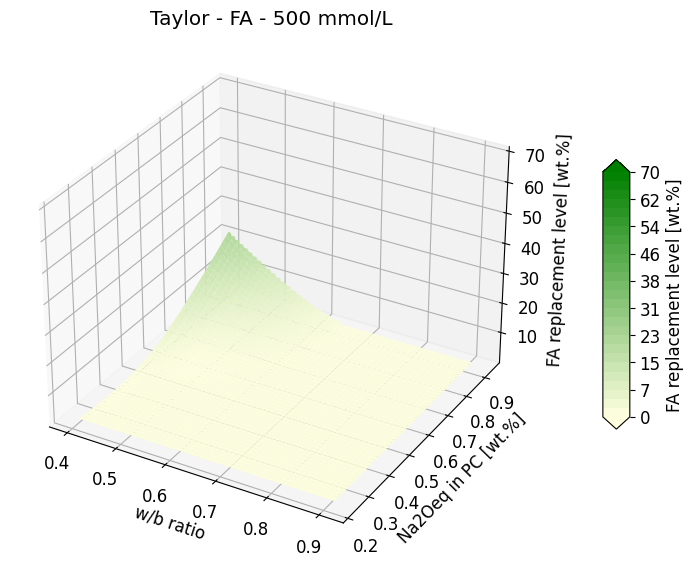

In [ ]:
import math
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import griddata

import math

# Define SCM parameters
scm_parameters = {
    'FA': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0.04,
        'total_k_content_water_soluble': 0.03,
        'fraction_of_glass': 0.8,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.81,
        'm_tot_SCM_K': 2.74
    },
    'MK': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.05,
        'm_tot_SCM_K': 1
    },
    'SF': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.32,
        'm_tot_SCM_K': 0.71
    },
    'slag': {
        'binding_factor_na': 0.08,
        'binding_factor_k': 0.04,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.29,
        'm_tot_SCM_K': 0.38
    }
}

# Define cement parameters
cement_parameters = {
    '0.93': {'m_tot_PC_Na': 0.42, 'm_tot_PC_K': 0.78},
    '0.62': {'m_tot_PC_Na': 0.28, 'm_tot_PC_K': 0.52},
    '0.47': {'m_tot_PC_Na': 0.21, 'm_tot_PC_K': 0.39},
    '0.23': {'m_tot_PC_Na': 0.105, 'm_tot_PC_K': 0.195}
}


def get_scm_parameters(scm_type):
    return scm_parameters.get(scm_type, {})

def get_cement_parameters(alkali_content):
    return cement_parameters.get(alkali_content, {})

def calculate_dor_scm(scm_type_for_dor, replacement_level, time):
    if scm_type_for_dor == 'FA_RILEM':
        dor_scm = replacement_level * (0.49993 - 0.0041 * replacement_level)
    elif scm_type_for_dor == 'FA_Taylor':
        fraction_of_glass = scm_parameters['FA']['fraction_of_glass']
        dor_scm = fraction_of_glass * replacement_level * (1 - math.exp(-(0.043 - (replacement_level * fraction_of_glass * 0.0005)) * time ** (0.585 - (replacement_level * fraction_of_glass * 0.0005))))
    elif scm_type_for_dor == 'SF':
        dor_scm = replacement_level
    elif scm_type_for_dor == 'slag':
        dor_scm = replacement_level * 0.7
    elif scm_type_for_dor == 'MK':
        if replacement_level <= 5:
            dor_scm = replacement_level
        elif replacement_level <= 35:
            dor_scm = replacement_level * (100 - ((replacement_level - 5) * 60 / 30)) / 100
        else:
            dor_scm = replacement_level * 40 / 100
    else:
        dor_scm = 0  # Default value if scm_type does not match

    # print(f"Degree of Reaction (DoR) for SCM {scm_type_for_dor}: {dor_scm}")
    return dor_scm

def calculate_na_k_concentration(replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor):
    scm_params = get_scm_parameters(scm_type_for_parameters)
    cement_params = get_cement_parameters(alkali_content)

    binding_factor_na = scm_params['binding_factor_na']
    binding_factor_k = scm_params['binding_factor_k']
    total_na_content_water_soluble = scm_params['total_na_content_water_soluble']
    total_k_content_water_soluble = scm_params['total_k_content_water_soluble']
    fraction_of_glass = scm_params['fraction_of_glass']
    g_bound_water_per_g_reacted_scm = scm_params['g_bound_water_per_g_reacted_scm']
    m_tot_SCM_Na = scm_params['m_tot_SCM_Na']
    m_tot_SCM_K = scm_params['m_tot_SCM_K']

    m_tot_PC_Na = cement_params['m_tot_PC_Na']
    m_tot_PC_K = cement_params['m_tot_PC_K']

    dor_scm = calculate_dor_scm(scm_type_for_dor, replacement_level, time)

    na_mass = 23.0  # [g/mol]
    k_mass = 39.1   # [g/mol]
    na2o_mass = 62.0  # [g/mol]
    k2o_mass = 94.2   # [g/mol]

    # Calculate F functions
    F_C4AF = 1 - math.exp(-(0.55 + (0.012 * replacement_level)) * (time - 0.9) ** 0.26)
    F_C3A = 1 - math.exp(-(0.77 + (0.008 * replacement_level)) * (time - 0.9) ** 0.28)
    F_C2S = 1 - math.exp(-(0.12 - (0.0007 * replacement_level)) * time ** (0.46 - (0.002 * replacement_level)))
    F_C3S = 1 - math.exp(-(0.7 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)

    # print(f"F_C4AF: {F_C4AF}, F_C3A: {F_C3A}, F_C2S: {F_C2S}, F_C3S: {F_C3S}")

    # F_CRP function
    F_CRP = ((100 - replacement_level) / 100) * replacement_level ** 0.09 * (1 - math.exp(-(0.56 - (0.0043 * replacement_level)) * (time - 0.9) ** 0.25))
    # print(f"F_CRP: {F_CRP}")

    # Fractions for Alite, Belite, Aluminate, Ferrite
    na2o_fractions = {'Alite': 0.44, 'Belite': 0.17, 'Aluminate': 0.36, 'Ferrite': 0.03}
    k2o_fractions = {'Alite': 0.29, 'Belite': 0.41, 'Aluminate': 0.27, 'Ferrite': 0.03}

    # Calculate m_r_Na from PC
    total_na_content_water_soluble_PC = 35

    m_r_na_from_pc = (
        (m_tot_PC_Na * total_na_content_water_soluble_PC / 100) +
        (F_C3S * na2o_fractions['Alite'] + F_C2S * na2o_fractions['Belite'] + F_C3A * na2o_fractions['Aluminate'] + F_C4AF * na2o_fractions['Ferrite']) *
        (1 - total_na_content_water_soluble_PC / 100) * m_tot_PC_Na
    ) * ((100 - replacement_level) / 100) * 2 / na2o_mass
    # print(f"m_r_na_from_pc: {m_r_na_from_pc}")

    # Calculate m_r_Na from SCM
    m_r_na_from_scm = (
        (total_na_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_Na - total_na_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / na2o_mass
    # print(f"m_r_na_from_scm: {m_r_na_from_scm}")


    # Calculate V(t) pore solution
    V_b_t = 31.6 * ((100 - replacement_level) / 100) * (1 - math.exp(-(0.69 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)) + g_bound_water_per_g_reacted_scm * dor_scm
    V_t_pore_solution = (w_b_ratio * 100) - V_b_t
    # print(f"V_b_t: {V_b_t}, V_t_pore_solution: {V_t_pore_solution}")

    # Calculate Na concentration
    b_pc_na = 0.031
    na_concentration = ((m_r_na_from_pc + m_r_na_from_scm) * 1000 / (V_t_pore_solution +
     (b_pc_na * 1000 * F_CRP) +binding_factor_na * 10 * dor_scm)) * 1000
    # print(f"na_concentration: {na_concentration}")



    # Calculate K concentration
    total_k_content_water_soluble_PC = 70

    m_r_k_from_pc = (
        (m_tot_PC_K * total_k_content_water_soluble_PC/ 100) +
        (F_C3S * k2o_fractions['Alite'] + F_C2S * k2o_fractions['Belite'] + F_C3A * k2o_fractions['Aluminate'] + F_C4AF * k2o_fractions['Ferrite']) *
        (1 - total_k_content_water_soluble_PC / 100) * m_tot_PC_K
    ) * ((100 - replacement_level) / 100) * 2 / k2o_mass
    # print(f"m_r_k_from_pc: {m_r_k_from_pc}")


    m_r_k_from_scm = (
        (total_k_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_K - total_k_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / k2o_mass
    # print(f"m_r_k_from_scm: {m_r_k_from_scm}")

    b_pc_k = 0.02

    k_concentration = ((m_r_k_from_pc + m_r_k_from_scm) * 1000 / (V_t_pore_solution + (b_pc_k * 1000 * F_CRP)
    + binding_factor_k * 10 * dor_scm)) * 1000

    # Calculate total Na+K concentration
    na_k_concentration = na_concentration + k_concentration

    return na_k_concentration, na_concentration, k_concentration

# Constants
scm_type_for_parameters = 'FA'  # SCM type for selecting parameters
scm_type_for_dor = 'FA_RILEM'  # SCM type for calculating DoR
time = 180  # Constant time value

# Define the ranges for the parameters
replacement_levels = np.arange(1, 100)  # Replacement levels from 1 to 40
alkali_contents = ['0.23', '0.47', '0.62', '0.93']  # Different alkali content values
w_b_ratios = np.arange(0.4, 0.91, 0.001)  # w/b ratios from 0.4 to 0.9

# Function to calculate the concentrations for 300 mmol/L
def calculate_replacement_levels_for_concentration(target_concentration, replacement_levels, w_b_ratios, alkali_contents):
    results = []
    for alkali_content in alkali_contents:
        for w_b_ratio in w_b_ratios:
            for replacement_level in replacement_levels:
                na_k_concentration, na_concentration, k_concentration = calculate_na_k_concentration(
                    replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor
                )
                if na_k_concentration <= target_concentration:
                    results.append((w_b_ratio, alkali_content, replacement_level))
                    break
    return results

# Target concentration
target_concentration = 500  # mmol/L

# Calculate the replacement levels
replacement_data = calculate_replacement_levels_for_concentration(target_concentration, replacement_levels, w_b_ratios, alkali_contents)

# Convert to DataFrame for easier plotting
df_replacement = pd.DataFrame(replacement_data, columns=['w/b Ratio', 'Alkali Content', 'Replacement Level'])

# Ensure Alkali Content is treated as float
df_replacement['Alkali Content'] = df_replacement['Alkali Content'].astype(float)

# Create a dense meshgrid for smoother interpolation
W_dense, A_dense = np.meshgrid(
    np.linspace(df_replacement['w/b Ratio'].min(), df_replacement['w/b Ratio'].max(), 300),
    np.linspace(df_replacement['Alkali Content'].min(), df_replacement['Alkali Content'].max(), 300)
)

# Interpolate the replacement levels on the dense grid
points = df_replacement[['w/b Ratio', 'Alkali Content']].values
values = df_replacement['Replacement Level'].values
Z_dense = griddata(points, values, (W_dense, A_dense), method='cubic', fill_value=0)

# Create a custom colormap with a smooth transition from light yellow to green
cmap = LinearSegmentedColormap.from_list('yellow_green', ['#FFFFE0', 'green'], N=800)

# Plotting the surface
fig = plt.figure(figsize=(9, 7))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W_dense, A_dense, Z_dense, cmap=cmap, edgecolor='none', vmin=0, vmax=70)

# Add color bar which maps values to colors
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10, pad=0.1, label='FA replacement level [wt.%]', extend='both', boundaries=np.linspace(0, 70, 28), format='%d')

ax.set_xlabel('w/b ratio')
ax.set_ylabel('Na2Oeq in PC [wt.%]')
ax.set_zlabel('FA replacement level [wt.%]')
ax.set_zlim(1, 70)
ax.set_title('Taylor - FA - 500 mmol/L')

plt.show()





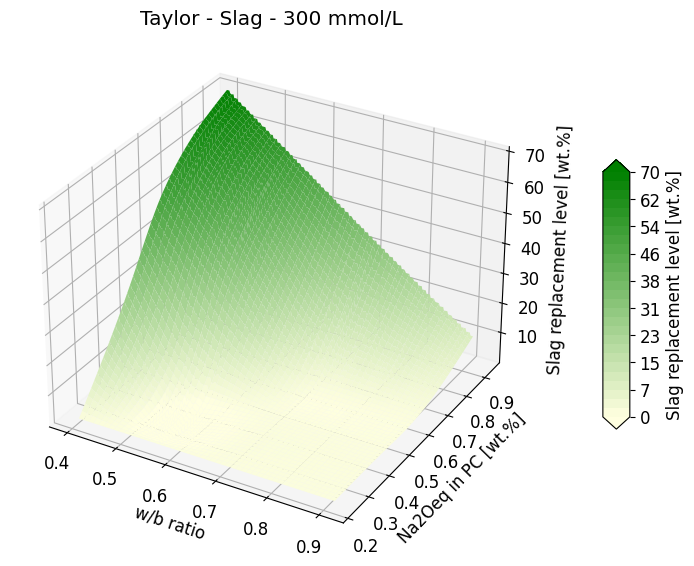

In [ ]:
import math
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import griddata


import math

# Define SCM parameters
scm_parameters = {
    'FA': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0.04,
        'total_k_content_water_soluble': 0.03,
        'fraction_of_glass': 0.8,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.81,
        'm_tot_SCM_K': 2.74
    },
    'MK': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.05,
        'm_tot_SCM_K': 1
    },
    'SF': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.32,
        'm_tot_SCM_K': 0.71
    },
    'slag': {
        'binding_factor_na': 0.08,
        'binding_factor_k': 0.04,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.29,
        'm_tot_SCM_K': 0.38
    }
}

# Define cement parameters
cement_parameters = {
    '0.93': {'m_tot_PC_Na': 0.42, 'm_tot_PC_K': 0.78},
    '0.62': {'m_tot_PC_Na': 0.28, 'm_tot_PC_K': 0.52},
    '0.47': {'m_tot_PC_Na': 0.21, 'm_tot_PC_K': 0.39},
    '0.23': {'m_tot_PC_Na': 0.105, 'm_tot_PC_K': 0.195}
}


def get_scm_parameters(scm_type):
    return scm_parameters.get(scm_type, {})

def get_cement_parameters(alkali_content):
    return cement_parameters.get(alkali_content, {})

def calculate_dor_scm(scm_type_for_dor, replacement_level, time):
    if scm_type_for_dor == 'FA_RILEM':
        dor_scm = replacement_level * (0.49993 - 0.0041 * replacement_level)
    elif scm_type_for_dor == 'FA_Taylor':
        fraction_of_glass = scm_parameters['FA']['fraction_of_glass']
        dor_scm = fraction_of_glass * replacement_level * (1 - math.exp(-(0.043 - (replacement_level * fraction_of_glass * 0.0005)) * time ** (0.585 - (replacement_level * fraction_of_glass * 0.0005))))
    elif scm_type_for_dor == 'SF':
        dor_scm = replacement_level
    elif scm_type_for_dor == 'slag':
        dor_scm = replacement_level * 0.7
    elif scm_type_for_dor == 'MK':
        if replacement_level <= 5:
            dor_scm = replacement_level
        elif replacement_level <= 35:
            dor_scm = replacement_level * (100 - ((replacement_level - 5) * 60 / 30)) / 100
        else:
            dor_scm = replacement_level * 40 / 100
    else:
        dor_scm = 0  # Default value if scm_type does not match

    # print(f"Degree of Reaction (DoR) for SCM {scm_type_for_dor}: {dor_scm}")
    return dor_scm

def calculate_na_k_concentration(replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor):
    scm_params = get_scm_parameters(scm_type_for_parameters)
    cement_params = get_cement_parameters(alkali_content)

    binding_factor_na = scm_params['binding_factor_na']
    binding_factor_k = scm_params['binding_factor_k']
    total_na_content_water_soluble = scm_params['total_na_content_water_soluble']
    total_k_content_water_soluble = scm_params['total_k_content_water_soluble']
    fraction_of_glass = scm_params['fraction_of_glass']
    g_bound_water_per_g_reacted_scm = scm_params['g_bound_water_per_g_reacted_scm']
    m_tot_SCM_Na = scm_params['m_tot_SCM_Na']
    m_tot_SCM_K = scm_params['m_tot_SCM_K']

    m_tot_PC_Na = cement_params['m_tot_PC_Na']
    m_tot_PC_K = cement_params['m_tot_PC_K']

    dor_scm = calculate_dor_scm(scm_type_for_dor, replacement_level, time)

    na_mass = 23.0  # [g/mol]
    k_mass = 39.1   # [g/mol]
    na2o_mass = 62.0  # [g/mol]
    k2o_mass = 94.2   # [g/mol]

    # Calculate F functions
    F_C4AF = 1 - math.exp(-(0.55 + (0.012 * replacement_level)) * (time - 0.9) ** 0.26)
    F_C3A = 1 - math.exp(-(0.77 + (0.008 * replacement_level)) * (time - 0.9) ** 0.28)
    F_C2S = 1 - math.exp(-(0.12 - (0.0007 * replacement_level)) * time ** (0.46 - (0.002 * replacement_level)))
    F_C3S = 1 - math.exp(-(0.7 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)

    # print(f"F_C4AF: {F_C4AF}, F_C3A: {F_C3A}, F_C2S: {F_C2S}, F_C3S: {F_C3S}")

    # F_CRP function
    F_CRP = ((100 - replacement_level) / 100) * replacement_level ** 0.09 * (1 - math.exp(-(0.56 - (0.0043 * replacement_level)) * (time - 0.9) ** 0.25))
    # print(f"F_CRP: {F_CRP}")

    # Fractions for Alite, Belite, Aluminate, Ferrite
    na2o_fractions = {'Alite': 0.44, 'Belite': 0.17, 'Aluminate': 0.36, 'Ferrite': 0.03}
    k2o_fractions = {'Alite': 0.29, 'Belite': 0.41, 'Aluminate': 0.27, 'Ferrite': 0.03}

    # Calculate m_r_Na from PC
    total_na_content_water_soluble_PC = 35

    m_r_na_from_pc = (
        (m_tot_PC_Na * total_na_content_water_soluble_PC / 100) +
        (F_C3S * na2o_fractions['Alite'] + F_C2S * na2o_fractions['Belite'] + F_C3A * na2o_fractions['Aluminate'] + F_C4AF * na2o_fractions['Ferrite']) *
        (1 - total_na_content_water_soluble_PC / 100) * m_tot_PC_Na
    ) * ((100 - replacement_level) / 100) * 2 / na2o_mass
    # print(f"m_r_na_from_pc: {m_r_na_from_pc}")

    # Calculate m_r_Na from SCM
    m_r_na_from_scm = (
        (total_na_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_Na - total_na_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / na2o_mass
    # print(f"m_r_na_from_scm: {m_r_na_from_scm}")


    # Calculate V(t) pore solution
    V_b_t = 31.6 * ((100 - replacement_level) / 100) * (1 - math.exp(-(0.69 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)) + g_bound_water_per_g_reacted_scm * dor_scm
    V_t_pore_solution = (w_b_ratio * 100) - V_b_t
    # print(f"V_b_t: {V_b_t}, V_t_pore_solution: {V_t_pore_solution}")

    # Calculate Na concentration
    b_pc_na = 0.031
    na_concentration = ((m_r_na_from_pc + m_r_na_from_scm) * 1000 / (V_t_pore_solution +
     (b_pc_na * 1000 * F_CRP) +binding_factor_na * 10 * dor_scm)) * 1000
    # print(f"na_concentration: {na_concentration}")



    # Calculate K concentration
    total_k_content_water_soluble_PC = 70

    m_r_k_from_pc = (
        (m_tot_PC_K * total_k_content_water_soluble_PC/ 100) +
        (F_C3S * k2o_fractions['Alite'] + F_C2S * k2o_fractions['Belite'] + F_C3A * k2o_fractions['Aluminate'] + F_C4AF * k2o_fractions['Ferrite']) *
        (1 - total_k_content_water_soluble_PC / 100) * m_tot_PC_K
    ) * ((100 - replacement_level) / 100) * 2 / k2o_mass
    # print(f"m_r_k_from_pc: {m_r_k_from_pc}")


    m_r_k_from_scm = (
        (total_k_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_K - total_k_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / k2o_mass
    # print(f"m_r_k_from_scm: {m_r_k_from_scm}")

    b_pc_k = 0.02

    k_concentration = ((m_r_k_from_pc + m_r_k_from_scm) * 1000 / (V_t_pore_solution + (b_pc_k * 1000 * F_CRP)
    + binding_factor_k * 10 * dor_scm)) * 1000

    # Calculate total Na+K concentration
    na_k_concentration = na_concentration + k_concentration

    return na_k_concentration, na_concentration, k_concentration

# Constants
scm_type_for_parameters = 'slag'  # SCM type for selecting parameters
scm_type_for_dor = 'slag'  # SCM type for calculating DoR
time = 180  # Constant time value

# Define the ranges for the parameters
replacement_levels = np.arange(1, 100)  # Replacement levels from 1 to 40
alkali_contents = ['0.23', '0.47', '0.62', '0.93']  # Different alkali content values
w_b_ratios = np.arange(0.4, 0.91, 0.001)  # w/b ratios from 0.4 to 0.9

# Function to calculate the concentrations for 300 mmol/L
def calculate_replacement_levels_for_concentration(target_concentration, replacement_levels, w_b_ratios, alkali_contents):
    results = []
    for alkali_content in alkali_contents:
        for w_b_ratio in w_b_ratios:
            for replacement_level in replacement_levels:
                na_k_concentration, na_concentration, k_concentration = calculate_na_k_concentration(
                    replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor
                )
                if na_k_concentration <= target_concentration:
                    results.append((w_b_ratio, alkali_content, replacement_level))
                    break
    return results

# Target concentration
target_concentration = 300  # mmol/L

# Calculate the replacement levels
replacement_data = calculate_replacement_levels_for_concentration(target_concentration, replacement_levels, w_b_ratios, alkali_contents)

# Convert to DataFrame for easier plotting
df_replacement = pd.DataFrame(replacement_data, columns=['w/b Ratio', 'Alkali Content', 'Replacement Level'])

# Ensure Alkali Content is treated as float
df_replacement['Alkali Content'] = df_replacement['Alkali Content'].astype(float)

# Create a dense meshgrid for smoother interpolation
W_dense, A_dense = np.meshgrid(
    np.linspace(df_replacement['w/b Ratio'].min(), df_replacement['w/b Ratio'].max(), 300),
    np.linspace(df_replacement['Alkali Content'].min(), df_replacement['Alkali Content'].max(), 300)
)

# Interpolate the replacement levels on the dense grid
points = df_replacement[['w/b Ratio', 'Alkali Content']].values
values = df_replacement['Replacement Level'].values
Z_dense = griddata(points, values, (W_dense, A_dense), method='cubic', fill_value=0)

# Create a custom colormap with a smooth transition from light yellow to green
cmap = LinearSegmentedColormap.from_list('yellow_green', ['#FFFFE0', 'green'], N=800)

# Plotting the surface
fig = plt.figure(figsize=(9, 7))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W_dense, A_dense, Z_dense, cmap=cmap, edgecolor='none', vmin=0, vmax=70)

# Add color bar which maps values to colors
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10, pad=0.1, label='Slag replacement level [wt.%]', extend='both', boundaries=np.linspace(0, 70, 28), format='%d')

ax.set_xlabel('w/b ratio')
ax.set_ylabel('Na2Oeq in PC [wt.%]')
ax.set_zlabel('Slag replacement level [wt.%]')
ax.set_zlim(1, 70)
ax.set_title('Taylor - Slag - 300 mmol/L')

plt.show()


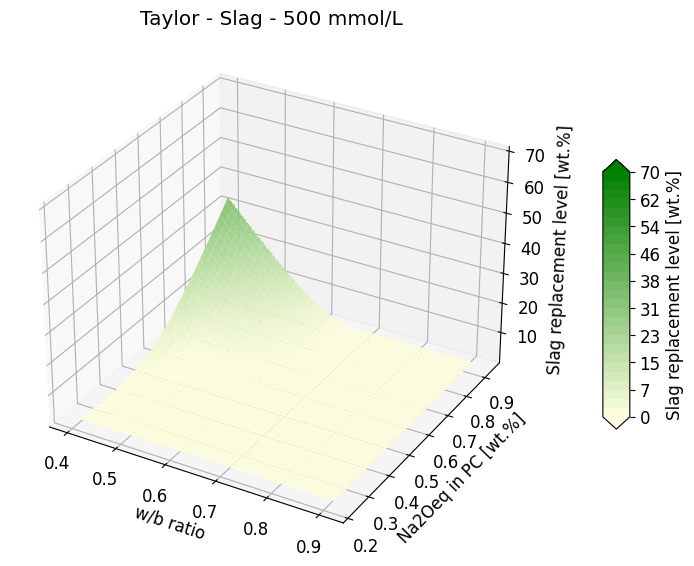

In [ ]:
import math
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import griddata


import math

# Define SCM parameters
scm_parameters = {
    'FA': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0.04,
        'total_k_content_water_soluble': 0.03,
        'fraction_of_glass': 0.8,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.81,
        'm_tot_SCM_K': 2.74
    },
    'MK': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.05,
        'm_tot_SCM_K': 1
    },
    'SF': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.32,
        'm_tot_SCM_K': 0.71
    },
    'slag': {
        'binding_factor_na': 0.08,
        'binding_factor_k': 0.04,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.29,
        'm_tot_SCM_K': 0.38
    }
}

# Define cement parameters
cement_parameters = {
    '0.93': {'m_tot_PC_Na': 0.42, 'm_tot_PC_K': 0.78},
    '0.62': {'m_tot_PC_Na': 0.28, 'm_tot_PC_K': 0.52},
    '0.47': {'m_tot_PC_Na': 0.21, 'm_tot_PC_K': 0.39},
    '0.23': {'m_tot_PC_Na': 0.105, 'm_tot_PC_K': 0.195}
}


def get_scm_parameters(scm_type):
    return scm_parameters.get(scm_type, {})

def get_cement_parameters(alkali_content):
    return cement_parameters.get(alkali_content, {})

def calculate_dor_scm(scm_type_for_dor, replacement_level, time):
    if scm_type_for_dor == 'FA_RILEM':
        dor_scm = replacement_level * (0.49993 - 0.0041 * replacement_level)
    elif scm_type_for_dor == 'FA_Taylor':
        fraction_of_glass = scm_parameters['FA']['fraction_of_glass']
        dor_scm = fraction_of_glass * replacement_level * (1 - math.exp(-(0.043 - (replacement_level * fraction_of_glass * 0.0005)) * time ** (0.585 - (replacement_level * fraction_of_glass * 0.0005))))
    elif scm_type_for_dor == 'SF':
        dor_scm = replacement_level
    elif scm_type_for_dor == 'slag':
        dor_scm = replacement_level * 0.7
    elif scm_type_for_dor == 'MK':
        if replacement_level <= 5:
            dor_scm = replacement_level
        elif replacement_level <= 35:
            dor_scm = replacement_level * (100 - ((replacement_level - 5) * 60 / 30)) / 100
        else:
            dor_scm = replacement_level * 40 / 100
    else:
        dor_scm = 0  # Default value if scm_type does not match

    # print(f"Degree of Reaction (DoR) for SCM {scm_type_for_dor}: {dor_scm}")
    return dor_scm

def calculate_na_k_concentration(replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor):
    scm_params = get_scm_parameters(scm_type_for_parameters)
    cement_params = get_cement_parameters(alkali_content)

    binding_factor_na = scm_params['binding_factor_na']
    binding_factor_k = scm_params['binding_factor_k']
    total_na_content_water_soluble = scm_params['total_na_content_water_soluble']
    total_k_content_water_soluble = scm_params['total_k_content_water_soluble']
    fraction_of_glass = scm_params['fraction_of_glass']
    g_bound_water_per_g_reacted_scm = scm_params['g_bound_water_per_g_reacted_scm']
    m_tot_SCM_Na = scm_params['m_tot_SCM_Na']
    m_tot_SCM_K = scm_params['m_tot_SCM_K']

    m_tot_PC_Na = cement_params['m_tot_PC_Na']
    m_tot_PC_K = cement_params['m_tot_PC_K']

    dor_scm = calculate_dor_scm(scm_type_for_dor, replacement_level, time)

    na_mass = 23.0  # [g/mol]
    k_mass = 39.1   # [g/mol]
    na2o_mass = 62.0  # [g/mol]
    k2o_mass = 94.2   # [g/mol]

    # Calculate F functions
    F_C4AF = 1 - math.exp(-(0.55 + (0.012 * replacement_level)) * (time - 0.9) ** 0.26)
    F_C3A = 1 - math.exp(-(0.77 + (0.008 * replacement_level)) * (time - 0.9) ** 0.28)
    F_C2S = 1 - math.exp(-(0.12 - (0.0007 * replacement_level)) * time ** (0.46 - (0.002 * replacement_level)))
    F_C3S = 1 - math.exp(-(0.7 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)

    # print(f"F_C4AF: {F_C4AF}, F_C3A: {F_C3A}, F_C2S: {F_C2S}, F_C3S: {F_C3S}")

    # F_CRP function
    F_CRP = ((100 - replacement_level) / 100) * replacement_level ** 0.09 * (1 - math.exp(-(0.56 - (0.0043 * replacement_level)) * (time - 0.9) ** 0.25))
    # print(f"F_CRP: {F_CRP}")

    # Fractions for Alite, Belite, Aluminate, Ferrite
    na2o_fractions = {'Alite': 0.44, 'Belite': 0.17, 'Aluminate': 0.36, 'Ferrite': 0.03}
    k2o_fractions = {'Alite': 0.29, 'Belite': 0.41, 'Aluminate': 0.27, 'Ferrite': 0.03}

    # Calculate m_r_Na from PC
    total_na_content_water_soluble_PC = 35

    m_r_na_from_pc = (
        (m_tot_PC_Na * total_na_content_water_soluble_PC / 100) +
        (F_C3S * na2o_fractions['Alite'] + F_C2S * na2o_fractions['Belite'] + F_C3A * na2o_fractions['Aluminate'] + F_C4AF * na2o_fractions['Ferrite']) *
        (1 - total_na_content_water_soluble_PC / 100) * m_tot_PC_Na
    ) * ((100 - replacement_level) / 100) * 2 / na2o_mass
    # print(f"m_r_na_from_pc: {m_r_na_from_pc}")

    # Calculate m_r_Na from SCM
    m_r_na_from_scm = (
        (total_na_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_Na - total_na_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / na2o_mass
    # print(f"m_r_na_from_scm: {m_r_na_from_scm}")


    # Calculate V(t) pore solution
    V_b_t = 31.6 * ((100 - replacement_level) / 100) * (1 - math.exp(-(0.69 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)) + g_bound_water_per_g_reacted_scm * dor_scm
    V_t_pore_solution = (w_b_ratio * 100) - V_b_t
    # print(f"V_b_t: {V_b_t}, V_t_pore_solution: {V_t_pore_solution}")

    # Calculate Na concentration
    b_pc_na = 0.031
    na_concentration = ((m_r_na_from_pc + m_r_na_from_scm) * 1000 / (V_t_pore_solution +
     (b_pc_na * 1000 * F_CRP) +binding_factor_na * 10 * dor_scm)) * 1000
    # print(f"na_concentration: {na_concentration}")



    # Calculate K concentration
    total_k_content_water_soluble_PC = 70

    m_r_k_from_pc = (
        (m_tot_PC_K * total_k_content_water_soluble_PC/ 100) +
        (F_C3S * k2o_fractions['Alite'] + F_C2S * k2o_fractions['Belite'] + F_C3A * k2o_fractions['Aluminate'] + F_C4AF * k2o_fractions['Ferrite']) *
        (1 - total_k_content_water_soluble_PC / 100) * m_tot_PC_K
    ) * ((100 - replacement_level) / 100) * 2 / k2o_mass
    # print(f"m_r_k_from_pc: {m_r_k_from_pc}")


    m_r_k_from_scm = (
        (total_k_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_K - total_k_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / k2o_mass
    # print(f"m_r_k_from_scm: {m_r_k_from_scm}")

    b_pc_k = 0.02

    k_concentration = ((m_r_k_from_pc + m_r_k_from_scm) * 1000 / (V_t_pore_solution + (b_pc_k * 1000 * F_CRP)
    + binding_factor_k * 10 * dor_scm)) * 1000

    # Calculate total Na+K concentration
    na_k_concentration = na_concentration + k_concentration

    return na_k_concentration, na_concentration, k_concentration

# Constants
scm_type_for_parameters = 'slag'  # SCM type for selecting parameters
scm_type_for_dor = 'slag'  # SCM type for calculating DoR
time = 180  # Constant time value

# Define the ranges for the parameters
replacement_levels = np.arange(1, 100)  # Replacement levels from 1 to 40
alkali_contents = ['0.23', '0.47', '0.62', '0.93']  # Different alkali content values
w_b_ratios = np.arange(0.4, 0.91, 0.001)  # w/b ratios from 0.4 to 0.9

# Function to calculate the concentrations for 300 mmol/L
def calculate_replacement_levels_for_concentration(target_concentration, replacement_levels, w_b_ratios, alkali_contents):
    results = []
    for alkali_content in alkali_contents:
        for w_b_ratio in w_b_ratios:
            for replacement_level in replacement_levels:
                na_k_concentration, na_concentration, k_concentration = calculate_na_k_concentration(
                    replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor
                )
                if na_k_concentration <= target_concentration:
                    results.append((w_b_ratio, alkali_content, replacement_level))
                    break
    return results

# Target concentration
target_concentration = 500  # mmol/L

# Calculate the replacement levels
replacement_data = calculate_replacement_levels_for_concentration(target_concentration, replacement_levels, w_b_ratios, alkali_contents)

# Convert to DataFrame for easier plotting
df_replacement = pd.DataFrame(replacement_data, columns=['w/b Ratio', 'Alkali Content', 'Replacement Level'])

# Ensure Alkali Content is treated as float
df_replacement['Alkali Content'] = df_replacement['Alkali Content'].astype(float)

# Create a dense meshgrid for smoother interpolation
W_dense, A_dense = np.meshgrid(
    np.linspace(df_replacement['w/b Ratio'].min(), df_replacement['w/b Ratio'].max(), 300),
    np.linspace(df_replacement['Alkali Content'].min(), df_replacement['Alkali Content'].max(), 300)
)

# Interpolate the replacement levels on the dense grid
points = df_replacement[['w/b Ratio', 'Alkali Content']].values
values = df_replacement['Replacement Level'].values
Z_dense = griddata(points, values, (W_dense, A_dense), method='cubic', fill_value=0)

# Create a custom colormap with a smooth transition from light yellow to green
cmap = LinearSegmentedColormap.from_list('yellow_green', ['#FFFFE0', 'green'], N=800)

# Plotting the surface
fig = plt.figure(figsize=(9, 7))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W_dense, A_dense, Z_dense, cmap=cmap, edgecolor='none', vmin=0, vmax=70)

# Add color bar which maps values to colors
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10, pad=0.1, label='Slag replacement level [wt.%]', extend='both', boundaries=np.linspace(0, 70, 28), format='%d')

ax.set_xlabel('w/b ratio')
ax.set_ylabel('Na2Oeq in PC [wt.%]')
ax.set_zlabel('Slag replacement level [wt.%]')
ax.set_zlim(1, 70)
ax.set_title('Taylor - Slag - 500 mmol/L')

plt.show()


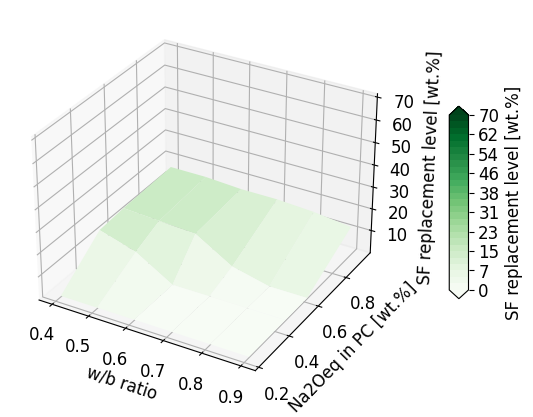

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata

# Load the spreadsheet
file_path = '/content/2024-06-05 Ana_wb for different alkali_SF.xlsx'
df = pd.read_excel(file_path, sheet_name='Summary', header=None)

# Extract the required values
w_b_ratios = df.iloc[2, 1:29].values
na2oeq_values = df.iloc[1, 1:29].values

# Extract GEMS data for 300 mmol/L
replacement_levels_slag_300_GEMS = df.iloc[105, 1:29].values.astype(float)  # Row 106 (0-based index 105)

# Remove NaN values
valid_indices_300 = ~np.isnan(replacement_levels_slag_300_GEMS)

w_b_ratios_300 = w_b_ratios[valid_indices_300].astype(float)
na2oeq_values_300 = na2oeq_values[valid_indices_300].astype(float)
replacement_levels_slag_300_GEMS = replacement_levels_slag_300_GEMS[valid_indices_300]

# Convert to DataFrame for easier plotting
df_replacement = pd.DataFrame({
    'w/b Ratio': w_b_ratios_300,
    'Alkali Content': na2oeq_values_300,
    'Replacement Level': replacement_levels_slag_300_GEMS
})

# Filter for w/b ratio >= 0.4
df_replacement = df_replacement[df_replacement['w/b Ratio'] >= 0.4]

# Drop rows with NaN values
df_replacement = df_replacement.dropna()

# Create meshgrid for plotting
W, A = np.meshgrid(df_replacement['w/b Ratio'].unique(), df_replacement['Alkali Content'].unique().astype(float))

# Interpolate the replacement levels
points = df_replacement[['w/b Ratio', 'Alkali Content']].values
values = df_replacement['Replacement Level'].values
Z = griddata(points, values, (W, A), method='linear', fill_value=0)

# Ensure all values are float
W = W.astype(float)
A = A.astype(float)
Z = Z.astype(float)

# Plotting the surface
fig = plt.figure(figsize=(7, 5))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W, A, Z, cmap='Greens', edgecolor='none', vmin=0, vmax=70)

# Add color bar which maps values to colors
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10, pad=0.1, label='SF replacement level [wt.%]', extend='both', boundaries=np.linspace(0, 70, 28), format='%d')

ax.set_xlabel('w/b ratio')
ax.set_ylabel('Na2Oeq in PC [wt.%]')
ax.set_zlabel('SF replacement level [wt.%]')
ax.set_zlim(1, 70)
# ax.set_title('GEMS Model Replacement Levels for Na+K Concentration of 300 mmol/L')

plt.show()


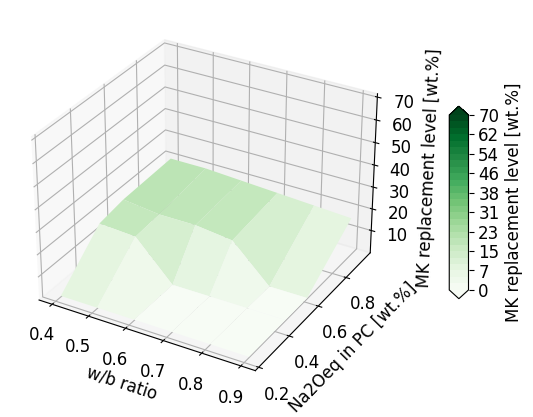

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata

# Load the spreadsheet
file_path = '/content/2024-06-05 Ana_wb for different alkali_MK.xlsx'
df = pd.read_excel(file_path, sheet_name='Summary', header=None)

# Extract the required values
w_b_ratios = df.iloc[2, 1:29].values
na2oeq_values = df.iloc[1, 1:29].values

# Extract GEMS data for 300 mmol/L
replacement_levels_slag_300_GEMS = df.iloc[105, 1:29].values.astype(float)  # Row 106 (0-based index 105)

# Remove NaN values
valid_indices_300 = ~np.isnan(replacement_levels_slag_300_GEMS)

w_b_ratios_300 = w_b_ratios[valid_indices_300].astype(float)
na2oeq_values_300 = na2oeq_values[valid_indices_300].astype(float)
replacement_levels_slag_300_GEMS = replacement_levels_slag_300_GEMS[valid_indices_300]

# Convert to DataFrame for easier plotting
df_replacement = pd.DataFrame({
    'w/b Ratio': w_b_ratios_300,
    'Alkali Content': na2oeq_values_300,
    'Replacement Level': replacement_levels_slag_300_GEMS
})

# Filter for w/b ratio >= 0.4
df_replacement = df_replacement[df_replacement['w/b Ratio'] >= 0.4]

# Drop rows with NaN values
df_replacement = df_replacement.dropna()

# Create meshgrid for plotting
W, A = np.meshgrid(df_replacement['w/b Ratio'].unique(), df_replacement['Alkali Content'].unique().astype(float))

# Interpolate the replacement levels
points = df_replacement[['w/b Ratio', 'Alkali Content']].values
values = df_replacement['Replacement Level'].values
Z = griddata(points, values, (W, A), method='linear', fill_value=0)

# Ensure all values are float
W = W.astype(float)
A = A.astype(float)
Z = Z.astype(float)

# Plotting the surface
fig = plt.figure(figsize=(7, 5))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W, A, Z, cmap='Greens', edgecolor='none', vmin=0, vmax=70)

# Add color bar which maps values to colors
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10, pad=0.1, label='MK replacement level [wt.%]', extend='both', boundaries=np.linspace(0, 70, 28), format='%d')

ax.set_xlabel('w/b ratio')
ax.set_ylabel('Na2Oeq in PC [wt.%]')
ax.set_zlabel('MK replacement level [wt.%]')
ax.set_zlim(1, 70)
# ax.set_title('GEMS Model Replacement Levels for Na+K Concentration of 300 mmol/L')

plt.show()


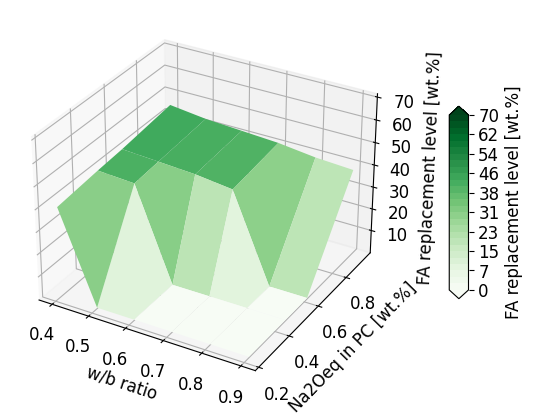

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata

# Load the spreadsheet
file_path = '/content/2024-06-05 Ana_wb for different alkali_FA.xlsx'
df = pd.read_excel(file_path, sheet_name='Summary', header=None)

# Extract the required values
w_b_ratios = df.iloc[2, 1:29].values
na2oeq_values = df.iloc[1, 1:29].values

# Extract GEMS data for 300 mmol/L
replacement_levels_slag_300_GEMS = df.iloc[105, 1:29].values.astype(float)  # Row 106 (0-based index 105)

# Remove NaN values
valid_indices_300 = ~np.isnan(replacement_levels_slag_300_GEMS)

w_b_ratios_300 = w_b_ratios[valid_indices_300].astype(float)
na2oeq_values_300 = na2oeq_values[valid_indices_300].astype(float)
replacement_levels_slag_300_GEMS = replacement_levels_slag_300_GEMS[valid_indices_300]

# Convert to DataFrame for easier plotting
df_replacement = pd.DataFrame({
    'w/b Ratio': w_b_ratios_300,
    'Alkali Content': na2oeq_values_300,
    'Replacement Level': replacement_levels_slag_300_GEMS
})

# Filter for w/b ratio >= 0.4
df_replacement = df_replacement[df_replacement['w/b Ratio'] >= 0.4]

# Drop rows with NaN values
df_replacement = df_replacement.dropna()

# Create meshgrid for plotting
W, A = np.meshgrid(df_replacement['w/b Ratio'].unique(), df_replacement['Alkali Content'].unique().astype(float))

# Interpolate the replacement levels
points = df_replacement[['w/b Ratio', 'Alkali Content']].values
values = df_replacement['Replacement Level'].values
Z = griddata(points, values, (W, A), method='linear', fill_value=0)

# Ensure all values are float
W = W.astype(float)
A = A.astype(float)
Z = Z.astype(float)

# Plotting the surface
fig = plt.figure(figsize=(7, 5))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W, A, Z, cmap='Greens', edgecolor='none', vmin=0, vmax=70)

# Add color bar which maps values to colors
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10, pad=0.1, label='FA replacement level [wt.%]', extend='both', boundaries=np.linspace(0, 70, 28), format='%d')

ax.set_xlabel('w/b ratio')
ax.set_ylabel('Na2Oeq in PC [wt.%]')
ax.set_zlabel('FA replacement level [wt.%]')
ax.set_zlim(1, 70)
# ax.set_title('GEMS Model Replacement Levels for Na+K Concentration of 300 mmol/L')

plt.show()


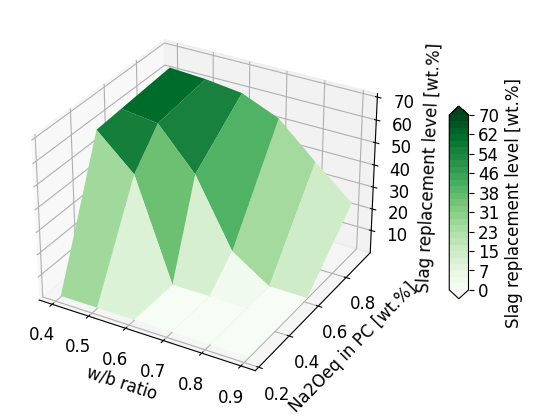

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata

# Load the spreadsheet
file_path = '/content/2024-06-05 Ana_wb for different alkali_slag.xlsx'
df = pd.read_excel(file_path, sheet_name='Summary', header=None)

# Extract the required values
w_b_ratios = df.iloc[2, 1:29].values
na2oeq_values = df.iloc[1, 1:29].values

# Extract GEMS data for 300 mmol/L
replacement_levels_slag_300_GEMS = df.iloc[105, 1:29].values.astype(float)  # Row 106 (0-based index 105)

# Remove NaN values
valid_indices_300 = ~np.isnan(replacement_levels_slag_300_GEMS)

w_b_ratios_300 = w_b_ratios[valid_indices_300].astype(float)
na2oeq_values_300 = na2oeq_values[valid_indices_300].astype(float)
replacement_levels_slag_300_GEMS = replacement_levels_slag_300_GEMS[valid_indices_300]

# Convert to DataFrame for easier plotting
df_replacement = pd.DataFrame({
    'w/b Ratio': w_b_ratios_300,
    'Alkali Content': na2oeq_values_300,
    'Replacement Level': replacement_levels_slag_300_GEMS
})

# Filter for w/b ratio >= 0.4
df_replacement = df_replacement[df_replacement['w/b Ratio'] >= 0.4]

# Drop rows with NaN values
df_replacement = df_replacement.dropna()

# Create meshgrid for plotting
W, A = np.meshgrid(df_replacement['w/b Ratio'].unique(), df_replacement['Alkali Content'].unique().astype(float))

# Interpolate the replacement levels
points = df_replacement[['w/b Ratio', 'Alkali Content']].values
values = df_replacement['Replacement Level'].values
Z = griddata(points, values, (W, A), method='linear', fill_value=0)

# Ensure all values are float
W = W.astype(float)
A = A.astype(float)
Z = Z.astype(float)

# Plotting the surface
fig = plt.figure(figsize=(7, 5))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W, A, Z, cmap='Greens', edgecolor='none', vmin=0, vmax=70)

# Add color bar which maps values to colors
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10, pad=0.1, label='Slag replacement level [wt.%]', extend='both', boundaries=np.linspace(0, 70, 28), format='%d')

ax.set_xlabel('w/b ratio')
ax.set_ylabel('Na2Oeq in PC [wt.%]')
ax.set_zlabel('Slag replacement level [wt.%]')
ax.set_zlim(1, 70)
# ax.set_title('GEMS Model Replacement Levels for Na+K Concentration of 300 mmol/L')

plt.show()


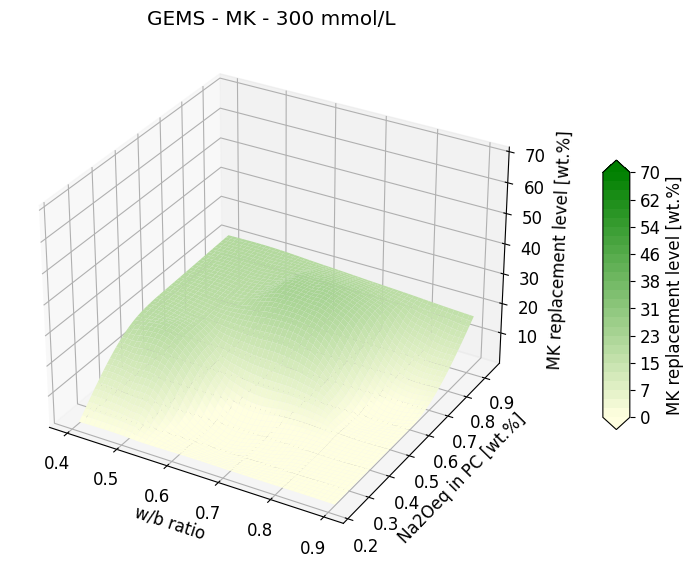

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata
from matplotlib.colors import LinearSegmentedColormap

# Load the spreadsheet
file_path = '/content/2024-06-05 Ana_wb for different alkali_MK.xlsx'
df = pd.read_excel(file_path, sheet_name='Summary', header=None)

# Extract the required values
w_b_ratios = df.iloc[2, 1:29].values
na2oeq_values = df.iloc[1, 1:29].values

# Extract GEMS data for 300 mmol/L
replacement_levels_slag_300_GEMS = df.iloc[105, 1:29].values.astype(float)  # Row 106 (0-based index 105)

# Remove NaN values
valid_indices_300 = ~np.isnan(replacement_levels_slag_300_GEMS)

w_b_ratios_300 = w_b_ratios[valid_indices_300].astype(float)
na2oeq_values_300 = na2oeq_values[valid_indices_300].astype(float)
replacement_levels_slag_300_GEMS = replacement_levels_slag_300_GEMS[valid_indices_300]

# Convert to DataFrame for easier plotting
df_replacement = pd.DataFrame({
    'w/b Ratio': w_b_ratios_300,
    'Alkali Content': na2oeq_values_300,
    'Replacement Level': replacement_levels_slag_300_GEMS
})

# Filter for w/b ratio >= 0.4
df_replacement = df_replacement[df_replacement['w/b Ratio'] >= 0.4]

# Drop rows with NaN values
df_replacement = df_replacement.dropna()

# Create a dense meshgrid for smoother interpolation
W_dense, A_dense = np.meshgrid(
    np.linspace(df_replacement['w/b Ratio'].min(), df_replacement['w/b Ratio'].max(), 300),
    np.linspace(df_replacement['Alkali Content'].min(), df_replacement['Alkali Content'].max(), 300)
)

# Interpolate the replacement levels on the dense grid
points = df_replacement[['w/b Ratio', 'Alkali Content']].values
values = df_replacement['Replacement Level'].values
Z_dense = griddata(points, values, (W_dense, A_dense), method='cubic', fill_value=0)

# Create a custom colormap with a smooth transition from yellow to green
cmap = LinearSegmentedColormap.from_list('purple_green', ['#FFFFE0', 'green'], N=800)

# Plotting the surface
fig = plt.figure(figsize=(9, 7))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W_dense, A_dense, Z_dense, cmap=cmap, edgecolor='none', vmin=0, vmax=70)

# Add color bar which maps values to colors
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10, pad=0.1, label='MK replacement level [wt.%]', extend='both', boundaries=np.linspace(0, 70, 28), format='%d')

ax.set_xlabel('w/b ratio')
ax.set_ylabel('Na2Oeq in PC [wt.%]')
ax.set_zlabel('MK replacement level [wt.%]')
ax.set_zlim(1, 70)
ax.set_title('GEMS - MK - 300 mmol/L')

plt.show()


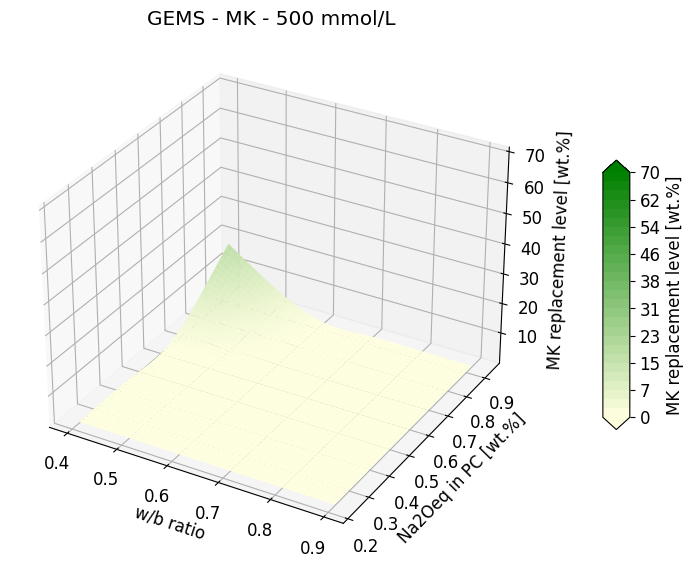

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata
from matplotlib.colors import LinearSegmentedColormap

# Load the spreadsheet
file_path = '/content/2024-06-05 Ana_wb for different alkali_MK.xlsx'
df = pd.read_excel(file_path, sheet_name='Summary', header=None)

# Extract the required values
w_b_ratios = df.iloc[2, 1:29].values
na2oeq_values = df.iloc[1, 1:29].values

# Extract GEMS data for 300 mmol/L
replacement_levels_slag_300_GEMS = df.iloc[106, 1:29].values.astype(float)  # Row 106 (0-based index 105)

# Remove NaN values
valid_indices_300 = ~np.isnan(replacement_levels_slag_300_GEMS)

w_b_ratios_300 = w_b_ratios[valid_indices_300].astype(float)
na2oeq_values_300 = na2oeq_values[valid_indices_300].astype(float)
replacement_levels_slag_300_GEMS = replacement_levels_slag_300_GEMS[valid_indices_300]

# Convert to DataFrame for easier plotting
df_replacement = pd.DataFrame({
    'w/b Ratio': w_b_ratios_300,
    'Alkali Content': na2oeq_values_300,
    'Replacement Level': replacement_levels_slag_300_GEMS
})

# Filter for w/b ratio >= 0.4
df_replacement = df_replacement[df_replacement['w/b Ratio'] >= 0.4]

# Drop rows with NaN values
df_replacement = df_replacement.dropna()

# Create a dense meshgrid for smoother interpolation
W_dense, A_dense = np.meshgrid(
    np.linspace(df_replacement['w/b Ratio'].min(), df_replacement['w/b Ratio'].max(), 300),
    np.linspace(df_replacement['Alkali Content'].min(), df_replacement['Alkali Content'].max(), 300)
)

# Interpolate the replacement levels on the dense grid
points = df_replacement[['w/b Ratio', 'Alkali Content']].values
values = df_replacement['Replacement Level'].values
Z_dense = griddata(points, values, (W_dense, A_dense), method='cubic', fill_value=0)

# Create a custom colormap with a smooth transition from yellow to green
cmap = LinearSegmentedColormap.from_list('purple_green', ['#FFFFE0', 'green'], N=800)

# Plotting the surface
fig = plt.figure(figsize=(9, 7))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W_dense, A_dense, Z_dense, cmap=cmap, edgecolor='none', vmin=0, vmax=70)

# Add color bar which maps values to colors
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10, pad=0.1, label='MK replacement level [wt.%]', extend='both', boundaries=np.linspace(0, 70, 28), format='%d')

ax.set_xlabel('w/b ratio')
ax.set_ylabel('Na2Oeq in PC [wt.%]')
ax.set_zlabel('MK replacement level [wt.%]')
ax.set_zlim(1, 70)
ax.set_title('GEMS - MK - 500 mmol/L')

plt.show()


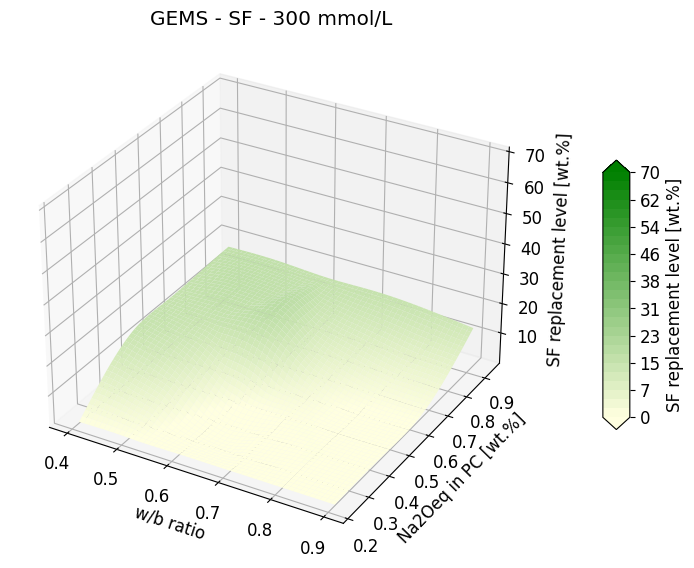

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata
from matplotlib.colors import LinearSegmentedColormap

# Load the spreadsheet
file_path = '/content/2024-06-05 Ana_wb for different alkali_SF.xlsx'
df = pd.read_excel(file_path, sheet_name='Summary', header=None)

# Extract the required values
w_b_ratios = df.iloc[2, 1:29].values
na2oeq_values = df.iloc[1, 1:29].values

# Extract GEMS data for 300 mmol/L
replacement_levels_slag_300_GEMS = df.iloc[105, 1:29].values.astype(float)  # Row 106 (0-based index 105)

# Remove NaN values
valid_indices_300 = ~np.isnan(replacement_levels_slag_300_GEMS)

w_b_ratios_300 = w_b_ratios[valid_indices_300].astype(float)
na2oeq_values_300 = na2oeq_values[valid_indices_300].astype(float)
replacement_levels_slag_300_GEMS = replacement_levels_slag_300_GEMS[valid_indices_300]

# Convert to DataFrame for easier plotting
df_replacement = pd.DataFrame({
    'w/b Ratio': w_b_ratios_300,
    'Alkali Content': na2oeq_values_300,
    'Replacement Level': replacement_levels_slag_300_GEMS
})

# Filter for w/b ratio >= 0.4
df_replacement = df_replacement[df_replacement['w/b Ratio'] >= 0.4]

# Drop rows with NaN values
df_replacement = df_replacement.dropna()

# Create a dense meshgrid for smoother interpolation
W_dense, A_dense = np.meshgrid(
    np.linspace(df_replacement['w/b Ratio'].min(), df_replacement['w/b Ratio'].max(), 300),
    np.linspace(df_replacement['Alkali Content'].min(), df_replacement['Alkali Content'].max(), 300)
)

# Interpolate the replacement levels on the dense grid
points = df_replacement[['w/b Ratio', 'Alkali Content']].values
values = df_replacement['Replacement Level'].values
Z_dense = griddata(points, values, (W_dense, A_dense), method='cubic', fill_value=0)

# Create a custom colormap with a smooth transition from yellow to green
cmap = LinearSegmentedColormap.from_list('purple_green', ['#FFFFE0', 'green'], N=800)

# Plotting the surface
fig = plt.figure(figsize=(9, 7))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W_dense, A_dense, Z_dense, cmap=cmap, edgecolor='none', vmin=0, vmax=70)

# Add color bar which maps values to colors
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10, pad=0.1, label='SF replacement level [wt.%]', extend='both', boundaries=np.linspace(0, 70, 28), format='%d')

ax.set_xlabel('w/b ratio')
ax.set_ylabel('Na2Oeq in PC [wt.%]')
ax.set_zlabel('SF replacement level [wt.%]')
ax.set_zlim(1, 70)
ax.set_title('GEMS - SF - 300 mmol/L')

plt.show()


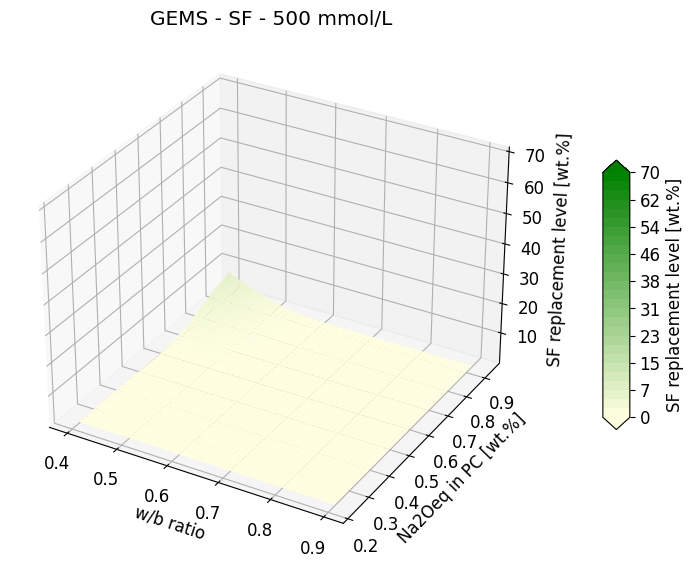

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata
from matplotlib.colors import LinearSegmentedColormap

# Load the spreadsheet
file_path = '/content/2024-06-05 Ana_wb for different alkali_SF.xlsx'
df = pd.read_excel(file_path, sheet_name='Summary', header=None)

# Extract the required values
w_b_ratios = df.iloc[2, 1:29].values
na2oeq_values = df.iloc[1, 1:29].values

# Extract GEMS data for 300 mmol/L
replacement_levels_slag_300_GEMS = df.iloc[106, 1:29].values.astype(float)  # Row 106 (0-based index 105)

# Remove NaN values
valid_indices_300 = ~np.isnan(replacement_levels_slag_300_GEMS)

w_b_ratios_300 = w_b_ratios[valid_indices_300].astype(float)
na2oeq_values_300 = na2oeq_values[valid_indices_300].astype(float)
replacement_levels_slag_300_GEMS = replacement_levels_slag_300_GEMS[valid_indices_300]

# Convert to DataFrame for easier plotting
df_replacement = pd.DataFrame({
    'w/b Ratio': w_b_ratios_300,
    'Alkali Content': na2oeq_values_300,
    'Replacement Level': replacement_levels_slag_300_GEMS
})

# Filter for w/b ratio >= 0.4
df_replacement = df_replacement[df_replacement['w/b Ratio'] >= 0.4]

# Drop rows with NaN values
df_replacement = df_replacement.dropna()

# Create a dense meshgrid for smoother interpolation
W_dense, A_dense = np.meshgrid(
    np.linspace(df_replacement['w/b Ratio'].min(), df_replacement['w/b Ratio'].max(), 300),
    np.linspace(df_replacement['Alkali Content'].min(), df_replacement['Alkali Content'].max(), 300)
)

# Interpolate the replacement levels on the dense grid
points = df_replacement[['w/b Ratio', 'Alkali Content']].values
values = df_replacement['Replacement Level'].values
Z_dense = griddata(points, values, (W_dense, A_dense), method='cubic', fill_value=0)

# Create a custom colormap with a smooth transition from yellow to green
cmap = LinearSegmentedColormap.from_list('purple_green', ['#FFFFE0', 'green'], N=800)

# Plotting the surface
fig = plt.figure(figsize=(9, 7))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W_dense, A_dense, Z_dense, cmap=cmap, edgecolor='none', vmin=0, vmax=70)

# Add color bar which maps values to colors
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10, pad=0.1, label='SF replacement level [wt.%]', extend='both', boundaries=np.linspace(0, 70, 28), format='%d')

ax.set_xlabel('w/b ratio')
ax.set_ylabel('Na2Oeq in PC [wt.%]')
ax.set_zlabel('SF replacement level [wt.%]')
ax.set_zlim(1, 70)
ax.set_title('GEMS - SF - 500 mmol/L')

plt.show()


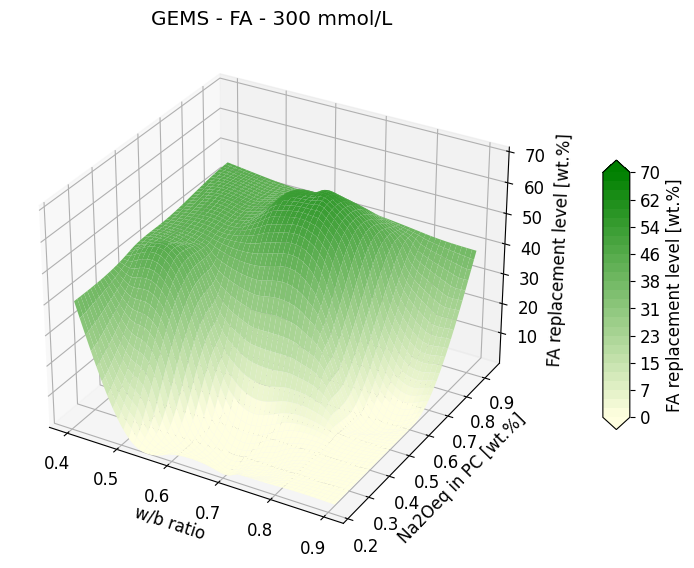

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata
from matplotlib.colors import LinearSegmentedColormap

# Load the spreadsheet
file_path = '/content/2024-06-05 Ana_wb for different alkali_FA.xlsx'
df = pd.read_excel(file_path, sheet_name='Summary', header=None)

# Extract the required values
w_b_ratios = df.iloc[2, 1:29].values
na2oeq_values = df.iloc[1, 1:29].values

# Extract GEMS data for 300 mmol/L
replacement_levels_slag_300_GEMS = df.iloc[105, 1:29].values.astype(float)  # Row 106 (0-based index 105)

# Remove NaN values
valid_indices_300 = ~np.isnan(replacement_levels_slag_300_GEMS)

w_b_ratios_300 = w_b_ratios[valid_indices_300].astype(float)
na2oeq_values_300 = na2oeq_values[valid_indices_300].astype(float)
replacement_levels_slag_300_GEMS = replacement_levels_slag_300_GEMS[valid_indices_300]

# Convert to DataFrame for easier plotting
df_replacement = pd.DataFrame({
    'w/b Ratio': w_b_ratios_300,
    'Alkali Content': na2oeq_values_300,
    'Replacement Level': replacement_levels_slag_300_GEMS
})

# Filter for w/b ratio >= 0.4
df_replacement = df_replacement[df_replacement['w/b Ratio'] >= 0.4]

# Drop rows with NaN values
df_replacement = df_replacement.dropna()

# Create a dense meshgrid for smoother interpolation
W_dense, A_dense = np.meshgrid(
    np.linspace(df_replacement['w/b Ratio'].min(), df_replacement['w/b Ratio'].max(), 300),
    np.linspace(df_replacement['Alkali Content'].min(), df_replacement['Alkali Content'].max(), 300)
)

# Interpolate the replacement levels on the dense grid
points = df_replacement[['w/b Ratio', 'Alkali Content']].values
values = df_replacement['Replacement Level'].values
Z_dense = griddata(points, values, (W_dense, A_dense), method='cubic', fill_value=0)

# Create a custom colormap with a smooth transition from yellow to green
cmap = LinearSegmentedColormap.from_list('purple_green', ['#FFFFE0', 'green'], N=800)

# Plotting the surface
fig = plt.figure(figsize=(9, 7))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W_dense, A_dense, Z_dense, cmap=cmap, edgecolor='none', vmin=0, vmax=70)

# Add color bar which maps values to colors
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10, pad=0.1, label='FA replacement level [wt.%]', extend='both', boundaries=np.linspace(0, 70, 28), format='%d')

ax.set_xlabel('w/b ratio')
ax.set_ylabel('Na2Oeq in PC [wt.%]')
ax.set_zlabel('FA replacement level [wt.%]')
ax.set_zlim(1, 70)
ax.set_title('GEMS - FA - 300 mmol/L')

plt.show()


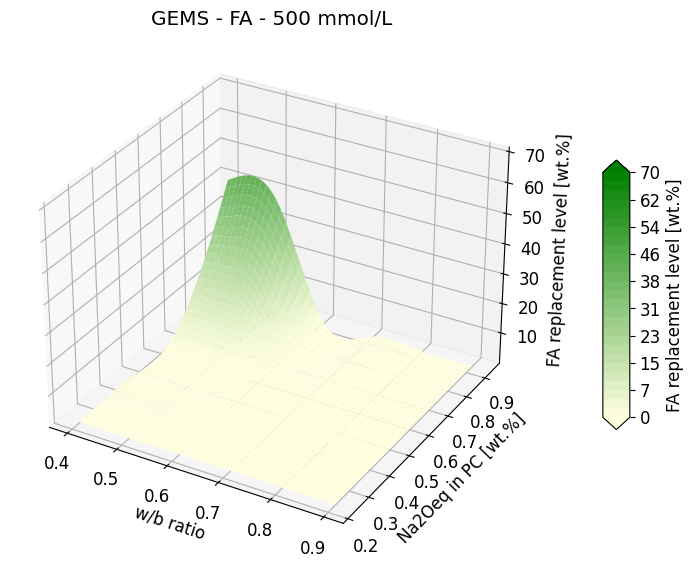

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata
from matplotlib.colors import LinearSegmentedColormap

# Load the spreadsheet
file_path = '/content/2024-06-05 Ana_wb for different alkali_FA.xlsx'
df = pd.read_excel(file_path, sheet_name='Summary', header=None)

# Extract the required values
w_b_ratios = df.iloc[2, 1:29].values
na2oeq_values = df.iloc[1, 1:29].values

# Extract GEMS data for 300 mmol/L
replacement_levels_slag_300_GEMS = df.iloc[106, 1:29].values.astype(float)  # Row 106 (0-based index 105)

# Remove NaN values
valid_indices_300 = ~np.isnan(replacement_levels_slag_300_GEMS)

w_b_ratios_300 = w_b_ratios[valid_indices_300].astype(float)
na2oeq_values_300 = na2oeq_values[valid_indices_300].astype(float)
replacement_levels_slag_300_GEMS = replacement_levels_slag_300_GEMS[valid_indices_300]

# Convert to DataFrame for easier plotting
df_replacement = pd.DataFrame({
    'w/b Ratio': w_b_ratios_300,
    'Alkali Content': na2oeq_values_300,
    'Replacement Level': replacement_levels_slag_300_GEMS
})

# Filter for w/b ratio >= 0.4
df_replacement = df_replacement[df_replacement['w/b Ratio'] >= 0.4]

# Drop rows with NaN values
df_replacement = df_replacement.dropna()

# Create a dense meshgrid for smoother interpolation
W_dense, A_dense = np.meshgrid(
    np.linspace(df_replacement['w/b Ratio'].min(), df_replacement['w/b Ratio'].max(), 300),
    np.linspace(df_replacement['Alkali Content'].min(), df_replacement['Alkali Content'].max(), 300)
)

# Interpolate the replacement levels on the dense grid
points = df_replacement[['w/b Ratio', 'Alkali Content']].values
values = df_replacement['Replacement Level'].values
Z_dense = griddata(points, values, (W_dense, A_dense), method='cubic', fill_value=0)

# Create a custom colormap with a smooth transition from yellow to green
cmap = LinearSegmentedColormap.from_list('purple_green', ['#FFFFE0', 'green'], N=800)

# Plotting the surface
fig = plt.figure(figsize=(9, 7))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W_dense, A_dense, Z_dense, cmap=cmap, edgecolor='none', vmin=0, vmax=70)

# Add color bar which maps values to colors
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10, pad=0.1, label='FA replacement level [wt.%]', extend='both', boundaries=np.linspace(0, 70, 28), format='%d')

ax.set_xlabel('w/b ratio')
ax.set_ylabel('Na2Oeq in PC [wt.%]')
ax.set_zlabel('FA replacement level [wt.%]')
ax.set_zlim(1, 70)
ax.set_title('GEMS - FA - 500 mmol/L')

plt.show()


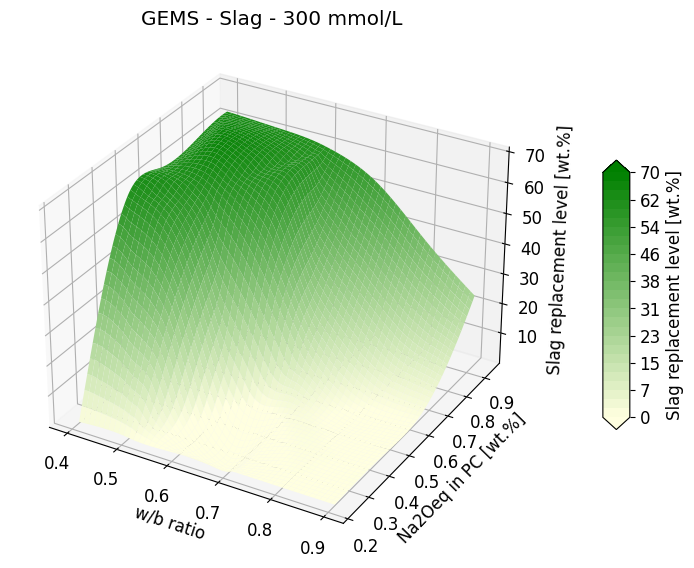

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata
from matplotlib.colors import LinearSegmentedColormap

# Load the spreadsheet
file_path = '/content/2024-06-05 Ana_wb for different alkali_slag.xlsx'
df = pd.read_excel(file_path, sheet_name='Summary', header=None)

# Extract the required values
w_b_ratios = df.iloc[2, 1:29].values
na2oeq_values = df.iloc[1, 1:29].values

# Extract GEMS data for 300 mmol/L
replacement_levels_slag_300_GEMS = df.iloc[105, 1:29].values.astype(float)  # Row 106 (0-based index 105)

# Remove NaN values
valid_indices_300 = ~np.isnan(replacement_levels_slag_300_GEMS)

w_b_ratios_300 = w_b_ratios[valid_indices_300].astype(float)
na2oeq_values_300 = na2oeq_values[valid_indices_300].astype(float)
replacement_levels_slag_300_GEMS = replacement_levels_slag_300_GEMS[valid_indices_300]

# Convert to DataFrame for easier plotting
df_replacement = pd.DataFrame({
    'w/b Ratio': w_b_ratios_300,
    'Alkali Content': na2oeq_values_300,
    'Replacement Level': replacement_levels_slag_300_GEMS
})

# Filter for w/b ratio >= 0.4
df_replacement = df_replacement[df_replacement['w/b Ratio'] >= 0.4]

# Drop rows with NaN values
df_replacement = df_replacement.dropna()

# Create a dense meshgrid for smoother interpolation
W_dense, A_dense = np.meshgrid(
    np.linspace(df_replacement['w/b Ratio'].min(), df_replacement['w/b Ratio'].max(), 300),
    np.linspace(df_replacement['Alkali Content'].min(), df_replacement['Alkali Content'].max(), 300)
)

# Interpolate the replacement levels on the dense grid
points = df_replacement[['w/b Ratio', 'Alkali Content']].values
values = df_replacement['Replacement Level'].values
Z_dense = griddata(points, values, (W_dense, A_dense), method='cubic', fill_value=0)

# Create a custom colormap with a smooth transition from yellow to green
cmap = LinearSegmentedColormap.from_list('purple_green', ['#FFFFE0', 'green'], N=800)

# Plotting the surface
fig = plt.figure(figsize=(9, 7))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W_dense, A_dense, Z_dense, cmap=cmap, edgecolor='none', vmin=0, vmax=70)

# Add color bar which maps values to colors
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10, pad=0.1, label='Slag replacement level [wt.%]', extend='both', boundaries=np.linspace(0, 70, 28), format='%d')

ax.set_xlabel('w/b ratio')
ax.set_ylabel('Na2Oeq in PC [wt.%]')
ax.set_zlabel('Slag replacement level [wt.%]')
ax.set_zlim(1, 70)
ax.set_title('GEMS - Slag - 300 mmol/L')

plt.show()


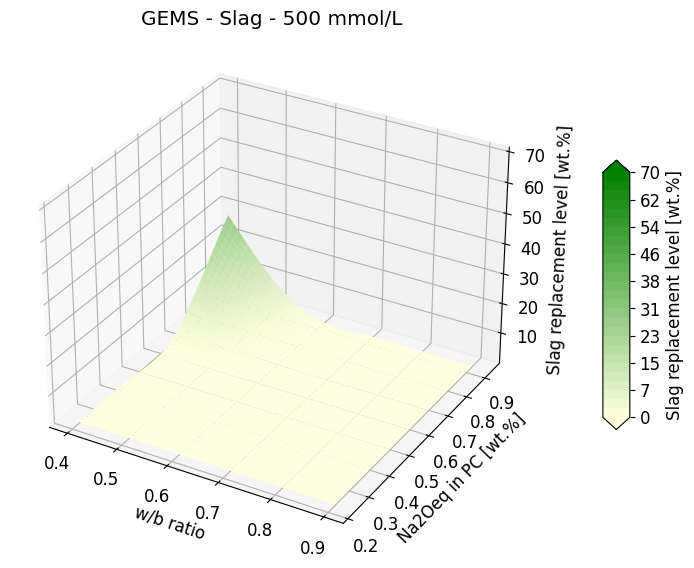

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata
from matplotlib.colors import LinearSegmentedColormap

# Load the spreadsheet
file_path = '/content/2024-06-05 Ana_wb for different alkali_slag.xlsx'
df = pd.read_excel(file_path, sheet_name='Summary', header=None)

# Extract the required values
w_b_ratios = df.iloc[2, 1:29].values
na2oeq_values = df.iloc[1, 1:29].values

# Extract GEMS data for 300 mmol/L
replacement_levels_slag_300_GEMS = df.iloc[106, 1:29].values.astype(float)  # Row 106 (0-based index 105)

# Remove NaN values
valid_indices_300 = ~np.isnan(replacement_levels_slag_300_GEMS)

w_b_ratios_300 = w_b_ratios[valid_indices_300].astype(float)
na2oeq_values_300 = na2oeq_values[valid_indices_300].astype(float)
replacement_levels_slag_300_GEMS = replacement_levels_slag_300_GEMS[valid_indices_300]

# Convert to DataFrame for easier plotting
df_replacement = pd.DataFrame({
    'w/b Ratio': w_b_ratios_300,
    'Alkali Content': na2oeq_values_300,
    'Replacement Level': replacement_levels_slag_300_GEMS
})

# Filter for w/b ratio >= 0.4
df_replacement = df_replacement[df_replacement['w/b Ratio'] >= 0.4]

# Drop rows with NaN values
df_replacement = df_replacement.dropna()

# Create a dense meshgrid for smoother interpolation
W_dense, A_dense = np.meshgrid(
    np.linspace(df_replacement['w/b Ratio'].min(), df_replacement['w/b Ratio'].max(), 300),
    np.linspace(df_replacement['Alkali Content'].min(), df_replacement['Alkali Content'].max(), 300)
)

# Interpolate the replacement levels on the dense grid
points = df_replacement[['w/b Ratio', 'Alkali Content']].values
values = df_replacement['Replacement Level'].values
Z_dense = griddata(points, values, (W_dense, A_dense), method='cubic', fill_value=0)

# Create a custom colormap with a smooth transition from yellow to green
cmap = LinearSegmentedColormap.from_list('purple_green', ['#FFFFE0', 'green'], N=800)

# Plotting the surface
fig = plt.figure(figsize=(9, 7))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W_dense, A_dense, Z_dense, cmap=cmap, edgecolor='none', vmin=0, vmax=70)

# Add color bar which maps values to colors
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10, pad=0.1, label='Slag replacement level [wt.%]', extend='both', boundaries=np.linspace(0, 70, 28), format='%d')

ax.set_xlabel('w/b ratio')
ax.set_ylabel('Na2Oeq in PC [wt.%]')
ax.set_zlabel('Slag replacement level [wt.%]')
ax.set_zlim(1, 70)
ax.set_title('GEMS - Slag - 500 mmol/L')

plt.show()


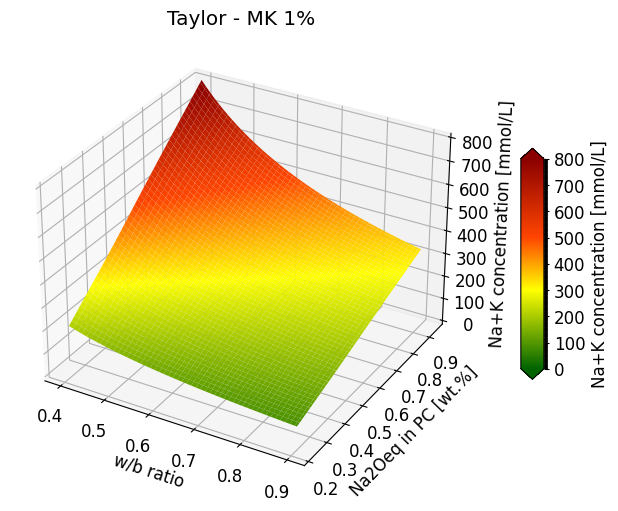

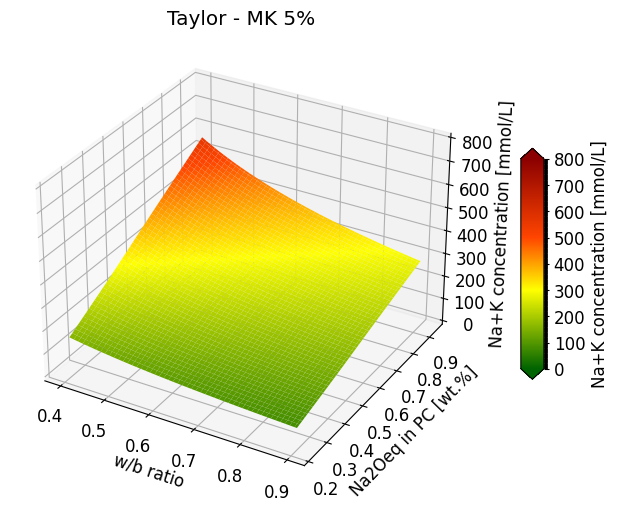

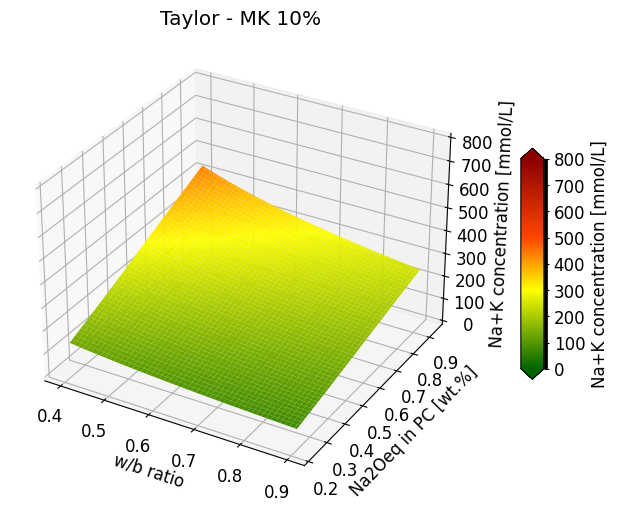

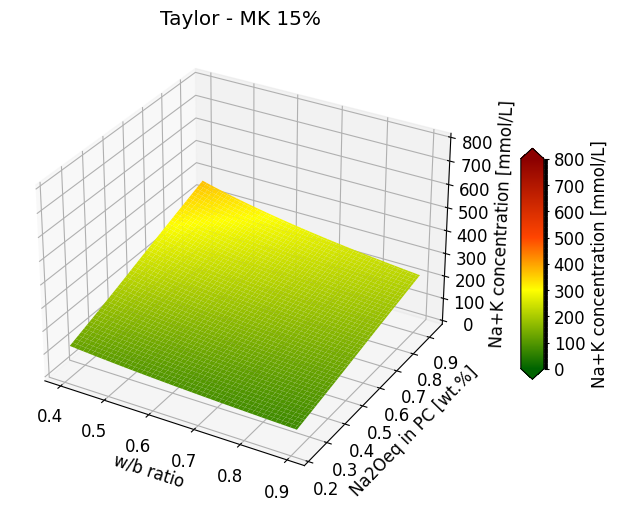

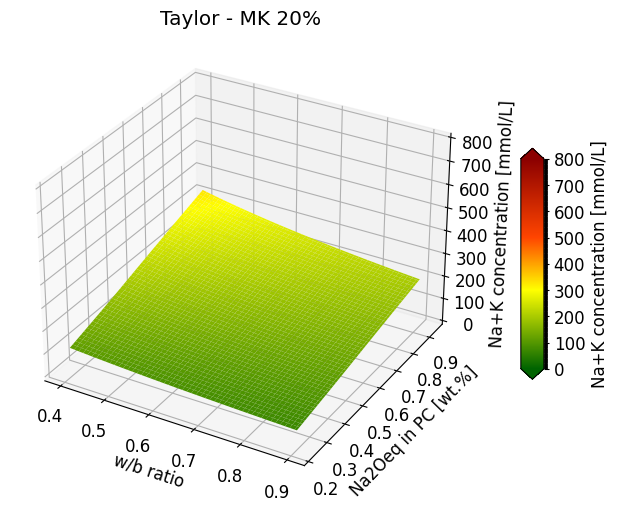

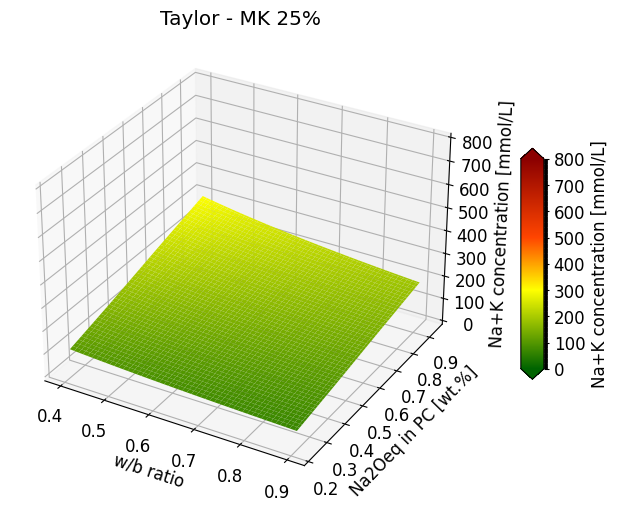

In [ ]:


# Define SCM parameters
scm_parameters = {
    'FA': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0.04,
        'total_k_content_water_soluble': 0.03,
        'fraction_of_glass': 0.8,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.81,
        'm_tot_SCM_K': 2.74
    },
    'MK': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.05,
        'm_tot_SCM_K': 1
    },
    'SF': {
        'binding_factor_na': 0.3,
        'binding_factor_k': 0.33,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.32,
        'm_tot_SCM_K': 0.71
    },
    'slag': {
        'binding_factor_na': 0.1,
        'binding_factor_k': 0.04,
        'total_na_content_water_soluble': 0,
        'total_k_content_water_soluble': 0,
        'fraction_of_glass': 1,
        'g_bound_water_per_g_reacted_scm': 0.17,
        'm_tot_SCM_Na': 0.29,
        'm_tot_SCM_K': 0.38
    }
}

# Define cement parameters
cement_parameters = {
    '0.93': {'m_tot_PC_Na': 0.42, 'm_tot_PC_K': 0.78},
    '0.62': {'m_tot_PC_Na': 0.28, 'm_tot_PC_K': 0.52},
    '0.47': {'m_tot_PC_Na': 0.21, 'm_tot_PC_K': 0.39},
    '0.23': {'m_tot_PC_Na': 0.105, 'm_tot_PC_K': 0.195}
}

def get_scm_parameters(scm_type):
    return scm_parameters.get(scm_type, {})

def get_cement_parameters(alkali_content):
    return cement_parameters.get(alkali_content, {})

def calculate_dor_scm(scm_type_for_dor, replacement_level, time):
    if scm_type_for_dor == 'FA_RILEM':
        dor_scm = replacement_level * (0.49993 - 0.0041 * replacement_level)
    elif scm_type_for_dor == 'FA_Taylor':
        fraction_of_glass = scm_parameters['FA']['fraction_of_glass']
        dor_scm = fraction_of_glass * replacement_level * (1 - math.exp(-(0.043 - (replacement_level * fraction_of_glass * 0.0005)) * time ** (0.585 - (replacement_level * fraction_of_glass * 0.0005))))
    elif scm_type_for_dor == 'SF':
        dor_scm = replacement_level
    elif scm_type_for_dor == 'slag':
        dor_scm = replacement_level * 0.7
    elif scm_type_for_dor == 'MK':
        if replacement_level <= 5:
            dor_scm = replacement_level
        elif replacement_level <= 35:
            dor_scm = replacement_level * (100 - ((replacement_level - 5) * 60 / 30)) / 100
        else:
            dor_scm = replacement_level * 40 / 100
    else:
        dor_scm = 0  # Default value if scm_type does not match

    return dor_scm

def calculate_na_k_concentration(replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor):
    scm_params = get_scm_parameters(scm_type_for_parameters)
    cement_params = get_cement_parameters(alkali_content)

    binding_factor_na = scm_params['binding_factor_na']
    binding_factor_k = scm_params['binding_factor_k']
    total_na_content_water_soluble = scm_params['total_na_content_water_soluble']
    total_k_content_water_soluble = scm_params['total_k_content_water_soluble']
    fraction_of_glass = scm_params['fraction_of_glass']
    g_bound_water_per_g_reacted_scm = scm_params['g_bound_water_per_g_reacted_scm']
    m_tot_SCM_Na = scm_params['m_tot_SCM_Na']
    m_tot_SCM_K = scm_params['m_tot_SCM_K']

    m_tot_PC_Na = cement_params['m_tot_PC_Na']
    m_tot_PC_K = cement_params['m_tot_PC_K']

    dor_scm = calculate_dor_scm(scm_type_for_dor, replacement_level, time)

    na_mass = 23.0  # [g/mol]
    k_mass = 39.1   # [g/mol]
    na2o_mass = 62.0  # [g/mol]
    k2o_mass = 94.2   # [g/mol]

    # Calculate F functions
    F_C4AF = 1 - math.exp(-(0.55 + (0.012 * replacement_level)) * (time - 0.9) ** 0.26)
    F_C3A = 1 - math.exp(-(0.77 + (0.008 * replacement_level)) * (time - 0.9) ** 0.28)
    F_C2S = 1 - math.exp(-(0.12 - (0.0007 * replacement_level)) * time ** (0.46 - (0.002 * replacement_level)))
    F_C3S = 1 - math.exp(-(0.7 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)

    # F_CRP function
    F_CRP = ((100 - replacement_level) / 100) * replacement_level ** 0.09 * (1 - math.exp(-(0.56 - (0.0043 * replacement_level)) * (time - 0.9) ** 0.25))

    # Fractions for Alite, Belite, Aluminate, Ferrite
    na2o_fractions = {'Alite': 0.44, 'Belite': 0.17, 'Aluminate': 0.36, 'Ferrite': 0.03}
    k2o_fractions = {'Alite': 0.29, 'Belite': 0.41, 'Aluminate': 0.27, 'Ferrite': 0.03}

    # Calculate m_r_Na from PC
    total_na_content_water_soluble_PC = 35

    m_r_na_from_pc = (
        (m_tot_PC_Na * total_na_content_water_soluble_PC / 100) +
        (F_C3S * na2o_fractions['Alite'] + F_C2S * na2o_fractions['Belite'] + F_C3A * na2o_fractions['Aluminate'] + F_C4AF * na2o_fractions['Ferrite']) *
        (1 - total_na_content_water_soluble_PC / 100) * m_tot_PC_Na
    ) * ((100 - replacement_level) / 100) * 2 / na2o_mass

    # Calculate m_r_Na from SCM
    m_r_na_from_scm = (
        (total_na_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_Na - total_na_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / na2o_mass

    # Calculate V(t) pore solution
    V_b_t = 31.6 * ((100 - replacement_level) / 100) * (1 - math.exp(-(0.69 + (0.008 * replacement_level)) * (time - 0.9) ** 0.25)) + g_bound_water_per_g_reacted_scm * dor_scm
    V_t_pore_solution = (w_b_ratio * 100) - V_b_t

    # Calculate Na concentration
    b_pc_na = 0.031
    b_SCM_Na = 0.3
    na_concentration = ((m_r_na_from_pc + m_r_na_from_scm) * 1000 / (V_t_pore_solution +
     (b_pc_na * 1000 * F_CRP) + b_SCM_Na * 10 * dor_scm)) * 1000

    # Calculate K concentration
    total_k_content_water_soluble_PC = 70

    m_r_k_from_pc = (
        (m_tot_PC_K * total_k_content_water_soluble_PC / 100) +
        (F_C3S * k2o_fractions['Alite'] + F_C2S * k2o_fractions['Belite'] + F_C3A * k2o_fractions['Aluminate'] + F_C4AF * k2o_fractions['Ferrite']) *
        (1 - total_k_content_water_soluble_PC / 100) * m_tot_PC_K
    ) * ((100 - replacement_level) / 100) * 2 / k2o_mass

    m_r_k_from_scm = (
        (total_k_content_water_soluble * replacement_level / 100) +
        ((m_tot_SCM_K - total_k_content_water_soluble) / 100 * dor_scm / fraction_of_glass)
    ) * 2 / k2o_mass

    b_pc_k = 0.02
    b_SCM_k = 0.33

    k_concentration = ((m_r_k_from_pc + m_r_k_from_scm) * 1000 / (V_t_pore_solution + (b_pc_k * 1000 * F_CRP)
    + b_SCM_k * 10 * dor_scm)) * 1000

    # Calculate total Na+K concentration
    na_k_concentration = na_concentration + k_concentration

    return na_k_concentration, na_concentration, k_concentration


#---------------------
# Constants
scm_type_for_parameters = 'MK'  # SCM type for selecting parameters
scm_type_for_dor = 'MK'  # SCM type for calculating DoR
time = 180  # Constant time value
replacement_level = 1  # Specific replacement level

# Define the ranges for the parameters
alkali_contents = ['0.23', '0.47', '0.62', '0.93']  # Different alkali content values
w_b_ratios = np.arange(0.4, 0.91, 0.001)  # w/b ratios from 0.4 to 0.9

# Function to calculate the concentrations
def calculate_concentrations_for_specific_replacement(replacement_level, w_b_ratios, alkali_contents):
    results = []
    for alkali_content in alkali_contents:
        for w_b_ratio in w_b_ratios:
            na_k_concentration, na_concentration, k_concentration = calculate_na_k_concentration(
                replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor
            )
            results.append((w_b_ratio, float(alkali_content), na_k_concentration))
    return results

# Calculate the concentrations
concentration_data = calculate_concentrations_for_specific_replacement(replacement_level, w_b_ratios, alkali_contents)

# Convert to DataFrame for easier plotting
df_concentration = pd.DataFrame(concentration_data, columns=['w/b Ratio', 'Alkali Content', 'Na+K Concentration'])

# Interpolate the Na+K concentrations using griddata
W, A = np.meshgrid(np.linspace(0.4, 0.9, 100), np.linspace(0.23, 0.93, 100))
Z = griddata(
    (df_concentration['w/b Ratio'], df_concentration['Alkali Content']),
    df_concentration['Na+K Concentration'],
    (W, A),
    method='cubic'
)

# Create a custom colormap with smoother transitions and darker colors
colors = [
    (0.0, '#006400'),  # Dark Green
    (0.375, '#FFFF00'),  # Yellow at 300/800 = 0.375
    (0.625, '#FF4500'),  # Orange-Red
    (1.0, '#8B0000')  # Dark Red
]
positions = [color[0] for color in colors]
color_values = [color[1] for color in colors]
cmap = LinearSegmentedColormap.from_list('custom_cmap', list(zip(positions, color_values)), N=800)

# Define boundaries with smoother transitions
boundaries = np.linspace(0, 800, 801)  # 800 color levels
norm = BoundaryNorm(boundaries, ncolors=cmap.N, clip=True)

# Plotting the surface
fig = plt.figure(figsize=(9, 6))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W, A, Z, cmap=cmap, edgecolor='none', norm=norm, vmin=0, vmax=800)

# Add color bar which maps values to colors
cbar = fig.colorbar(surf, ax=ax, shrink=0.5, pad=0.07, aspect=10, extend='both', format='%d')
cbar.set_label('Na+K concentration [mmol/L]')
cbar.set_ticks(np.linspace(0, 800, 9))
cbar.set_ticklabels(['0', '100', '200', '300', '400', '500', '600', '700', '800'])

ax.set_xlabel('w/b ratio')
ax.set_ylabel('Na2Oeq in PC [wt.%]')
ax.set_zlabel('Na+K concentration [mmol/L]')
ax.set_zlim(0, 800)
ax.set_title(f'Taylor - MK {replacement_level}%')

plt.show()



#---------------------

# Constants
scm_type_for_parameters = 'MK'  # SCM type for selecting parameters
scm_type_for_dor = 'MK'  # SCM type for calculating DoR
time = 180  # Constant time value
replacement_level = 5  # Specific replacement level

# Define the ranges for the parameters
alkali_contents = ['0.23', '0.47', '0.62', '0.93']  # Different alkali content values
w_b_ratios = np.arange(0.4, 0.91, 0.001)  # w/b ratios from 0.4 to 0.9

# Function to calculate the concentrations
def calculate_concentrations_for_specific_replacement(replacement_level, w_b_ratios, alkali_contents):
    results = []
    for alkali_content in alkali_contents:
        for w_b_ratio in w_b_ratios:
            na_k_concentration, na_concentration, k_concentration = calculate_na_k_concentration(
                replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor
            )
            results.append((w_b_ratio, float(alkali_content), na_k_concentration))
    return results

# Calculate the concentrations
concentration_data = calculate_concentrations_for_specific_replacement(replacement_level, w_b_ratios, alkali_contents)

# Convert to DataFrame for easier plotting
df_concentration = pd.DataFrame(concentration_data, columns=['w/b Ratio', 'Alkali Content', 'Na+K Concentration'])

# Interpolate the Na+K concentrations using griddata
W, A = np.meshgrid(np.linspace(0.4, 0.9, 100), np.linspace(0.23, 0.93, 100))
Z = griddata(
    (df_concentration['w/b Ratio'], df_concentration['Alkali Content']),
    df_concentration['Na+K Concentration'],
    (W, A),
    method='cubic'
)

# Create a custom colormap with smoother transitions and darker colors
colors = [
    (0.0, '#006400'),  # Dark Green
    (0.375, '#FFFF00'),  # Yellow at 300/800 = 0.375
    (0.625, '#FF4500'),  # Orange-Red
    (1.0, '#8B0000')  # Dark Red
]
positions = [color[0] for color in colors]
color_values = [color[1] for color in colors]
cmap = LinearSegmentedColormap.from_list('custom_cmap', list(zip(positions, color_values)), N=800)

# Define boundaries with smoother transitions
boundaries = np.linspace(0, 800, 801)  # 800 color levels
norm = BoundaryNorm(boundaries, ncolors=cmap.N, clip=True)

# Plotting the surface
fig = plt.figure(figsize=(9, 6))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W, A, Z, cmap=cmap, edgecolor='none', norm=norm, vmin=0, vmax=800)

# Add color bar which maps values to colors
cbar = fig.colorbar(surf, ax=ax, shrink=0.5, pad=0.07, aspect=10, extend='both', format='%d')
cbar.set_label('Na+K concentration [mmol/L]')
cbar.set_ticks(np.linspace(0, 800, 9))
cbar.set_ticklabels(['0', '100', '200', '300', '400', '500', '600', '700', '800'])

ax.set_xlabel('w/b ratio')
ax.set_ylabel('Na2Oeq in PC [wt.%]')
ax.set_zlabel('Na+K concentration [mmol/L]')
ax.set_zlim(0, 800)
ax.set_title(f'Taylor - MK {replacement_level}%')

plt.show()

#---------------------

# Constants
scm_type_for_parameters = 'MK'  # SCM type for selecting parameters
scm_type_for_dor = 'MK'  # SCM type for calculating DoR
time = 180  # Constant time value
replacement_level = 10  # Specific replacement level

# Define the ranges for the parameters
alkali_contents = ['0.23', '0.47', '0.62', '0.93']  # Different alkali content values
w_b_ratios = np.arange(0.4, 0.91, 0.001)  # w/b ratios from 0.4 to 0.9

# Function to calculate the concentrations
def calculate_concentrations_for_specific_replacement(replacement_level, w_b_ratios, alkali_contents):
    results = []
    for alkali_content in alkali_contents:
        for w_b_ratio in w_b_ratios:
            na_k_concentration, na_concentration, k_concentration = calculate_na_k_concentration(
                replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor
            )
            results.append((w_b_ratio, float(alkali_content), na_k_concentration))
    return results

# Calculate the concentrations
concentration_data = calculate_concentrations_for_specific_replacement(replacement_level, w_b_ratios, alkali_contents)

# Convert to DataFrame for easier plotting
df_concentration = pd.DataFrame(concentration_data, columns=['w/b Ratio', 'Alkali Content', 'Na+K Concentration'])

# Interpolate the Na+K concentrations using griddata
W, A = np.meshgrid(np.linspace(0.4, 0.9, 100), np.linspace(0.23, 0.93, 100))
Z = griddata(
    (df_concentration['w/b Ratio'], df_concentration['Alkali Content']),
    df_concentration['Na+K Concentration'],
    (W, A),
    method='cubic'
)

# Create a custom colormap with smoother transitions and darker colors
colors = [
    (0.0, '#006400'),  # Dark Green
    (0.375, '#FFFF00'),  # Yellow at 300/800 = 0.375
    (0.625, '#FF4500'),  # Orange-Red
    (1.0, '#8B0000')  # Dark Red
]
positions = [color[0] for color in colors]
color_values = [color[1] for color in colors]
cmap = LinearSegmentedColormap.from_list('custom_cmap', list(zip(positions, color_values)), N=800)

# Define boundaries with smoother transitions
boundaries = np.linspace(0, 800, 801)  # 800 color levels
norm = BoundaryNorm(boundaries, ncolors=cmap.N, clip=True)

# Plotting the surface
fig = plt.figure(figsize=(9, 6))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W, A, Z, cmap=cmap, edgecolor='none', norm=norm, vmin=0, vmax=800)

# Add color bar which maps values to colors
cbar = fig.colorbar(surf, ax=ax, shrink=0.5, pad=0.07, aspect=10, extend='both', format='%d')
cbar.set_label('Na+K concentration [mmol/L]')
cbar.set_ticks(np.linspace(0, 800, 9))
cbar.set_ticklabels(['0', '100', '200', '300', '400', '500', '600', '700', '800'])

ax.set_xlabel('w/b ratio')
ax.set_ylabel('Na2Oeq in PC [wt.%]')
ax.set_zlabel('Na+K concentration [mmol/L]')
ax.set_zlim(0, 800)
ax.set_title(f'Taylor - MK {replacement_level}%')

plt.show()


#---------------------

# Constants
scm_type_for_parameters = 'MK'  # SCM type for selecting parameters
scm_type_for_dor = 'MK'  # SCM type for calculating DoR
time = 180  # Constant time value
replacement_level = 15  # Specific replacement level

# Define the ranges for the parameters
alkali_contents = ['0.23', '0.47', '0.62', '0.93']  # Different alkali content values
w_b_ratios = np.arange(0.4, 0.91, 0.001)  # w/b ratios from 0.4 to 0.9

# Function to calculate the concentrations
def calculate_concentrations_for_specific_replacement(replacement_level, w_b_ratios, alkali_contents):
    results = []
    for alkali_content in alkali_contents:
        for w_b_ratio in w_b_ratios:
            na_k_concentration, na_concentration, k_concentration = calculate_na_k_concentration(
                replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor
            )
            results.append((w_b_ratio, float(alkali_content), na_k_concentration))
    return results

# Calculate the concentrations
concentration_data = calculate_concentrations_for_specific_replacement(replacement_level, w_b_ratios, alkali_contents)

# Convert to DataFrame for easier plotting
df_concentration = pd.DataFrame(concentration_data, columns=['w/b Ratio', 'Alkali Content', 'Na+K Concentration'])

# Interpolate the Na+K concentrations using griddata
W, A = np.meshgrid(np.linspace(0.4, 0.9, 100), np.linspace(0.23, 0.93, 100))
Z = griddata(
    (df_concentration['w/b Ratio'], df_concentration['Alkali Content']),
    df_concentration['Na+K Concentration'],
    (W, A),
    method='cubic'
)

# Create a custom colormap with smoother transitions and darker colors
colors = [
    (0.0, '#006400'),  # Dark Green
    (0.375, '#FFFF00'),  # Yellow at 300/800 = 0.375
    (0.625, '#FF4500'),  # Orange-Red
    (1.0, '#8B0000')  # Dark Red
]
positions = [color[0] for color in colors]
color_values = [color[1] for color in colors]
cmap = LinearSegmentedColormap.from_list('custom_cmap', list(zip(positions, color_values)), N=800)

# Define boundaries with smoother transitions
boundaries = np.linspace(0, 800, 801)  # 800 color levels
norm = BoundaryNorm(boundaries, ncolors=cmap.N, clip=True)

# Plotting the surface
fig = plt.figure(figsize=(9, 6))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W, A, Z, cmap=cmap, edgecolor='none', norm=norm, vmin=0, vmax=800)

# Add color bar which maps values to colors
cbar = fig.colorbar(surf, ax=ax, shrink=0.5, pad=0.07, aspect=10, extend='both', format='%d')
cbar.set_label('Na+K concentration [mmol/L]')
cbar.set_ticks(np.linspace(0, 800, 9))
cbar.set_ticklabels(['0', '100', '200', '300', '400', '500', '600', '700', '800'])

ax.set_xlabel('w/b ratio')
ax.set_ylabel('Na2Oeq in PC [wt.%]')
ax.set_zlabel('Na+K concentration [mmol/L]')
ax.set_zlim(0, 800)
ax.set_title(f'Taylor - MK {replacement_level}%')

plt.show()

#---------------------

# Constants
scm_type_for_parameters = 'MK'  # SCM type for selecting parameters
scm_type_for_dor = 'MK'  # SCM type for calculating DoR
time = 180  # Constant time value
replacement_level = 20  # Specific replacement level

# Define the ranges for the parameters
alkali_contents = ['0.23', '0.47', '0.62', '0.93']  # Different alkali content values
w_b_ratios = np.arange(0.4, 0.91, 0.001)  # w/b ratios from 0.4 to 0.9

# Function to calculate the concentrations
def calculate_concentrations_for_specific_replacement(replacement_level, w_b_ratios, alkali_contents):
    results = []
    for alkali_content in alkali_contents:
        for w_b_ratio in w_b_ratios:
            na_k_concentration, na_concentration, k_concentration = calculate_na_k_concentration(
                replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor
            )
            results.append((w_b_ratio, float(alkali_content), na_k_concentration))
    return results

# Calculate the concentrations
concentration_data = calculate_concentrations_for_specific_replacement(replacement_level, w_b_ratios, alkali_contents)

# Convert to DataFrame for easier plotting
df_concentration = pd.DataFrame(concentration_data, columns=['w/b Ratio', 'Alkali Content', 'Na+K Concentration'])

# Interpolate the Na+K concentrations using griddata
W, A = np.meshgrid(np.linspace(0.4, 0.9, 100), np.linspace(0.23, 0.93, 100))
Z = griddata(
    (df_concentration['w/b Ratio'], df_concentration['Alkali Content']),
    df_concentration['Na+K Concentration'],
    (W, A),
    method='cubic'
)

# Create a custom colormap with smoother transitions and darker colors
colors = [
    (0.0, '#006400'),  # Dark Green
    (0.375, '#FFFF00'),  # Yellow at 300/800 = 0.375
    (0.625, '#FF4500'),  # Orange-Red
    (1.0, '#8B0000')  # Dark Red
]
positions = [color[0] for color in colors]
color_values = [color[1] for color in colors]
cmap = LinearSegmentedColormap.from_list('custom_cmap', list(zip(positions, color_values)), N=800)

# Define boundaries with smoother transitions
boundaries = np.linspace(0, 800, 801)  # 800 color levels
norm = BoundaryNorm(boundaries, ncolors=cmap.N, clip=True)

# Plotting the surface
fig = plt.figure(figsize=(9, 6))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W, A, Z, cmap=cmap, edgecolor='none', norm=norm, vmin=0, vmax=800)

# Add color bar which maps values to colors
cbar = fig.colorbar(surf, ax=ax, shrink=0.5, pad=0.07, aspect=10, extend='both', format='%d')
cbar.set_label('Na+K concentration [mmol/L]')
cbar.set_ticks(np.linspace(0, 800, 9))
cbar.set_ticklabels(['0', '100', '200', '300', '400', '500', '600', '700', '800'])

ax.set_xlabel('w/b ratio')
ax.set_ylabel('Na2Oeq in PC [wt.%]')
ax.set_zlabel('Na+K concentration [mmol/L]')
ax.set_zlim(0, 800)
ax.set_title(f'Taylor - MK {replacement_level}%')

plt.show()


#---------------------

# Constants
scm_type_for_parameters = 'MK'  # SCM type for selecting parameters
scm_type_for_dor = 'MK'  # SCM type for calculating DoR
time = 180  # Constant time value
replacement_level = 25  # Specific replacement level

# Define the ranges for the parameters
alkali_contents = ['0.23', '0.47', '0.62', '0.93']  # Different alkali content values
w_b_ratios = np.arange(0.4, 0.91, 0.001)  # w/b ratios from 0.4 to 0.9

# Function to calculate the concentrations
def calculate_concentrations_for_specific_replacement(replacement_level, w_b_ratios, alkali_contents):
    results = []
    for alkali_content in alkali_contents:
        for w_b_ratio in w_b_ratios:
            na_k_concentration, na_concentration, k_concentration = calculate_na_k_concentration(
                replacement_level, time, w_b_ratio, alkali_content, scm_type_for_parameters, scm_type_for_dor
            )
            results.append((w_b_ratio, float(alkali_content), na_k_concentration))
    return results

# Calculate the concentrations
concentration_data = calculate_concentrations_for_specific_replacement(replacement_level, w_b_ratios, alkali_contents)

# Convert to DataFrame for easier plotting
df_concentration = pd.DataFrame(concentration_data, columns=['w/b Ratio', 'Alkali Content', 'Na+K Concentration'])

# Interpolate the Na+K concentrations using griddata
W, A = np.meshgrid(np.linspace(0.4, 0.9, 100), np.linspace(0.23, 0.93, 100))
Z = griddata(
    (df_concentration['w/b Ratio'], df_concentration['Alkali Content']),
    df_concentration['Na+K Concentration'],
    (W, A),
    method='cubic'
)

# Create a custom colormap with smoother transitions and darker colors
colors = [
    (0.0, '#006400'),  # Dark Green
    (0.375, '#FFFF00'),  # Yellow at 300/800 = 0.375
    (0.625, '#FF4500'),  # Orange-Red
    (1.0, '#8B0000')  # Dark Red
]
positions = [color[0] for color in colors]
color_values = [color[1] for color in colors]
cmap = LinearSegmentedColormap.from_list('custom_cmap', list(zip(positions, color_values)), N=800)

# Define boundaries with smoother transitions
boundaries = np.linspace(0, 800, 801)  # 800 color levels
norm = BoundaryNorm(boundaries, ncolors=cmap.N, clip=True)

# Plotting the surface
fig = plt.figure(figsize=(9, 6))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W, A, Z, cmap=cmap, edgecolor='none', norm=norm, vmin=0, vmax=800)

# Add color bar which maps values to colors
cbar = fig.colorbar(surf, ax=ax, shrink=0.5, pad=0.07, aspect=10, extend='both', format='%d')
cbar.set_label('Na+K concentration [mmol/L]')
cbar.set_ticks(np.linspace(0, 800, 9))
cbar.set_ticklabels(['0', '100', '200', '300', '400', '500', '600', '700', '800'])

ax.set_xlabel('w/b ratio')
ax.set_ylabel('Na2Oeq in PC [wt.%]')
ax.set_zlabel('Na+K concentration [mmol/L]')
ax.set_zlim(0, 800)
ax.set_title(f'Taylor - MK {replacement_level}%')

plt.show()




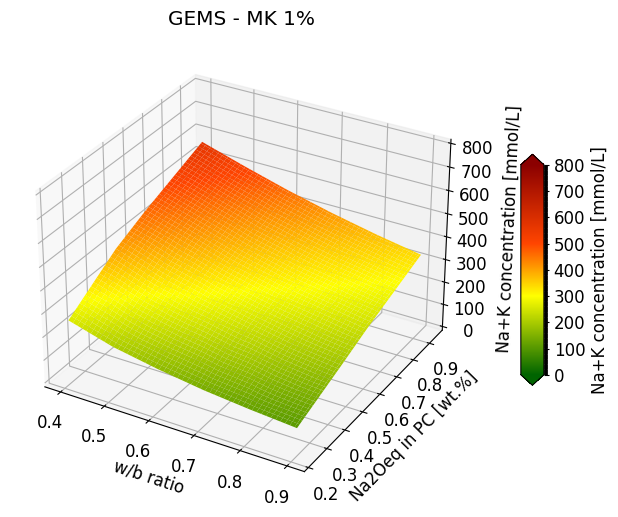

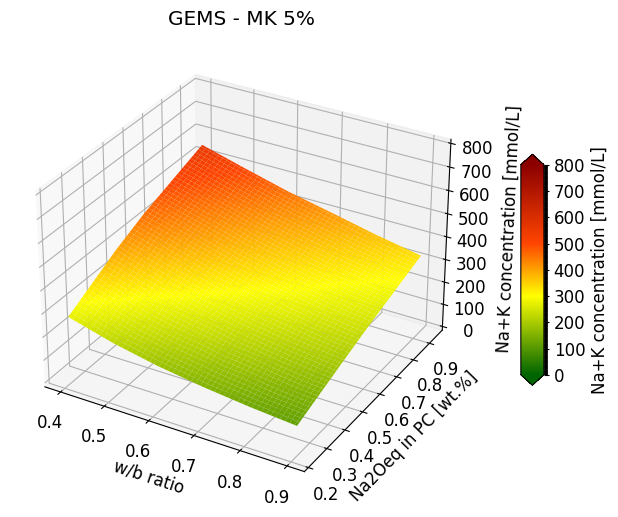

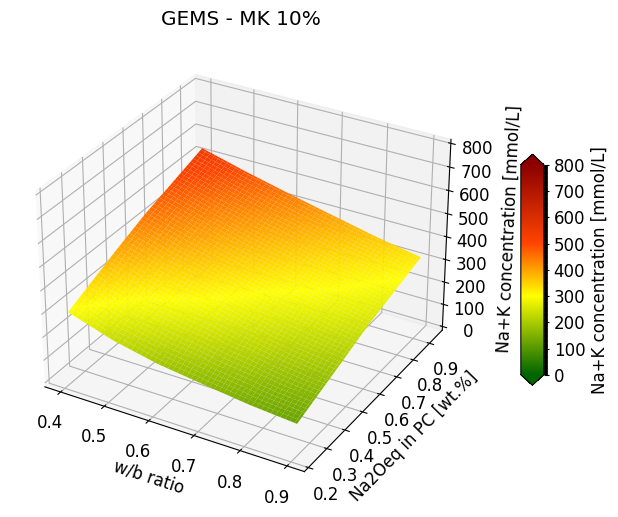

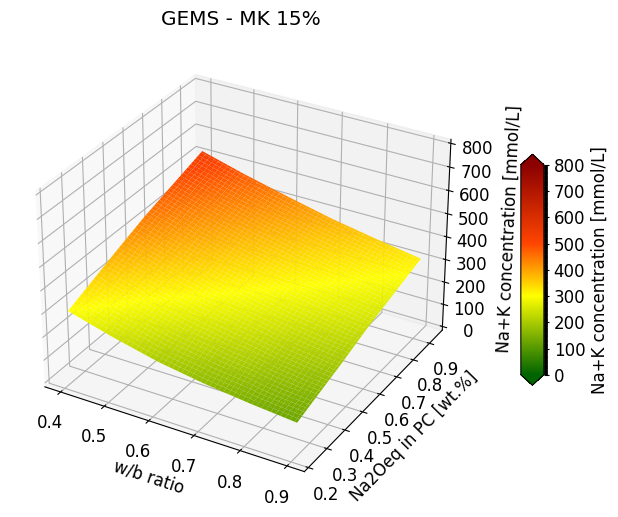

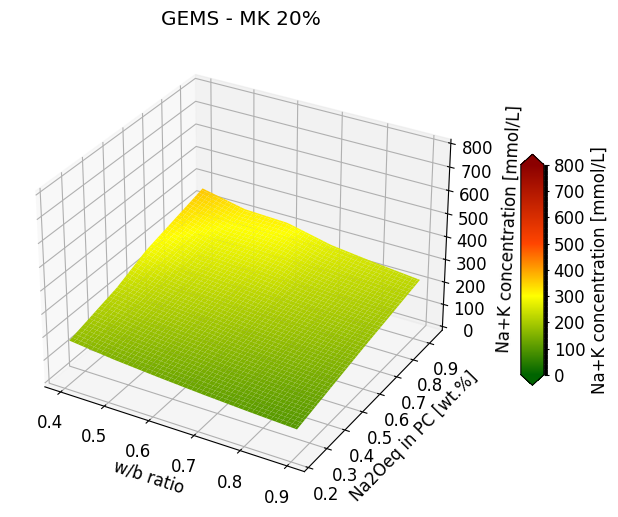

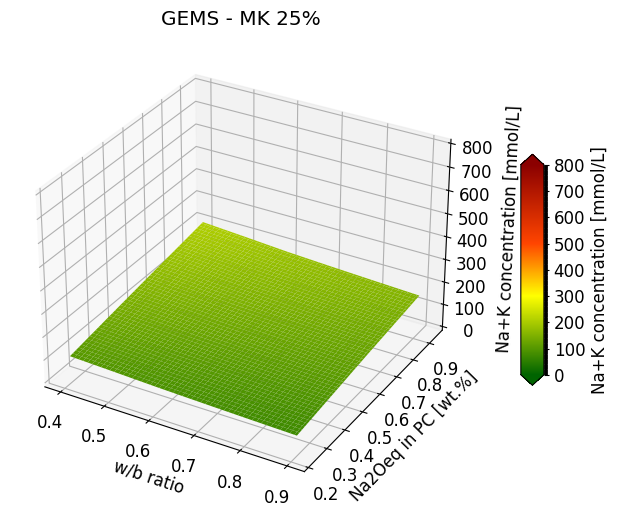

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import LinearSegmentedColormap, BoundaryNorm
from scipy.interpolate import griddata

# Load the spreadsheet
file_path = '/content/2024-06-05 Ana_wb for different alkali_MK.xlsx'
df = pd.read_excel(file_path, sheet_name='Summary', header=None)

# Extract the required values
alkali_levels = df.iloc[1, 1:29].values
wb_ratios = df.iloc[2, 1:29].values
MK_replacement = df.iloc[4:105, 0].values
concentration_levels = df.iloc[4:105, 1:29].values

#----------

replacement_level = 1

# Filter alkali levels to start from 0.4
valid_alkali_indices = wb_ratios >= 0.4
alkali_levels = alkali_levels[valid_alkali_indices]
wb_ratios = wb_ratios[valid_alkali_indices]
concentration_levels = concentration_levels[:, valid_alkali_indices]

# Filter data for the specified replacement level
valid_indices = MK_replacement == replacement_level
concentration_levels_filtered = concentration_levels[valid_indices, :]

# Create a DataFrame for the concentration levels at the specified replacement level
df_concentration = pd.DataFrame(concentration_levels_filtered, columns=alkali_levels)

# Ensure all values are numeric
df_concentration = df_concentration.apply(pd.to_numeric, errors='coerce')

# Handle NaNs by replacing them with zero
df_concentration = df_concentration.fillna(0)

# Convert column names to strings, remove percentage symbols, and convert to float
df_concentration.columns = df_concentration.columns.astype(str).str.rstrip('%').astype(float)

# Create meshgrid for plotting
w_b_values = np.linspace(wb_ratios.min(), wb_ratios.max(), 100)
alkali_values = np.linspace(alkali_levels.min(), alkali_levels.max(), 100)
W, A = np.meshgrid(w_b_values, alkali_values)

# Interpolate the Na+K concentrations
points = np.array([(wb_ratios[i], alkali_levels[i]) for i in range(len(wb_ratios))])
values = df_concentration.values.flatten()
Z = griddata(points, values, (W, A), method='linear')

# Ensure all values are float
W = W.astype(float)
A = A.astype(float)
Z = Z.astype(float)

# Create a custom colormap with smoother transitions and darker colors
colors = [
    (0.0, '#006400'),  # Dark Green
    (0.375, '#FFFF00'),  # Yellow at 300/800 = 0.375
    (0.625, '#FF4500'),  # Orange-Red
    (1.0, '#8B0000')  # Dark Red
]
positions = [color[0] for color in colors]
color_values = [color[1] for color in colors]
cmap = LinearSegmentedColormap.from_list('custom_cmap', list(zip(positions, color_values)), N=800)

# Define boundaries with smoother transitions
boundaries = np.linspace(0, 800, 801)  # 800 color levels
norm = BoundaryNorm(boundaries, ncolors=cmap.N, clip=True)

# Plotting the surface
fig = plt.figure(figsize=(9, 6))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W, A, Z, cmap=cmap, edgecolor='none', norm=norm, vmin=0, vmax=800)

# Add color bar which maps values to colors
cbar = fig.colorbar(surf, ax=ax, shrink=0.5, pad=0.07, aspect=10, extend='both', format='%d')
cbar.set_label('Na+K concentration [mmol/L]')
cbar.set_ticks(np.linspace(0, 800, 9))
cbar.set_ticklabels(['0', '100', '200', '300', '400', '500', '600', '700', '800'])

ax.set_xlabel('w/b ratio')
ax.set_ylabel('Na2Oeq in PC [wt.%]')
ax.set_zlabel('Na+K concentration [mmol/L]', labelpad=7)
ax.set_zlim(0, 800)
ax.set_title(f'GEMS - MK {replacement_level}%', pad=10)

plt.show()

#----------

replacement_level = 5

# Filter alkali levels to start from 0.4
valid_alkali_indices = wb_ratios >= 0.4
alkali_levels = alkali_levels[valid_alkali_indices]
wb_ratios = wb_ratios[valid_alkali_indices]
concentration_levels = concentration_levels[:, valid_alkali_indices]

# Filter data for the specified replacement level
valid_indices = MK_replacement == replacement_level
concentration_levels_filtered = concentration_levels[valid_indices, :]

# Create a DataFrame for the concentration levels at the specified replacement level
df_concentration = pd.DataFrame(concentration_levels_filtered, columns=alkali_levels)

# Ensure all values are numeric
df_concentration = df_concentration.apply(pd.to_numeric, errors='coerce')

# Handle NaNs by replacing them with zero
df_concentration = df_concentration.fillna(0)

# Convert column names to strings, remove percentage symbols, and convert to float
df_concentration.columns = df_concentration.columns.astype(str).str.rstrip('%').astype(float)

# Create meshgrid for plotting
w_b_values = np.linspace(wb_ratios.min(), wb_ratios.max(), 100)
alkali_values = np.linspace(alkali_levels.min(), alkali_levels.max(), 100)
W, A = np.meshgrid(w_b_values, alkali_values)

# Interpolate the Na+K concentrations
points = np.array([(wb_ratios[i], alkali_levels[i]) for i in range(len(wb_ratios))])
values = df_concentration.values.flatten()
Z = griddata(points, values, (W, A), method='linear')

# Ensure all values are float
W = W.astype(float)
A = A.astype(float)
Z = Z.astype(float)

# Create a custom colormap with smoother transitions and darker colors
colors = [
    (0.0, '#006400'),  # Dark Green
    (0.375, '#FFFF00'),  # Yellow at 300/800 = 0.375
    (0.625, '#FF4500'),  # Orange-Red
    (1.0, '#8B0000')  # Dark Red
]
positions = [color[0] for color in colors]
color_values = [color[1] for color in colors]
cmap = LinearSegmentedColormap.from_list('custom_cmap', list(zip(positions, color_values)), N=800)

# Define boundaries with smoother transitions
boundaries = np.linspace(0, 800, 801)  # 800 color levels
norm = BoundaryNorm(boundaries, ncolors=cmap.N, clip=True)

# Plotting the surface
fig = plt.figure(figsize=(9, 6))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W, A, Z, cmap=cmap, edgecolor='none', norm=norm, vmin=0, vmax=800)

# Add color bar which maps values to colors
cbar = fig.colorbar(surf, ax=ax, shrink=0.5, pad=0.07, aspect=10, extend='both', format='%d')
cbar.set_label('Na+K concentration [mmol/L]')
cbar.set_ticks(np.linspace(0, 800, 9))
cbar.set_ticklabels(['0', '100', '200', '300', '400', '500', '600', '700', '800'])

ax.set_xlabel('w/b ratio')
ax.set_ylabel('Na2Oeq in PC [wt.%]')
ax.set_zlabel('Na+K concentration [mmol/L]', labelpad=7)
ax.set_zlim(0, 800)
ax.set_title(f'GEMS - MK {replacement_level}%', pad=10)

plt.show()

#----------

replacement_level = 10

# Filter alkali levels to start from 0.4
valid_alkali_indices = wb_ratios >= 0.4
alkali_levels = alkali_levels[valid_alkali_indices]
wb_ratios = wb_ratios[valid_alkali_indices]
concentration_levels = concentration_levels[:, valid_alkali_indices]

# Filter data for the specified replacement level
valid_indices = MK_replacement == replacement_level
concentration_levels_filtered = concentration_levels[valid_indices, :]

# Create a DataFrame for the concentration levels at the specified replacement level
df_concentration = pd.DataFrame(concentration_levels_filtered, columns=alkali_levels)

# Ensure all values are numeric
df_concentration = df_concentration.apply(pd.to_numeric, errors='coerce')

# Handle NaNs by replacing them with zero
df_concentration = df_concentration.fillna(0)

# Convert column names to strings, remove percentage symbols, and convert to float
df_concentration.columns = df_concentration.columns.astype(str).str.rstrip('%').astype(float)

# Create meshgrid for plotting
w_b_values = np.linspace(wb_ratios.min(), wb_ratios.max(), 100)
alkali_values = np.linspace(alkali_levels.min(), alkali_levels.max(), 100)
W, A = np.meshgrid(w_b_values, alkali_values)

# Interpolate the Na+K concentrations
points = np.array([(wb_ratios[i], alkali_levels[i]) for i in range(len(wb_ratios))])
values = df_concentration.values.flatten()
Z = griddata(points, values, (W, A), method='linear')

# Ensure all values are float
W = W.astype(float)
A = A.astype(float)
Z = Z.astype(float)

# Create a custom colormap with smoother transitions and darker colors
colors = [
    (0.0, '#006400'),  # Dark Green
    (0.375, '#FFFF00'),  # Yellow at 300/800 = 0.375
    (0.625, '#FF4500'),  # Orange-Red
    (1.0, '#8B0000')  # Dark Red
]
positions = [color[0] for color in colors]
color_values = [color[1] for color in colors]
cmap = LinearSegmentedColormap.from_list('custom_cmap', list(zip(positions, color_values)), N=800)

# Define boundaries with smoother transitions
boundaries = np.linspace(0, 800, 801)  # 800 color levels
norm = BoundaryNorm(boundaries, ncolors=cmap.N, clip=True)

# Plotting the surface
fig = plt.figure(figsize=(9, 6))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W, A, Z, cmap=cmap, edgecolor='none', norm=norm, vmin=0, vmax=800)

# Add color bar which maps values to colors
cbar = fig.colorbar(surf, ax=ax, shrink=0.5, pad=0.07, aspect=10, extend='both', format='%d')
cbar.set_label('Na+K concentration [mmol/L]')
cbar.set_ticks(np.linspace(0, 800, 9))
cbar.set_ticklabels(['0', '100', '200', '300', '400', '500', '600', '700', '800'])

ax.set_xlabel('w/b ratio')
ax.set_ylabel('Na2Oeq in PC [wt.%]')
ax.set_zlabel('Na+K concentration [mmol/L]', labelpad=7)
ax.set_zlim(0, 800)
ax.set_title(f'GEMS - MK {replacement_level}%', pad=10)

plt.show()

#----------

replacement_level = 15

# Filter alkali levels to start from 0.4
valid_alkali_indices = wb_ratios >= 0.4
alkali_levels = alkali_levels[valid_alkali_indices]
wb_ratios = wb_ratios[valid_alkali_indices]
concentration_levels = concentration_levels[:, valid_alkali_indices]

# Filter data for the specified replacement level
valid_indices = MK_replacement == replacement_level
concentration_levels_filtered = concentration_levels[valid_indices, :]

# Create a DataFrame for the concentration levels at the specified replacement level
df_concentration = pd.DataFrame(concentration_levels_filtered, columns=alkali_levels)

# Ensure all values are numeric
df_concentration = df_concentration.apply(pd.to_numeric, errors='coerce')

# Handle NaNs by replacing them with zero
df_concentration = df_concentration.fillna(0)

# Convert column names to strings, remove percentage symbols, and convert to float
df_concentration.columns = df_concentration.columns.astype(str).str.rstrip('%').astype(float)

# Create meshgrid for plotting
w_b_values = np.linspace(wb_ratios.min(), wb_ratios.max(), 100)
alkali_values = np.linspace(alkali_levels.min(), alkali_levels.max(), 100)
W, A = np.meshgrid(w_b_values, alkali_values)

# Interpolate the Na+K concentrations
points = np.array([(wb_ratios[i], alkali_levels[i]) for i in range(len(wb_ratios))])
values = df_concentration.values.flatten()
Z = griddata(points, values, (W, A), method='linear')

# Ensure all values are float
W = W.astype(float)
A = A.astype(float)
Z = Z.astype(float)

# Create a custom colormap with smoother transitions and darker colors
colors = [
    (0.0, '#006400'),  # Dark Green
    (0.375, '#FFFF00'),  # Yellow at 300/800 = 0.375
    (0.625, '#FF4500'),  # Orange-Red
    (1.0, '#8B0000')  # Dark Red
]
positions = [color[0] for color in colors]
color_values = [color[1] for color in colors]
cmap = LinearSegmentedColormap.from_list('custom_cmap', list(zip(positions, color_values)), N=800)

# Define boundaries with smoother transitions
boundaries = np.linspace(0, 800, 801)  # 800 color levels
norm = BoundaryNorm(boundaries, ncolors=cmap.N, clip=True)

# Plotting the surface
fig = plt.figure(figsize=(9, 6))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W, A, Z, cmap=cmap, edgecolor='none', norm=norm, vmin=0, vmax=800)

# Add color bar which maps values to colors
cbar = fig.colorbar(surf, ax=ax, shrink=0.5, pad=0.07, aspect=10, extend='both', format='%d')
cbar.set_label('Na+K concentration [mmol/L]')
cbar.set_ticks(np.linspace(0, 800, 9))
cbar.set_ticklabels(['0', '100', '200', '300', '400', '500', '600', '700', '800'])

ax.set_xlabel('w/b ratio')
ax.set_ylabel('Na2Oeq in PC [wt.%]')
ax.set_zlabel('Na+K concentration [mmol/L]', labelpad=7)
ax.set_zlim(0, 800)
ax.set_title(f'GEMS - MK {replacement_level}%', pad=10)

plt.show()

#----------

replacement_level = 20

# Filter alkali levels to start from 0.4
valid_alkali_indices = wb_ratios >= 0.4
alkali_levels = alkali_levels[valid_alkali_indices]
wb_ratios = wb_ratios[valid_alkali_indices]
concentration_levels = concentration_levels[:, valid_alkali_indices]

# Filter data for the specified replacement level
valid_indices = MK_replacement == replacement_level
concentration_levels_filtered = concentration_levels[valid_indices, :]

# Create a DataFrame for the concentration levels at the specified replacement level
df_concentration = pd.DataFrame(concentration_levels_filtered, columns=alkali_levels)

# Ensure all values are numeric
df_concentration = df_concentration.apply(pd.to_numeric, errors='coerce')

# Handle NaNs by replacing them with zero
df_concentration = df_concentration.fillna(0)

# Convert column names to strings, remove percentage symbols, and convert to float
df_concentration.columns = df_concentration.columns.astype(str).str.rstrip('%').astype(float)

# Create meshgrid for plotting
w_b_values = np.linspace(wb_ratios.min(), wb_ratios.max(), 100)
alkali_values = np.linspace(alkali_levels.min(), alkali_levels.max(), 100)
W, A = np.meshgrid(w_b_values, alkali_values)

# Interpolate the Na+K concentrations
points = np.array([(wb_ratios[i], alkali_levels[i]) for i in range(len(wb_ratios))])
values = df_concentration.values.flatten()
Z = griddata(points, values, (W, A), method='linear')

# Ensure all values are float
W = W.astype(float)
A = A.astype(float)
Z = Z.astype(float)

# Create a custom colormap with smoother transitions and darker colors
colors = [
    (0.0, '#006400'),  # Dark Green
    (0.375, '#FFFF00'),  # Yellow at 300/800 = 0.375
    (0.625, '#FF4500'),  # Orange-Red
    (1.0, '#8B0000')  # Dark Red
]
positions = [color[0] for color in colors]
color_values = [color[1] for color in colors]
cmap = LinearSegmentedColormap.from_list('custom_cmap', list(zip(positions, color_values)), N=800)

# Define boundaries with smoother transitions
boundaries = np.linspace(0, 800, 801)  # 800 color levels
norm = BoundaryNorm(boundaries, ncolors=cmap.N, clip=True)

# Plotting the surface
fig = plt.figure(figsize=(9, 6))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W, A, Z, cmap=cmap, edgecolor='none', norm=norm, vmin=0, vmax=800)

# Add color bar which maps values to colors
cbar = fig.colorbar(surf, ax=ax, shrink=0.5, pad=0.07, aspect=10, extend='both', format='%d')
cbar.set_label('Na+K concentration [mmol/L]')
cbar.set_ticks(np.linspace(0, 800, 9))
cbar.set_ticklabels(['0', '100', '200', '300', '400', '500', '600', '700', '800'])

ax.set_xlabel('w/b ratio')
ax.set_ylabel('Na2Oeq in PC [wt.%]')
ax.set_zlabel('Na+K concentration [mmol/L]', labelpad=7)
ax.set_zlim(0, 800)
ax.set_title(f'GEMS - MK {replacement_level}%', pad=10)

plt.show()

#----------

replacement_level = 25

# Filter alkali levels to start from 0.4
valid_alkali_indices = wb_ratios >= 0.4
alkali_levels = alkali_levels[valid_alkali_indices]
wb_ratios = wb_ratios[valid_alkali_indices]
concentration_levels = concentration_levels[:, valid_alkali_indices]

# Filter data for the specified replacement level
valid_indices = MK_replacement == replacement_level
concentration_levels_filtered = concentration_levels[valid_indices, :]

# Create a DataFrame for the concentration levels at the specified replacement level
df_concentration = pd.DataFrame(concentration_levels_filtered, columns=alkali_levels)

# Ensure all values are numeric
df_concentration = df_concentration.apply(pd.to_numeric, errors='coerce')

# Handle NaNs by replacing them with zero
df_concentration = df_concentration.fillna(0)

# Convert column names to strings, remove percentage symbols, and convert to float
df_concentration.columns = df_concentration.columns.astype(str).str.rstrip('%').astype(float)

# Create meshgrid for plotting
w_b_values = np.linspace(wb_ratios.min(), wb_ratios.max(), 100)
alkali_values = np.linspace(alkali_levels.min(), alkali_levels.max(), 100)
W, A = np.meshgrid(w_b_values, alkali_values)

# Interpolate the Na+K concentrations
points = np.array([(wb_ratios[i], alkali_levels[i]) for i in range(len(wb_ratios))])
values = df_concentration.values.flatten()
Z = griddata(points, values, (W, A), method='linear')

# Ensure all values are float
W = W.astype(float)
A = A.astype(float)
Z = Z.astype(float)

# Create a custom colormap with smoother transitions and darker colors
colors = [
    (0.0, '#006400'),  # Dark Green
    (0.375, '#FFFF00'),  # Yellow at 300/800 = 0.375
    (0.625, '#FF4500'),  # Orange-Red
    (1.0, '#8B0000')  # Dark Red
]
positions = [color[0] for color in colors]
color_values = [color[1] for color in colors]
cmap = LinearSegmentedColormap.from_list('custom_cmap', list(zip(positions, color_values)), N=800)

# Define boundaries with smoother transitions
boundaries = np.linspace(0, 800, 801)  # 800 color levels
norm = BoundaryNorm(boundaries, ncolors=cmap.N, clip=True)

# Plotting the surface
fig = plt.figure(figsize=(9, 6))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W, A, Z, cmap=cmap, edgecolor='none', norm=norm, vmin=0, vmax=800)

# Add color bar which maps values to colors
cbar = fig.colorbar(surf, ax=ax, shrink=0.5, pad=0.07, aspect=10, extend='both', format='%d')
cbar.set_label('Na+K concentration [mmol/L]')
cbar.set_ticks(np.linspace(0, 800, 9))
cbar.set_ticklabels(['0', '100', '200', '300', '400', '500', '600', '700', '800'])

ax.set_xlabel('w/b ratio')
ax.set_ylabel('Na2Oeq in PC [wt.%]')
ax.set_zlabel('Na+K concentration [mmol/L]', labelpad=7)
ax.set_zlim(0, 800)
ax.set_title(f'GEMS - MK {replacement_level}%', pad=10)

plt.show()



Experimental data

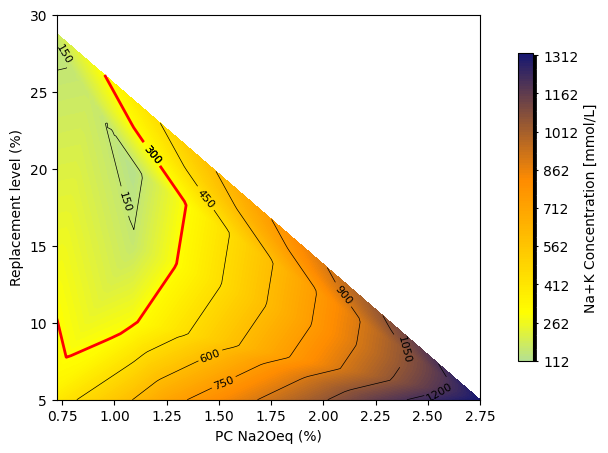

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap, BoundaryNorm
from scipy.interpolate import griddata

# Data
data_final = {
    "PC Na2Oeq": [0.875, 0.65, 1.25, 2.25, 2.75, 1.09, 1.09, 1.09, 1.09, 0.62],
    "Replacement level (%)": [25, 5, 5, 5, 5, 5, 10, 15, 20, 30],
    "w/b ratio": [None, 0.45, 0.45, 0.45, 0.45, 0.6, 0.6, 0.6, 0.6, 0.6],
    "Na+K": [168, 354, 706, 1152, 1312, 602, 290, 156, 117, 112]
}

# Create DataFrame
df_final = pd.DataFrame(data_final)

# Replace None with np.nan for better handling
df_final['w/b ratio'] = df_final['w/b ratio'].replace({None: np.nan})

# Grid for interpolation
xi = np.linspace(df_final['PC Na2Oeq'].min(), df_final['PC Na2Oeq'].max(), 100)
yi = np.linspace(df_final['Replacement level (%)'].min(), df_final['Replacement level (%)'].max(), 100)
xi, yi = np.meshgrid(xi, yi)

# Interpolate
zi = griddata((df_final['PC Na2Oeq'], df_final['Replacement level (%)']), df_final['Na+K'], (xi, yi), method='linear')

# Create custom colormap
colors = [
    (0.0, '#87CEEB'),
    (300/1312, '#FFFF00'),
    (0.625, '#FF8C00'),
    (1.0, '#191970')
]
positions = [color[0] for color in colors]
color_values = [color[1] for color in colors]
cmap = LinearSegmentedColormap.from_list('custom_cmap', list(zip(positions, color_values)), N=1312)

# Define boundaries with smoother transitions
boundaries = np.linspace(0, 1312, 1313)  # 1312 color levels based on max Na+K value in the dataset
norm = BoundaryNorm(boundaries, ncolors=cmap.N, clip=True)

# Create contour plot
fig, ax = plt.subplots(figsize=(7, 5))

contour = ax.contourf(xi, yi, zi, levels=120, cmap=cmap, norm=norm)

# Add contour lines
contour_lines = ax.contour(xi, yi, zi, levels=10, colors='black', linewidths=0.5)
ax.clabel(contour_lines, inline=True, fontsize=8, fmt='%d')

# Highlight the 300 line in red
contour_300 = ax.contour(xi, yi, zi, levels=[300], colors='red', linewidths=2)
ax.clabel(contour_300, inline=True, fontsize=8, fmt='300', colors='black')

# Add color bar which maps values to colors
cbar = fig.colorbar(contour, ax=ax, shrink=0.8, pad=0.07, aspect=20, extend='both', format='%d')
cbar.set_label('Na+K concentration [mmol/L]')
cbar.set_ticks(np.linspace(df_final['Na+K'].min(), df_final['Na+K'].max(), 9))
cbar.set_ticklabels(['{:.0f}'.format(i) for i in np.linspace(df_final['Na+K'].min(), 1312, 9)])

# Add labels and title
ax.set_xlabel('Na2Oeq in PC [wt.%]')
ax.set_ylabel('Replacement level [wt.%]')
ax.set_ylim(5, 30)
ax.set_xlim(0.725, 2.75)
plt.show()



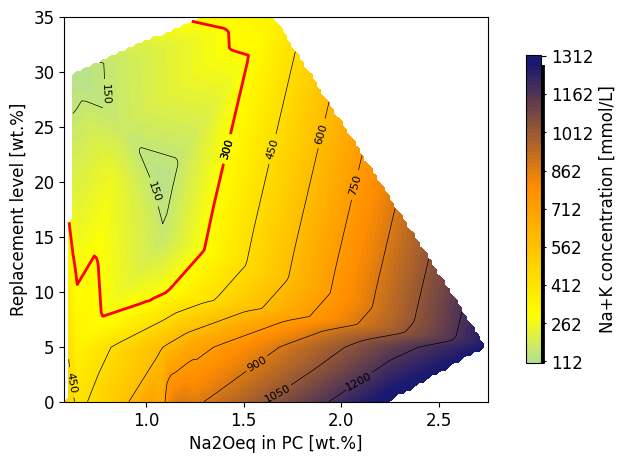

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap, BoundaryNorm
from scipy.interpolate import griddata

# Data
data_final = {
    "PC Na2Oeq": [1.05, 1.1, 0.875, 1.15, 1.02, 0.82, 1.25, 1.25, 0.65, 1.25, 2.25, 0.65, 1.25, 2.25, 2.75, 1.09, 1.09, 1.09, 1.09, 0.62, 0.86, 1.09, 0.58, 1.18, 1.27, 1.66],
    "Replacement level (%)": [0, 0, 25, 0, 0, 20, 0, 0, 0, 0, 0, 5, 5, 5, 5, 5, 10, 15, 20, 30, 0, 0, 0, 0, 35, 35],
    "w/b ratio": [0.5, 0.5, 0.5, 0.5, 0.45, 0.45, 0.45, 0.5, 0.45, 0.45, 0.45, 0.45, 0.45, 0.45, 0.45, 0.6, 0.6, 0.6, 0.6, 0.6, 0.6, 0.6, 0.5, 0.5, 0.5, 0.5],
    "Na+K": [669, 797, 168, 891, 715, 261, 902, 879, 421, 809, 1347, 354, 706, 1152, 1312, 602, 290, 156, 117, 112, 547, 681, 533, 895, 315, 356]
}

# Create DataFrame
df_final = pd.DataFrame(data_final)

# Replace None with np.nan for better handling
df_final['w/b ratio'] = df_final['w/b ratio'].replace({None: np.nan})

# Grid for interpolation
xi = np.linspace(df_final['PC Na2Oeq'].min(), df_final['PC Na2Oeq'].max(), 100)
yi = np.linspace(df_final['Replacement level (%)'].min(), df_final['Replacement level (%)'].max(), 100)
xi, yi = np.meshgrid(xi, yi)

# Interpolate
zi = griddata((df_final['PC Na2Oeq'], df_final['Replacement level (%)']), df_final['Na+K'], (xi, yi), method='linear')

# Create custom colormap
colors = [
    (0.0, '#87CEEB'),
    (300/1312, '#FFFF00'),
    (0.625, '#FF8C00'),
    (1.0, '#191970')
]
positions = [color[0] for color in colors]
color_values = [color[1] for color in colors]
cmap = LinearSegmentedColormap.from_list('custom_cmap', list(zip(positions, color_values)), N=1312)

# Define boundaries with smoother transitions
boundaries = np.linspace(0, 1312, 1313)  # 1312 color levels based on max Na+K value in the dataset
norm = BoundaryNorm(boundaries, ncolors=cmap.N, clip=True)

# Create contour plot
fig, ax = plt.subplots(figsize=(7, 5))

contour = ax.contourf(xi, yi, zi, levels=120, cmap=cmap, norm=norm)

# Add contour lines
contour_lines = ax.contour(xi, yi, zi, levels=10, colors='black', linewidths=0.5)
ax.clabel(contour_lines, inline=True, fontsize=8, fmt='%d')

# Highlight the 300 line in red
contour_300 = ax.contour(xi, yi, zi, levels=[300], colors='red', linewidths=2)
ax.clabel(contour_300, inline=True, fontsize=8, fmt='300', colors='black')

# Add color bar which maps values to colors
cbar = fig.colorbar(contour, ax=ax, shrink=0.8, pad=0.07, aspect=20, extend='both', format='%d')
cbar.set_label('Na+K concentration [mmol/L]')
cbar.set_ticks(np.linspace(df_final['Na+K'].min(), df_final['Na+K'].max(), 9))
cbar.set_ticklabels(['{:.0f}'.format(i) for i in np.linspace(df_final['Na+K'].min(), 1312, 9)])

# Add labels and title
ax.set_xlabel('Na2Oeq in PC [wt.%]')
ax.set_ylabel('Replacement level [wt.%]')
# ax.set_ylim(5, 30)
# ax.set_xlim(0.725, 2.75)
plt.show()



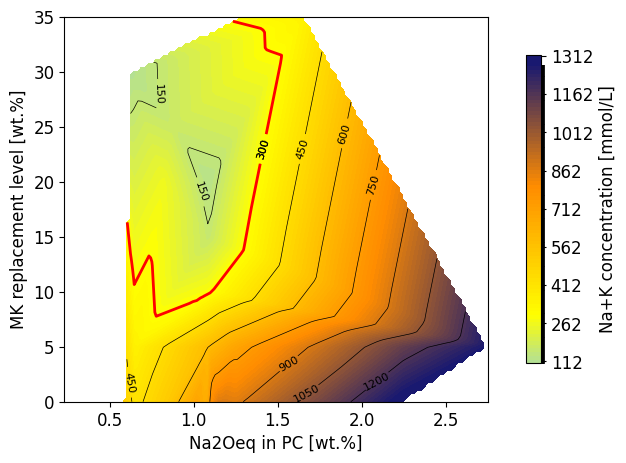

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap, BoundaryNorm
from scipy.interpolate import griddata

# Data
data = {
    "PC Na2Oeq": [1.05, 1.1, 0.875, 1.15, 1.02, 0.82, 1.25, 1.25, 0.65, 1.25, 2.25, 0.65, 1.25, 2.25, 2.75, 1.09, 1.09, 1.09, 1.09, 0.62, 0.86, 1.09, 0.58, 1.18, 1.27, 1.66],
    "Replacement level (%)": [0, 0, 25, 0, 0, 20, 0, 0, 0, 0, 0, 5, 5, 5, 5, 5, 10, 15, 20, 30, 0, 0, 0, 0, 35, 35],
    "w/b ratio": [0.5, 0.5, 0.5, 0.5, 0.45, 0.45, 0.45, 0.5, 0.45, 0.45, 0.45, 0.45, 0.45, 0.45, 0.45, 0.6, 0.6, 0.6, 0.6, 0.6, 0.6, 0.6, 0.5, 0.5, 0.5, 0.5],
    "Na+K": [669, 797, 168, 891, 715, 261, 902, 879, 421, 809, 1347, 354, 706, 1152, 1312, 602, 290, 156, 117, 112, 547, 681, 533, 895, 315, 356]
}

# Create DataFrame
df = pd.DataFrame(data)

# Filter data for w/b ratio = 0.45
df_final = df.copy()

# Replace None with np.nan for better handling
df_final['w/b ratio'] = df_final['w/b ratio'].replace({None: np.nan})

# Grid for interpolationa
xi = np.linspace(df_final['PC Na2Oeq'].min(), df_final['PC Na2Oeq'].max(), 100)
yi = np.linspace(df_final['Replacement level (%)'].min(), df_final['Replacement level (%)'].max(), 100)
xi, yi = np.meshgrid(xi, yi)

# Interpolate
zi = griddata((df_final['PC Na2Oeq'], df_final['Replacement level (%)']), df_final['Na+K'], (xi, yi), method='linear')

# Create custom colormap
colors = [
    (0.0, '#87CEEB'),
    (300/1312, '#FFFF00'),
    (0.625, '#FF8C00'),
    (1.0, '#191970')
]
positions = [color[0] for color in colors]
color_values = [color[1] for color in colors]
cmap = LinearSegmentedColormap.from_list('custom_cmap', list(zip(positions, color_values)), N=1312)

# Define boundaries with smoother transitions
boundaries = np.linspace(0, 1312, 1313)  # 1312 color levels based on max Na+K value in the dataset
norm = BoundaryNorm(boundaries, ncolors=cmap.N, clip=True)

# Create contour plot
fig, ax = plt.subplots(figsize=(7, 5))

contour = ax.contourf(xi, yi, zi, levels=120, cmap=cmap, norm=norm)

# Add contour lines
contour_lines = ax.contour(xi, yi, zi, levels=10, colors='black', linewidths=0.5)
ax.clabel(contour_lines, inline=True, fontsize=8, fmt='%d')

# Highlight the 300 line in red
contour_300 = ax.contour(xi, yi, zi, levels=[300], colors='red', linewidths=2)
ax.clabel(contour_300, inline=True, fontsize=8, fmt='300', colors='black')

# Add color bar which maps values to colors
cbar = fig.colorbar(contour, ax=ax, shrink=0.8, pad=0.07, aspect=20, extend='both', format='%d')
cbar.set_label('Na+K concentration [mmol/L]')
cbar.set_ticks(np.linspace(df_final['Na+K'].min(), df_final['Na+K'].max(), 9))
cbar.set_ticklabels(['{:.0f}'.format(i) for i in np.linspace(df_final['Na+K'].min(), 1312, 9)])

# Add labels and title
ax.set_xlabel('Na2Oeq in PC [wt.%]')
ax.set_ylabel('MK replacement level [wt.%]')
ax.set_ylim(0, 35)
ax.set_xlim(0.23, 2.75)
plt.show()



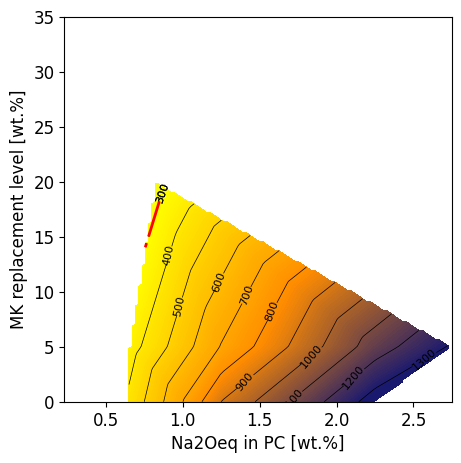

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap, BoundaryNorm
from scipy.interpolate import griddata

# Data
data = {
    "PC Na2Oeq": [1.05, 1.1, 0.875, 1.15, 1.02, 0.82, 1.25, 1.25, 0.65, 1.25, 2.25, 0.65, 1.25, 2.25, 2.75, 1.09, 1.09, 1.09, 1.09, 0.62, 0.86, 1.09, 0.58, 1.18, 1.27, 1.66],
    "Replacement level (%)": [0, 0, 25, 0, 0, 20, 0, 0, 0, 0, 0, 5, 5, 5, 5, 5, 10, 15, 20, 30, 0, 0, 0, 0, 35, 35],
    "w/b ratio": [0.5, 0.5, 0.5, 0.5, 0.45, 0.45, 0.45, 0.5, 0.45, 0.45, 0.45, 0.45, 0.45, 0.45, 0.45, 0.6, 0.6, 0.6, 0.6, 0.6, 0.6, 0.6, 0.5, 0.5, 0.5, 0.5],
    "Na+K": [669, 797, 168, 891, 715, 261, 902, 879, 421, 809, 1347, 354, 706, 1152, 1312, 602, 290, 156, 117, 112, 547, 681, 533, 895, 315, 356]
}

# Create DataFrame
df = pd.DataFrame(data)

# Filter data for w/b ratio = 0.45
df_final = df[df['w/b ratio'] == 0.45].copy()

# Replace None with np.nan for better handling
df_final['w/b ratio'] = df_final['w/b ratio'].replace({None: np.nan})

# Grid for interpolationa
xi = np.linspace(df_final['PC Na2Oeq'].min(), df_final['PC Na2Oeq'].max(), 100)
yi = np.linspace(df_final['Replacement level (%)'].min(), df_final['Replacement level (%)'].max(), 100)
xi, yi = np.meshgrid(xi, yi)

# Interpolate
zi = griddata((df_final['PC Na2Oeq'], df_final['Replacement level (%)']), df_final['Na+K'], (xi, yi), method='linear')

# Create custom colormap
colors = [
    (0.0, '#87CEEB'),
    (300/1312, '#FFFF00'),
    (0.625, '#FF8C00'),
    (1.0, '#191970')
]
positions = [color[0] for color in colors]
color_values = [color[1] for color in colors]
cmap = LinearSegmentedColormap.from_list('custom_cmap', list(zip(positions, color_values)), N=1312)

# Define boundaries with smoother transitions
boundaries = np.linspace(0, 1312, 1313)  # 1312 color levels based on max Na+K value in the dataset
norm = BoundaryNorm(boundaries, ncolors=cmap.N, clip=True)

# Create contour plot
fig, ax = plt.subplots(figsize=(5, 5))

contour = ax.contourf(xi, yi, zi, levels=120, cmap=cmap, norm=norm)

# Add contour lines
contour_lines = ax.contour(xi, yi, zi, levels=10, colors='black', linewidths=0.5)
ax.clabel(contour_lines, inline=True, fontsize=8, fmt='%d')

# Highlight the 300 line in red
contour_300 = ax.contour(xi, yi, zi, levels=[300], colors='red', linewidths=2)
ax.clabel(contour_300, inline=True, fontsize=8, fmt='300', colors='black')

# Add color bar which maps values to colors
# cbar = fig.colorbar(contour, ax=ax, shrink=0.8, pad=0.07, aspect=20, extend='both', format='%d')
# cbar.set_label('Na+K Concentration [mmol/L]')
# cbar.set_ticks(np.linspace(df_final['Na+K'].min(), df_final['Na+K'].max(), 9))
# cbar.set_ticklabels(['{:.0f}'.format(i) for i in np.linspace(df_final['Na+K'].min(), 1312, 9)])

# Add labels and title
ax.set_xlabel('Na2Oeq in PC [wt.%]')
ax.set_ylabel('MK replacement level [wt.%]')
ax.set_ylim(0, 35)
ax.set_xlim(0.23, 2.75)
plt.show()



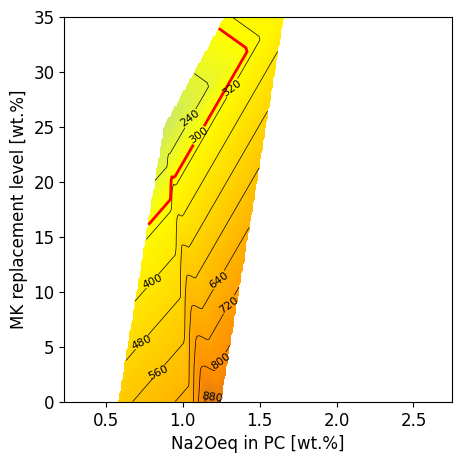

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap, BoundaryNorm
from scipy.interpolate import griddata

# Data
data = {
    "PC Na2Oeq": [1.05, 1.1, 0.875, 1.15, 1.02, 0.82, 1.25, 1.25, 0.65, 1.25, 2.25, 0.65, 1.25, 2.25, 2.75, 1.09, 1.09, 1.09, 1.09, 0.62, 0.86, 1.09, 0.58, 1.18, 1.27, 1.66],
    "Replacement level (%)": [0, 0, 25, 0, 0, 20, 0, 0, 0, 0, 0, 5, 5, 5, 5, 5, 10, 15, 20, 30, 0, 0, 0, 0, 35, 35],
    "w/b ratio": [0.5, 0.5, 0.5, 0.5, 0.45, 0.45, 0.45, 0.5, 0.45, 0.45, 0.45, 0.45, 0.45, 0.45, 0.45, 0.6, 0.6, 0.6, 0.6, 0.6, 0.6, 0.6, 0.5, 0.5, 0.5, 0.5],
    "Na+K": [669, 797, 168, 891, 715, 261, 902, 879, 421, 809, 1347, 354, 706, 1152, 1312, 602, 290, 156, 117, 112, 547, 681, 533, 895, 315, 356]
}

# Create DataFrame
df = pd.DataFrame(data)

# Filter data for w/b ratio = 0.45
df_final = df[df['w/b ratio'] == 0.5].copy()

# Replace None with np.nan for better handling
df_final['w/b ratio'] = df_final['w/b ratio'].replace({None: np.nan})

# Grid for interpolationa
xi = np.linspace(df_final['PC Na2Oeq'].min(), df_final['PC Na2Oeq'].max(), 100)
yi = np.linspace(df_final['Replacement level (%)'].min(), df_final['Replacement level (%)'].max(), 100)
xi, yi = np.meshgrid(xi, yi)

# Interpolate
zi = griddata((df_final['PC Na2Oeq'], df_final['Replacement level (%)']), df_final['Na+K'], (xi, yi), method='linear')

# Create custom colormap
colors = [
    (0.0, '#87CEEB'),
    (300/1312, '#FFFF00'),
    (0.625, '#FF8C00'),
    (1.0, '#191970')
]
positions = [color[0] for color in colors]
color_values = [color[1] for color in colors]
cmap = LinearSegmentedColormap.from_list('custom_cmap', list(zip(positions, color_values)), N=1312)

# Define boundaries with smoother transitions
boundaries = np.linspace(0, 1312, 1313)  # 1312 color levels based on max Na+K value in the dataset
norm = BoundaryNorm(boundaries, ncolors=cmap.N, clip=True)

# Create contour plot
fig, ax = plt.subplots(figsize=(5, 5))

contour = ax.contourf(xi, yi, zi, levels=120, cmap=cmap, norm=norm)

# Add contour lines
contour_lines = ax.contour(xi, yi, zi, levels=10, colors='black', linewidths=0.5)
ax.clabel(contour_lines, inline=True, fontsize=8, fmt='%d')

# Highlight the 300 line in red
contour_300 = ax.contour(xi, yi, zi, levels=[300], colors='red', linewidths=2)
ax.clabel(contour_300, inline=True, fontsize=8, fmt='300', colors='black')

# Add color bar which maps values to colors
# cbar = fig.colorbar(contour, ax=ax, shrink=0.8, pad=0.07, aspect=20, extend='both', format='%d')
# cbar.set_label('Na+K Concentration [mmol/L]')
# cbar.set_ticks(np.linspace(df_final['Na+K'].min(), df_final['Na+K'].max(), 9))
# cbar.set_ticklabels(['{:.0f}'.format(i) for i in np.linspace(df_final['Na+K'].min(), 1312, 9)])

# Add labels and title
ax.set_xlabel('Na2Oeq in PC [wt.%]')
ax.set_ylabel('MK replacement level [wt.%]')
ax.set_ylim(0, 35)
ax.set_xlim(0.23, 2.75)
plt.show()



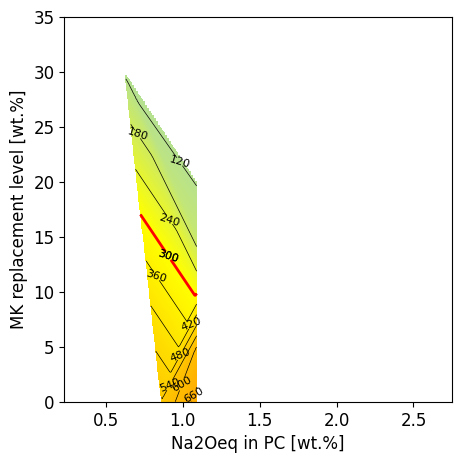

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap, BoundaryNorm
from scipy.interpolate import griddata

# Data
data = {
    "PC Na2Oeq": [1.05, 1.1, 0.875, 1.15, 1.02, 0.82, 1.25, 1.25, 0.65, 1.25, 2.25, 0.65, 1.25, 2.25, 2.75, 1.09, 1.09, 1.09, 1.09, 0.62, 0.86, 1.09, 0.58, 1.18, 1.27, 1.66],
    "Replacement level (%)": [0, 0, 25, 0, 0, 20, 0, 0, 0, 0, 0, 5, 5, 5, 5, 5, 10, 15, 20, 30, 0, 0, 0, 0, 35, 35],
    "w/b ratio": [0.5, 0.5, 0.5, 0.5, 0.45, 0.45, 0.45, 0.5, 0.45, 0.45, 0.45, 0.45, 0.45, 0.45, 0.45, 0.6, 0.6, 0.6, 0.6, 0.6, 0.6, 0.6, 0.5, 0.5, 0.5, 0.5],
    "Na+K": [669, 797, 168, 891, 715, 261, 902, 879, 421, 809, 1347, 354, 706, 1152, 1312, 602, 290, 156, 117, 112, 547, 681, 533, 895, 315, 356]
}

# Create DataFrame
df = pd.DataFrame(data)

# Filter data for w/b ratio = 0.45
df_final = df[df['w/b ratio'] == 0.6].copy()

# Replace None with np.nan for better handling
df_final['w/b ratio'] = df_final['w/b ratio'].replace({None: np.nan})

# Grid for interpolationa
xi = np.linspace(df_final['PC Na2Oeq'].min(), df_final['PC Na2Oeq'].max(), 100)
yi = np.linspace(df_final['Replacement level (%)'].min(), df_final['Replacement level (%)'].max(), 100)
xi, yi = np.meshgrid(xi, yi)

# Interpolate
zi = griddata((df_final['PC Na2Oeq'], df_final['Replacement level (%)']), df_final['Na+K'], (xi, yi), method='linear')

# Create custom colormap
colors = [
    (0.0, '#87CEEB'),
    (300/1312, '#FFFF00'),
    (0.625, '#FF8C00'),
    (1.0, '#191970')
]
positions = [color[0] for color in colors]
color_values = [color[1] for color in colors]
cmap = LinearSegmentedColormap.from_list('custom_cmap', list(zip(positions, color_values)), N=1312)

# Define boundaries with smoother transitions
boundaries = np.linspace(0, 1312, 1313)  # 1312 color levels based on max Na+K value in the dataset
norm = BoundaryNorm(boundaries, ncolors=cmap.N, clip=True)

# Create contour plot
fig, ax = plt.subplots(figsize=(5, 5))

contour = ax.contourf(xi, yi, zi, levels=120, cmap=cmap, norm=norm)

# Add contour lines
contour_lines = ax.contour(xi, yi, zi, levels=10, colors='black', linewidths=0.5)
ax.clabel(contour_lines, inline=True, fontsize=8, fmt='%d')

# Highlight the 300 line in red
contour_300 = ax.contour(xi, yi, zi, levels=[300], colors='red', linewidths=2)
ax.clabel(contour_300, inline=True, fontsize=8, fmt='300', colors='black')

# Add color bar which maps values to colors
# cbar = fig.colorbar(contour, ax=ax, shrink=0.8, pad=0.07, aspect=20, extend='both', format='%d')
# cbar.set_label('Na+K Concentration [mmol/L]')
# cbar.set_ticks(np.linspace(df_final['Na+K'].min(), df_final['Na+K'].max(), 9))
# cbar.set_ticklabels(['{:.0f}'.format(i) for i in np.linspace(df_final['Na+K'].min(), 1312, 9)])

# Add labels and title
ax.set_xlabel('Na2Oeq in PC [wt.%]')
ax.set_ylabel('MK replacement level [wt.%]')
ax.set_ylim(0, 35)
ax.set_xlim(0.23, 2.75)
plt.show()



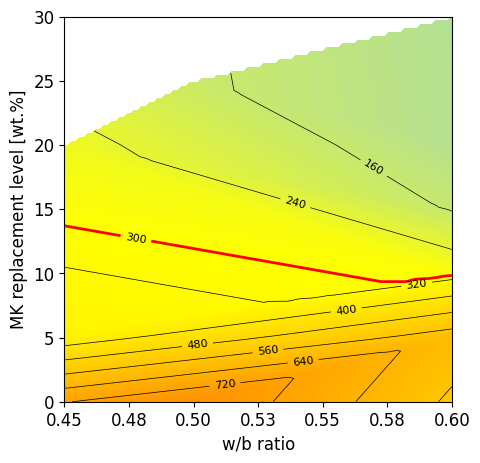

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap, BoundaryNorm
from scipy.interpolate import griddata
from matplotlib.ticker import FuncFormatter


# Data
data_final = {
    "PC Na2Oeq": [1.05, 1.1, 0.875, 1.15, 1.02, 0.82, 1.25, 1.25, 0.65, 1.25, 2.25, 0.65, 1.25, 2.25, 2.75, 1.09, 1.09, 1.09, 1.09, 0.62, 0.86, 1.09, 0.58, 1.18],
    "Replacement level (%)": [0, 0, 25, 0, 0, 20, 0, 0, 0, 0, 0, 5, 5, 5, 5, 5, 10, 15, 20, 30, 0, 0, 0, 0],
    "w/b ratio": [0.5, 0.5, 0.5, 0.5, 0.45, 0.45, 0.45, 0.5, 0.45, 0.45, 0.45, 0.45, 0.45, 0.45, 0.45, 0.6, 0.6, 0.6, 0.6, 0.6, 0.6, 0.6, 0.5, 0.5],
    "Na+K": [669, 797, 168, 891, 715, 261, 902, 879, 421, 809, 1347, 354, 706, 1152, 1312, 602, 290, 156, 117, 112, 547, 681, 533, 895]
}

# Create DataFrame
df_final = pd.DataFrame(data_final)

# Replace None with np.nan for better handling
df_final['w/b ratio'] = df_final['w/b ratio'].replace({None: np.nan})

# Grid for interpolation
xi = np.linspace(df_final['w/b ratio'].min(), df_final['w/b ratio'].max(), 100)
yi = np.linspace(df_final['Replacement level (%)'].min(), df_final['Replacement level (%)'].max(), 100)
xi, yi = np.meshgrid(xi, yi)

# Interpolate
zi = griddata((df_final['w/b ratio'], df_final['Replacement level (%)']), df_final['Na+K'], (xi, yi), method='linear')

# Create custom colormap
colors = [
    (0.0, '#87CEEB'),
    (300/1312, '#FFFF00'),
    (0.625, '#FF8C00'),
    (1.0, '#191970')
]
positions = [color[0] for color in colors]
color_values = [color[1] for color in colors]
cmap = LinearSegmentedColormap.from_list('custom_cmap', list(zip(positions, color_values)), N=1312)

# Define boundaries with smoother transitions
boundaries = np.linspace(0, 1312, 1313)  # 1312 color levels based on max Na+K value in the dataset
norm = BoundaryNorm(boundaries, ncolors=cmap.N, clip=True)

# Create contour plot
fig, ax = plt.subplots(figsize=(5, 5))

contour = ax.contourf(xi, yi, zi, levels=120, cmap=cmap, norm=norm)

# Add contour lines
contour_lines = ax.contour(xi, yi, zi, levels=10, colors='black', linewidths=0.5)
ax.clabel(contour_lines, inline=True, fontsize=8, fmt='%d')

# Highlight the 300 line in red
contour_300 = ax.contour(xi, yi, zi, levels=[300], colors='red', linewidths=2)
ax.clabel(contour_300, inline=True, fontsize=8, fmt='300', colors='black')

# # # Add color bar which maps values to colors
# cbar = fig.colorbar(contour, ax=ax, shrink=0.8, pad=0.07, aspect=20, extend='neither', format='%d')
# cbar.set_label('Na+K concentration [mmol/L]')
# cbar.set_ticks(np.linspace(df_final['Na+K'].min(), df_final['Na+K'].max(), 9))
# cbar.set_ticklabels(['{:.0f}'.format(i) for i in np.linspace(df_final['Na+K'].min(), df_final['Na+K'].max(), 9)])

# Format x-axis to show two decimal places
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f'{x:.2f}'))

# Add labels and title
ax.set_xlabel('w/b ratio')
ax.set_ylabel('MK replacement level [wt.%]')
ax.set_ylim(0, 30)
ax.set_xlim(0.45, 0.6)
plt.show()



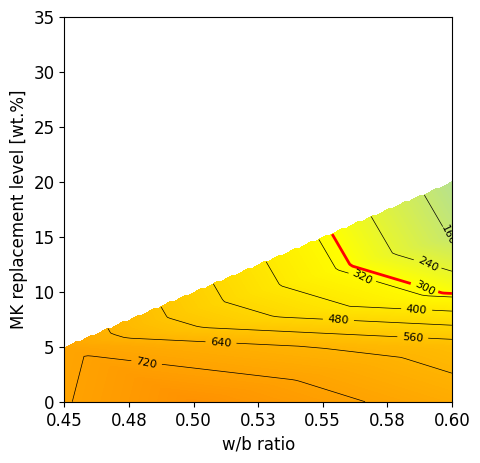

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap, BoundaryNorm
from scipy.interpolate import griddata
from matplotlib.ticker import FuncFormatter


# Data
data_final = {
    "PC Na2Oeq": [1.05, 1.1, 0.875, 1.15, 1.02, 0.82, 1.25, 1.25, 0.65, 1.25, 2.25, 0.65, 1.25, 2.25, 2.75, 1.09, 1.09, 1.09, 1.09, 0.62, 0.86, 1.09, 0.58, 1.18, 1.27, 1.66],
    "Replacement level (%)": [0, 0, 25, 0, 0, 20, 0, 0, 0, 0, 0, 5, 5, 5, 5, 5, 10, 15, 20, 30, 0, 0, 0, 0, 35, 35],
    "w/b ratio": [0.5, 0.5, 0.5, 0.5, 0.45, 0.45, 0.45, 0.5, 0.45, 0.45, 0.45, 0.45, 0.45, 0.45, 0.45, 0.6, 0.6, 0.6, 0.6, 0.6, 0.6, 0.6, 0.5, 0.5, 0.5, 0.5],
    "Na+K": [669, 797, 168, 891, 715, 261, 902, 879, 421, 809, 1347, 354, 706, 1152, 1312, 602, 290, 156, 117, 112, 547, 681, 533, 895, 315, 356]
}

# Create DataFrame
df_final = pd.DataFrame(data_final)

df_final = df[(df['PC Na2Oeq'] > 1) & (df['PC Na2Oeq'] <= 1.25)].copy()

# Replace None with np.nan for better handling
df_final['w/b ratio'] = df_final['w/b ratio'].replace({None: np.nan})

# Grid for interpolation
xi = np.linspace(df_final['w/b ratio'].min(), df_final['w/b ratio'].max(), 100)
yi = np.linspace(df_final['Replacement level (%)'].min(), df_final['Replacement level (%)'].max(), 100)
xi, yi = np.meshgrid(xi, yi)

# Interpolate
zi = griddata((df_final['w/b ratio'], df_final['Replacement level (%)']), df_final['Na+K'], (xi, yi), method='linear')

# Create custom colormap
colors = [
    (0.0, '#87CEEB'),
    (300/1312, '#FFFF00'),
    (0.625, '#FF8C00'),
    (1.0, '#191970')
]
positions = [color[0] for color in colors]
color_values = [color[1] for color in colors]
cmap = LinearSegmentedColormap.from_list('custom_cmap', list(zip(positions, color_values)), N=1312)

# Define boundaries with smoother transitions
boundaries = np.linspace(0, 1312, 1313)  # 1312 color levels based on max Na+K value in the dataset
norm = BoundaryNorm(boundaries, ncolors=cmap.N, clip=True)

# Create contour plot
fig, ax = plt.subplots(figsize=(5, 5))

contour = ax.contourf(xi, yi, zi, levels=120, cmap=cmap, norm=norm)

# Add contour lines
contour_lines = ax.contour(xi, yi, zi, levels=10, colors='black', linewidths=0.5)
ax.clabel(contour_lines, inline=True, fontsize=8, fmt='%d')

# Highlight the 300 line in red
contour_300 = ax.contour(xi, yi, zi, levels=[300], colors='red', linewidths=2)
ax.clabel(contour_300, inline=True, fontsize=8, fmt='300', colors='black')

# # Add color bar which maps values to colors
# cbar = fig.colorbar(contour, ax=ax, shrink=0.8, pad=0.07, aspect=20, extend='neither', format='%d')
# cbar.set_label('Na+K Concentration [mmol/L]')
# cbar.set_ticks(np.linspace(df_final['Na+K'].min(), df_final['Na+K'].max(), 9))
# cbar.set_ticklabels(['{:.0f}'.format(i) for i in np.linspace(df_final['Na+K'].min(), df_final['Na+K'].max(), 9)])

# Format x-axis to show two decimal places
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f'{x:.2f}'))

# Add labels and title
ax.set_xlabel('w/b ratio')
ax.set_ylabel('MK replacement level [wt.%]')
ax.set_ylim(0, 35)
ax.set_xlim(0.45, 0.6)
plt.show()



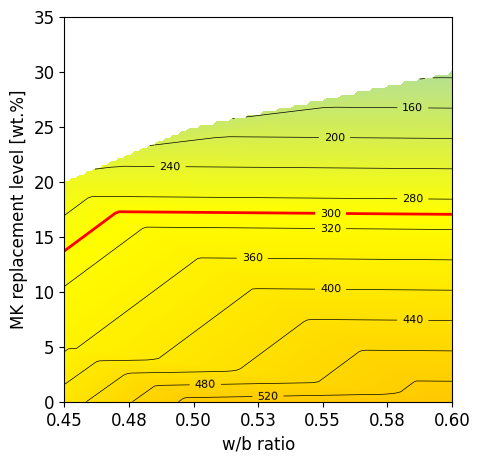

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap, BoundaryNorm
from scipy.interpolate import griddata
from matplotlib.ticker import FuncFormatter


# Data
data_final = {
    "PC Na2Oeq": [1.05, 1.1, 0.875, 1.15, 1.02, 0.82, 1.25, 1.25, 0.65, 1.25, 2.25, 0.65, 1.25, 2.25, 2.75, 1.09, 1.09, 1.09, 1.09, 0.62, 0.86, 1.09, 0.58, 1.18, 1.27, 1.66],
    "Replacement level (%)": [0, 0, 25, 0, 0, 20, 0, 0, 0, 0, 0, 5, 5, 5, 5, 5, 10, 15, 20, 30, 0, 0, 0, 0, 35, 35],
    "w/b ratio": [0.5, 0.5, 0.5, 0.5, 0.45, 0.45, 0.45, 0.5, 0.45, 0.45, 0.45, 0.45, 0.45, 0.45, 0.45, 0.6, 0.6, 0.6, 0.6, 0.6, 0.6, 0.6, 0.5, 0.5, 0.5, 0.5],
    "Na+K": [669, 797, 168, 891, 715, 261, 902, 879, 421, 809, 1347, 354, 706, 1152, 1312, 602, 290, 156, 117, 112, 547, 681, 533, 895, 315, 356]
}

# Create DataFrame
df_final = pd.DataFrame(data_final)

df_final = df[(df['PC Na2Oeq'] <= 1)].copy()

# Replace None with np.nan for better handling
df_final['w/b ratio'] = df_final['w/b ratio'].replace({None: np.nan})

# Grid for interpolation
xi = np.linspace(df_final['w/b ratio'].min(), df_final['w/b ratio'].max(), 100)
yi = np.linspace(df_final['Replacement level (%)'].min(), df_final['Replacement level (%)'].max(), 100)
xi, yi = np.meshgrid(xi, yi)

# Interpolate
zi = griddata((df_final['w/b ratio'], df_final['Replacement level (%)']), df_final['Na+K'], (xi, yi), method='linear')

# Create custom colormap
colors = [
    (0.0, '#87CEEB'),
    (300/1312, '#FFFF00'),
    (0.625, '#FF8C00'),
    (1.0, '#191970')
]
positions = [color[0] for color in colors]
color_values = [color[1] for color in colors]
cmap = LinearSegmentedColormap.from_list('custom_cmap', list(zip(positions, color_values)), N=1312)

# Define boundaries with smoother transitions
boundaries = np.linspace(0, 1312, 1313)  # 1312 color levels based on max Na+K value in the dataset
norm = BoundaryNorm(boundaries, ncolors=cmap.N, clip=True)

# Create contour plot
fig, ax = plt.subplots(figsize=(5, 5))

contour = ax.contourf(xi, yi, zi, levels=120, cmap=cmap, norm=norm)

# Add contour lines
contour_lines = ax.contour(xi, yi, zi, levels=10, colors='black', linewidths=0.5)
ax.clabel(contour_lines, inline=True, fontsize=8, fmt='%d')

# Highlight the 300 line in red
contour_300 = ax.contour(xi, yi, zi, levels=[300], colors='red', linewidths=2)
ax.clabel(contour_300, inline=True, fontsize=8, fmt='300', colors='black')

# # Add color bar which maps values to colors
# cbar = fig.colorbar(contour, ax=ax, shrink=0.8, pad=0.07, aspect=20, extend='neither', format='%d')
# cbar.set_label('Na+K Concentration [mmol/L]')
# cbar.set_ticks(np.linspace(df_final['Na+K'].min(), df_final['Na+K'].max(), 9))
# cbar.set_ticklabels(['{:.0f}'.format(i) for i in np.linspace(df_final['Na+K'].min(), df_final['Na+K'].max(), 9)])

# Format x-axis to show two decimal places
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f'{x:.2f}'))

# Add labels and title
ax.set_xlabel('w/b ratio')
ax.set_ylabel('MK replacement level [wt.%]')
ax.set_ylim(0, 35)
ax.set_xlim(0.45, 0.6)
plt.show()



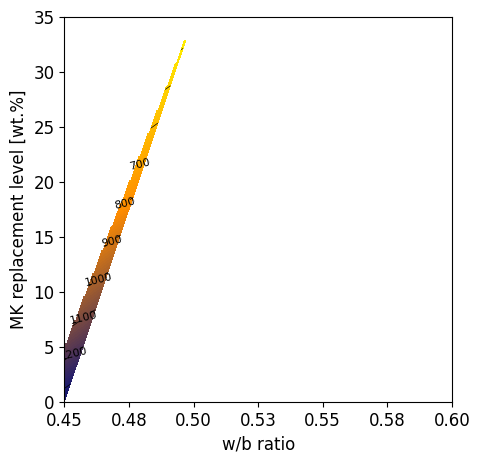

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap, BoundaryNorm
from scipy.interpolate import griddata
from matplotlib.ticker import FuncFormatter


# Data
data_final = {
    "PC Na2Oeq": [1.05, 1.1, 0.875, 1.15, 1.02, 0.82, 1.25, 1.25, 0.65, 1.25, 2.25, 0.65, 1.25, 2.25, 2.75, 1.09, 1.09, 1.09, 1.09, 0.62, 0.86, 1.09, 0.58, 1.18, 1.27, 1.66],
    "Replacement level (%)": [0, 0, 25, 0, 0, 20, 0, 0, 0, 0, 0, 5, 5, 5, 5, 5, 10, 15, 20, 30, 0, 0, 0, 0, 35, 35],
    "w/b ratio": [0.5, 0.5, 0.5, 0.5, 0.45, 0.45, 0.45, 0.5, 0.45, 0.45, 0.45, 0.45, 0.45, 0.45, 0.45, 0.6, 0.6, 0.6, 0.6, 0.6, 0.6, 0.6, 0.5, 0.5, 0.5, 0.5],
    "Na+K": [669, 797, 168, 891, 715, 261, 902, 879, 421, 809, 1347, 354, 706, 1152, 1312, 602, 290, 156, 117, 112, 547, 681, 533, 895, 315, 356]
}

# Create DataFrame
df_final = pd.DataFrame(data_final)

df_final = df[(df['PC Na2Oeq'] > 1.25)].copy()

# Replace None with np.nan for better handling
df_final['w/b ratio'] = df_final['w/b ratio'].replace({None: np.nan})

# Grid for interpolation
xi = np.linspace(df_final['w/b ratio'].min(), df_final['w/b ratio'].max(), 100)
yi = np.linspace(df_final['Replacement level (%)'].min(), df_final['Replacement level (%)'].max(), 100)
xi, yi = np.meshgrid(xi, yi)

# Interpolate
zi = griddata((df_final['w/b ratio'], df_final['Replacement level (%)']), df_final['Na+K'], (xi, yi), method='linear')

# Create custom colormap
colors = [
    (0.0, '#87CEEB'),
    (300/1312, '#FFFF00'),
    (0.625, '#FF8C00'),
    (1.0, '#191970')
]
positions = [color[0] for color in colors]
color_values = [color[1] for color in colors]
cmap = LinearSegmentedColormap.from_list('custom_cmap', list(zip(positions, color_values)), N=1312)

# Define boundaries with smoother transitions
boundaries = np.linspace(0, 1312, 1313)  # 1312 color levels based on max Na+K value in the dataset
norm = BoundaryNorm(boundaries, ncolors=cmap.N, clip=True)

# Create contour plot
fig, ax = plt.subplots(figsize=(5, 5))

contour = ax.contourf(xi, yi, zi, levels=120, cmap=cmap, norm=norm)

# Add contour lines
contour_lines = ax.contour(xi, yi, zi, levels=10, colors='black', linewidths=0.5)
ax.clabel(contour_lines, inline=True, fontsize=8, fmt='%d')

# Highlight the 300 line in red
contour_300 = ax.contour(xi, yi, zi, levels=[300], colors='red', linewidths=2)
ax.clabel(contour_300, inline=True, fontsize=8, fmt='300', colors='black')

# # Add color bar which maps values to colors
# cbar = fig.colorbar(contour, ax=ax, shrink=0.8, pad=0.07, aspect=20, extend='neither', format='%d')
# cbar.set_label('Na+K Concentration [mmol/L]')
# cbar.set_ticks(np.linspace(df_final['Na+K'].min(), df_final['Na+K'].max(), 9))
# cbar.set_ticklabels(['{:.0f}'.format(i) for i in np.linspace(df_final['Na+K'].min(), df_final['Na+K'].max(), 9)])

# Format x-axis to show two decimal places
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f'{x:.2f}'))

# Add labels and title
ax.set_xlabel('w/b ratio')
ax.set_ylabel('MK replacement level [wt.%]')
ax.set_ylim(0, 35)
ax.set_xlim(0.45, 0.6)
plt.show()

